# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100998.27887305  99723.88095634 101303.67223198 103092.61280875
  99532.83469866  99532.86737755 103208.50728239 101546.55324918
  99065.53858503 101090.91919622  99077.5383033   99072.95740148
 100485.04873236  96246.09556884  96609.32594441  98881.83582563
  97994.91492509 100630.41060507  98200.52092999  97215.18620668
 102974.38116142  99549.51030708 100135.13413065  97190.99577765
  98917.24782412 100222.06920894  97724.53133637 100754.1504107
  98806.02781904  99418.36888778  98803.91770933 103773.6459511
  99973.01189183  97907.00331514 101658.52873405  97588.11897026
 100418.55894768  96156.8490052

Omni_P_RQi ================== 0.09871310466515859
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101303.67223197628, 'S': 10000, 'W': 10000, 'P': 0.09871310466515859, 'dP': 0}, 'j': {'R': 99316.98273384465, 'S': 10000, 'W': 10000, 'P': 0.10068771447475974}, 'k': {'R': 99316.98273384465, 'S': 10000, 'W': 10000, 'P': 0.10068771447475974}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.09871310466515881
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101303.67223197628, 'S': 10000, 'W': 10000, 'P': 0.09871310466515881, 'dP': 0}, 'j': {'R': 99316.98273384465, 'S': 10000, 'W': 10000, 'P': 0.10068771447475998}, 'k': {'R': 99316.98273384465, 'S': 10000, 'W': 10000, 'P': 0.10068771447475998}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.09871310466515856
Initial Q HDX: 19999.99999999998
config_init_state  <

Omni_P_RQi ================== 0.10046935797896109
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99532.83469865563, 'S': 10000, 'W': 10000, 'P': 0.10046935797896109, 'dP': 0}, 'j': {'R': 99677.98042562776, 'S': 10000, 'W': 10000, 'P': 0.10032305989045638}, 'k': {'R': 99677.98042562776, 'S': 10000, 'W': 10000, 'P': 0.10032305989045638}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10046935797896124
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99532.83469865563, 'S': 10000, 'W': 10000, 'P': 0.10046935797896124, 'dP': 0}, 'j': {'R': 99677.98042562776, 'S': 10000, 'W': 10000, 'P': 0.10032305989045653}, 'k': {'R': 99677.98042562776, 'S': 10000, 'W': 10000, 'P': 0.10032305989045653}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10046935797896117
Initial Q HDX: 20000
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.0968912375860559
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103208.50728238752, 'S': 10000, 'W': 10000, 'P': 0.0968912375860559, 'dP': 0}, 'j': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.0962982589805424}, 'k': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.0962982589805424}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.09689123758605606
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103208.50728238752, 'S': 10000, 'W': 10000, 'P': 0.09689123758605606, 'dP': 0}, 'j': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054255}, 'k': {'R': 103844.03732595567, 'S': 10000, 'W': 10000, 'P': 0.09629825898054255}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09689123758605599
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.10094327596489393
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99065.53858503481, 'S': 10000, 'W': 10000, 'P': 0.10094327596489393, 'dP': 0}, 'j': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.09948627482205326}, 'k': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.09948627482205326}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10094327596489368
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99065.53858503481, 'S': 10000, 'W': 10000, 'P': 0.10094327596489368, 'dP': 0}, 'j': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.09948627482205301}, 'k': {'R': 100516.37794144546, 'S': 10000, 'W': 10000, 'P': 0.09948627482205301}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10094327596489383
Initial Q HDX: 20000.000000000015
config_init_state 

Omni_P_RQi ================== 0.10093105027890104
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99077.5383032989, 'S': 10000, 'W': 10000, 'P': 0.10093105027890104, 'dP': 0}, 'j': {'R': 96235.52751612084, 'S': 10000, 'W': 10000, 'P': 0.10391172842404651}, 'k': {'R': 96235.52751612084, 'S': 10000, 'W': 10000, 'P': 0.10391172842404651}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.100931050278901
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99077.5383032989, 'S': 10000, 'W': 10000, 'P': 0.100931050278901, 'dP': 0}, 'j': {'R': 96235.52751612084, 'S': 10000, 'W': 10000, 'P': 0.10391172842404646}, 'k': {'R': 96235.52751612084, 'S': 10000, 'W': 10000, 'P': 0.10391172842404646}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10093105027890104
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts

Omni_P_RQi ================== 0.09951729263360407
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100485.04873235802, 'S': 10000, 'W': 10000, 'P': 0.09951729263360407, 'dP': 0}, 'j': {'R': 100120.52094463907, 'S': 10000, 'W': 10000, 'P': 0.09987962413349276}, 'k': {'R': 100120.52094463907, 'S': 10000, 'W': 10000, 'P': 0.09987962413349276}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09951729263360373
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100485.04873235802, 'S': 10000, 'W': 10000, 'P': 0.09951729263360373, 'dP': 0}, 'j': {'R': 100120.52094463907, 'S': 10000, 'W': 10000, 'P': 0.09987962413349243}, 'k': {'R': 100120.52094463907, 'S': 10000, 'W': 10000, 'P': 0.09987962413349243}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09951729263360369
Initial Q HDX: 20000.0
config_init_state  <class

Omni_P_RQi ================== 0.10350967571964854
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96609.32594441288, 'S': 10000, 'W': 10000, 'P': 0.10350967571964854, 'dP': 0}, 'j': {'R': 99616.05549328652, 'S': 10000, 'W': 10000, 'P': 0.10038542432222627}, 'k': {'R': 99616.05549328652, 'S': 10000, 'W': 10000, 'P': 0.10038542432222627}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10350967571964848
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96609.32594441288, 'S': 10000, 'W': 10000, 'P': 0.10350967571964848, 'dP': 0}, 'j': {'R': 99616.05549328652, 'S': 10000, 'W': 10000, 'P': 0.1003854243222262}, 'k': {'R': 99616.05549328652, 'S': 10000, 'W': 10000, 'P': 0.1003854243222262}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10350967571964888
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts

Omni_P_RQi ================== 0.10204611134816374
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97994.91492509429, 'S': 10000, 'W': 10000, 'P': 0.10204611134816374, 'dP': 0}, 'j': {'R': 99930.60748918651, 'S': 10000, 'W': 10000, 'P': 0.10006944069745702}, 'k': {'R': 99930.60748918651, 'S': 10000, 'W': 10000, 'P': 0.10006944069745702}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.1020461113481637
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97994.91492509429, 'S': 10000, 'W': 10000, 'P': 0.1020461113481637, 'dP': 0}, 'j': {'R': 99930.60748918651, 'S': 10000, 'W': 10000, 'P': 0.10006944069745698}, 'k': {'R': 99930.60748918651, 'S': 10000, 'W': 10000, 'P': 0.10006944069745698}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10204611134816374
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.1018324536906358
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98200.52092999479, 'S': 10000, 'W': 10000, 'P': 0.1018324536906358, 'dP': 0}, 'j': {'R': 102311.73286339277, 'S': 10000, 'W': 10000, 'P': 0.09774050072392054}, 'k': {'R': 102311.73286339277, 'S': 10000, 'W': 10000, 'P': 0.09774050072392054}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10183245369063575
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98200.52092999479, 'S': 10000, 'W': 10000, 'P': 0.10183245369063575, 'dP': 0}, 'j': {'R': 102311.73286339277, 'S': 10000, 'W': 10000, 'P': 0.09774050072392047}, 'k': {'R': 102311.73286339277, 'S': 10000, 'W': 10000, 'P': 0.09774050072392047}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10183245369063612
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.09711153286101247
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102974.38116142353, 'S': 10000, 'W': 10000, 'P': 0.09711153286101247, 'dP': 0}, 'j': {'R': 101594.48408897384, 'S': 10000, 'W': 10000, 'P': 0.09843054069000695}, 'k': {'R': 101594.48408897384, 'S': 10000, 'W': 10000, 'P': 0.09843054069000695}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.09711153286101257
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102974.38116142353, 'S': 10000, 'W': 10000, 'P': 0.09711153286101257, 'dP': 0}, 'j': {'R': 101594.48408897384, 'S': 10000, 'W': 10000, 'P': 0.09843054069000705}, 'k': {'R': 101594.48408897384, 'S': 10000, 'W': 10000, 'P': 0.09843054069000705}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.1004525282862031
Initial Q HDX: 19999.999999999996
config_init_state

Omni_P_RQi ================== 0.09986504823524174
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100135.13413065275, 'S': 10000, 'W': 10000, 'P': 0.09986504823524174, 'dP': 0}, 'j': {'R': 102845.02743861543, 'S': 10000, 'W': 10000, 'P': 0.0972336752592991}, 'k': {'R': 102845.02743861543, 'S': 10000, 'W': 10000, 'P': 0.0972336752592991}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09986504823524141
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100135.13413065275, 'S': 10000, 'W': 10000, 'P': 0.09986504823524141, 'dP': 0}, 'j': {'R': 102845.02743861543, 'S': 10000, 'W': 10000, 'P': 0.09723367525929877}, 'k': {'R': 102845.02743861543, 'S': 10000, 'W': 10000, 'P': 0.09723367525929877}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09986504823524137
Initial Q HDX: 20000.0
config_init_state  <class '

Omni_P_RQi ================== 0.1010946040247746
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98917.24782412128, 'S': 10000, 'W': 10000, 'P': 0.1010946040247746, 'dP': 0}, 'j': {'R': 101180.51050906096, 'S': 10000, 'W': 10000, 'P': 0.09883326294449278}, 'k': {'R': 101180.51050906096, 'S': 10000, 'W': 10000, 'P': 0.09883326294449278}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10109460402477427
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98917.24782412128, 'S': 10000, 'W': 10000, 'P': 0.10109460402477427, 'dP': 0}, 'j': {'R': 101180.51050906096, 'S': 10000, 'W': 10000, 'P': 0.09883326294449245}, 'k': {'R': 101180.51050906096, 'S': 10000, 'W': 10000, 'P': 0.09883326294449245}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10109460402477422
Initial Q HDX: 20000.0
config_init_state  <class 'mo

Omni_P_RQi ================== 0.10232845185595812
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97724.53133637224, 'S': 10000, 'W': 10000, 'P': 0.10232845185595812, 'dP': 0}, 'j': {'R': 98038.61582900191, 'S': 10000, 'W': 10000, 'P': 0.10200062409532534}, 'k': {'R': 98038.61582900191, 'S': 10000, 'W': 10000, 'P': 0.10200062409532534}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10232845185595778
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97724.53133637224, 'S': 10000, 'W': 10000, 'P': 0.10232845185595778, 'dP': 0}, 'j': {'R': 98038.61582900191, 'S': 10000, 'W': 10000, 'P': 0.10200062409532501}, 'k': {'R': 98038.61582900191, 'S': 10000, 'W': 10000, 'P': 0.10200062409532501}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10232845185595774
Initial Q HDX: 20000.0
config_init_state  <class 'mode

Omni_P_RQi ================== 0.10120840014250121
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98806.02781903504, 'S': 10000, 'W': 10000, 'P': 0.10120840014250121, 'dP': 0}, 'j': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212266}, 'k': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212266}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10120840014250117
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98806.02781903504, 'S': 10000, 'W': 10000, 'P': 0.10120840014250117, 'dP': 0}, 'j': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212262}, 'k': {'R': 100199.48150436938, 'S': 10000, 'W': 10000, 'P': 0.09980091563212262}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10120840014250121
Initial Q HDX: 20000.00000000001
config_init_state  <class 'm

Omni_P_RQi ================== 0.10121056160363374
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98803.9177093254, 'S': 10000, 'W': 10000, 'P': 0.10121056160363374, 'dP': 0}, 'j': {'R': 96946.57155312526, 'S': 10000, 'W': 10000, 'P': 0.10314959920496196}, 'k': {'R': 96946.57155312526, 'S': 10000, 'W': 10000, 'P': 0.10314959920496196}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10121056160363341
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98803.9177093254, 'S': 10000, 'W': 10000, 'P': 0.10121056160363341, 'dP': 0}, 'j': {'R': 96946.57155312526, 'S': 10000, 'W': 10000, 'P': 0.10314959920496161}, 'k': {'R': 96946.57155312526, 'S': 10000, 'W': 10000, 'P': 0.10314959920496161}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10121056160363336
Initial Q HDX: 20000.0
config_init_state  <class 'model.

Omni_P_RQi ================== 0.10002699539371672
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99973.01189182972, 'S': 10000, 'W': 10000, 'P': 0.10002699539371672, 'dP': 0}, 'j': {'R': 97898.01131135032, 'S': 10000, 'W': 10000, 'P': 0.10214712092768155}, 'k': {'R': 97898.01131135032, 'S': 10000, 'W': 10000, 'P': 0.10214712092768155}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10002699539371639
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99973.01189182972, 'S': 10000, 'W': 10000, 'P': 0.10002699539371639, 'dP': 0}, 'j': {'R': 97898.01131135032, 'S': 10000, 'W': 10000, 'P': 0.1021471209276812}, 'k': {'R': 97898.01131135032, 'S': 10000, 'W': 10000, 'P': 0.1021471209276812}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10002699539371634
Initial Q HDX: 20000.0
config_init_state  <class 'model.

Omni_P_RQi ================== 0.09836852967015672
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101658.52873405126, 'S': 10000, 'W': 10000, 'P': 0.09836852967015672, 'dP': 0}, 'j': {'R': 98178.13568982246, 'S': 10000, 'W': 10000, 'P': 0.10185567213858432}, 'k': {'R': 98178.13568982246, 'S': 10000, 'W': 10000, 'P': 0.10185567213858432}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09836852967015709
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101658.52873405126, 'S': 10000, 'W': 10000, 'P': 0.09836852967015709, 'dP': 0}, 'j': {'R': 98178.13568982246, 'S': 10000, 'W': 10000, 'P': 0.10185567213858471}, 'k': {'R': 98178.13568982246, 'S': 10000, 'W': 10000, 'P': 0.10185567213858471}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09836852967015676
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.0995831856660078
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100418.55894768273, 'S': 10000, 'W': 10000, 'P': 0.0995831856660078, 'dP': 0}, 'j': {'R': 98445.85349377709, 'S': 10000, 'W': 10000, 'P': 0.10157868153006722}, 'k': {'R': 98445.85349377709, 'S': 10000, 'W': 10000, 'P': 0.10157868153006722}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09958318566600746
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100418.55894768273, 'S': 10000, 'W': 10000, 'P': 0.09958318566600746, 'dP': 0}, 'j': {'R': 98445.85349377709, 'S': 10000, 'W': 10000, 'P': 0.10157868153006687}, 'k': {'R': 98445.85349377709, 'S': 10000, 'W': 10000, 'P': 0.10157868153006687}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.0995831856660074
Initial Q HDX: 20000.0
config_init_state  <class 'model

Omni_P_RQi ================== 0.1026916954217008
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97378.8577443898, 'S': 10000, 'W': 10000, 'P': 0.1026916954217008, 'dP': 0}, 'j': {'R': 101640.17738243677, 'S': 10000, 'W': 10000, 'P': 0.09838629031877297}, 'k': {'R': 101640.17738243677, 'S': 10000, 'W': 10000, 'P': 0.09838629031877297}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10269169542170073
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97378.8577443898, 'S': 10000, 'W': 10000, 'P': 0.10269169542170073, 'dP': 0}, 'j': {'R': 101640.17738243677, 'S': 10000, 'W': 10000, 'P': 0.09838629031877291}, 'k': {'R': 101640.17738243677, 'S': 10000, 'W': 10000, 'P': 0.09838629031877291}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10269169542170112
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.par

Omni_P_RQi ================== 0.09853406549739625
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101487.74385305645, 'S': 10000, 'W': 10000, 'P': 0.09853406549739625, 'dP': 0}, 'j': {'R': 100455.91051104058, 'S': 10000, 'W': 10000, 'P': 0.09954615859960764}, 'k': {'R': 100455.91051104058, 'S': 10000, 'W': 10000, 'P': 0.09954615859960764}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09853406549739592
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101487.74385305645, 'S': 10000, 'W': 10000, 'P': 0.09853406549739592, 'dP': 0}, 'j': {'R': 100455.91051104058, 'S': 10000, 'W': 10000, 'P': 0.0995461585996073}, 'k': {'R': 100455.91051104058, 'S': 10000, 'W': 10000, 'P': 0.0995461585996073}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09853406549739588
Initial Q HDX: 20000.0
config_init_state  <class '

Omni_P_RQi ================== 0.10023154108344011
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99768.99379083939, 'S': 10000, 'W': 10000, 'P': 0.10023154108344011, 'dP': 0}, 'j': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017245}, 'k': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017245}}}
config_param a value =============  1
Omni_P_RQi ================== 0.1002315410834405
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99768.99379083939, 'S': 10000, 'W': 10000, 'P': 0.1002315410834405, 'dP': 0}, 'j': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017283}, 'k': {'R': 96836.47542679973, 'S': 10000, 'W': 10000, 'P': 0.10326687290017283}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10023154108344016
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts

config_param a value =============  0.92
Omni_P_RQi ================== 0.10300089416360249
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97086.5358131398, 'S': 10000, 'W': 10000, 'P': 0.10300089416360249, 'dP': 0}, 'j': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.09948163455149395}, 'k': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.09948163455149395}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10300089416360224
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97086.5358131398, 'S': 10000, 'W': 10000, 'P': 0.10300089416360224, 'dP': 0}, 'j': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.09948163455149371}, 'k': {'R': 100521.06647708717, 'S': 10000, 'W': 10000, 'P': 0.09948163455149371}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.1030008941636024
Initial Q HDX:

Omni_P_RQi ================== 0.10092544140556609
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99083.0444804823, 'S': 10000, 'W': 10000, 'P': 0.10092544140556609, 'dP': 0}, 'j': {'R': 97556.6900198242, 'S': 10000, 'W': 10000, 'P': 0.10250450274571582}, 'k': {'R': 97556.6900198242, 'S': 10000, 'W': 10000, 'P': 0.10250450274571582}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10092544140556584
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99083.0444804823, 'S': 10000, 'W': 10000, 'P': 0.10092544140556584, 'dP': 0}, 'j': {'R': 97556.6900198242, 'S': 10000, 'W': 10000, 'P': 0.10250450274571557}, 'k': {'R': 97556.6900198242, 'S': 10000, 'W': 10000, 'P': 0.10250450274571557}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.100925441405566
Initial Q HDX: 20000.000000000015
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09790815596908985
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102136.53705373706, 'S': 10000, 'W': 10000, 'P': 0.09790815596908985, 'dP': 0}, 'j': {'R': 97393.91107535169, 'S': 10000, 'W': 10000, 'P': 0.10267582325822418}, 'k': {'R': 97393.91107535169, 'S': 10000, 'W': 10000, 'P': 0.10267582325822418}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09931518772931554
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100689.53428608614, 'S': 10000, 'W': 10000, 'P': 0.09931518772931554, 'dP': 0}, 'j': {'R': 101049.24513848113, 'S': 10000, 'W': 10000, 'P': 0.09896164970154578}, 'k': {'R': 101049.24513848113, 'S': 10000, 'W': 10000, 'P': 0.09896164970154578}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09931518772931548
Initial Q HDX: 19999.999999999985
config_init_state 

Omni_P_RQi ================== 0.09935399252255213
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100650.20786889999, 'S': 10000, 'W': 10000, 'P': 0.09935399252255213, 'dP': 0}, 'j': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703898}, 'k': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703898}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09935399252255206
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100650.20786889999, 'S': 10000, 'W': 10000, 'P': 0.09935399252255206, 'dP': 0}, 'j': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703891}, 'k': {'R': 100502.19239309197, 'S': 10000, 'W': 10000, 'P': 0.09950031697703891}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09935399252255243
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10136291276645466
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98655.41278436342, 'S': 10000, 'W': 10000, 'P': 0.10136291276645466, 'dP': 0}, 'j': {'R': 98649.29158138024, 'S': 10000, 'W': 10000, 'P': 0.10136920235002962}, 'k': {'R': 98649.29158138024, 'S': 10000, 'W': 10000, 'P': 0.10136920235002962}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.1013629127664546
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98655.41278436342, 'S': 10000, 'W': 10000, 'P': 0.1013629127664546, 'dP': 0}, 'j': {'R': 98649.29158138024, 'S': 10000, 'W': 10000, 'P': 0.10136920235002955}, 'k': {'R': 98649.29158138024, 'S': 10000, 'W': 10000, 'P': 0.10136920235002955}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10136291276645498
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts

Omni_P_RQi ================== 0.09795931673203002
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102083.19467310328, 'S': 10000, 'W': 10000, 'P': 0.09795931673203002, 'dP': 0}, 'j': {'R': 100587.80719105592, 'S': 10000, 'W': 10000, 'P': 0.09941562779081227}, 'k': {'R': 100587.80719105592, 'S': 10000, 'W': 10000, 'P': 0.09941562779081227}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09795931673202997
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102083.19467310328, 'S': 10000, 'W': 10000, 'P': 0.09795931673202997, 'dP': 0}, 'j': {'R': 100587.80719105592, 'S': 10000, 'W': 10000, 'P': 0.09941562779081223}, 'k': {'R': 100587.80719105592, 'S': 10000, 'W': 10000, 'P': 0.09941562779081223}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09795931673203002
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.1016924292585139
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98335.73721185129, 'S': 10000, 'W': 10000, 'P': 0.1016924292585139, 'dP': 0}, 'j': {'R': 103801.65819109663, 'S': 10000, 'W': 10000, 'P': 0.09633757470030213}, 'k': {'R': 103801.65819109663, 'S': 10000, 'W': 10000, 'P': 0.09633757470030213}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10169242925851428
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98335.73721185129, 'S': 10000, 'W': 10000, 'P': 0.10169242925851428, 'dP': 0}, 'j': {'R': 103801.65819109663, 'S': 10000, 'W': 10000, 'P': 0.09633757470030249}, 'k': {'R': 103801.65819109663, 'S': 10000, 'W': 10000, 'P': 0.09633757470030249}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10169242925851395
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.09933972880854477
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100664.6597482944, 'S': 10000, 'W': 10000, 'P': 0.09933972880854477, 'dP': 0}, 'j': {'R': 97645.78559626229, 'S': 10000, 'W': 10000, 'P': 0.1024109738985272}, 'k': {'R': 97645.78559626229, 'S': 10000, 'W': 10000, 'P': 0.1024109738985272}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09933972880854515
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100664.6597482944, 'S': 10000, 'W': 10000, 'P': 0.09933972880854515, 'dP': 0}, 'j': {'R': 97645.78559626229, 'S': 10000, 'W': 10000, 'P': 0.10241097389852759}, 'k': {'R': 97645.78559626229, 'S': 10000, 'W': 10000, 'P': 0.10241097389852759}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09933972880854482
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts

Omni_P_RQi ================== 0.10096285860284807
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99046.32394905185, 'S': 10000, 'W': 10000, 'P': 0.10096285860284807, 'dP': 0}, 'j': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150864}, 'k': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150864}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.100962858602848
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99046.32394905185, 'S': 10000, 'W': 10000, 'P': 0.100962858602848, 'dP': 0}, 'j': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150857}, 'k': {'R': 98069.70501769216, 'S': 10000, 'W': 10000, 'P': 0.10196828876150857}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10096285860284838
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.a

Omni_P_RQi ================== 0.10223710487495577
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97811.84641555347, 'S': 10000, 'W': 10000, 'P': 0.10223710487495577, 'dP': 0}, 'j': {'R': 102344.00950410115, 'S': 10000, 'W': 10000, 'P': 0.09770967591023766}, 'k': {'R': 102344.00950410115, 'S': 10000, 'W': 10000, 'P': 0.09770967591023766}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.1022371048749557
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97811.84641555347, 'S': 10000, 'W': 10000, 'P': 0.1022371048749557, 'dP': 0}, 'j': {'R': 102344.00950410115, 'S': 10000, 'W': 10000, 'P': 0.09770967591023759}, 'k': {'R': 102344.00950410115, 'S': 10000, 'W': 10000, 'P': 0.09770967591023759}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10223710487495609
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.09838824093654952
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101638.16229267666, 'S': 10000, 'W': 10000, 'P': 0.09838824093654952, 'dP': 0}, 'j': {'R': 101945.23753917441, 'S': 10000, 'W': 10000, 'P': 0.09809187992874412}, 'k': {'R': 101945.23753917441, 'S': 10000, 'W': 10000, 'P': 0.09809187992874412}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.09838824093654974
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101638.16229267666, 'S': 10000, 'W': 10000, 'P': 0.09838824093654974, 'dP': 0}, 'j': {'R': 101945.23753917441, 'S': 10000, 'W': 10000, 'P': 0.09809187992874434}, 'k': {'R': 101945.23753917441, 'S': 10000, 'W': 10000, 'P': 0.09809187992874434}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.0983882409365495
Initial Q HDX: 19999.99999999998
config_init_state

Omni_P_RQi ================== 0.10014410958246216
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99856.09779440539, 'S': 10000, 'W': 10000, 'P': 0.10014410958246216, 'dP': 0}, 'j': {'R': 101657.54325364155, 'S': 10000, 'W': 10000, 'P': 0.0983694832664744}, 'k': {'R': 101657.54325364155, 'S': 10000, 'W': 10000, 'P': 0.0983694832664744}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10014410958246231
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99856.09779440539, 'S': 10000, 'W': 10000, 'P': 0.10014410958246231, 'dP': 0}, 'j': {'R': 101657.54325364155, 'S': 10000, 'W': 10000, 'P': 0.09836948326647456}, 'k': {'R': 101657.54325364155, 'S': 10000, 'W': 10000, 'P': 0.09836948326647456}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10014410958246224
Initial Q HDX: 20000
config_init_state  <class 'model

Omni_P_RQi ================== 0.09927940905802736
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100725.82114338681, 'S': 10000, 'W': 10000, 'P': 0.09927940905802736, 'dP': 0}, 'j': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.1004919332027434}, 'k': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.1004919332027434}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09927940905802773
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100725.82114338681, 'S': 10000, 'W': 10000, 'P': 0.09927940905802773, 'dP': 0}, 'j': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.10049193320274377}, 'k': {'R': 99510.474933594, 'S': 10000, 'W': 10000, 'P': 0.10049193320274377}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.0992794090580274
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_

Omni_P_RQi ================== 0.0992798863856433
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100725.33686386335, 'S': 10000, 'W': 10000, 'P': 0.0992798863856433, 'dP': 0}, 'j': {'R': 98236.87716117396, 'S': 10000, 'W': 10000, 'P': 0.10179476678186074}, 'k': {'R': 98236.87716117396, 'S': 10000, 'W': 10000, 'P': 0.10179476678186074}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09927988638564327
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100725.33686386335, 'S': 10000, 'W': 10000, 'P': 0.09927988638564327, 'dP': 0}, 'j': {'R': 98236.87716117396, 'S': 10000, 'W': 10000, 'P': 0.10179476678186068}, 'k': {'R': 98236.87716117396, 'S': 10000, 'W': 10000, 'P': 0.10179476678186068}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.0992798863856433
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.

Omni_P_RQi ================== 0.10007167058566363
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99928.38074427677, 'S': 10000, 'W': 10000, 'P': 0.10007167058566363, 'dP': 0}, 'j': {'R': 99845.93080680243, 'S': 10000, 'W': 10000, 'P': 0.10015430693264411}, 'k': {'R': 99845.93080680243, 'S': 10000, 'W': 10000, 'P': 0.10015430693264411}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.1000716705856633
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99928.38074427677, 'S': 10000, 'W': 10000, 'P': 0.1000716705856633, 'dP': 0}, 'j': {'R': 99845.93080680243, 'S': 10000, 'W': 10000, 'P': 0.10015430693264378}, 'k': {'R': 99845.93080680243, 'S': 10000, 'W': 10000, 'P': 0.10015430693264378}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10007167058566326
Initial Q HDX: 20000.0
config_init_state  <class 'model.

Omni_P_RQi ================== 0.10537862848121245
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 94895.9019881613, 'S': 10000, 'W': 10000, 'P': 0.10537862848121245, 'dP': 0}, 'j': {'R': 100554.85994974764, 'S': 10000, 'W': 10000, 'P': 0.09944820175770229}, 'k': {'R': 100554.85994974764, 'S': 10000, 'W': 10000, 'P': 0.09944820175770229}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10537862848121249
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 94895.9019881613, 'S': 10000, 'W': 10000, 'P': 0.10537862848121249, 'dP': 0}, 'j': {'R': 100554.85994974764, 'S': 10000, 'W': 10000, 'P': 0.09944820175770233}, 'k': {'R': 100554.85994974764, 'S': 10000, 'W': 10000, 'P': 0.09944820175770233}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10537862848121259
Initial Q HDX: 20000.000000000022
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09982607469482896
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100174.22833232975, 'S': 10000, 'W': 10000, 'P': 0.09982607469482896, 'dP': 0}, 'j': {'R': 100026.00456454151, 'S': 10000, 'W': 10000, 'P': 0.0999740021960742}, 'k': {'R': 100026.00456454151, 'S': 10000, 'W': 10000, 'P': 0.0999740021960742}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09982607469482933
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100174.22833232975, 'S': 10000, 'W': 10000, 'P': 0.09982607469482933, 'dP': 0}, 'j': {'R': 100026.00456454151, 'S': 10000, 'W': 10000, 'P': 0.09997400219607458}, 'k': {'R': 100026.00456454151, 'S': 10000, 'W': 10000, 'P': 0.09997400219607458}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.099826074694829
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.09981666505930097
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100183.67167505558, 'S': 10000, 'W': 10000, 'P': 0.09981666505930097, 'dP': 0}, 'j': {'R': 99472.13737046569, 'S': 10000, 'W': 10000, 'P': 0.10053066380545175}, 'k': {'R': 99472.13737046569, 'S': 10000, 'W': 10000, 'P': 0.10053066380545175}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09981666505930101
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100183.67167505558, 'S': 10000, 'W': 10000, 'P': 0.09981666505930101, 'dP': 0}, 'j': {'R': 99472.13737046569, 'S': 10000, 'W': 10000, 'P': 0.1005306638054518}, 'k': {'R': 99472.13737046569, 'S': 10000, 'W': 10000, 'P': 0.1005306638054518}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.0998166650593011
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.

Omni_P_RQi ================== 0.10044026618712838
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99561.66365956445, 'S': 10000, 'W': 10000, 'P': 0.10044026618712838, 'dP': 0}, 'j': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.0987565854932054}, 'k': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.0987565854932054}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10044026618712842
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99561.66365956445, 'S': 10000, 'W': 10000, 'P': 0.10044026618712842, 'dP': 0}, 'j': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.09875658549320544}, 'k': {'R': 101259.06996539503, 'S': 10000, 'W': 10000, 'P': 0.09875658549320544}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10044026618712852
Initial Q HDX: 20000.000000000022
config_init_state  <class 'mod

Omni_P_RQi ================== 0.097087755000201
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102999.60072183456, 'S': 10000, 'W': 10000, 'P': 0.097087755000201, 'dP': 0}, 'j': {'R': 97881.19793847756, 'S': 10000, 'W': 10000, 'P': 0.10216466707207057}, 'k': {'R': 97881.19793847756, 'S': 10000, 'W': 10000, 'P': 0.10216466707207057}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09708775500020105
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102999.60072183456, 'S': 10000, 'W': 10000, 'P': 0.09708775500020105, 'dP': 0}, 'j': {'R': 97881.19793847756, 'S': 10000, 'W': 10000, 'P': 0.10216466707207061}, 'k': {'R': 97881.19793847756, 'S': 10000, 'W': 10000, 'P': 0.10216466707207061}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.09708775500020113
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.10162996689498072
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98396.17492283059, 'S': 10000, 'W': 10000, 'P': 0.10162996689498072, 'dP': 0}, 'j': {'R': 99554.11613913682, 'S': 10000, 'W': 10000, 'P': 0.10044788088946524}, 'k': {'R': 99554.11613913682, 'S': 10000, 'W': 10000, 'P': 0.10044788088946524}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.1016299668949808
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98396.17492283059, 'S': 10000, 'W': 10000, 'P': 0.1016299668949808, 'dP': 0}, 'j': {'R': 99554.11613913682, 'S': 10000, 'W': 10000, 'P': 0.10044788088946532}, 'k': {'R': 99554.11613913682, 'S': 10000, 'W': 10000, 'P': 0.10044788088946532}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10100846483360228
Initial Q HDX: 19999.999999999996
config_init_state  <clas

config_param a value =============  1.06
Omni_P_RQi ================== 0.09818603289587677
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101847.47977958019, 'S': 10000, 'W': 10000, 'P': 0.09818603289587677, 'dP': 0}, 'j': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.0990580834657661}, 'k': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.0990580834657661}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.09818603289587687
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101847.47977958019, 'S': 10000, 'W': 10000, 'P': 0.09818603289587687, 'dP': 0}, 'j': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.0990580834657662}, 'k': {'R': 100950.87296390049, 'S': 10000, 'W': 10000, 'P': 0.0990580834657662}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09934471990209925
Initial Q HDX

Omni_P_RQi ================== 0.1010650461436182
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98946.17755172808, 'S': 10000, 'W': 10000, 'P': 0.1010650461436182, 'dP': 0}, 'j': {'R': 98320.83961602817, 'S': 10000, 'W': 10000, 'P': 0.10170783771836145}, 'k': {'R': 98320.83961602817, 'S': 10000, 'W': 10000, 'P': 0.10170783771836145}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10106504614361786
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98946.17755172808, 'S': 10000, 'W': 10000, 'P': 0.10106504614361786, 'dP': 0}, 'j': {'R': 98320.83961602817, 'S': 10000, 'W': 10000, 'P': 0.10170783771836112}, 'k': {'R': 98320.83961602817, 'S': 10000, 'W': 10000, 'P': 0.10170783771836112}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10106504614361782
Initial Q HDX: 20000.0
config_init_state  <class 'model.

Omni_P_RQi ================== 0.09980605263404774
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100194.32425272182, 'S': 10000, 'W': 10000, 'P': 0.09980605263404774, 'dP': 0}, 'j': {'R': 99111.03425438191, 'S': 10000, 'W': 10000, 'P': 0.10089693922811503}, 'k': {'R': 99111.03425438191, 'S': 10000, 'W': 10000, 'P': 0.10089693922811503}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09980605263404778
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100194.32425272182, 'S': 10000, 'W': 10000, 'P': 0.09980605263404778, 'dP': 0}, 'j': {'R': 99111.03425438191, 'S': 10000, 'W': 10000, 'P': 0.10089693922811507}, 'k': {'R': 99111.03425438191, 'S': 10000, 'W': 10000, 'P': 0.10089693922811507}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.09980605263404788
Initial Q HDX: 20000.000000000022
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10141386769292206
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98605.84383074398, 'S': 10000, 'W': 10000, 'P': 0.10141386769292206, 'dP': 0}, 'j': {'R': 100429.06252755571, 'S': 10000, 'W': 10000, 'P': 0.0995727705539042}, 'k': {'R': 100429.06252755571, 'S': 10000, 'W': 10000, 'P': 0.0995727705539042}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10141386769292214
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98605.84383074398, 'S': 10000, 'W': 10000, 'P': 0.10141386769292214, 'dP': 0}, 'j': {'R': 100429.06252755571, 'S': 10000, 'W': 10000, 'P': 0.0995727705539043}, 'k': {'R': 100429.06252755571, 'S': 10000, 'W': 10000, 'P': 0.0995727705539043}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10065741029203941
Initial Q HDX: 19999.999999999996
config_init_state  <cl

Omni_P_RQi ================== 0.1029699871170323
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97115.6769072363, 'S': 10000, 'W': 10000, 'P': 0.1029699871170323, 'dP': 0}, 'j': {'R': 100773.53414875803, 'S': 10000, 'W': 10000, 'P': 0.09923240347250674}, 'k': {'R': 100773.53414875803, 'S': 10000, 'W': 10000, 'P': 0.09923240347250674}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10296998711703254
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97115.6769072363, 'S': 10000, 'W': 10000, 'P': 0.10296998711703254, 'dP': 0}, 'j': {'R': 100773.53414875803, 'S': 10000, 'W': 10000, 'P': 0.09923240347250696}, 'k': {'R': 100773.53414875803, 'S': 10000, 'W': 10000, 'P': 0.09923240347250696}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10296998711703229
Initial Q HDX: 19999.99999999998
config_init_state  <cl

Omni_P_RQi ================== 0.09947930201164737
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100523.42344369458, 'S': 10000, 'W': 10000, 'P': 0.09947930201164737, 'dP': 0}, 'j': {'R': 100307.89249178552, 'S': 10000, 'W': 10000, 'P': 0.0996930525762859}, 'k': {'R': 100307.89249178552, 'S': 10000, 'W': 10000, 'P': 0.0996930525762859}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.0994793020116473
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100523.42344369458, 'S': 10000, 'W': 10000, 'P': 0.0994793020116473, 'dP': 0}, 'j': {'R': 100307.89249178552, 'S': 10000, 'W': 10000, 'P': 0.09969305257628583}, 'k': {'R': 100307.89249178552, 'S': 10000, 'W': 10000, 'P': 0.09969305257628583}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09947930201164767
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.10047022948466636
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99531.97132416411, 'S': 10000, 'W': 10000, 'P': 0.10047022948466636, 'dP': 0}, 'j': {'R': 97740.21245130735, 'S': 10000, 'W': 10000, 'P': 0.10231203461913739}, 'k': {'R': 97740.21245130735, 'S': 10000, 'W': 10000, 'P': 0.10231203461913739}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10047022948466675
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99531.97132416411, 'S': 10000, 'W': 10000, 'P': 0.10047022948466675, 'dP': 0}, 'j': {'R': 97740.21245130735, 'S': 10000, 'W': 10000, 'P': 0.10231203461913776}, 'k': {'R': 97740.21245130735, 'S': 10000, 'W': 10000, 'P': 0.10231203461913776}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.1004702294846664
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.part

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 11, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16,

addliq - Sq delta Sqaddliq - Sq delta Sq  addliq - Sq delta Sq 4563.697853858885
addliq - Sq delta S 4563.697853858885
POOL ADD LIQUIDITY Timestep ===  10 delta W  4566.818230380132
4339.32969420381
addliq - Sq delta S 4339.32969420381
POOL ADD LIQUIDITY Timestep ===  10 delta W  4346.852409650042
5333.679975144953 
addliq - Sq delta Saddliq - Sq delta Sq4713.279420921746  5333.679975144953
POOL ADD LIQUIDITY Timestep ===  10 delta W  5333.805003547977
addliq - Sq delta Sq4549.614414173392
addliq - Sq delta S 4549.614414173391
POOL ADD LIQUIDITY Timestep ===  10 delta W  4552.93706393066
addliq - Sq delta Sq 4691.214093248828
addliq - Sq delta S 4691.214093248828

addliq - Sq delta S 4713.279420921746
POOL ADD LIQUIDITY Timestep ===  10 delta W  4712.7238665118375
154950.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  4971.285122729728 154950.0 
delta S 155013.0POOL REMOVE LIQUIDITY Timestep ===   90 delta W  5137.98256299179 delta S  4950
POOL REMOVE LIQUIDITY share fraction of pool

154950.0  addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep === 5303.8747776782914935
POOL REMOVE LIQUIDITY share fraction of pool = 0.20141911335369955
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3235120522387966
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3235120522387966
154935.0
 

 
 addliq - Sq delta SPOOL REMOVE LIQUIDITY share fraction of reserve = 0.31448646939162294845.344705125022POOL REMOVE LIQUIDITY Timestep === 90 
 addliq - Sq delta SqPOOL REMOVE LIQUIDITY weight fraction of pool = 0.31448646939162294687.486301964239delta W 
 

 POOL ADD LIQUIDITY Timestep === 90154950.0 5012.824953085523155013.0 delta S  4935
POOL REMOVE LIQUIDITY share fraction of pool = 0.19702528910322722
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30733029422970287
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30733029422970287

154935.0 addliq - Sq delta S 
delta W 10 5303.87477767829 4687.48630196424
POOL ADD LIQUIDITY Timestep ===  10
 delta W  
5250.881399097118addliq -

addliq - Sq delta Sq4928.723804283396 delta W  154850.04613.404644802024POOL REMOVE LIQUIDITY share fraction of pool = 0.19794900603238583addliq - Sq delta S 
POOL REMOVE LIQUIDITY Timestep ===  4610.03462869707 
delta S  4935
POOL REMOVE LIQUIDITY share fraction of pool = 0.1985151595463499
addliq - Sq delta S 4610.034628697069
POOL ADD LIQUIDITY Timestep ===  10 delta W  4609.589225074262

POOL REMOVE LIQUIDITY share fraction of reserve = 0.297900986275041
POOL REMOVE LIQUIDITY weight fraction of pool = 0.297900986275041
155013.0
4559.1818003360035356.426874162393 90

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3048051031885031 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4612.930897295002

delta S addliq - Sq delta SqPOOL REMOVE LIQUIDITY weight fraction of pool = 0.3048051031885031
POOL ADD LIQUIDITY Timestep ===    155023.0154935.0
POOL REMOVE LIQUIDITY Timestep === 5315.855426755483 delta W 5023
POOL REMOVE LIQUIDITY share fraction of pool = 0.19998299428071864
POOL REMO

addliq - Sq delta S 4559.495858320056155023.0addliq - Sq delta Sq
POOL REMOVE LIQUIDITY Timestep ===  4752.2172960604985
POOL ADD LIQUIDITY Timestep ===  10 delta W  4562.85335590169
 90 delta W  5170.853758321071 delta S  5023
POOL REMOVE LIQUIDITY share fraction of pool = 0.20299644104318337
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3129232060892456
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3129232060892456

155023.0
addliq - Sq delta S155023.0 4752.2172960604985
POOL ADD LIQUIDITY Timestep ===  10 delta W  4752.025472983582

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === 155023.0 
 addliq - Sq delta Sqaddliq - Sq delta Sq4730.139847356052 90 delta W  5095.912829683395 delta S  5023
POOL REMOVE LIQUIDITY share fraction of pool = 0.20297119628900326
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32528239004067977
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32528239004067977
155023.0
 POOL REMOVE LIQUIDITY Timestep === 5315.956159965111
 90 4413.014

POOL REMOVE LIQUIDITY Timestep ===  5112.513742063712 POOL REMOVE LIQUIDITY Timestep ===   delta S 4650.842775460558 
154844.0 addliq - Sq delta S
90POOL REMOVE LIQUIDITY Timestep === 90addliq - Sq delta Sq 5047    
90delta W delta W 4759.494099512784
addliq - Sq delta S 4759.494099512784
POOL ADD LIQUIDITY Timestep ===  10 delta W  4759.43487330254
 4876.924683498318 delta S  4844
POOL REMOVE LIQUIDITY share fraction of pool = 0.19833715423307705
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3322319608142728
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3322319608142728
154844.0
 4650.842775460558
POOL ADD LIQUIDITY Timestep ===  10 delta W  4650.706434406959
delta W addliq - Sq delta Sq 4935.335821960369
addliq - Sq delta S 4935.335821960369
POOL ADD LIQUIDITY Timestep ===  10 delta W  154923.0154844.0
POOL REMOVE LIQUIDITY share fraction of pool = 0.203890996132541254933.456245516423

POOL REMOVE LIQUIDITY Timestep ===   POOL REMOVE LIQUIDITY Timestep ===  
90 delta W  493

5246.64305419319
154923.0POOL ADD LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5285.103778899081 delta S  4923
POOL REMOVE LIQUIDITY share fraction of pool = 0.1953007081560281
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2736288022537462
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2736288022537462
154923.0 10 delta W  5246.654604103358

154946.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5264.278174593389 delta S  4946
POOL REMOVE LIQUIDITY share fraction of pool = 0.19590723366204219
POOL REMOVE LIQUIDITY share fraction of reserve = 0.27759687032834085
POOL REMOVE LIQUIDITY weight fraction of pool = 0.27759687032834085
154946.0
addliq - Sq delta Sq 4681.632730157509
addliq - Sq delta S 4681.63273015751
POOL ADD LIQUIDITY Timestep ===  10 delta W  4681.3908258638885
addliq - Sq delta Sqaddliq - Sq delta Sq 4872.069631742862
addliq - Sq delta S 4872.069631742862
POOL ADD LIQUIDITY Timestep ===  10 delta W  4870.0491929439295
addliq - Sq delt

addliq - Sq delta Sq 5338.278614588478
addliq - Sq delta S 5338.278614588479
POOL ADD LIQUIDITY Timestep ===  10 delta W  5338.0715262957765
 5363.566398476814
addliq - Sq delta S addliq - Sq delta Sq5363.566398476814addliq - Sq delta Sq  5335.191688734905

4860.90814751492addliq - Sq delta S 
POOL ADD LIQUIDITY Timestep === 5335.191688734905
POOL ADD LIQUIDITY Timestep ===  10 delta W  5334.954344722524
154946.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5147.482896604891 delta S  4946
POOL REMOVE LIQUIDITY share fraction of pool = 0.19887929934468154
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29681169995841816
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29681169995841816
addliq - Sq delta S  4860.90814751492
POOL ADD LIQUIDITY Timestep ===  10 delta W  4858.923686641542
154946.0
10 155046.0
POOL REMOVE LIQUIDITY Timestep ===  delta W 90 delta W   5399.7484375556625363.622914477285
 delta S  5046
POOL REMOVE LIQUIDITY share fraction of pool = 0.2006845438318708
POO

POOL REMOVE LIQUIDITY share fraction of pool = 0.2036768182215925POOL ADD LIQUIDITY Timestep === 
155046.0
addliq - Sq delta Sq 5291.565029552179
addliq - Sq delta S 5291.565029552179
POOL ADD LIQUIDITY Timestep ===  10 delta W  5289.353608335862

POOL REMOVE LIQUIDITY share fraction of reserve = 0.31393594097037014
 10 delta W  5280.761509300901
 delta W  4537.456508523716
addliq - Sq delta S 5275.142656578745
POOL ADD LIQUIDITY Timestep ===  10 delta W 4869.938958646392 POOL REMOVE LIQUIDITY weight fraction of pool = 0.31393594097037014
addliq - Sq delta S 4869.938958646391
POOL ADD LIQUIDITY Timestep ===  10 delta W  4870.305350044897
154975.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5027.3368191501125275.1028357365485

155046.0
155195.0 
delta S  4975
POOL REMOVE LIQUIDITY share fraction of pool = 0.19832776689265036
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3135434738119475
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3135434738119475
154975.0
addliq - Sq del

4945.012837037344
addliq - Sq delta S 4945.012837037344
POOL ADD LIQUIDITY Timestep ===  10
delta W delta W  5454.8045452088 delta S  5195
POOL REMOVE LIQUIDITY share fraction of pool = 0.20708985702042312
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30361753286347903
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30361753286347903
155195.0
addliq - Sq delta Sq 5065.683167629941 4690.467643081052

155175.0addliq - Sq delta Saddliq - Sq delta Sq 155195.0  5065.683167629941

POOL REMOVE LIQUIDITY Timestep ===  
POOL ADD LIQUIDITY Timestep ===  10 delta W  5063.599628453563
delta W 5158.74266849601690155175.0 addliq - Sq delta Sq4943.059882243966

  delta W POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5345.255744039993 delta S  5175
POOL REMOVE LIQUIDITY share fraction of pool = 0.2049168433694103
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3070936194380468
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3070936194380468
155175.0

155195.0
POOL REMOVE LIQUIDITY Time

addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of pool = 0.19947094983662106 POOL REMOVE LIQUIDITY share fraction of pool = 0.20094140694224186 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2922816945358818
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2922816945358818
155056.0
4525.307620705631
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2920902082317804
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2920902082317804
155056.05011.573571264267


155056.0addliq - Sq delta Saddliq - Sq delta S 5011.573571264267
POOL ADD LIQUIDITY Timestep ===  10 delta W  5009.486406175647
 addliq - Sq delta Sq4525.307620705632
 155102.0

4763.74353316191POOL ADD LIQUIDITY Timestep ===  10 delta W  4528.303437717093
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5286.78419765947 delta S  5056POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5294.698774138975 delta S  5102
POOL REMOVE LIQUIDITY share fraction of pool = 0.20098987295052329
POOL REMOVE LIQUIDITY share fraction

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3084183327666684155091.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5173.546018592524 delta S POOL REMOVE LIQUIDITY weight fraction of pool = 0.3084183327666684
154968.0
 5091
POOL REMOVE LIQUIDITY share fraction of pool = 0.20533175958150823
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32748032815537714
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32748032815537714
155091.0
addliq - Sq delta Sq 4793.6421167481285
addliq - Sq delta S 4793.6421167481285
POOL ADD LIQUIDITY Timestep ===  10 addliq - Sq delta Sq 5778.37427351181
addliq - Sq delta S 5778.374273511809
POOL ADD LIQUIDITY Timestep ===  10 delta W  5788.629895408971
delta W  4793.710780688868
addliq - Sq delta Sq 4975.138990332423
addliq - Sq delta S 4975.1389903324225
POOL ADD LIQUIDITY Timestep ===  10 delta W  4973.22557174553
addliq - Sq delta Sqaddliq - Sq delta Sq155091.0addliq - Sq delta Sq
 4646.607264729092POOL REMOVE LIQUIDITY Timestep === 155091.0


905143155143.0 154855.0


  delta S 
POOL REMOVE LIQUIDITY Timestep === 5143POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.21018495750614422 delta W  
 5071.534724656651 delta S  5091
POOL REMOVE LIQUIDITY share fraction of pool = 0.20362775052002305
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3426951739791688
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3426951739791688
155091.0POOL REMOVE LIQUIDITY share fraction of pool = 0.20379749219544374
4855
POOL REMOVE LIQUIDITY share fraction of reserve = 0.309983126272492 90 delta W  4849.401844872114 

POOL REMOVE LIQUIDITY Timestep === 
90addliq - Sq delta Sq 5381.318815524682
addliq - Sq delta S 5381.318815524682
POOL ADD LIQUIDITY Timestep ===  10 delta W  5381.039299920843
POOL REMOVE LIQUIDITY weight fraction of pool = 0.309983126272492 
90 POOL REMOVE LIQUIDITY share fraction of pool = 0.1944403279401772155143.0
delta S POOL REMOVE LIQUIDITY share fraction of reserve = 0.33149624270701

POOL REMOVE LIQUIDITY share fraction of pool = 0.19908454184185467 POOL REMOVE LIQUIDITY Timestep === delta W 155143.0  addliq - Sq delta S 4532.052702818394
POOL ADD LIQUIDITY Timestep ===  10 delta W  4535.424568783277

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5395.212011085866 delta S  5143
POOL REMOVE LIQUIDITY share fraction of pool = 0.20545220329275485155022.0 

5211.292704470005 delta S  5022
90 delta W  5080.675838401119 delta S  POOL REMOVE LIQUIDITY share fraction of reserve = 0.3087397032598962
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3087397032598962
154993.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30184092258436584485590
154993.0POOL REMOVE LIQUIDITY Timestep === 
  POOL REMOVE LIQUIDITY weight fraction of pool = 0.30184092258436584
155143.0
delta W 
90 delta W  addliq - Sq delta Sq addliq - Sq delta Sq5269.655959149504 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19979717909229922
POOL REMOVE LIQUIDITY share fraction of reserve = 0.296933

addliq - Sq delta Sq
delta S 
  addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep === 
4757.786097020412addliq - Sq delta S 5144 499390 delta W  5347.915370753135 4952.637155730651POOL REMOVE LIQUIDITY Timestep === 155054.0
 


delta S  
addliq - Sq delta S 4757.786097020412
POOL ADD LIQUIDITY Timestep ===  10 delta W  4757.831596671114
POOL REMOVE LIQUIDITY share fraction of pool = 0.20343929912033762POOL REMOVE LIQUIDITY share fraction of pool = 0.2020274684201947 904661.51362288036POOL ADD LIQUIDITY Timestep === 
POOL ADD LIQUIDITY Timestep === 

5144 POOL REMOVE LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY share fraction of reserve = 0.28506482181361725delta W  10 POOL REMOVE LIQUIDITY share fraction of reserve = 0.3051143416258886390  10

 delta W  5116.21626521483 delta S  5054
POOL REMOVE LIQUIDITY share fraction of pool = 0.20258918563808756
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3227116389301791
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3227116389301791
1

POOL ADD LIQUIDITY Timestep ===  10 delta W  4841.456463561265
155054.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32164755137946816 155054.0POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === 
5339.108622609193
POOL REMOVE LIQUIDITY Timestep === 
 90 
90 POOL REMOVE LIQUIDITY Timestep ===  90  155116.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5452.423830014614 delta S  5116
POOL REMOVE LIQUIDITY share fraction of pool = 0.20129169070251424
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28412145109448067
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28412145109448067
POOL ADD LIQUIDITY Timestep === delta W  5120.413896418911 delta S  5054delta W  5249.310009268698 delta S  4988

POOL REMOVE LIQUIDITY share fraction of pool = 0.2023567919521178
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32114769430096596
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32114769430096596
155054.0155116.0
delta W  5159.7863135040825 delta S  5054
POOL REM

POOL REMOVE LIQUIDITY Timestep === 155116.0 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5455.112398400365 delta S 90 delta W  5279.117741713234 154962.0 delta S 5116
POOL REMOVE LIQUIDITY share fraction of pool = 0.2013666681689022
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28407103397787553
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28407103397787553
155116.0
 
5116
POOL REMOVE LIQUIDITY share fraction of pool = 0.20611658437860322
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3156493145020503
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3156493145020503
155116.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5052.121897068255 delta S  4962
POOL REMOVE LIQUIDITY share fraction of pool = 0.19486962190384757
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2956777846992741
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2956777846992741
154962.0
addliq - Sq delta Sq 5066.767835215878
addliq - Sq delta S 5066.767835215878
POOL ADD LIQUIDITY Timestep 

addliq - Sq delta Sq154962.0addliq - Sq delta Sq 4961.267251472217
addliq - Sq delta S 4961.267251472216
POOL ADD LIQUIDITY Timestep ===  10 delta W  4959.251464565772
 
 
addliq - Sq delta Sq90addliq - Sq delta S 4792.4566397831095
POOL ADD LIQUIDITY Timestep ===  10 delta W  4792.099237117927
  
4955.847389892476addliq - Sq delta Sq
delta W  5266.320973081476 addliq - Sq delta Sdelta S  4740.009657062008 5060
POOL REMOVE LIQUIDITY share fraction of pool = 0.20412777742695237
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30692673738048254
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30692673738048254
155060.0addliq - Sq delta S 
5248.325250988041addliq - Sq delta S
addliq - Sq delta S 5248.325250988041
POOL ADD LIQUIDITY Timestep ===  10 delta W  5248.1676001976575
5251.300958587404
POOL ADD LIQUIDITY Timestep ===  10 delta W  5251.17275009421
 4740.009657062008
POOL ADD LIQUIDITY Timestep ===  10 delta W  4739.930179108067
 
4955.847389892475addliq - Sq delta Sq155060.0
PO

5060addliq - Sq delta SqPOOL ADD LIQUIDITY Timestep ===  10 delta W  5524.90888392201

addliq - Sq delta Sq 154818.0  4941.187627265909
addliq - Sq delta S 4941.187627265908
POOL ADD LIQUIDITY Timestep ===  10 delta W  4939.031124401369
155001.0
5103.605141535317
5379.372218914421 155001.0POOL REMOVE LIQUIDITY share fraction of pool = 0.20421602734167446
POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep === 155001.0
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.3018096202065863delta S  5060
POOL REMOVE LIQUIDITY share fraction of pool = 0.20096754534075906
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31865550982076185
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31865550982076185
155060.0
POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  
addliq - Sq delta S POOL REMOVE LIQUIDITY weight fraction of pool = 0.301809620206586390  9090
905379.372218914421  delta W  addliq - Sq delta Sq 155060.0delta W  5259.114490094156 delta S  500

 POOL REMOVE LIQUIDITY share fraction of reserve = 0.303346136842057
4818
155060.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.2752219438315605 155106.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.303346136842057POOL REMOVE LIQUIDITY Timestep === 


 90 delta W  5254.508209390174 delta S  5106
POOL REMOVE LIQUIDITY share fraction of pool = 0.20267943080873768
POOL REMOVE LIQUIDITY share fraction of reserve = 0.306377281130619
POOL REMOVE LIQUIDITY weight fraction of pool = 0.306377281130619
155106.0POOL REMOVE LIQUIDITY share fraction of pool = 0.19608930807404037


POOL REMOVE LIQUIDITY share fraction of reserve = 0.30988398370187074929.4699141037145155060.0

154818.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.3098839837018707
154818.0

addliq - Sq delta S 4929.469914103714
POOL ADD LIQUIDITY Timestep ===  10 delta W  4927.62297112386
addliq - Sq delta Sq
addliq - Sq delta Sq 4929.557408707274
addliq - Sq delta S 4929.557408707274
POOL ADD LIQUIDITY Timestep ===  10 d

delta W  5003.54123680289
154918.0
POOL REMOVE LIQUIDITY Timestep ===  90155123.0
 delta W  5067.62868146343 delta S  4918
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5270.778826295268 delta S  5123
POOL REMOVE LIQUIDITY share fraction of pool = 0.2047234982205897
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3126135482759877
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3126135482759877
155123.0POOL REMOVE LIQUIDITY share fraction of pool = 0.19498062389656728
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2916581563926236154918.0addliq - Sq delta Sq

POOL REMOVE LIQUIDITY Timestep ===  4644.385036961753 POOL REMOVE LIQUIDITY weight fraction of pool = 0.2916581563926236
90
addliq - Sq delta S
 154918.0
4644.385036961753155106.0
155106.0 POOL REMOVE LIQUIDITY Timestep ===  
155123.0

POOL REMOVE LIQUIDITY Timestep ===  90delta W 90 delta W   POOL REMOVE LIQUIDITY Timestep === delta W  4975.952218119935POOL ADD LIQUIDITY Timestep ===   addliq - Sq delta Sq90addliq - S

155123.0154979.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5299.638689328076 delta S  4979
POOL REMOVE LIQUIDITY share fraction of pool = 0.2045117827639228
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29971524046020415
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29971524046020415
154979.0

POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq90  5093.410609584103delta W  5070.724650417342 delta S  5123
POOL REMOVE LIQUIDITY share fraction of pool = 0.20474793786183776
POOL REMOVE LIQUIDITY share fraction of reserve = 0.35588149208673614

POOL REMOVE LIQUIDITY weight fraction of pool = 0.35588149208673614
155123.0
addliq - Sq delta S addliq - Sq delta Sq5093.410609584103
 5212.84187721627POOL ADD LIQUIDITY Timestep ===  10 delta W  
addliq - Sq delta S5091.380589384194
 5212.841877216271
POOL ADD LIQUIDITY Timestep ===  10 delta W  5210.673783638953
154979.0155123.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5203.787808754966 delta S  5123
POOL REMOVE LIQUIDI

addliq - Sq delta Sq addliq - Sq delta Sq 5831.481940447475
addliq - Sq delta S 5831.481940447476
POOL ADD LIQUIDITY Timestep ===  10 delta W  5841.957286336218
5042.278877965556
addliq - Sq delta S 5042.278877965555
POOL ADD LIQUIDITY Timestep ===  10 delta W  5040.219886316907
155134.0155199.0154979.0
154979.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5108.036043991842 delta S  4979
POOL REMOVE LIQUIDITY share fraction of pool = 0.20010663572227788

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5317.149122325594POOL REMOVE LIQUIDITY share fraction of reserve = 0.30794213288847916POOL REMOVE LIQUIDITY Timestep ===  90

 POOL REMOVE LIQUIDITY weight fraction of pool = 0.30794213288847916 
delta W 154979.0
delta S 154980.0 POOL REMOVE LIQUIDITY Timestep ===  
addliq - Sq delta Sq5327.109381671653POOL REMOVE LIQUIDITY Timestep ===  90 5134  
addliq - Sq delta Sqdelta W  5133.122473010116 delta S  4979
POOL REMOVE LIQUIDITY share fraction of pool = 0.19686656313223955
POOL REMOVE 

5097.7508201308665  delta S 154926.010 delta W  4845.156981131871

 delta S  4982
POOL REMOVE LIQUIDITY share fraction of pool = 0.20155026520725747
154982.0
 POOL REMOVE LIQUIDITY Timestep === 
4980
POOL REMOVE LIQUIDITY share fraction of pool = 0.20129048172506428
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3036975499120981
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3036975499120981
154980.0POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of reserve = 0.31544443877956635
 addliq - Sq delta Sq90
 POOL REMOVE LIQUIDITY weight fraction of pool = 0.31544443877956635
154982.0  90 delta W  5022.287532767155 delta S  4982
POOL REMOVE LIQUIDITY share fraction of pool = 0.19705752817197308
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3098824400650312
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3098824400650312
154982.0
addliq - Sq delta Sq 5478.863244848335
addliq - Sq delta S 5478.863244848336
POOL ADD LIQUIDITY Timestep ===  10 delta W  548

 delta W  5244.023097953929 delta S  4926
POOL REMOVE LIQUIDITY share fraction of pool = 0.1967518153020276
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28060180072286206
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28060180072286206
154926.0
4385.110581613395addliq - Sq delta Sq 4948.554931579828
5132.344769496291addliq - Sq delta Sq 4663.761221564173
addliq - Sq delta Saddliq - Sq delta Sqaddliq - Sq delta S
addliq - Sq delta S 4663.761221564172
POOL ADD LIQUIDITY Timestep ===  10 delta W  4663.532993798298
  4385.110581613395
addliq - Sq delta S4948.554931579828
POOL ADD LIQUIDITY Timestep ===  10 delta W   155011.04946.506304039591

154982.0POOL ADD LIQUIDITY Timestep === 155011.0
4951.283288781137
addliq - Sq delta S 4951.283288781137
POOL ADD LIQUIDITY Timestep ===  10 delta W  4949.225767711785

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  5132.344769496291
POOL ADD LIQUIDITY Timestep ===  10 delta W  5130.274532573381
  90 delta W  5034.659

 5011905235.299554245375addliq - Sq delta S 155150.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5435.220674077239 delta S  5150
POOL REMOVE LIQUIDITY share fraction of pool = 0.20557855416052193
 
addliq - Sq delta S 5235.299554245375
POOL ADD LIQUIDITY Timestep ===  10 
POOL REMOVE LIQUIDITY share fraction of pool = 0.20106508361732675
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28557943776329164
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28557943776329164
155011.0delta W POOL REMOVE LIQUIDITY share fraction of reserve = 0.29876822348483406
delta W delta W   4736.9307296998795  
POOL REMOVE LIQUIDITY weight fraction of pool = 0.298768223484834065157.594825393102 delta S  5030
POOL REMOVE LIQUIDITY share fraction of pool = 0.2047344315138418
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3221544604657399
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3221544604657399
155030.0

155150.05233.046004609945155150.0
5183.89259880217


POOL REMOVE LIQUIDITY Timeste

155072.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5174.072230488212 delta S  5072
POOL REMOVE LIQUIDITY share fraction of pool = 0.20613789114228873
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32902183216623454
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32902183216623454
155072.0
addliq - Sq delta Sq addliq - Sq delta Sq 4947.364732937588
addliq - Sq delta S 4947.364732937588
POOL ADD LIQUIDITY Timestep ===  10 delta W  4945.286382099399
4599.28605341745addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq 5410.742563496637
addliq - Sq delta S 5410.742563496637
POOL ADD LIQUIDITY Timestep ===  10 delta W  5415.4727966872015
 4413.064484648198
addliq - Sq delta S 4413.064484648198
POOL ADD LIQUIDITY Timestep ===  10 delta W  4421.022514351574
  
addliq - Sq delta Sq 5018.646702382128
addliq - Sq delta S4778.474802076497
addliq - Sq delta S 4778.474802076497
POOL ADD LIQUIDITY Timestep ===  10 delta W  4778.14201473423
 5348.40890792545850

addliq - Sq delta Sq5491.211093106054  5146.386816576837delta W  5012.568980828633 
delta S  addliq - Sq delta Saddliq - Sq delta Sq 5360.472604785198
addliq - Sq delta S 5360.472604785198
POOL ADD LIQUIDITY Timestep ===  10 delta W  5360.199786361845
 delta S 155072.0 5146.386816576837154965.0154895.0
5046
POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5377.793308046804 delta S  5072
POOL REMOVE LIQUIDITY share fraction of pool = 0.20163289121049763
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28908574465459375
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28908574465459375
155072.0POOL ADD LIQUIDITY Timestep ===   90 delta W  5103.702611946856 delta S  4895
POOL REMOVE LIQUIDITY share fraction of pool = 0.19719969103350007

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5016.958889637493 delta S  4965
POOL REMOVE LIQUIDITY share fraction of pool = 0.1996279512886464
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3200876912161732
P

  delta S  4895
POOL REMOVE LIQUIDITY share fraction of pool = 0.1954955191731027
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2785243094503895
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2785243094503895
154895.0
addliq - Sq delta Sq10POOL REMOVE LIQUIDITY weight fraction of pool = 0.296981334860072 addliq - Sq delta Sq 5083.913340112624 addliq - Sq delta Sq
delta W 154965.0  
4874.824246683336
addliq - Sq delta S 4889.6248951294265155179.0POOL REMOVE LIQUIDITY Timestep === 5063.054462151354
4351.507647520503

 90 delta W  5196.739482522962 delta S  4965
POOL REMOVE LIQUIDITY share fraction of pool = 0.19656074091496392
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2857823241746028
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2857823241746028
154965.0 155046.05083.913340112624
POOL ADD LIQUIDITY Timestep ===  10 delta W  5081.936782024553
addliq - Sq delta Saddliq - Sq delta S
addliq - Sq delta S 4351.507647520504
POOL ADD LIQUIDITY Timestep ===  10 delta W  43

 155179.0POOL REMOVE LIQUIDITY Timestep === delta S delta S  4967
POOL REMOVE LIQUIDITY share fraction of pool = 0.1994965006737447
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32375063237307067
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32375063237307067
155038.0

154967.0 90 delta W  5223.250328753348 delta S  5068
POOL REMOVE LIQUIDITY share fraction of pool = 0.2013244001976193
POOL REMOVE LIQUIDITY share fraction of reserve = 0.303196583785119
POOL REMOVE LIQUIDITY weight fraction of pool = 0.303196583785119
155068.0
POOL REMOVE LIQUIDITY Timestep ===  154967.05038POOL REMOVE LIQUIDITY Timestep === 


POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 90 POOL REMOVE LIQUIDITY share fraction of pool = 0.20036176982978945addliq - Sq delta Sq 4697.986649822838
addliq - Sq delta S  5354.758317537699
addliq - Sq delta S 5354.7583175377
POOL ADD LIQUIDITY Timestep ===  10 delta W  5354.476011663826
90 
904697.986649822839  
POOL ADD LIQUIDITY Timestep ===  10 delta W 

4580.257476405364155068.0155068.0154939.0


154939.0POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq
 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5323.097822598045 delta S  5068
POOL REMOVE LIQUIDITY share fraction of pool = 0.2043111023359763
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30166739541948484
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30166739541948484
155068.0
addliq - Sq delta S 155068.04580.257476405365 POOL REMOVE LIQUIDITY Timestep === 90154939.0

POOL REMOVE LIQUIDITY Timestep === 
 POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq addliq - Sq delta Sq4949.119300083124 9090POOL ADD LIQUIDITY Timestep ===    4319.4993202739715
addliq - Sq delta S 4319.49932027397
POOL ADD LIQUIDITY Timestep ===  10 delta W  4327.225751459176
 delta W  5148.643131998295 delta S  4939
POOL REMOVE LIQUIDITY share fraction of pool = 0.1971119977696372
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2908003117908291
POOL REMOVE LIQUIDITY weight fraction 

addliq - Sq delta Sqaddliq - Sq delta Sq  5025.8170469652124820.848984275493
addliq - Sq delta S 4820.848984275493
POOL ADD LIQUIDITY Timestep ===  10 delta W  4818.89446020751

addliq - Sq delta S 5025.817046965213
POOL ADD LIQUIDITY Timestep ===  10 delta W  5023.780932056284
154897.0
POOL REMOVE LIQUIDITY Timestep === 154939.0
 90 delta W  4979.325076058137 delta S  4897
POOL REMOVE LIQUIDITY share fraction of pool = 0.19729381549770308
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3107993923998182
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3107993923998182
154897.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5037.805637681373 delta S  4939
POOL REMOVE LIQUIDITY share fraction of pool = 0.19735619383499545
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30504141042352473
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30504141042352473
154939.0
addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq 4828.8149828031255
addliq - Sq delta S 4828.814982803125

addliq - Sq delta S
POOL ADD LIQUIDITY Timestep ===  10 delta W POOL REMOVE LIQUIDITY share fraction of pool = 0.19595246902345861
  addliq - Sq delta Sq
 5212.7057302143284806.504710887874
addliq - Sq delta S 4806.504710887873
POOL ADD LIQUIDITY Timestep ===  10 delta W  4806.432433758455

155084.0 4418.7397717771POOL REMOVE LIQUIDITY share fraction of reserve = 0.3022702224052744


POOL ADD LIQUIDITY Timestep === addliq - Sq delta Sq 5118.4720978658015154907.0 POOL REMOVE LIQUIDITY weight fraction of pool = 0.30227022240527444823.5280084452015


10
addliq - Sq delta S 4823.5280084452015
POOL ADD LIQUIDITY Timestep ===  10 delta W  4821.565117299843
154907.0 delta W  4427.421569457889

addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===   5118.4720978658015
POOL ADD LIQUIDITY Timestep ===  10 delta W  5116.353602022395
90 154907.0addliq - Sq delta Sqdelta W 155084.0
155031.0 5077.572169575517 delta S  4907
POOL REMOVE LIQUIDITY share fraction of pool = 0.19756545666171246
POOL REMOV

154966.0 90
154966.0
 delta W  5113.971895240276 delta S  4907
POOL REMOVE LIQUIDITY share fraction of pool = 0.1976085057489582
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29418288649362884
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29418288649362884
154907.0
addliq - Sq delta Sq155084.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5033.717561668628 delta S  4966
POOL REMOVE LIQUIDITY share fraction of pool = 0.19943786916861084
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3161945498985037
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3161945498985037
154966.0addliq - Sq delta Sq
 addliq - Sq delta Sq 154966.05209.421841926401
 addliq - Sq delta Sq4955.448294019338
4168.014546289593
addliq - Sq delta S 4168.014546289594
POOL ADD LIQUIDITY Timestep ===  10 delta W  4181.731774764493


POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5184.507959524168 delta S  5084
POOL REMOVE LIQUIDITY share fraction of pool = 0.2020078820304684
POOL REMOVE LIQUIDITY share fr

 POOL ADD LIQUIDITY Timestep ===  10 delta W  4568.451952512717
9050485113.32826946612110 
 
 delta S  4903
POOL REMOVE LIQUIDITY share fraction of pool = 0.1989290031238967
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2983509286984766
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2983509286984766
154903.0POOL REMOVE LIQUIDITY share fraction of pool = 0.20060840803800611delta W  5195.170078436522 delta S  4966
POOL REMOVE LIQUIDITY share fraction of pool = 0.20240321778565704
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3038522092788617
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3038522092788617
154966.0


delta W POOL REMOVE LIQUIDITY share fraction of reserve = 0.3099705095583773POOL REMOVE LIQUIDITY share fraction of reserve = 0.29508566783067525

POOL REMOVE LIQUIDITY weight fraction of pool = 0.3099705095583773
155048.0
 addliq - Sq delta SqPOOL REMOVE LIQUIDITY weight fraction of pool = 0.29508566783067525
155048.0 4639.172523532844593.472574613248


1549

5163.762446205734POOL REMOVE LIQUIDITY share fraction of pool = 0.20454283028167977
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3060882083022246
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3060882083022246
155111.0    
90 delta W  5157.276580791619 delta S  4903
POOL REMOVE LIQUIDITY share fraction of pool = 0.19758289462919087
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28944595621024194
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28944595621024194
154903.04799.4833841524205delta W 
90POOL REMOVE LIQUIDITY Timestep === 
addliq - Sq delta S 4799.48338415242
POOL ADD LIQUIDITY Timestep ===  10 delta W  4799.684817807307
 5598.343541046402


addliq - Sq delta S  5163.762446205732 
POOL ADD LIQUIDITY Timestep === delta W  5344.3057019640555 delta S  5111
POOL REMOVE LIQUIDITY share fraction of pool = 0.20597699305475187
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3070227338554788
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3070227338554788
155111.

POOL ADD LIQUIDITY Timestep === addliq - Sq delta Sq  155111.01090
 delta W  5014.082259092785
 4810.676065580948
addliq - Sq delta S 4810.676065580948
POOL ADD LIQUIDITY Timestep ===  10 delta W  4810.7659884030745
POOL REMOVE LIQUIDITY Timestep ===  delta W  5198.174265791579 delta S  5121
POOL REMOVE LIQUIDITY share fraction of pool = 0.2092980621497784
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3438413996809495
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3438413996809495
155121.0
155111.0 90 delta W  5268.053528390392 delta S  5111
POOL REMOVE LIQUIDITY share fraction of pool = 0.20445110647342252
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31106445306345315
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31106445306345315
155111.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5324.910718199416 delta S  5111
POOL REMOVE LIQUIDITY share fraction of pool = 0.2060000294425804
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30928702801762314
POOL REMOVE 

addliq - Sq delta Sq 4945.067277589236 delta S 
POOL REMOVE LIQUIDITY Timestep ===  154919.0 90 9049194793.9720737731495  delta W  5119.282569349413 delta S  4866
POOL REMOVE LIQUIDITY share fraction of pool = 0.19766747825800982
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2916108035551693
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2916108035551693
154866.0
155121.0
addliq - Sq delta Sq 4619.733220489246
addliq - Sq delta S 4619.733220489246
POOL ADD LIQUIDITY Timestep ===  10 delta W  4619.401194973904

delta W 
POOL REMOVE LIQUIDITY Timestep === 
 5153.079021506751 delta S  4866
POOL REMOVE LIQUIDITY share fraction of pool = 0.19921927814605564
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29273416996478335
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29273416996478335
154866.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S 4793.97207377315
POOL ADD LIQUIDITY Timestep ===  10 delta W  4792.033486829356
 90POOL REMOVE LIQUIDITY share fraction of pool 

 delta S  5007POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19933444758137484
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3019971731465121
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3098512288246306
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3098512288246306
155007.0
addliq - Sq delta Sq 4445.067391290078
addliq - Sq delta S  90 delta W  5012.926609672081 delta S  4963
POOL REMOVE LIQUIDITY share fraction of pool = 0.1965164699156738
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3073877090500283
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3073877090500283
154963.0
4445.067391290078
POOL ADD LIQUIDITY Timestep ===  10 delta W  4448.401707938847
154963.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5173.906488761577 delta S  4963
POOL REMOVE LIQUIDITY share fraction of pool = 0.2025334396298258
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30656126720872057
POOL REMOVE LIQUIDITY weight fraction of pool = 0.

POOL ADD LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY share fraction of pool = 0.1980731195862498210 delta W  5162.116008420702

POOL REMOVE LIQUIDITY share fraction of reserve = 0.30828859519589763
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30828859519589763
154963.0155007.0

addliq - Sq delta Sq 155064.0
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5265.001442867048 delta S  5064
POOL REMOVE LIQUIDITY share fraction of pool = 0.197938449334612
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28806340297592165
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28806340297592165 5093.728390369839

90 delta W  5101.043953743819 delta S  5007
addliq - Sq delta Sq 5177.138881685226
addliq - Sq delta S 5177.138881685226
POOL ADD LIQUIDITY Timestep ===  10 delta W  5175.012264918542
POOL REMOVE LIQUIDITY share fraction of pool = 0.20094569534222267
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3145347967056237
POOL REMOVE LIQUIDITY weigh

addliq - Sq delta Sq 4337.337343636673addliq - Sq delta Sq 4874.709712343302
addliq - Sq delta S 4874.709712343301
POOL ADD LIQUIDITY Timestep ===  10 delta W  4872.682379030274

addliq - Sq delta S 4337.337343636673
POOL ADD LIQUIDITY Timestep ===  10 delta W  4345.165655779707
addliq - Sq delta Sq 4727.0320864187115
addliq - Sq delta S 4727.0320864187115
POOL ADD LIQUIDITY Timestep ===  10 delta W  155064.04726.871548983165

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5204.287303857607 delta S  5064
POOL REMOVE LIQUIDITY share fraction of pool = 0.19800981092884673
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29428083923223414
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29428083923223414
155064.0
addliq - Sq delta Sq 154848.0
154963.0154848.0
POOL REMOVE LIQUIDITY Timestep ===  
4741.388705519488
90154848.0addliq - Sq delta S 154963.0delta W 

 POOL REMOVE LIQUIDITY Timestep ===   90 delta W  4971.722444119087 delta S  4848
POOL REMOVE LIQUIDITY share fraction of poo

 delta W  5220.693715322265 delta S  5003
POOL REMOVE LIQUIDITY share fraction of pool = 0.19778145010330786
POOL REMOVE LIQUIDITY share fraction of pool = 0.19954287675938157
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3216115513115229
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3216115513115229
154963.0POOL REMOVE LIQUIDITY share fraction of reserve = 0.28890003977639556154848.0


POOL REMOVE LIQUIDITY weight fraction of pool = 0.28890003977639556POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  5049.175614078402 delta S  4848
POOL REMOVE LIQUIDITY share fraction of pool = 0.19279598062604383
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28297715694585
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28297715694585
154848.0
155003.0155003.0

POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq90  4718.838428927861delta W 
 addliq - Sq delta S5296.168263272212 delta S  5003
POOL REMOVE LIQUIDITY share fraction of pool = 0.20234846851518637
POOL REMOVE LIQUIDITY

4951.63281604541 155003.0 POOL REMOVE LIQUIDITY Timestep === 

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5233.1583532871855 delta S  5003
POOL REMOVE LIQUIDITY share fraction of pool = 0.20089192791795837 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2969840367040804
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2969840367040804
155003.0
delta W 4952.425573568022154845.0
 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4952.532478877247
addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === 154845.0 5401.34593138228690 90 delta W  5047.849992660054 delta S  4845
POOL REMOVE LIQUIDITY share fraction of pool = 0.1954629067381002
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29129824083351713
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29129824083351713
154845.0
4083.5557344070967
POOL REMOVE LIQUIDITY Timestep ===  90 delta W   5011.976933073629154918.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5012.496500247061 delta S  4918
POOL REMOVE LIQUIDITY share f

addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===   90   90 addliq - Sq delta Sqdelta W delta W 90   4995.521792368791 delta S  4991
POOL REMOVE LIQUIDITY share fraction of pool = 0.19576702289069808
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30963786350464406
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30963786350464406
154991.0delta W  5093.322843056199 delta S  5029
POOL REMOVE LIQUIDITY share fraction of pool = 0.20029103666984124
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31494524268235163
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31494524268235163
155029.0delta W 4726.088760168738
90 
 5131.348841023299  delta W  5076.662267098256 delta S  4991
POOL REMOVE LIQUIDITY share fraction of pool = 0.198845980056111955128.811828728081155029.0 
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq
delta S  delta S  5029
POOL REMOVE LIQUIDITY share fraction of pool = 0.19878561936319702
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30363560681211

154990.0addliq - Sq delta Sq
 154991.0
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === 4932.619674074754  90 delta W  5256.435267451953 delta S  4990
POOL REMOVE LIQUIDITY share fraction of pool = 0.2004046825115681
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29254067672325884
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29254067672325884
154990.0addliq - Sq delta Sq
 4740.6576424802
addliq - Sq delta S 4740.657642480199
POOL ADD LIQUIDITY Timestep ===  10 delta W  4740.69120381202190
addliq - Sq delta S 4932.619674074754
POOL ADD LIQUIDITY Timestep ===  10 delta W  4930.694027883118
 
addliq - Sq delta Sq154990.0delta W  5168.930314326206 154991.0

154990.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5208.114602408544 delta S  4990
POOL REMOVE LIQUIDITY share fraction of pool = 0.1972355570155012
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28785909207661614
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28785909207661614
154990.04883.1

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5145.84325283165 
delta S addliq - Sq delta Saddliq - Sq delta Sq
 
  addliq - Sq delta Sq5022
POOL REMOVE LIQUIDITY share fraction of pool = 0.199942661201886564913.759760418973
 addliq - Sq delta Sq 155202.05085.038447991726
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5294.974513436547 delta S  5202155022.0

4713.003034109131POOL REMOVE LIQUIDITY share fraction of reserve = 0.30536697828236214560.863697177774POOL ADD LIQUIDITY Timestep ===  10 delta W  4911.703049423172
POOL REMOVE LIQUIDITY share fraction of pool = 0.20917901286953158


155202.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.3053669782823621


addliq - Sq delta S
 addliq - Sq delta Saddliq - Sq delta S155022.0
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33211203597851185
 4713.00303410913POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq
POOL REMOVE LIQUIDITY Timestep === 5085.038447991727 90  
90 delta W  5432.846780095557 delta S  5202
POOL REMOVE

addliq - Sq delta S  49645271.226594745428155202.0

POOL ADD LIQUIDITY Timestep ===  10 delta W  5271.28056102403
delta W POOL REMOVE LIQUIDITY share fraction of pool = 0.1995819846093427
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3121722579084251
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3121722579084251
154964.0 
5044.1163922218175 delta S  4964
POOL REMOVE LIQUIDITY share fraction of pool = 0.2023968044119306
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3269358345661811
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3269358345661811
POOL REMOVE LIQUIDITY Timestep === 
154964.0 
154964.090 delta W  5325.985285245506 delta S  5202
POOL REMOVE LIQUIDITY share fraction of pool = 0.21056245513858693
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33258474700088075
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33258474700088075
155202.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5147.605822230432 delta S  4964
POOL REMOVE LIQUIDITY share fraction o

addliq - Sq delta Sqaddliq - Sq delta SPOOL REMOVE LIQUIDITY weight fraction of pool = 0.2866486745814761  POOL REMOVE LIQUIDITY Timestep === 90delta S    90 delta W  5311.477974804159 delta S  5052
POOL REMOVE LIQUIDITY share fraction of pool = 0.20240497887457118
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29629448097469485
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29629448097469485
155052.0 155081.0 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  4433.970915203896
4590.317736142681
48545175.271312007392
POOL ADD LIQUIDITY Timestep ===  10 delta W 154854.0
  
4436.67701623947POOL REMOVE LIQUIDITY share fraction of pool = 0.19725643889332997delta W 
delta S addliq - Sq delta S  5081
 5162.374502449406 delta S  5052
POOL REMOVE LIQUIDITY share fraction of pool = 0.20075828831478207
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30814312446079106
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30814312446079106

155052.0
4590.317736142681POOL REMOVE LIQUIDITY sha

155081.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5432.790267632049 delta S  5081
POOL REMOVE LIQUIDITY share fraction of pool = 0.20170196433092918
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2853433751099279
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2853433751099279
155081.0
addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq155050.0 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5194.681946782213 delta S  5050
POOL REMOVE LIQUIDITY share fraction of pool = 0.20391632482165936
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3148970364675969
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3148970364675969
155050.0 155050.05181.745684653618
POOL REMOVE LIQUIDITY Timestep === 

addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5322.335906378156 delta S  5081
POOL REMOVE LIQUIDITY share fraction of pool = 0.2047665338243188
POOL REMOVE LIQUIDITY share fraction of reserve = 0.303920951912198
POOL REMOVE LIQUIDITY weight fraction 

 5157.7658695875525 delta S  5050
POOL REMOVE LIQUIDITY share fraction of pool = 0.2008755363675865
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30900014867222136
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30900014867222136 delta W  5079.8930151105715 delta S  4967
POOL REMOVE LIQUIDITY share fraction of pool = 0.20114143794753925
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3153240444956355
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3153240444956355
154967.0
154909.0154909.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5040.292980372815 delta S  4909
POOL REMOVE LIQUIDITY share fraction of pool = 0.19918664793939259
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30933151836757977
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30933151836757977
154909.0addliq - Sq delta Sq


 155050.04707.877500510273
addliq - Sq delta S 4707.877500510273
POOL ADD LIQUIDITY Timestep === 4843.192137164755
addliq - Sq delta S 4843.192137164756
POOL ADD LIQUIDITY Tim

POOL REMOVE LIQUIDITY Timestep === delta W addliq - Sq delta S 4708.034115055756
POOL ADD LIQUIDITY Timestep ===  10 delta W  4707.7348326045585
addliq - Sq delta Sq  5257.427890848063
 90 delta W  5159.0716787994315 delta S  4948
POOL REMOVE LIQUIDITY share fraction of pool = 0.1973286071392061
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29076793480083685
5042.9391978608055POOL REMOVE LIQUIDITY weight fraction of pool = 0.29076793480083685 delta S 155053.0
addliq - Sq delta S 5257.427890848062
POOL ADD LIQUIDITY Timestep ===  10 delta W  5257.521972553376

 
4967154948.0154948.0addliq - Sq delta Sq
154967.0POOL REMOVE LIQUIDITY Timestep ===   
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5164.0952471759395553.952929095702
addliq - Sq delta S 5553.952929095702
POOL ADD LIQUIDITY Timestep ===  10 delta W  5558.137818696202POOL REMOVE LIQUIDITY share fraction of pool = 0.1981312595096157


90 154948.0delta S   
4967delta W 

 5181.974175176418 delta S  addliq - Sq delta SqPOOL

 4989.10943842008
addliq - Sq delta S 4989.10943842008
POOL ADD LIQUIDITY Timestep ===  10 delta W  4986.933758475188
 4539.385393405689
addliq - Sq delta S 4539.38539340569
POOL ADD LIQUIDITY Timestep ===  10 delta W  4542.519550440928
4358.620456911718154948.0

addliq - Sq delta S 4353.4150802753
POOL ADD LIQUIDITY Timestep ===  10 delta W  4361.45509244537
addliq - Sq delta S 4358.620456911718
POOL ADD LIQUIDITY Timestep ===  10 delta W  4366.561036212106
154990.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5151.617278190387 delta S  4990
POOL REMOVE LIQUIDITY share fraction of pool = 0.20334657612659404
POOL REMOVE LIQUIDITY share fraction of reserve = 0.314466993439575
POOL REMOVE LIQUIDITY weight fraction of pool = 0.314466993439575
154990.0
addliq - Sq delta Sq 4917.596368591554
addliq - Sq delta S 4917.596368591555
POOL ADD LIQUIDITY Timestep ===  10 delta W POOL REMOVE LIQUIDITY Timestep ===  4915.5170888425155
 90155053.0 
POOL REMOVE LIQUIDITY Timestep === 154990.0 15499

 delta S  4904
POOL REMOVE LIQUIDITY share fraction of pool = 0.198908480499597
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3120472634494407
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3120472634494407
154904.0154904.0
addliq - Sq delta S

 5169.777751899442
POOL ADD LIQUIDITY Timestep ===  10 delta W  5167.640405853028
addliq - Sq delta Sq155032.0 
addliq - Sq delta Sq 5335.4051500855addliq - Sq delta Sqaddliq - Sq delta Sq4992.529143384862 POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq4784.698283553256
 
addliq - Sq delta S
5379.161284767606addliq - Sq delta S  
  4600.131650955596
addliq - Sq delta S 4600.131650955595
POOL ADD LIQUIDITY Timestep ===  10 delta W  4603.566117624872
addliq - Sq delta S 4784.698283553256
POOL ADD LIQUIDITY Timestep ===  10 delta W  4784.607349426063addliq - Sq delta S
 5379.161284767607
POOL ADD LIQUIDITY Timestep ===  10 delta W  5383.031961340126
5335.40515008554992.529143384862155070.0
POOL ADD LIQUIDITY Timestep ===  10 delta 

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === 155032.0
4584.221397454395
addliq - Sq delta S 4584.221397454396
POOL ADD LIQUIDITY Timestep ===  10 delta W  4587.438085452876
4660.323797392826 POOL REMOVE LIQUIDITY Timestep === 
90 POOL ADD LIQUIDITY Timestep ===    10addliq - Sq delta Saddliq - Sq delta Sqdelta W 9090      delta W 5650.2374997767915011.391567641752delta W delta W 155039.0
 4934.788216539892
 5228.349796133354
  addliq - Sq delta S  5650.237499776792
POOL ADD LIQUIDITY Timestep ===  10 delta W  5654.227135990888
delta S 5164.1985952099074660.323797392826POOL REMOVE LIQUIDITY Timestep ===  155148.0delta S 4970
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5270.192333835369 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19809669245409658
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3148924142504573
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3148924142504573
154970.0 delta S  5148
POOL ADD LIQUIDITY Timestep ===  10 delta W  4664.

154970.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sqaddliq - Sq delta Sq 4666.475029672451
addliq - Sq delta S 4666.4750296724515
POOL ADD LIQUIDITY Timestep ===  10 delta W 90 delta W  5048.173043566799 delta S  4970
POOL REMOVE LIQUIDITY share fraction of pool = 0.19964258301542967
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3148689230194106
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3148689230194106
 4670.072742452006
154973.0 
154970.0
POOL REMOVE LIQUIDITY Timestep ===  90addliq - Sq delta Sq 5247.618715454933
addliq - Sq delta S 5247.618715454934
POOL ADD LIQUIDITY Timestep ===  10 delta W  5245.407017679461
5463.68349618109154973.0
POOL REMOVE LIQUIDITY Timestep ===  delta W 
addliq - Sq delta S 5463.683496181091
POOL ADD LIQUIDITY Timestep ===  10 delta W  5467.86424980136
  5024.426697609239 delta S  4973
POOL REMOVE LIQUIDITY share fraction of pool = 0.19528404669088653
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30166032471162985
POOL REMO

5101.425811898139 4915.8584998205715
addliq - Sq delta S 4915.8584998205715
POOL ADD LIQUIDITY Timestep ===  10 delta W  4913.834026842503
 delta S  4970
POOL REMOVE LIQUIDITY share fraction of pool = 0.19954800985090218
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3062982916636807
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3062982916636807
154970.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5327.644011810069 delta S  4999
POOL REMOVE LIQUIDITY share fraction of pool = 0.20217453787715664
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29159299624689106
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29159299624689106
154999.0
154973.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5275.147831563541 delta S  4973
POOL REMOVE LIQUIDITY share fraction of pool = 0.19971222739544303
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2881398516492546
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2881398516492546
154973.0
addliq - Sq delta Sq 5459.517296544705

155023.0
addliq - Sq delta Sq 5324.831250447485
addliq - Sq delta S 5324.831250447484
POOL ADD LIQUIDITY Timestep ===  10 delta W  5324.752570481186
155023.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5200.549125611058addliq - Sq delta Sq delta S  5144.453150926399
addliq - Sq delta S 5144.453150926399
POOL ADD LIQUIDITY Timestep ===  10 delta W  5142.387044461692
 5023
POOL REMOVE LIQUIDITY share fraction of pool = 0.20294570937982234
155023.0
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of reserve = 0.3085775743640029 90 delta W  5218.948450167481 delta S  5023
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3085775743640029
155023.0

POOL REMOVE LIQUIDITY share fraction of pool = 0.19834288135330594
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29162670700475984
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29162670700475984
155023.0
155023.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  5263.578230292068 delta S  5023
POOL REMOVE LIQUID

In [8]:
import pickle
filename = 'experiment' + '_block1_RforR_sigma50_sweepA_' + '20210527' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,201996.56,100998.28,10000.00,194418.45,97209.22,10000,100998.28,97209.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,201996.56,100998.28,10000.00,194418.45,97209.22,10000,101998.28,96259.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,1
2,8,201996.56,100998.28,10000.00,194418.45,97209.22,10000,102998.28,95328.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,2
3,12,201996.56,100998.28,10000.00,194418.45,97209.22,10000,103998.28,94415.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,3
4,16,201996.56,100998.28,10000.00,194418.45,97209.22,10000,102912.28,95415.22,9817964287.02,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
111095,441083,199071.94,99535.97,10000.00,195480.42,97740.21,10000,95065.97,102666.21,9728276022.92,...,20121.45,m r_i_out r_i_in h q_i ...,1012145315092.64,j,1000,99,10,11,4,96
111096,441087,199071.94,99535.97,10000.00,195480.42,97740.21,10000,94151.97,103666.21,9728276022.92,...,20121.45,m r_i_out r_i_in h q_i ...,1012145315092.64,j,1000,99,10,11,4,97
111097,441091,199071.94,99535.97,10000.00,195480.42,97740.21,10000,93255.97,104666.21,9728276022.92,...,20121.45,m r_i_out r_i_in h q_i ...,1012145315092.64,j,1000,99,10,11,4,98
111098,441095,199071.94,99535.97,10000.00,195480.42,97740.21,10000,92376.97,105666.21,9728276022.92,...,20121.45,m r_i_out r_i_in h q_i ...,1012145315092.64,i,1000,99,10,11,4,99
111099,441099,199071.94,99535.97,10000.00,195480.42,97740.21,10000,93376.97,104538.21,9728276022.92,...,20121.45,m r_i_out r_i_in h q_i ...,1012145315092.64,i,1000,99,10,11,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

111100

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

111100

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [16]:
experiments.run.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30007,437491,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99531.97,97740.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
30004,437495,199063.94,99531.97,10000.00,195480.42,97740.21,10000,100531.97,96771.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,1
30003,437499,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99506.97,97771.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,2
30002,437503,199063.94,99531.97,10000.00,195480.42,97740.21,10000,100506.97,96802.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,3
30001,437507,199063.94,99531.97,10000.00,195480.42,97740.21,10000,99482.97,97802.21,9728276022.92,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30117,437875,199071.94,99535.97,10000.00,195480.42,97740.21,10000,105185.97,92794.21,9728276022.92,...,19727.46,m r_i_out r_i_in h q_i ...,972746166459.83,j,1000,99,2,3,4,96
30115,437879,199071.94,99535.97,10000.00,195480.42,97740.21,10000,104067.97,93794.21,9728276022.92,...,19727.46,m r_i_out r_i_in h q_i ...,972746166459.83,i,1000,99,2,3,4,97
30114,437883,199071.94,99535.97,10000.00,195480.42,97740.21,10000,105067.97,92904.21,9728276022.92,...,19727.46,m r_i_out r_i_in h q_i ...,972746166459.83,j,1000,99,2,3,4,98
30008,437887,199071.94,99535.97,10000.00,195480.42,97740.21,10000,103952.97,93904.21,9728276022.92,...,19727.46,m r_i_out r_i_in h q_i ...,972746166459.83,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100998.27887305, 100758.1504107 , 100719.70989512, 150716.70989512,
       150754.1504107 , 100716.70989512, 147724.53133637,  97727.53133637,
       100754.1504107 , 149418.36888778,  99420.36888778,  98803.91770933,
       148803.91770933, 148806.02781904,  98806.02781904,  98809.02781904,
        99418.36888778, 147190.99577765,  97190.99577765,  98917.24782412,
       148917.24782412,  97194.99577765,  98969.91569358, 148968.91569358,
       100137.13413065, 150135.13413065,  98968.91569358, 150222.06920894,
       152999.60072183, 102999.60072183, 100222.06920894, 100229.06920894,
        97724.53133637,  98922.24782412, 103002.60072183, 101661.52873405,
       100189.67167506,  97588.11897026, 147588.11897026, 151658.52873405,
        97592.11897026, 146103.21613609,  96103.21613609, 101658.52873405,
       150418.55894768, 100420.55894768,  96156.84900525, 146156.84900525,
       150183.67167506, 100418.55894768, 100183.67167506, 153773.6459511 ,
       103773.6459511 , 1

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100998.27887305, 100754.1504107 ,  98803.91770933, 100716.70989512,
        98806.02781904,  99418.36888778,  98917.24782412,  97190.99577765,
        98968.91569358, 100222.06920894, 102999.60072183,  97724.53133637,
        97588.11897026,  96103.21613609, 101658.52873405,  96156.84900525,
       100418.55894768, 100183.67167506,  99973.01189183, 103773.6459511 ,
        99561.66365956, 100523.42344369,  97907.00331514, 100659.60234077,
       100485.04873236,  96246.09556884,  96609.32594441,  98946.17755173,
        98605.84383074, 101090.91919622,  99072.95740148,  99531.97132416,
        99077.5383033 ,  98396.17492283, 102974.38116142, 100010.22641368,
       100135.13413065,  99549.51030708,  97994.91492509, 101847.47977958,
        98881.83582563,  98200.52092999,  97215.18620668,  99001.60364256,
       100630.41060507, 100725.33686386,  99383.54500623,  98335.73721185,
       100664.65974829,  98655.41278436, 101230.74232906, 101879.82436946,
        97115.67690724, 1

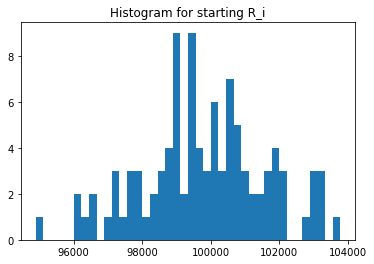

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([201996.5577461 , 201516.3008214 , 201440.41979024, 301434.41979024,
       301508.3008214 , 201433.41979024, 295450.06267274, 195456.06267274,
       201508.3008214 , 298836.73777557, 198840.73777557, 197607.83541865,
       297607.83541865, 297612.05563807, 197612.05563807, 197618.05563807,
       198836.73777557, 294382.99155529, 194381.99155529, 197834.49564824,
       297835.49564824, 194389.99155529, 197939.83138716, 297937.83138716,
       200275.26826131, 300271.26826131, 197937.83138716, 300445.13841788,
       306000.20144367, 205999.20144367, 200444.13841788, 200457.13841788,
       195449.06267274, 197845.49564824, 206006.20144367, 203324.0574681 ,
       200379.34335011, 195176.23794053, 295177.23794053, 303318.0574681 ,
       195185.23794053, 292206.43227218, 192206.43227218, 203317.0574681 ,
       300837.11789537, 200840.11789537, 192313.6980105 , 292314.6980105 ,
       300368.34335011, 200837.11789537, 200367.34335011, 307548.2919022 ,
       207547.2919022 , 2

In [24]:
experiments.UNI_Si.unique()

array([10000., 14964., 14962., 15116., 15029., 15060., 15144., 15054.,
       15052., 14993., 14988., 14854., 15123., 14918., 15202., 14979.,
       15199., 14990., 14818., 15001., 15022., 15106., 14973., 14967.,
       14975., 15046., 15175., 14909., 15195., 15053., 15070., 14946.,
       15047., 15023., 15081., 14855., 15143., 14999., 15102., 15050.,
       15056., 15091., 14968., 14963., 15084., 15031., 14907., 15064.,
       14966., 14939., 14848., 15068., 15148., 14897., 14919., 14866.,
       14900., 15121., 15007., 15039., 15048., 15018., 14903., 15111.,
       15038., 15011., 14982., 14991., 14970., 15030., 15032., 15134.,
       14926., 14980., 15179., 14965., 14845., 15003., 15072., 15268.,
       15150., 14895., 14923., 14904., 14844., 15013., 14850., 14935.,
       14948., 14950.])

In [25]:
experiments.UNI_Qj.unique()

array([194418.4474541 , 197747.81243404, 196600.92827866, 196077.231658  ,
       197996.40227455, 193893.14310625, 200398.96300874, 194471.01880576,
       202361.02101812, 201939.03604997, 205690.05487723, 208955.66475475,
       195762.39587696, 196356.27137964, 198944.27474093, 206296.19078279,
       211180.94193703, 196891.70698755, 198716.02195601, 200274.41256359,
       195796.0226227 , 200615.78498357, 202518.13993079, 201903.17850891,
       199708.92549129, 200858.12505511, 200241.04188928, 199893.98321029,
       199232.11098657, 201901.7459278 , 210098.67123299, 196641.67923206,
       199702.46764235, 201032.75588289, 195480.42490261, 192471.05503224,
       199108.23227827, 203188.96817795, 203030.15679755, 200232.94715103,
       196395.68708622, 199861.21497837, 201209.71260208, 202876.2016126 ,
       204623.46572679, 195379.95358175, 196473.75432235, 207603.31638219,
       201904.14952918, 197163.19100989, 195291.57119252, 197007.96322968,
       200931.08249079, 1

In [26]:
experiments.UNI_Rj.unique()

array([ 97209.22372705,  98873.90621702,  98300.46413933,  98038.615829  ,
        98998.20113728,  96946.57155313, 100199.48150437,  97235.50940288,
       101180.51050906, 100969.51802499, 102845.02743862, 104477.83237737,
        97881.19793848,  98178.13568982,  99472.13737047, 103148.09539139,
       105590.47096851,  98445.85349378,  99358.010978  , 100137.2062818 ,
        97898.01131135, 100307.89249179, 101259.0699654 , 100951.58925445,
        99854.46274564, 100429.06252756, 100120.52094464,  99946.99160514,
        99616.05549329, 100950.8729639 , 105049.33561649,  98320.83961603,
        99851.23382117, 100516.37794145,  97740.21245131,  96235.52751612,
        99554.11613914, 101594.48408897, 101515.07839878, 100116.47357552,
        98197.84354311,  99930.60748919, 100604.85630104, 101438.1008063 ,
       102311.73286339,  97689.97679087,  98236.87716117, 103801.6581911 ,
       100952.07476459,  98581.59550495,  97645.78559626,  98503.98161484,
       100465.5412454 ,  

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 97209.22372705,  98873.90621702,  96946.57155313,  98300.46413933,
       100199.48150437,  98998.20113728, 101180.51050906,  97235.50940288,
       100969.51802499, 104477.83237737,  97881.19793848,  98038.615829  ,
       103148.09539139, 105590.47096851,  98178.13568982,  99358.010978  ,
        98445.85349378,  99472.13737047,  97898.01131135, 100137.2062818 ,
       101259.0699654 , 100307.89249179, 100951.58925445,  99854.46274564,
       100120.52094464, 105049.33561649,  99616.05549329,  98320.83961603,
       100429.06252756,  99851.23382117,  99946.99160514,  97740.21245131,
        96235.52751612,  99554.11613914, 101594.48408897, 100116.47357552,
       102845.02743862,  98197.84354311,  99930.60748919, 100950.8729639 ,
       100604.85630104, 102311.73286339, 101515.07839878, 101438.1008063 ,
        97689.97679087,  98236.87716117, 100952.07476459, 103801.6581911 ,
        97645.78559626,  98649.29158138, 100465.5412454 ,  98581.59550495,
       100773.53414876, 1

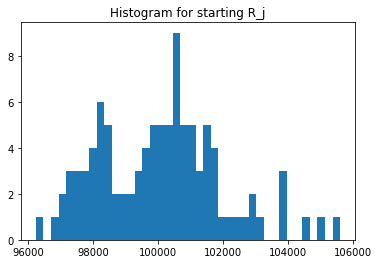

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100998.27887305,  96520.1504107 ,  95600.1504107 , ...,
        98874.32394905, 102781.32394905,  93376.97132416])

In [31]:
experiments.UNI_ji.unique()

array([ 97209.22372705, 103543.90621702, 104543.90621702, ...,
        98453.70501769,  94730.70501769, 104538.21245131])

In [32]:
experiments.UNI_Sij.unique()

array([9.81796429e+09, 9.96195642e+09, 9.90049933e+09, 9.58077778e+09,
       9.84223968e+09, 9.57870108e+09, 9.90031276e+09, 9.45041598e+09,
       1.00084976e+10, 9.99284372e+09, 1.02984006e+10, 1.04709845e+10,
       1.00817243e+10, 9.98064483e+09, 9.96548395e+09, 1.00660286e+10,
       1.01475839e+10, 9.88579074e+09, 9.55395326e+09, 1.03916030e+10,
       9.78715905e+09, 1.00832928e+10, 1.00815215e+10, 9.88386758e+09,
       1.00513105e+10, 9.90289246e+09, 1.00606154e+10, 9.90204404e+09,
       9.62383997e+09, 1.02815920e+10, 1.01105884e+10, 9.72847125e+09,
       1.00940530e+10, 9.95770912e+09, 9.72827602e+09, 9.53477916e+09,
       9.79574423e+09, 1.04616291e+10, 9.86880725e+09, 1.00126712e+10,
       9.77554724e+09, 9.79269138e+09, 9.94799288e+09, 1.00425347e+10,
       1.00470655e+10, 9.83058248e+09, 9.89494254e+09, 1.02074126e+10,
       1.00329751e+10, 1.00434756e+10, 9.82947978e+09, 9.72413337e+09,
       1.01702013e+10, 1.01454789e+10, 9.73228658e+09, 9.99227694e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


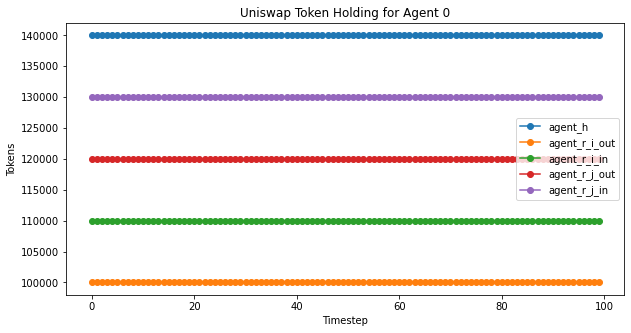

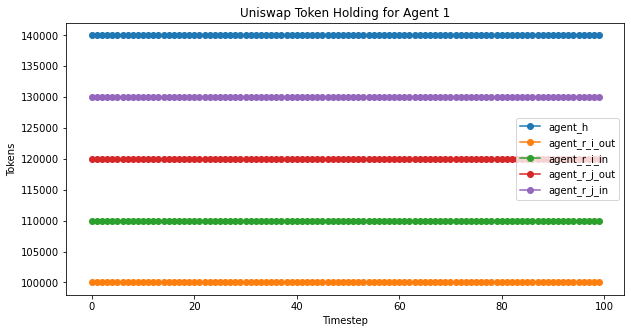

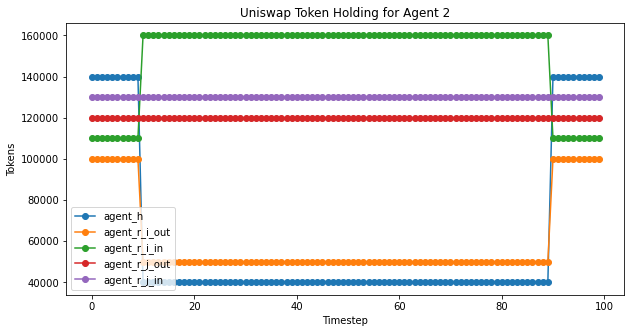

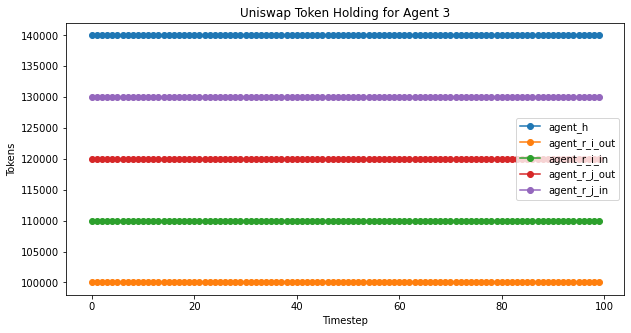

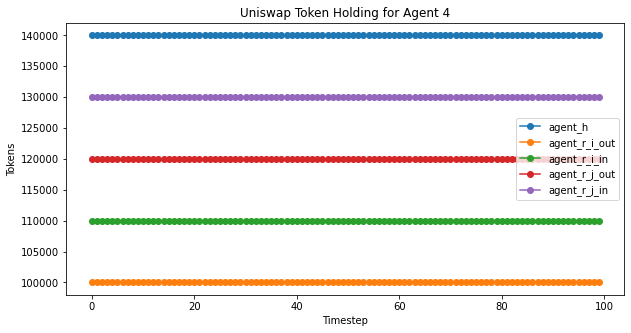

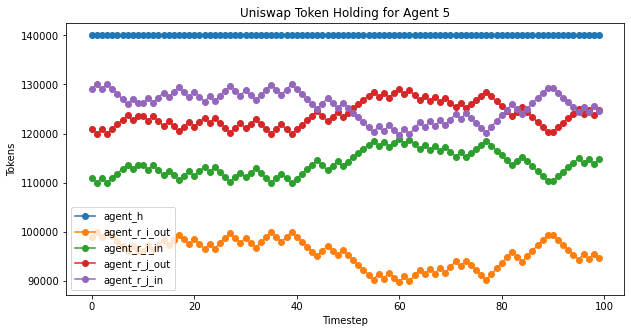

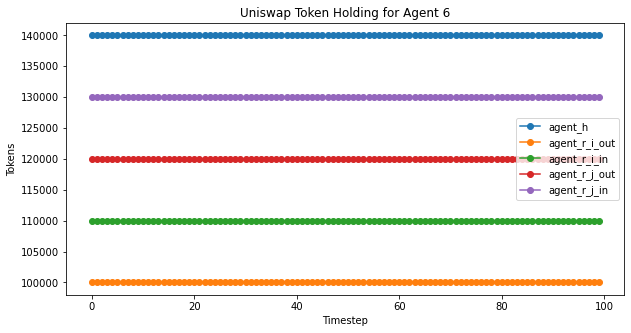

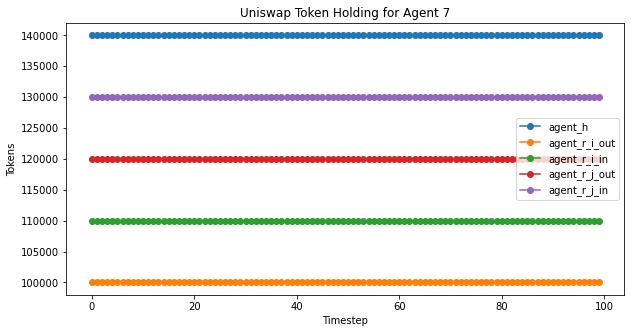

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


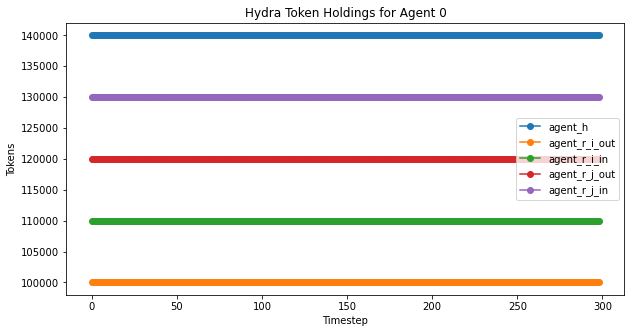

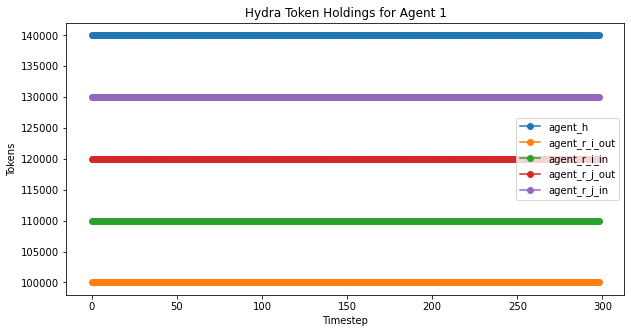

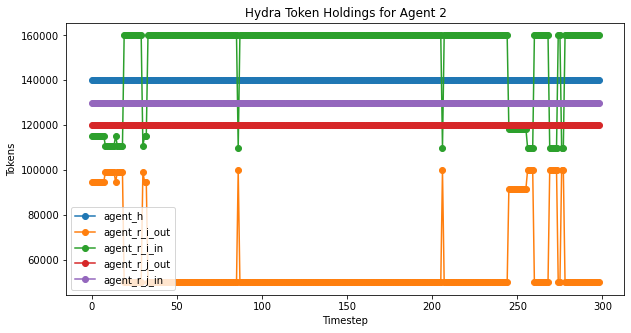

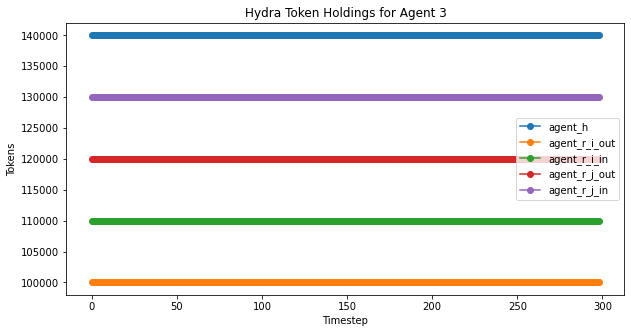

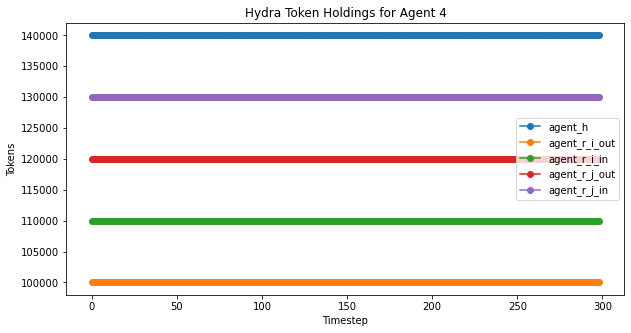

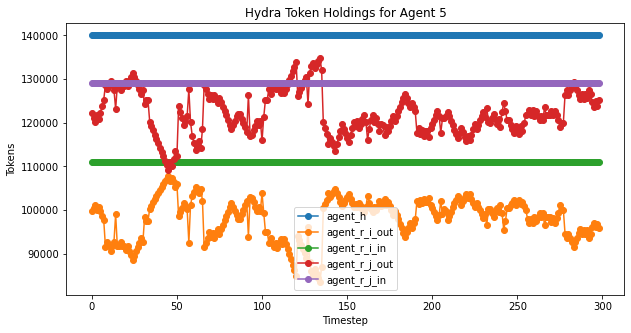

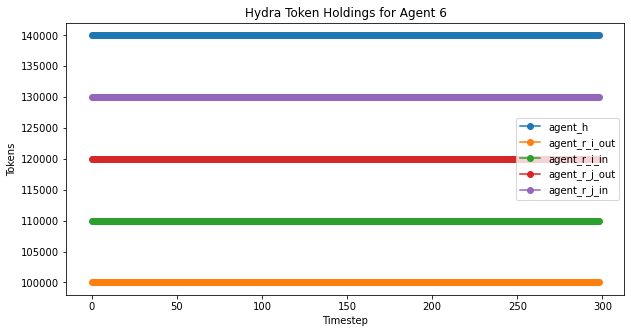

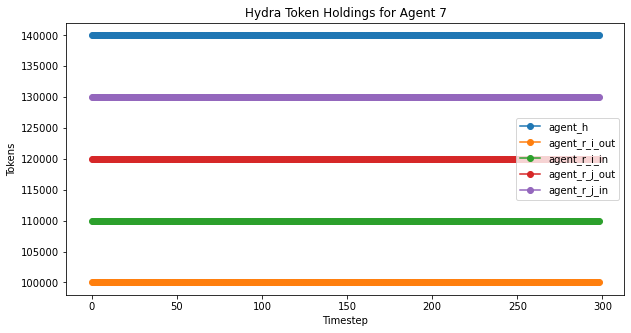

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

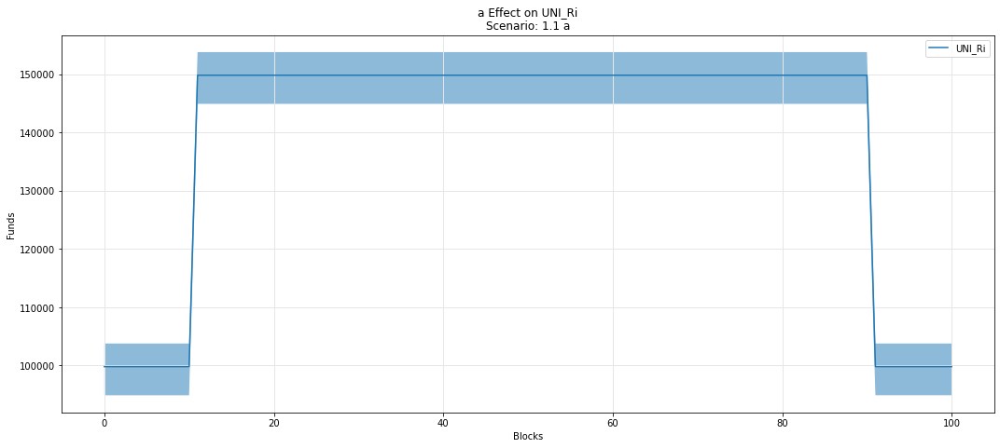

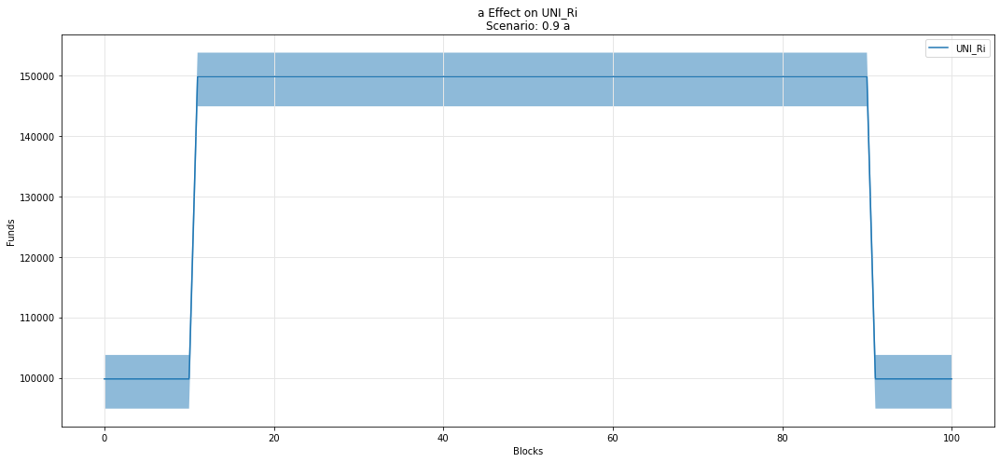

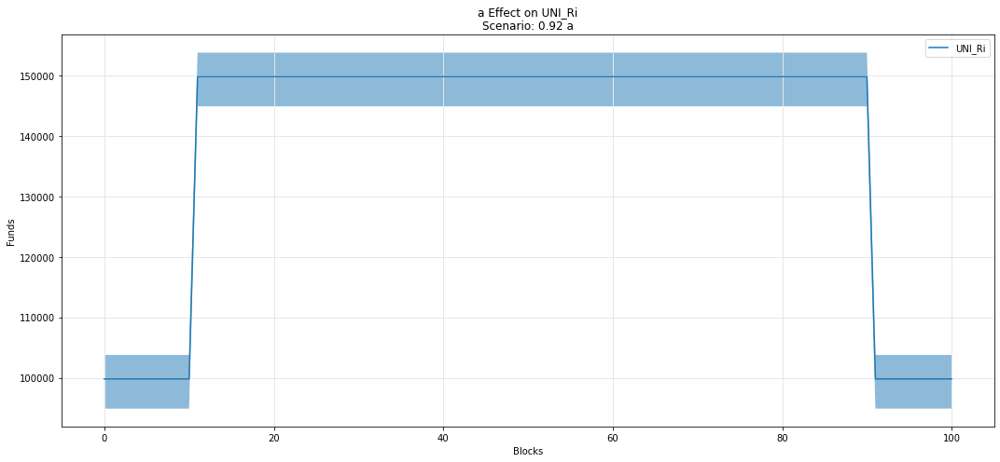

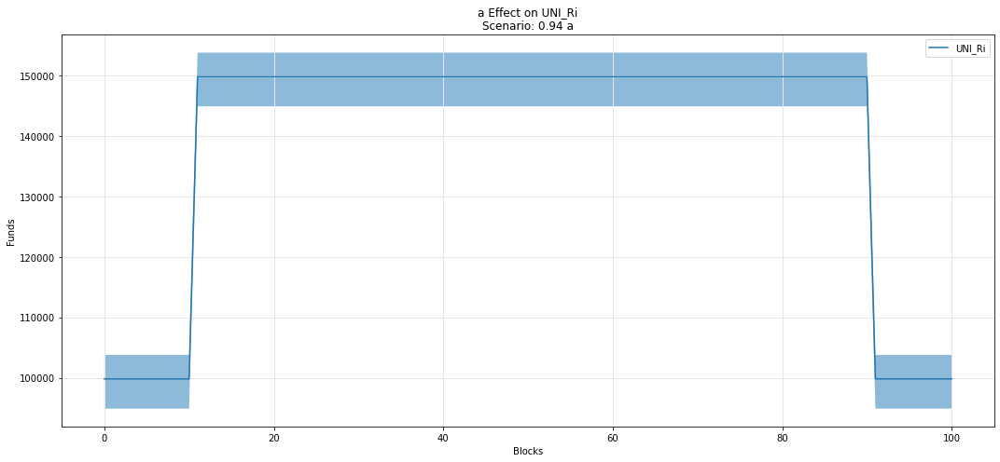

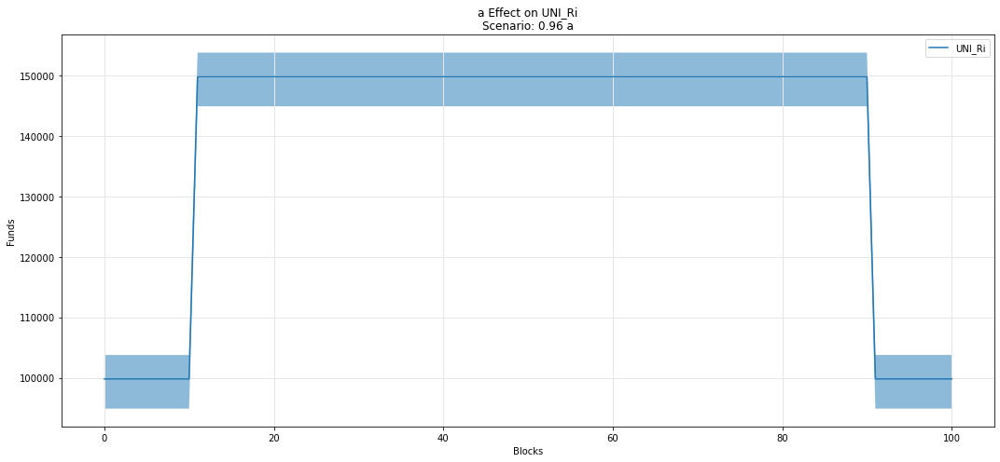

...

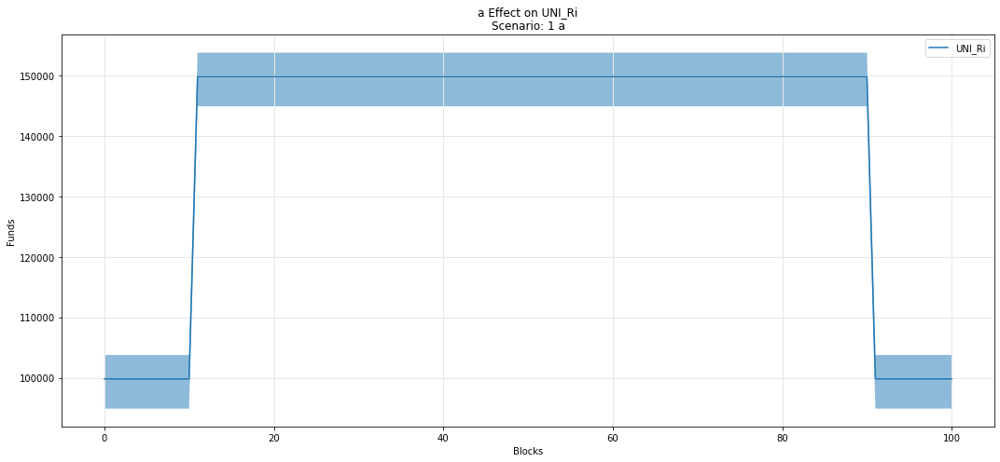

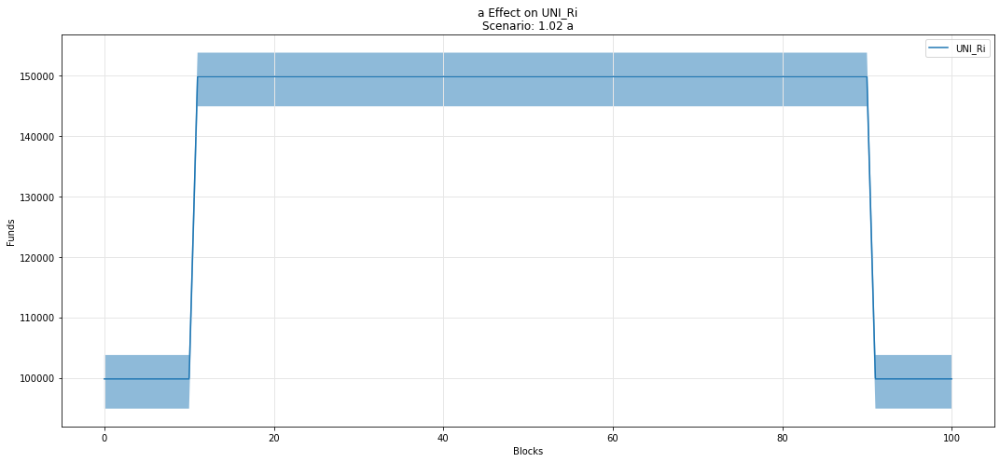

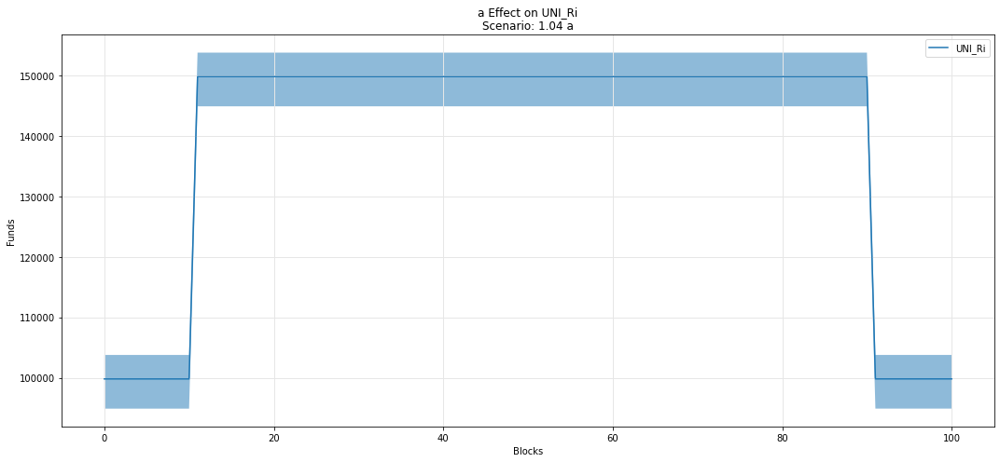

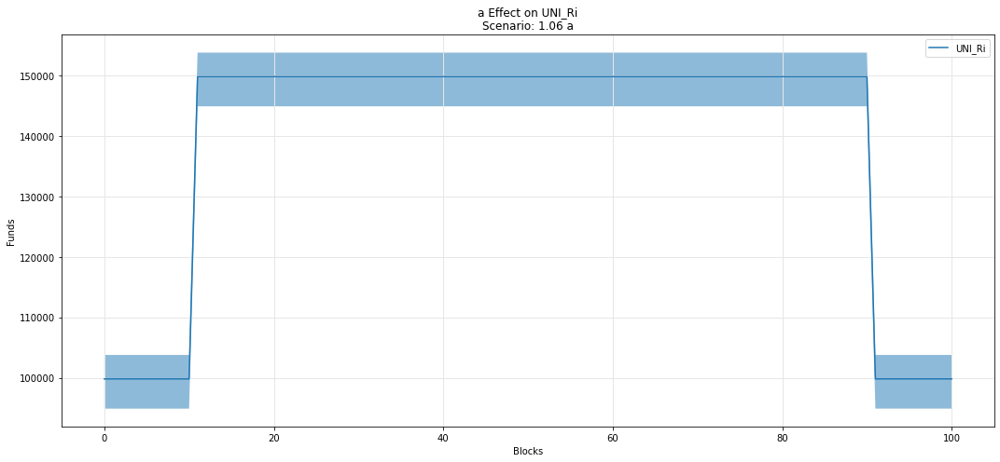

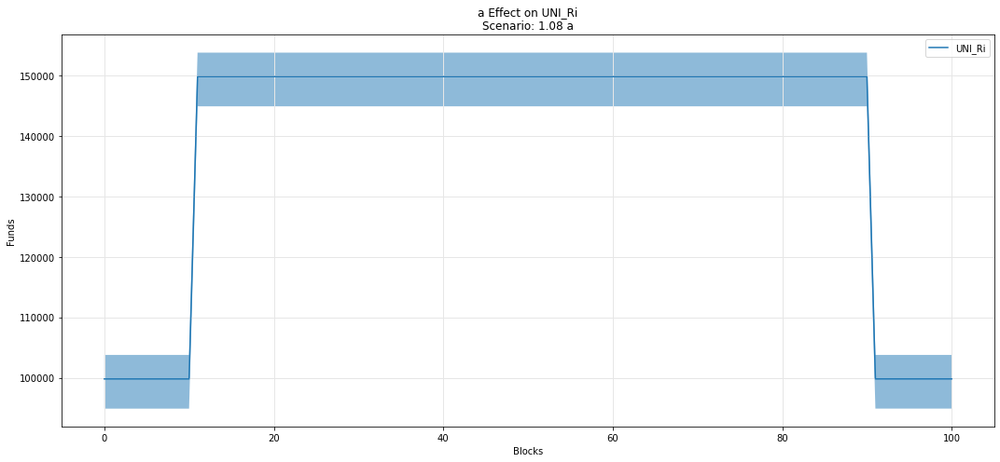

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

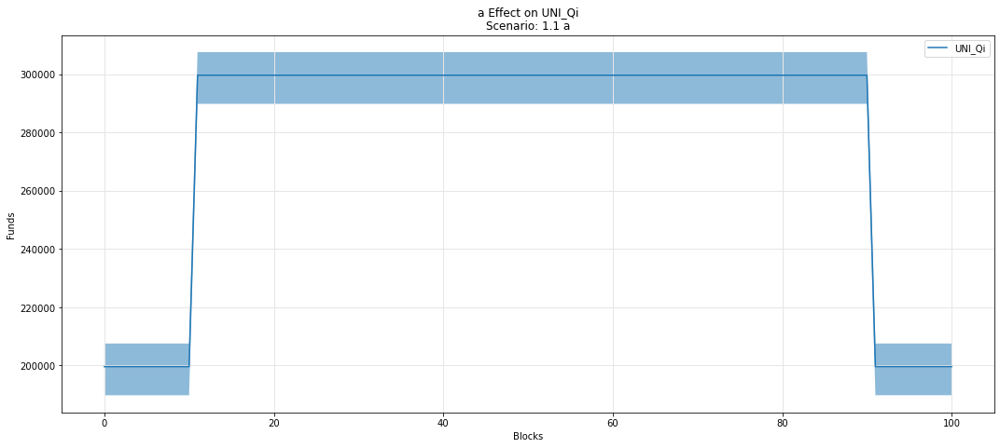

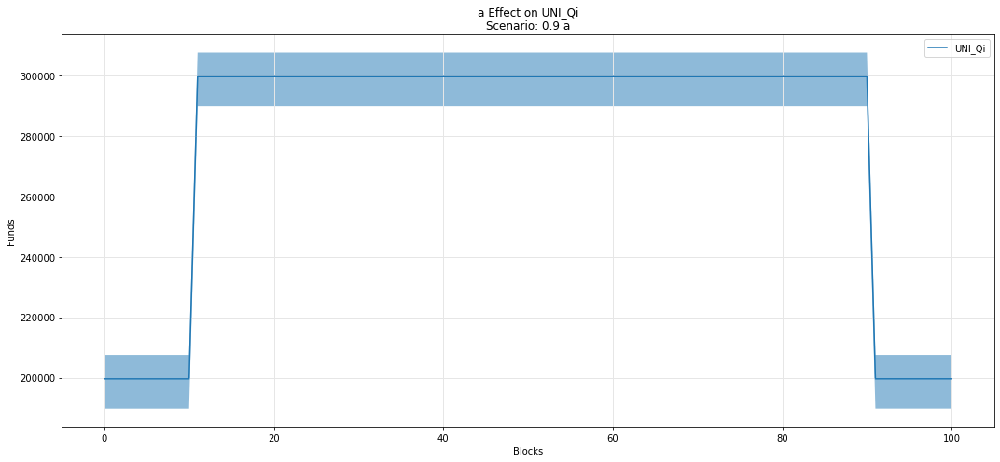

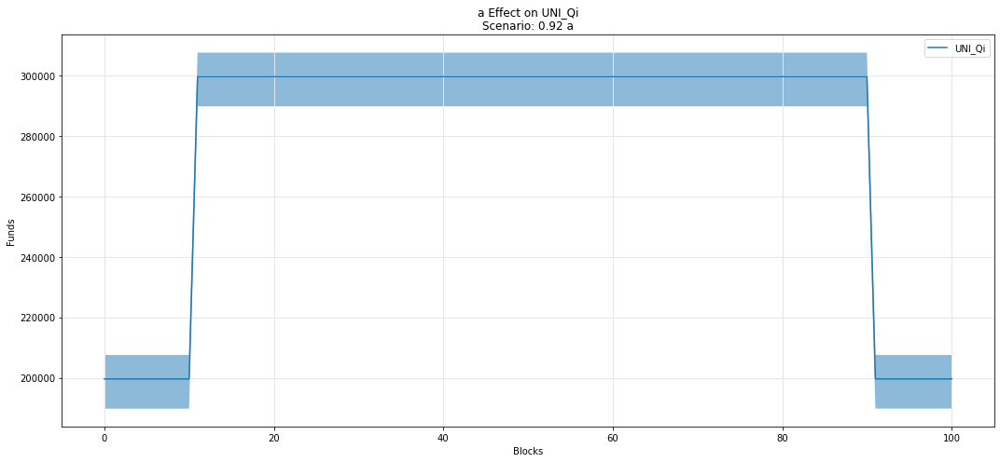

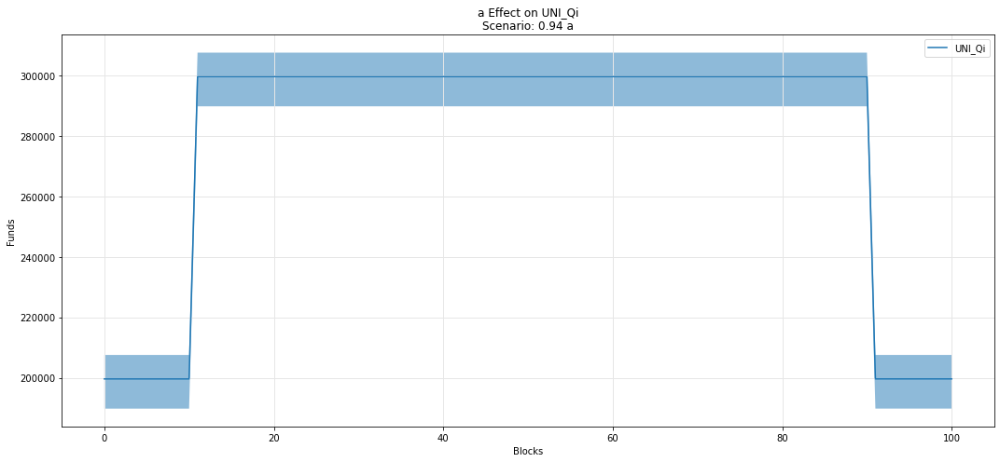

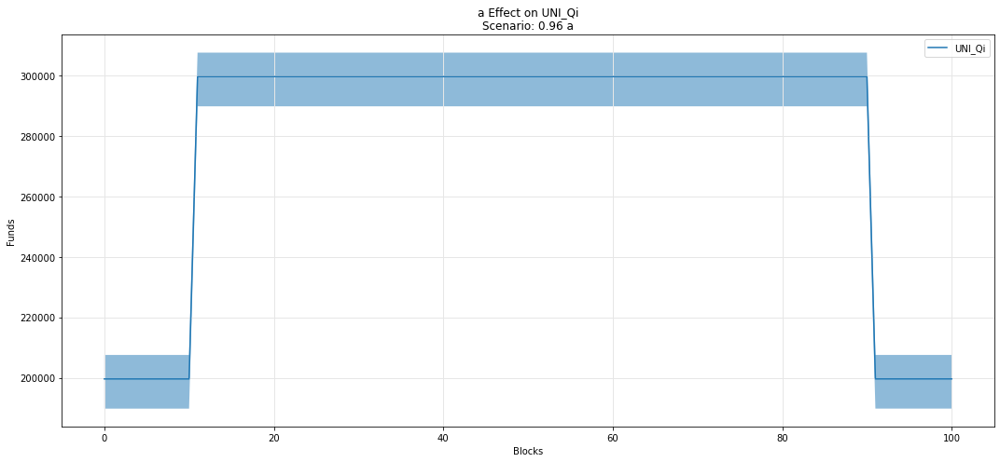

...

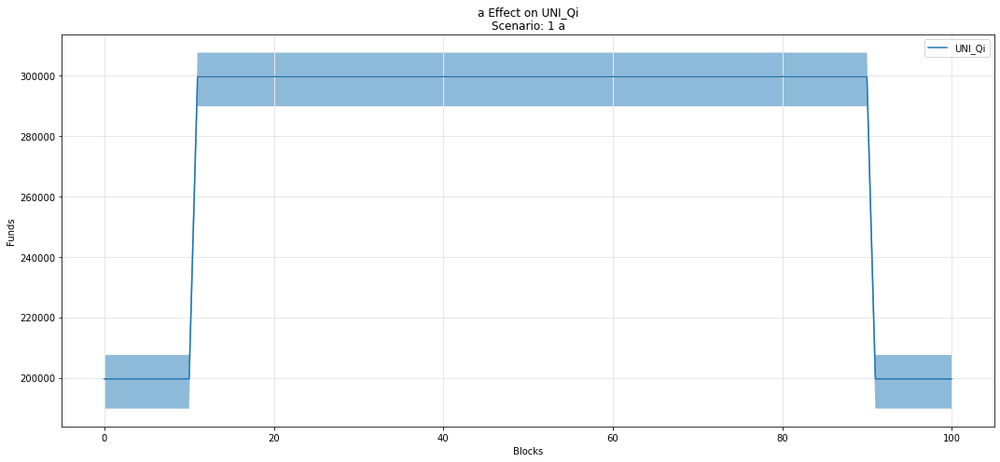

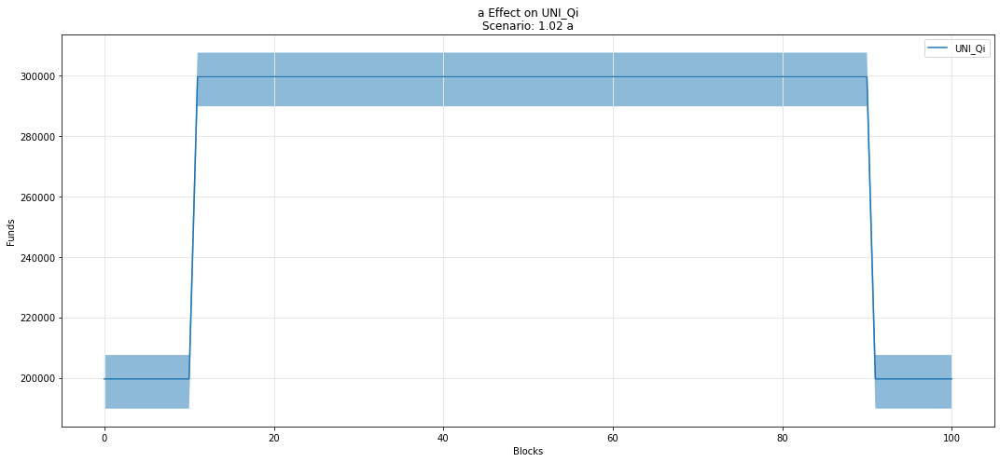

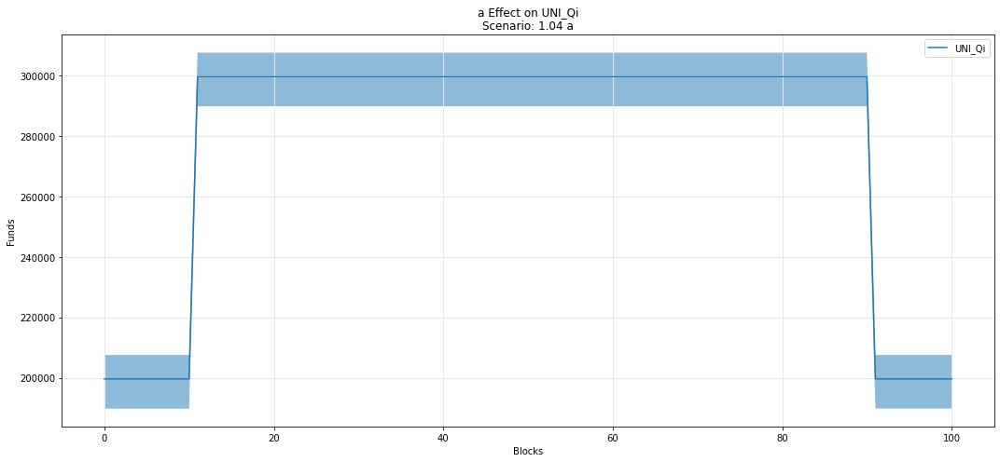

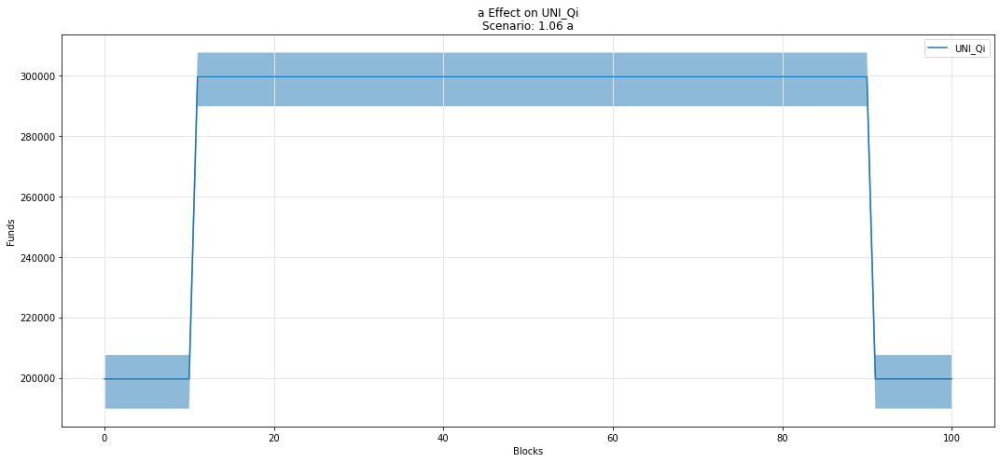

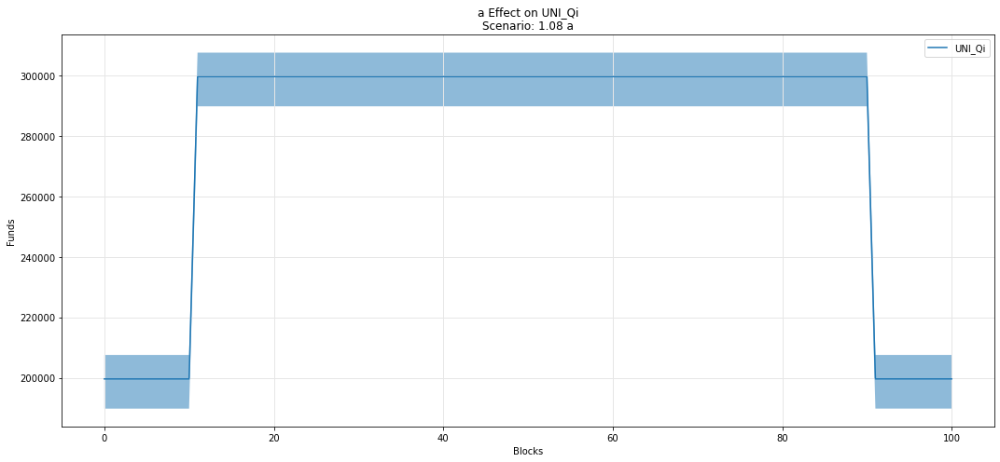

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

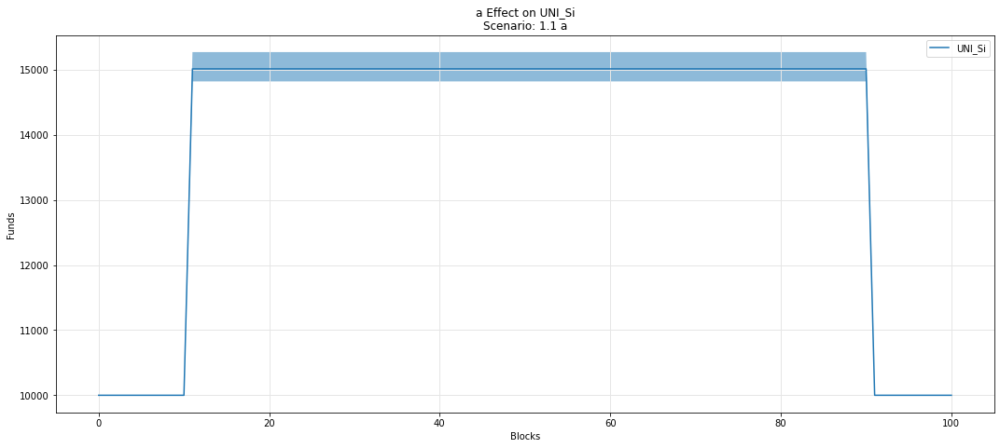

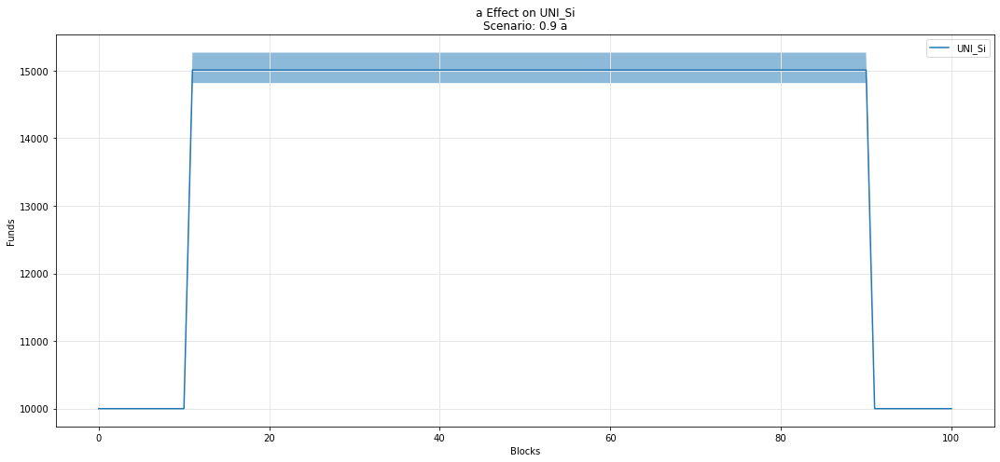

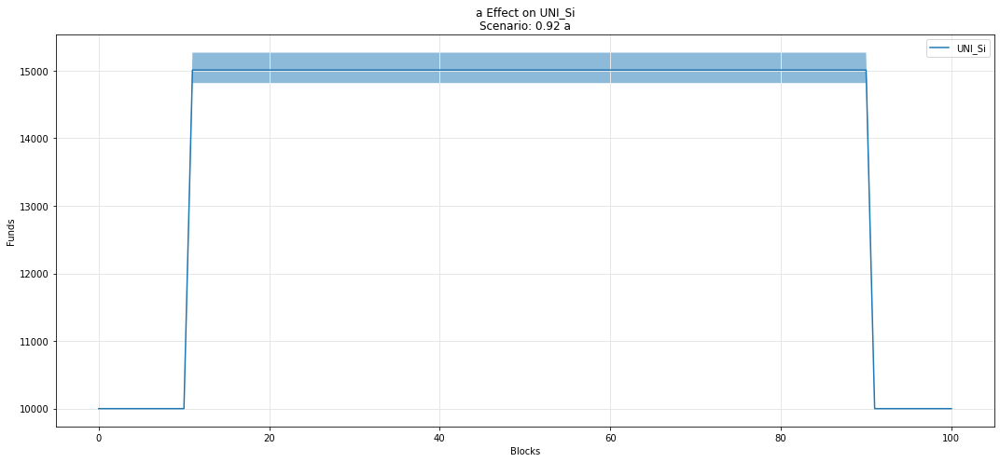

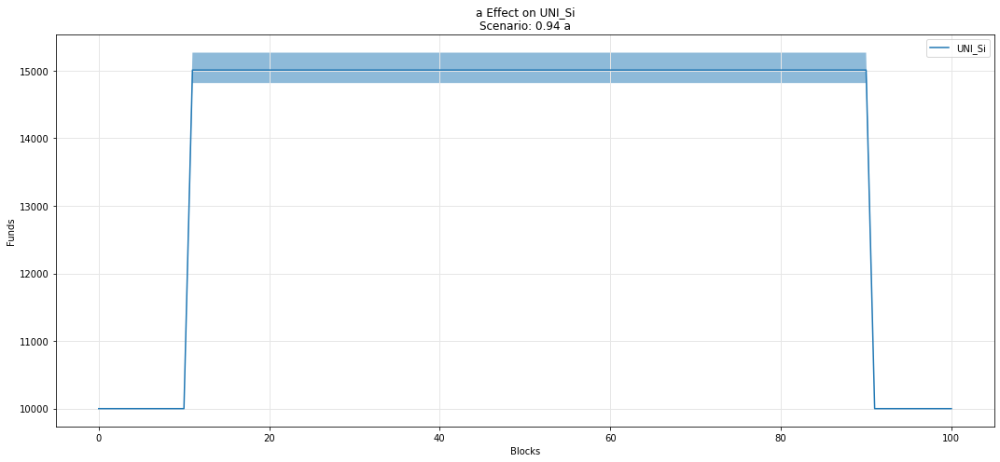

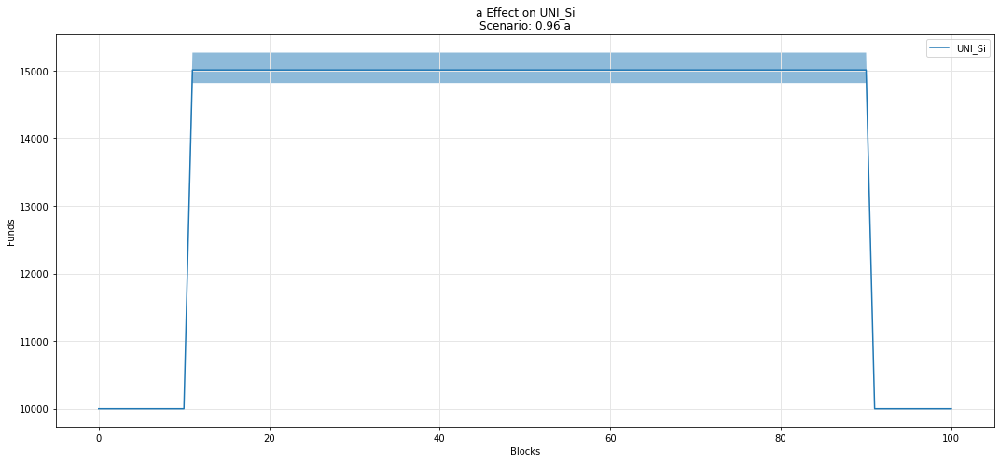

...

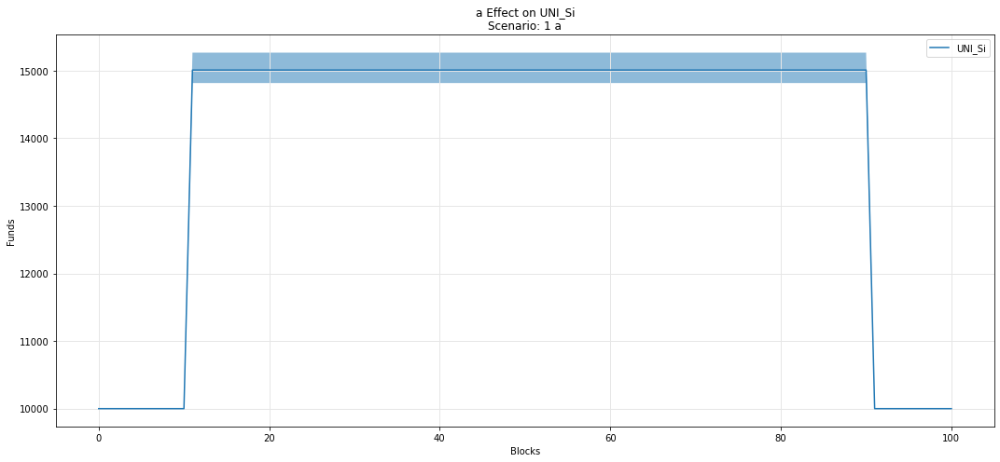

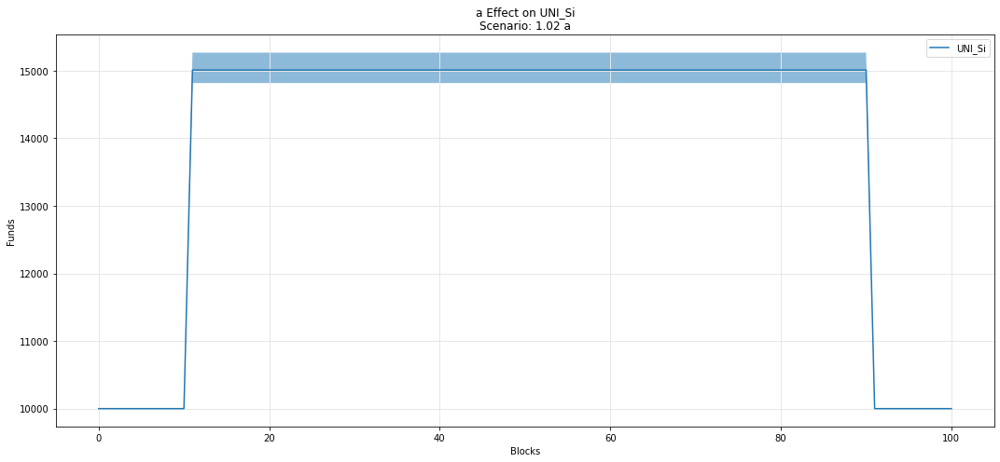

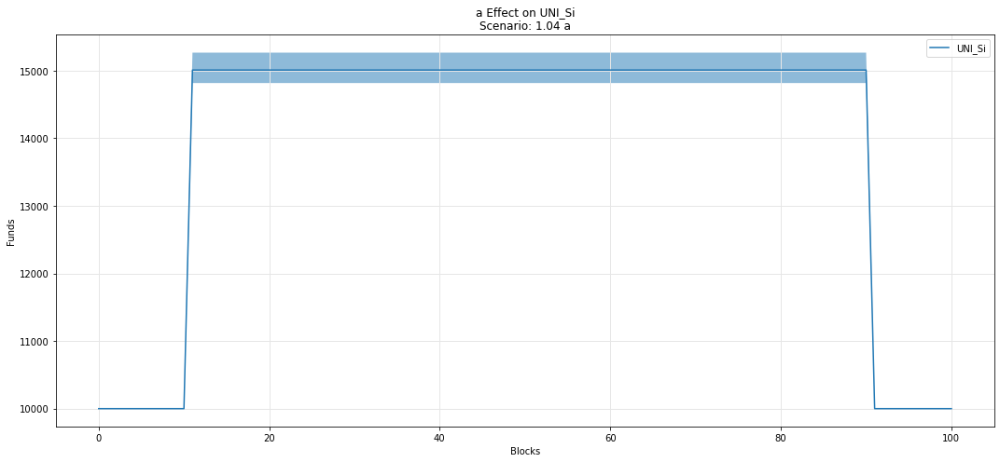

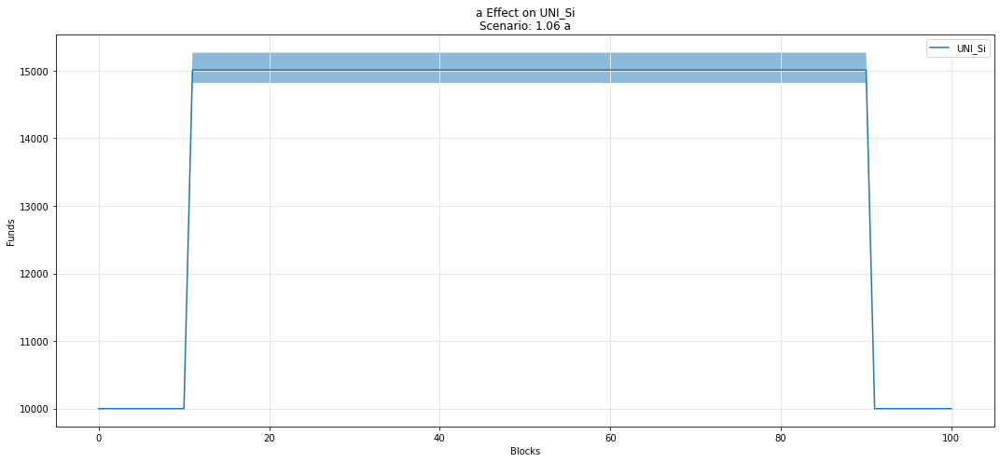

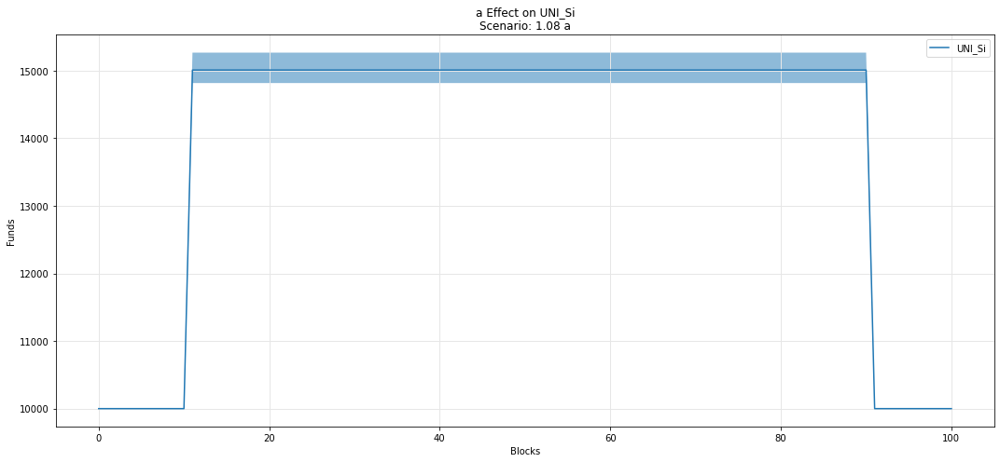

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

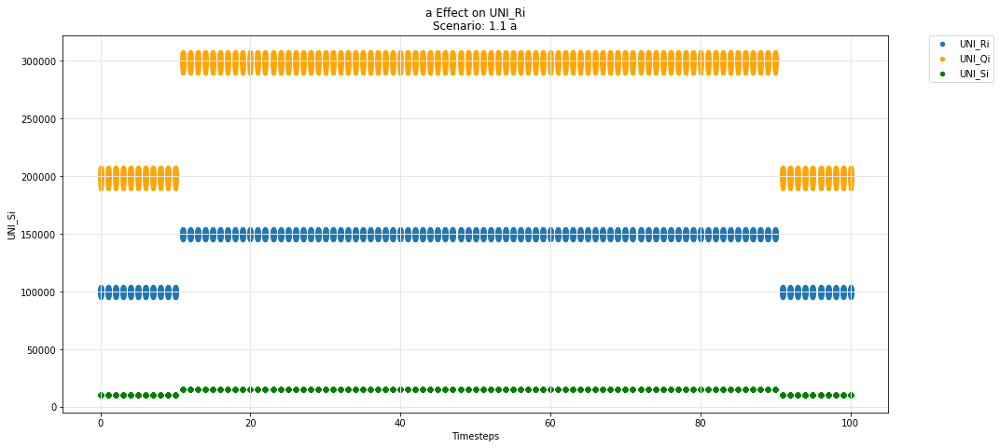

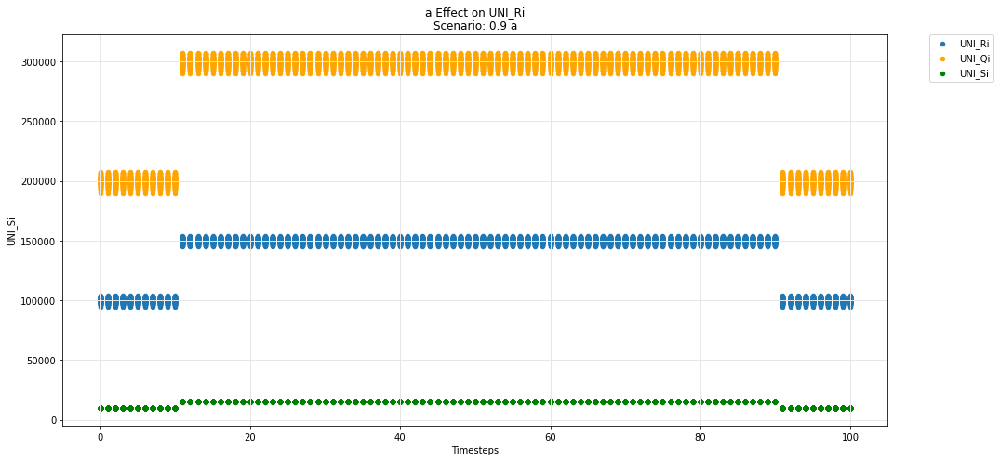

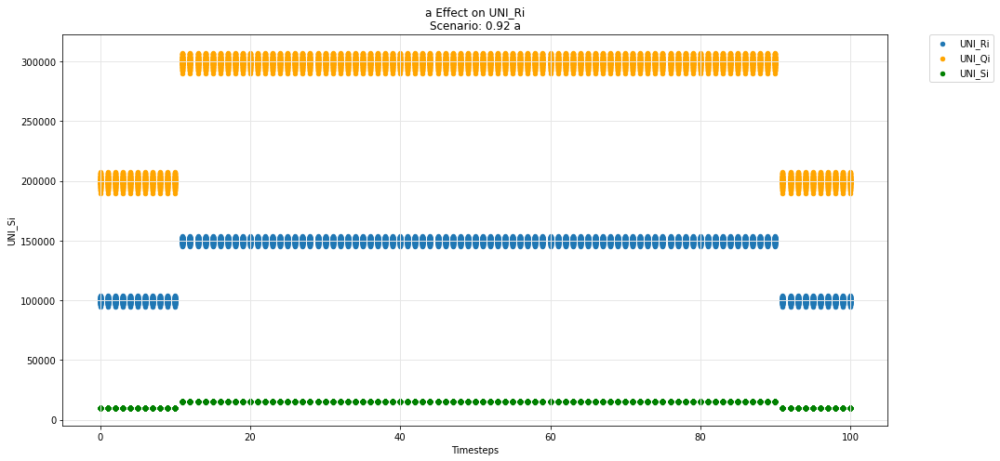

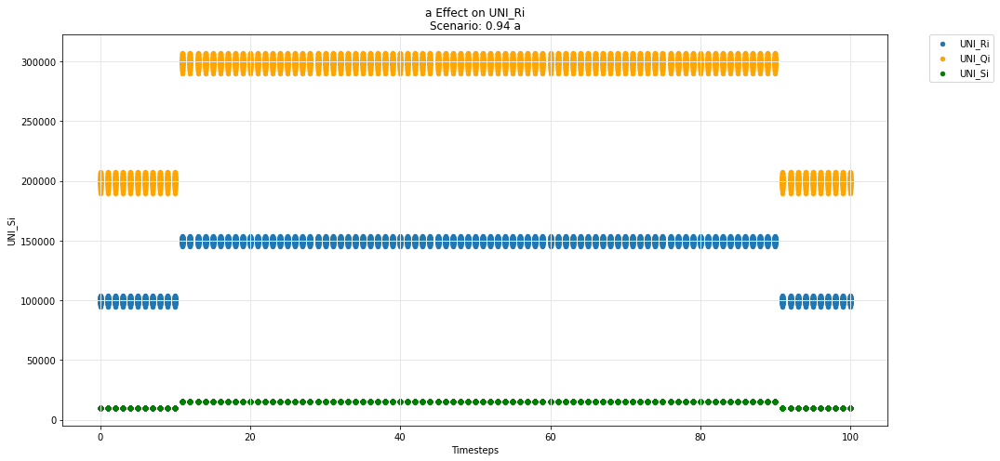

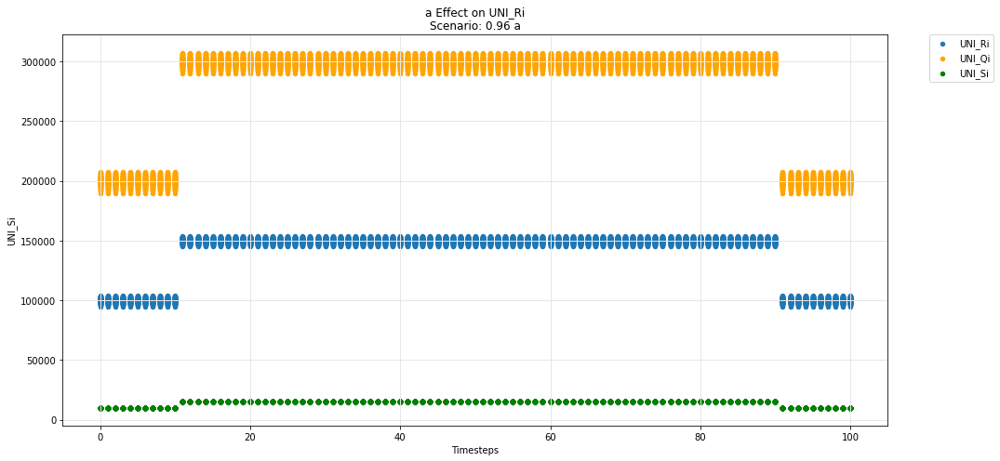

...

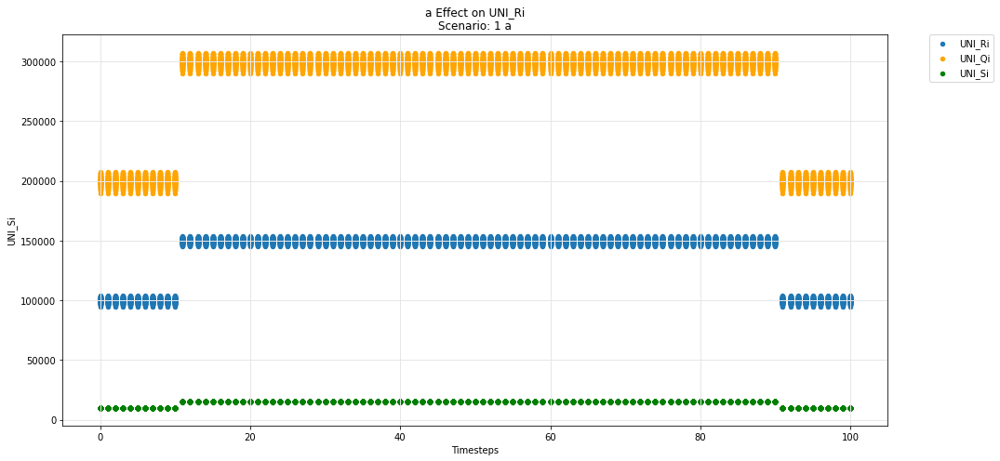

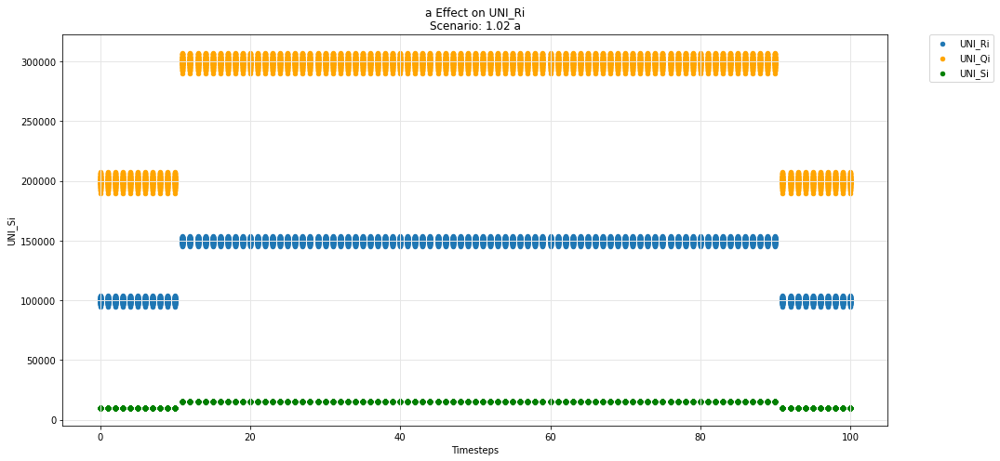

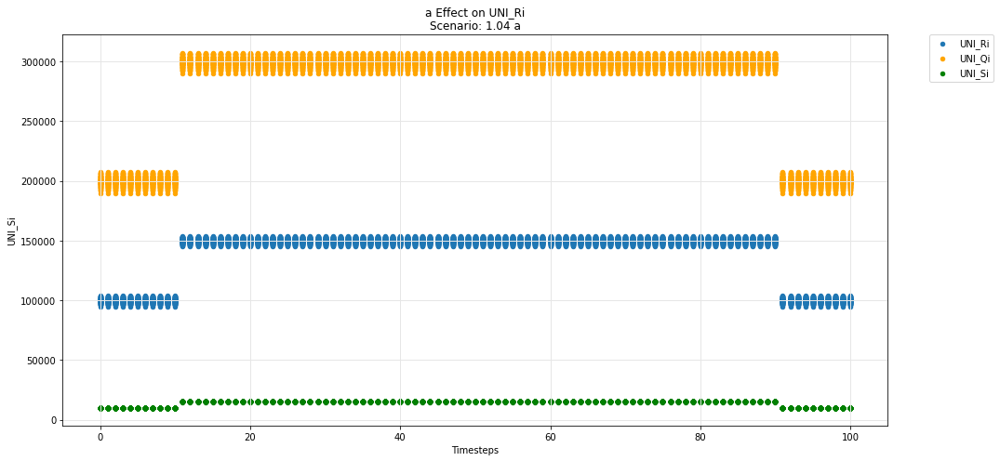

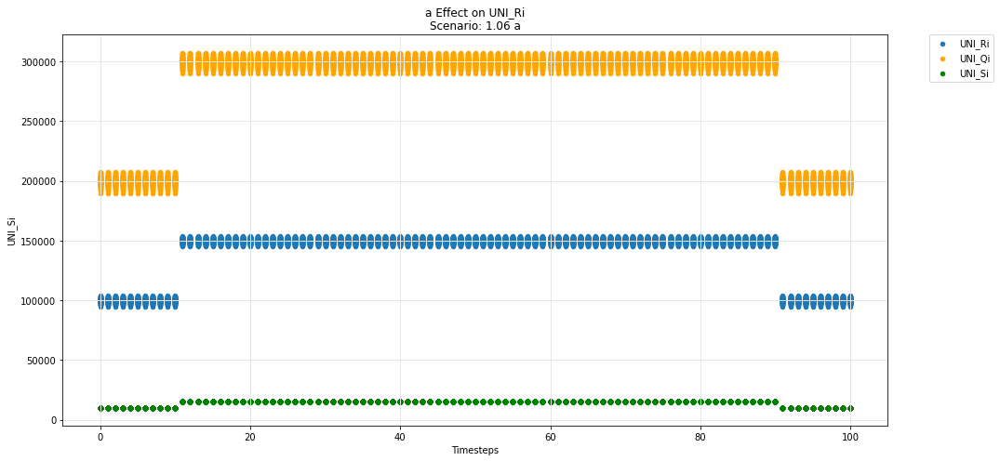

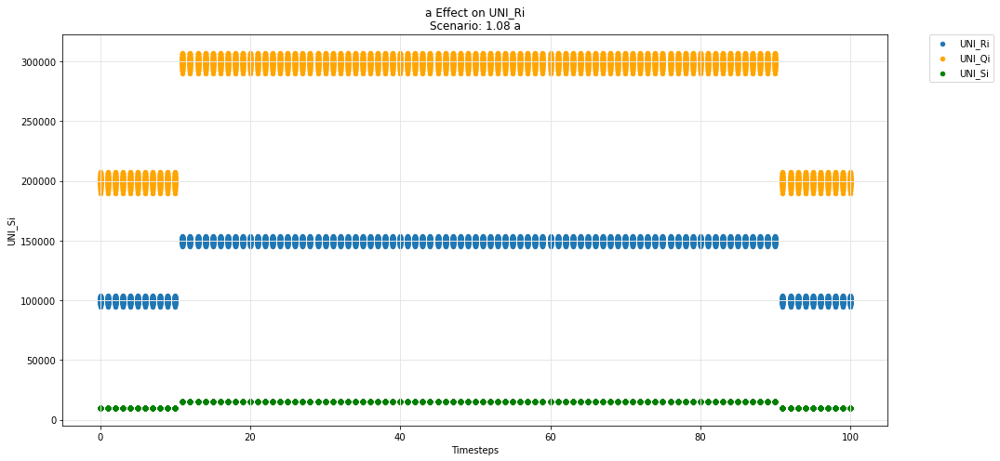

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

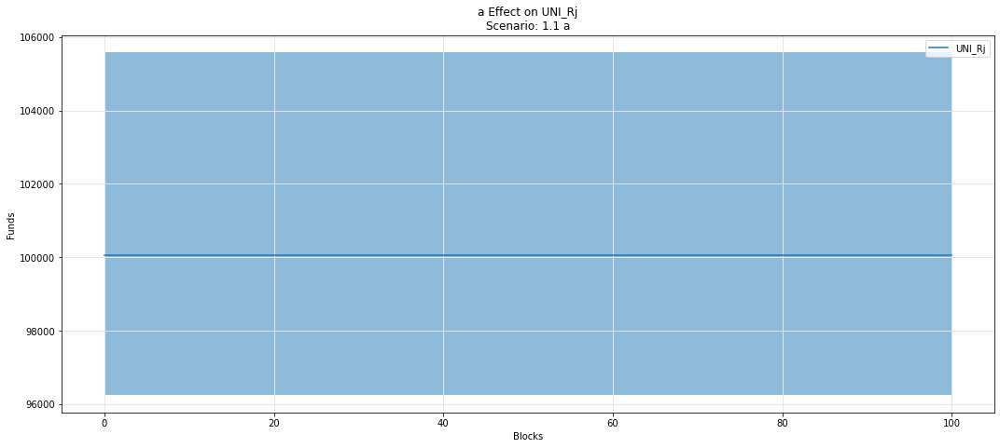

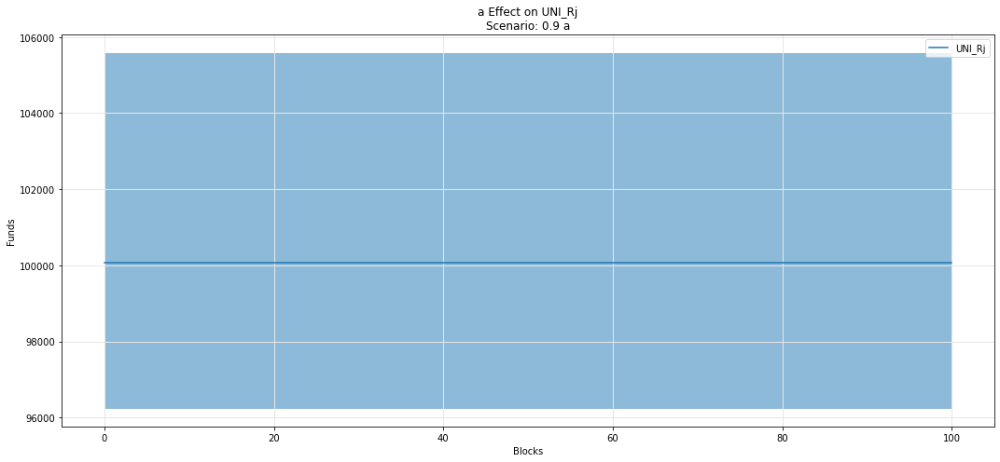

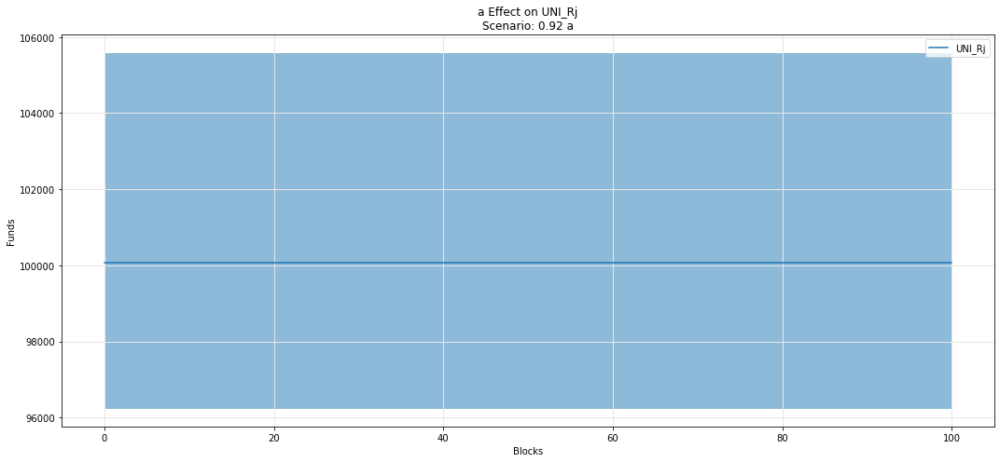

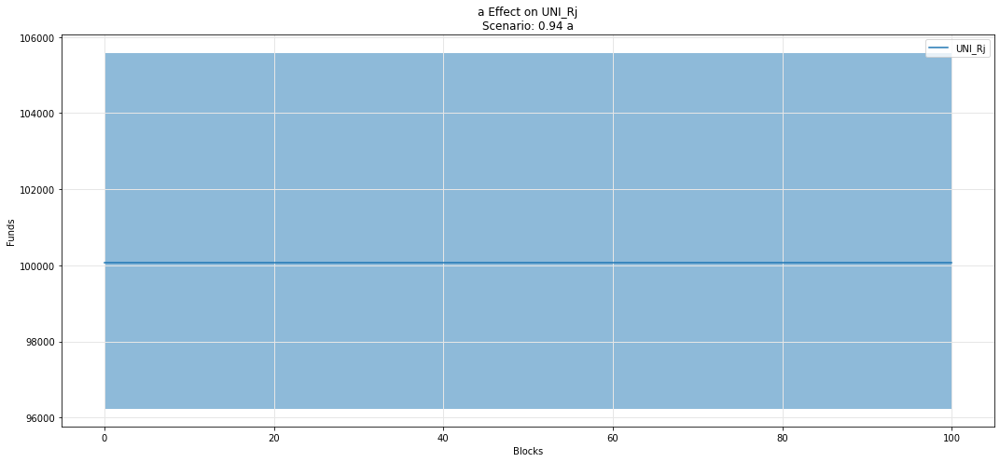

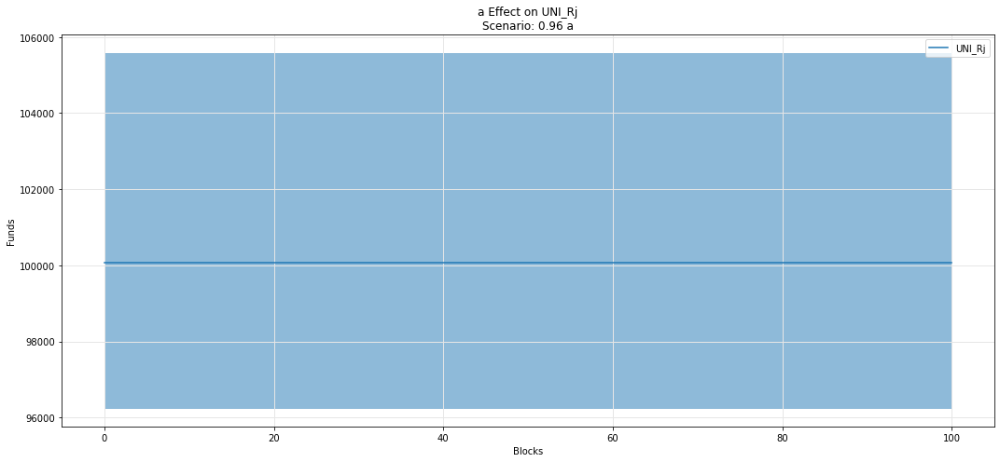

...

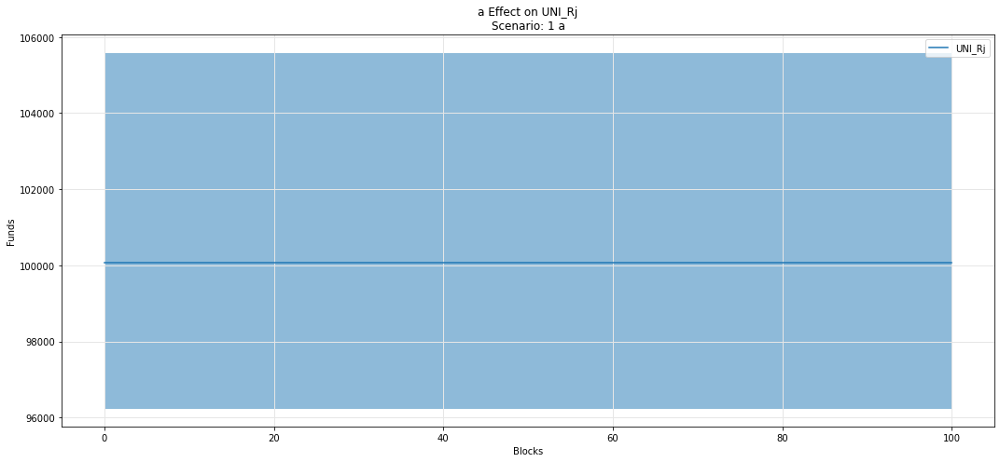

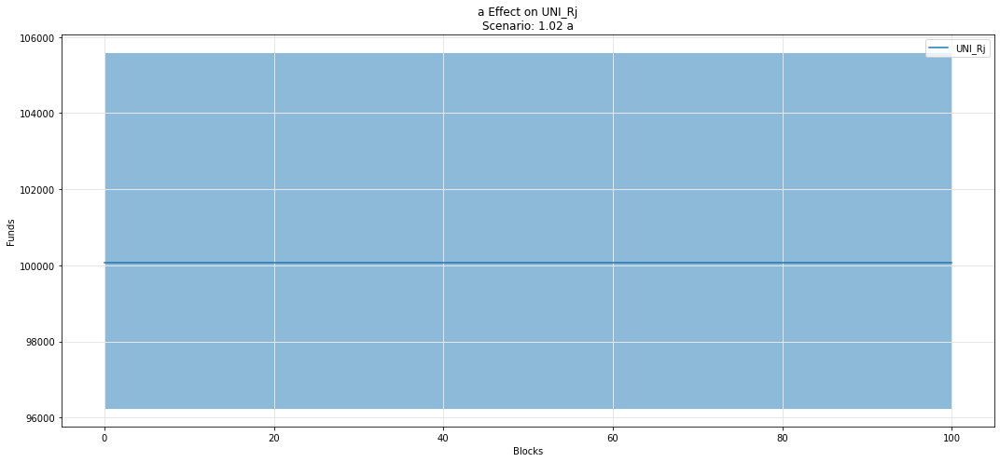

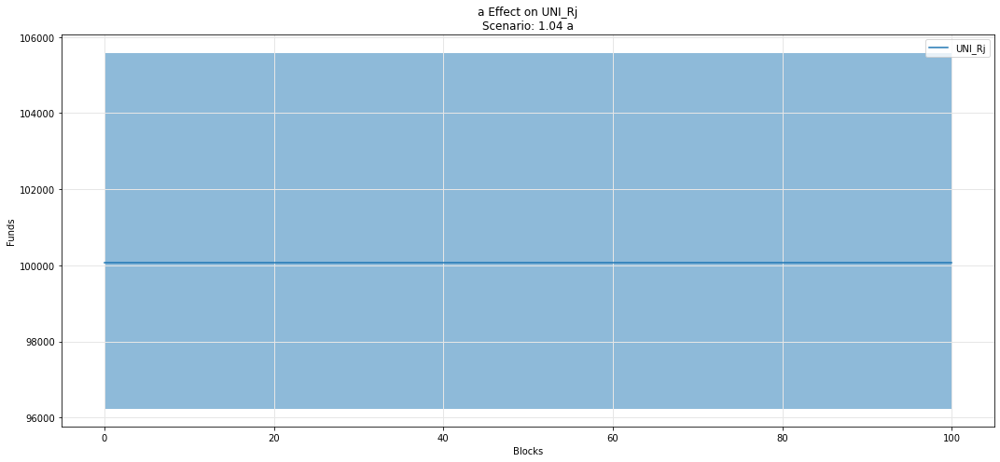

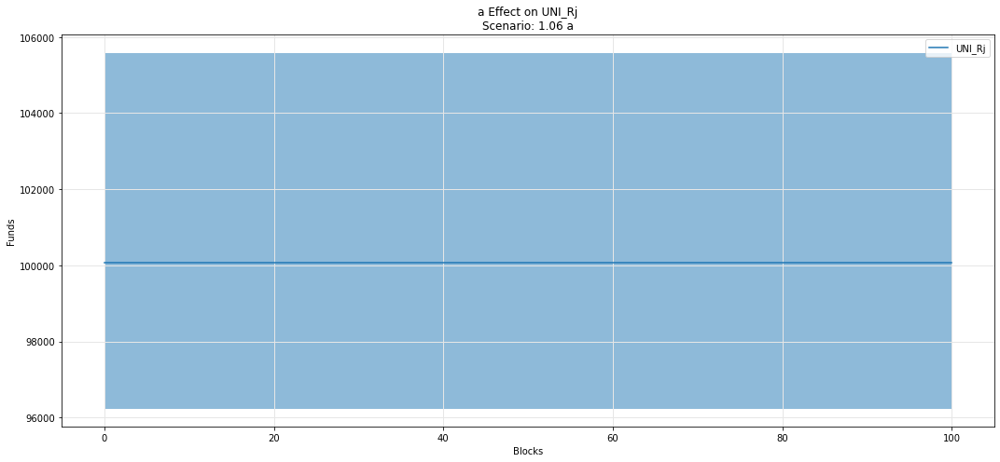

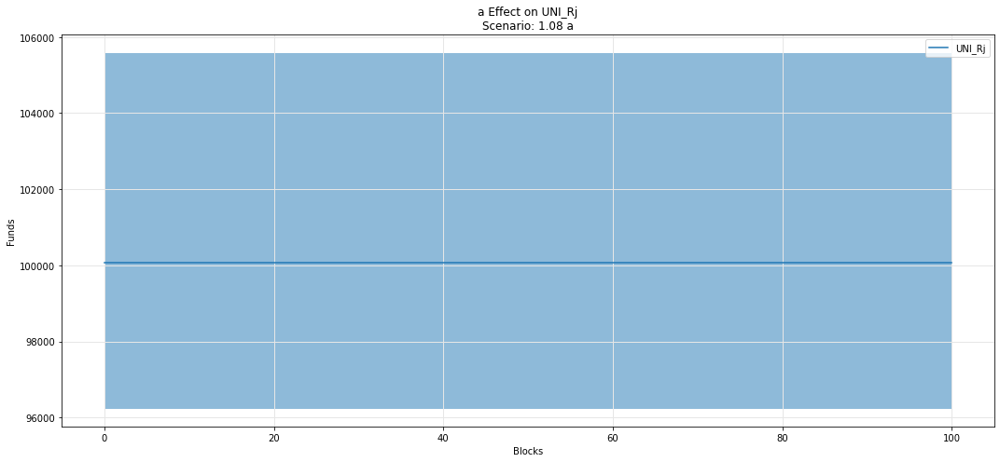

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

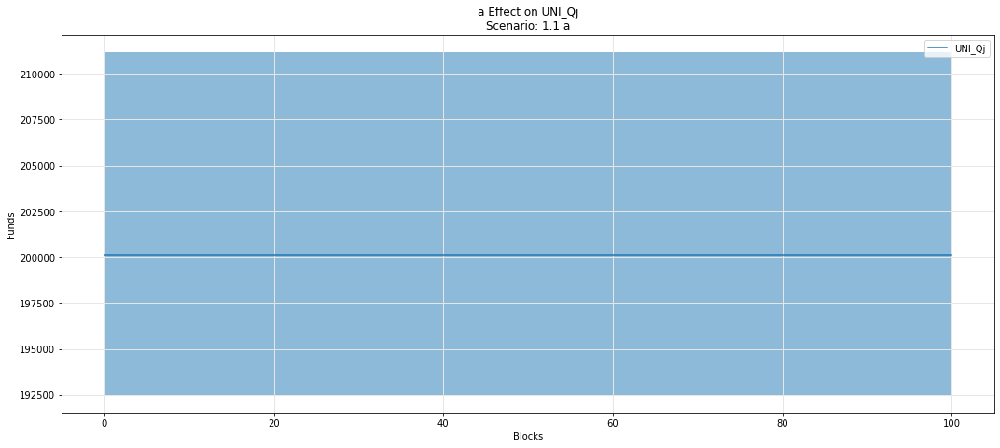

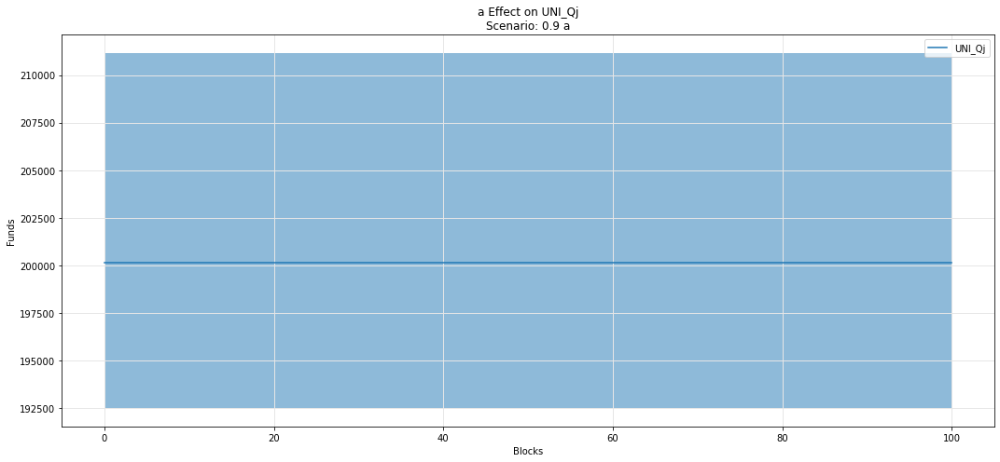

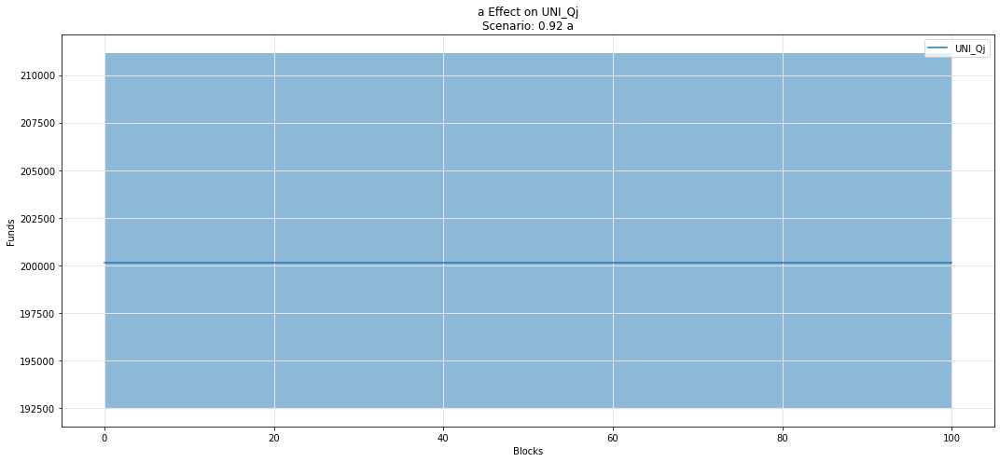

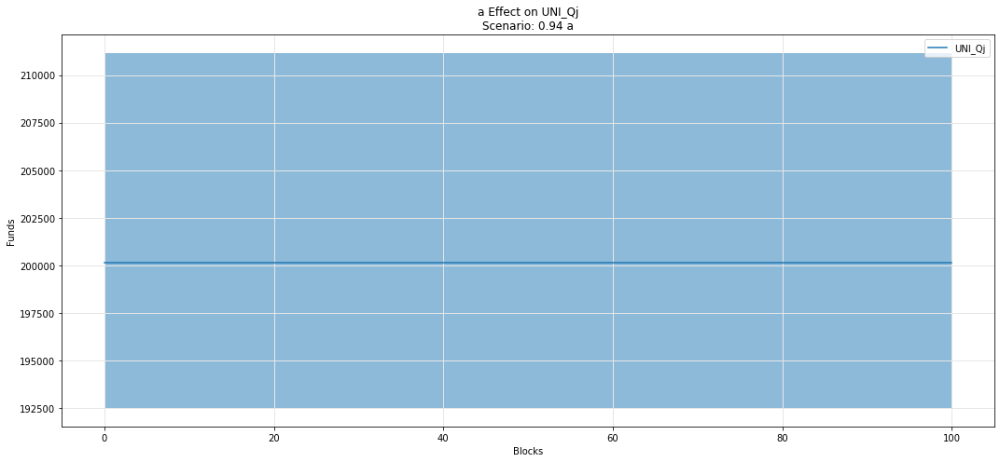

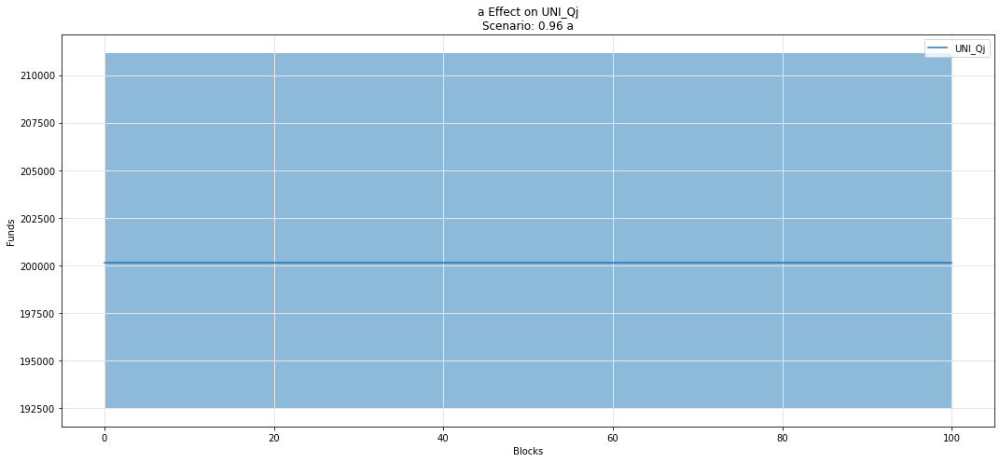

...

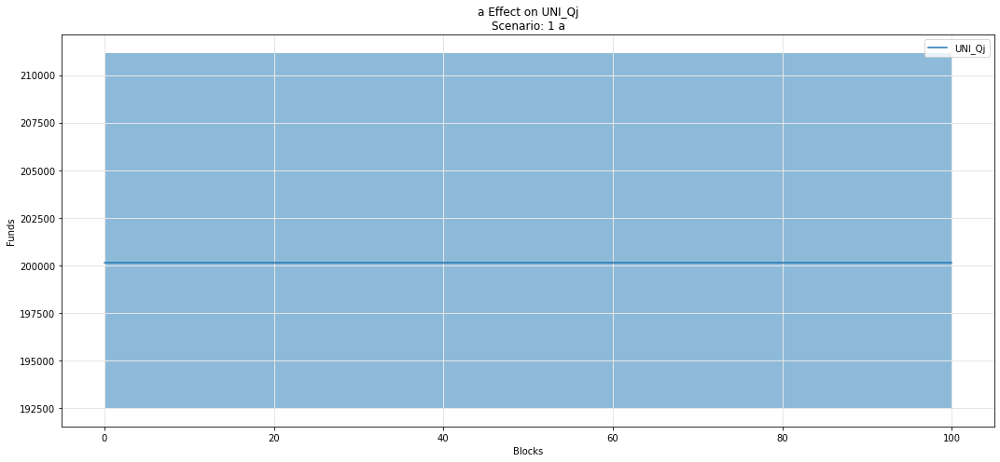

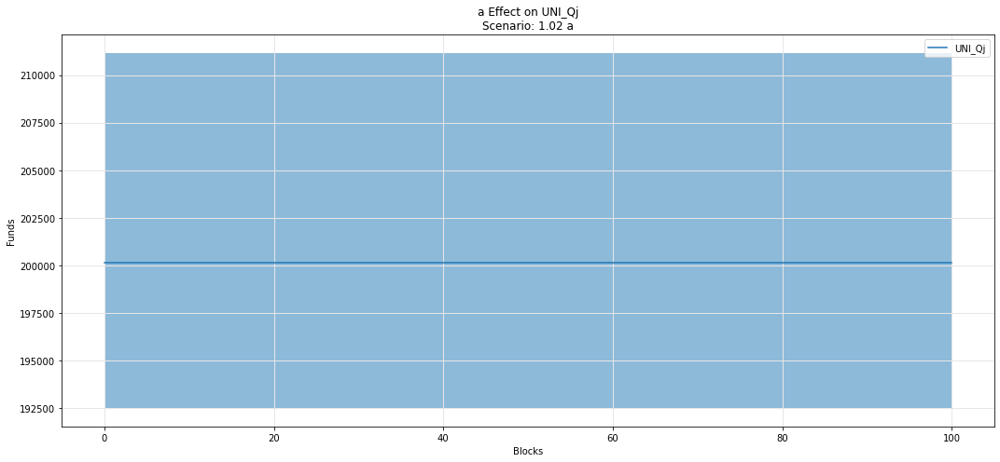

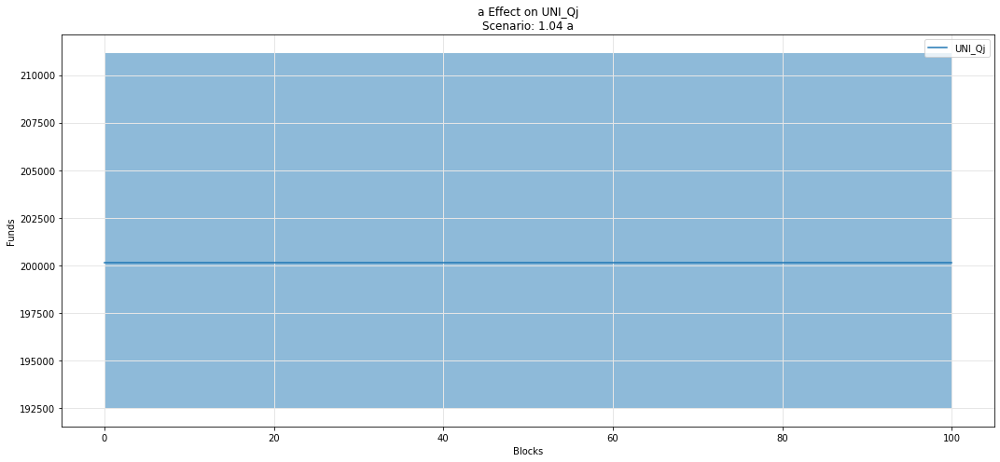

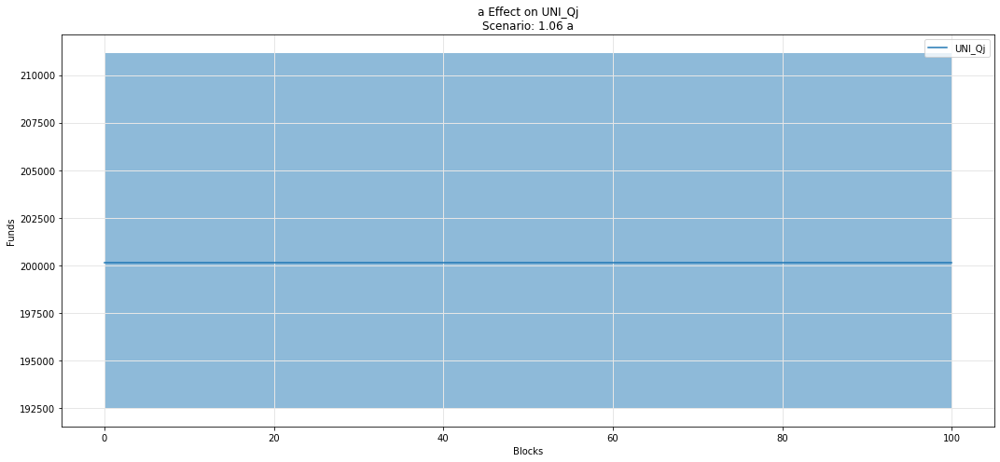

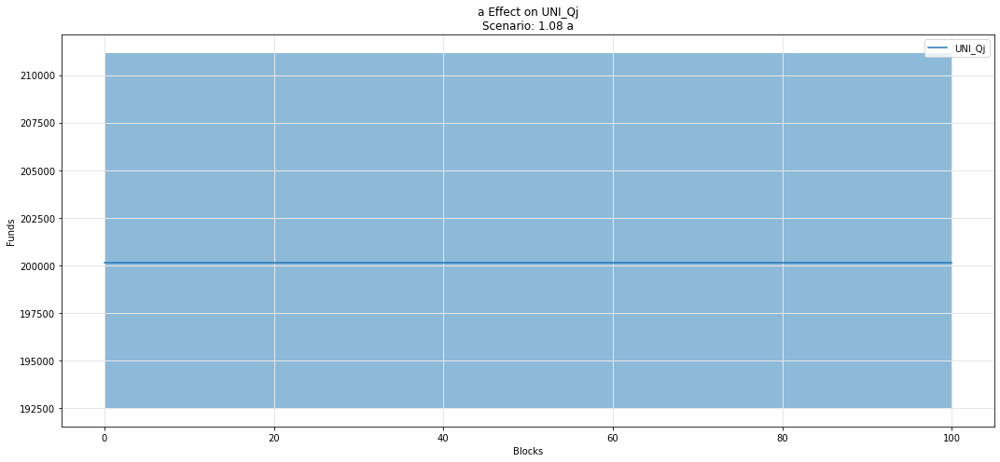

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

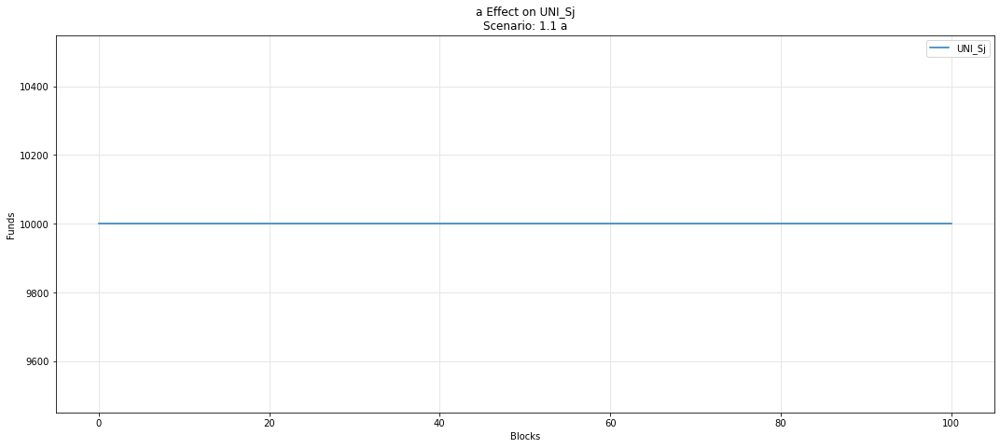

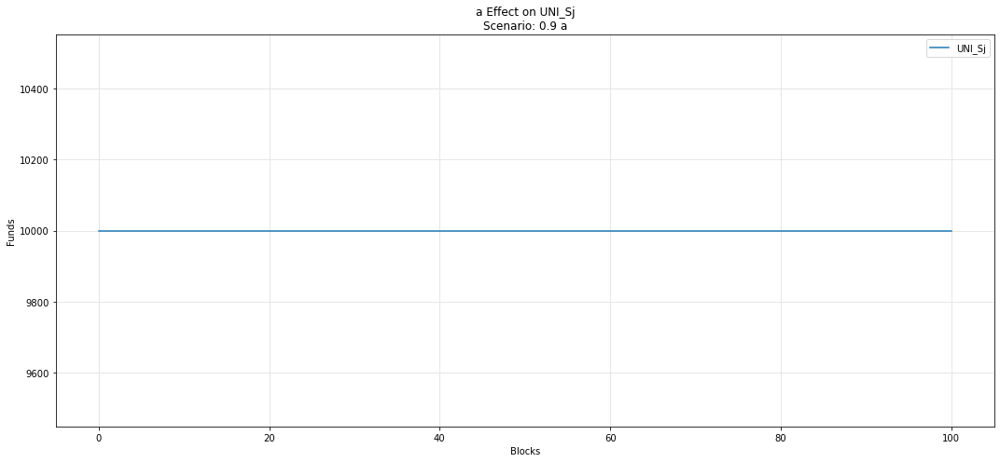

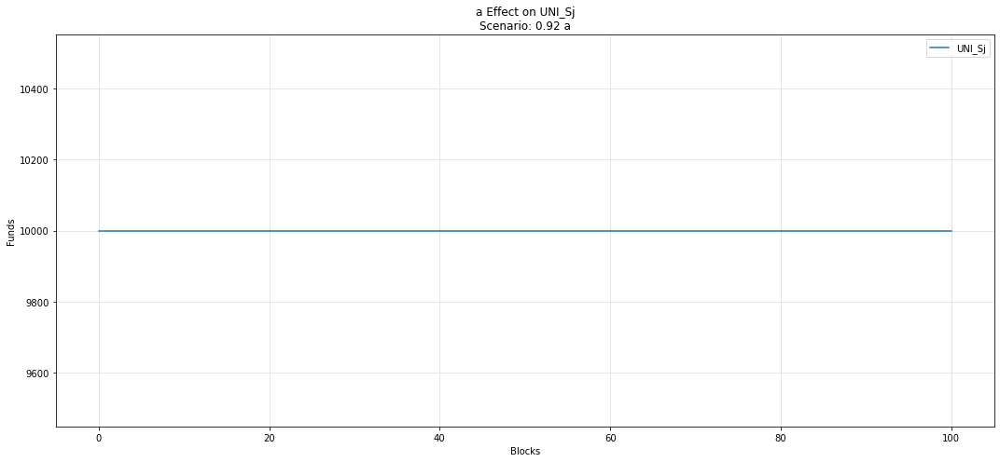

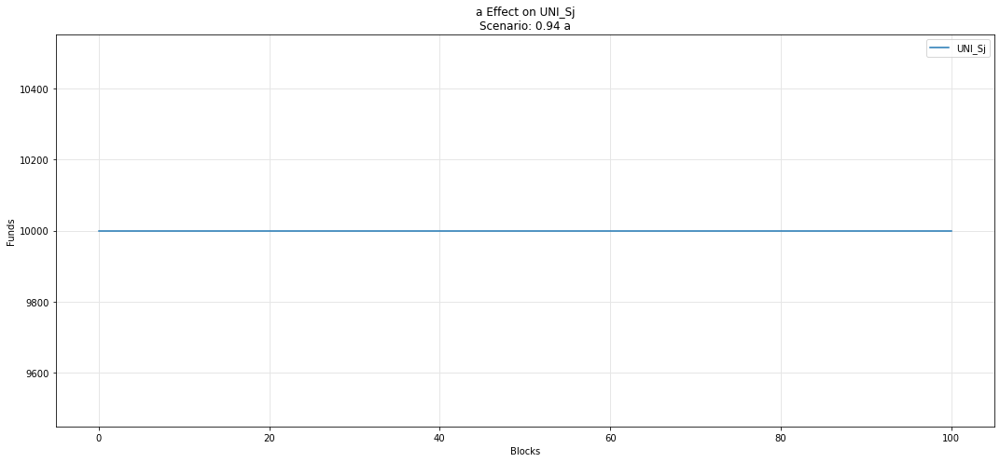

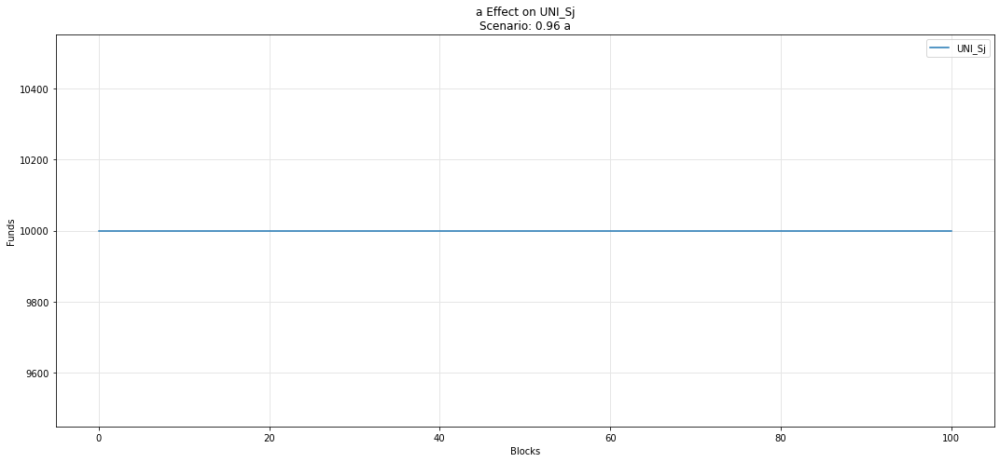

...

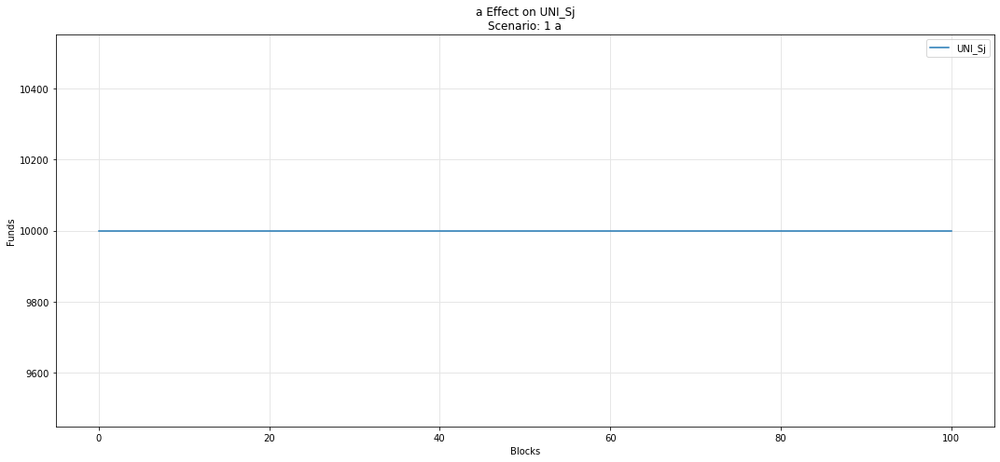

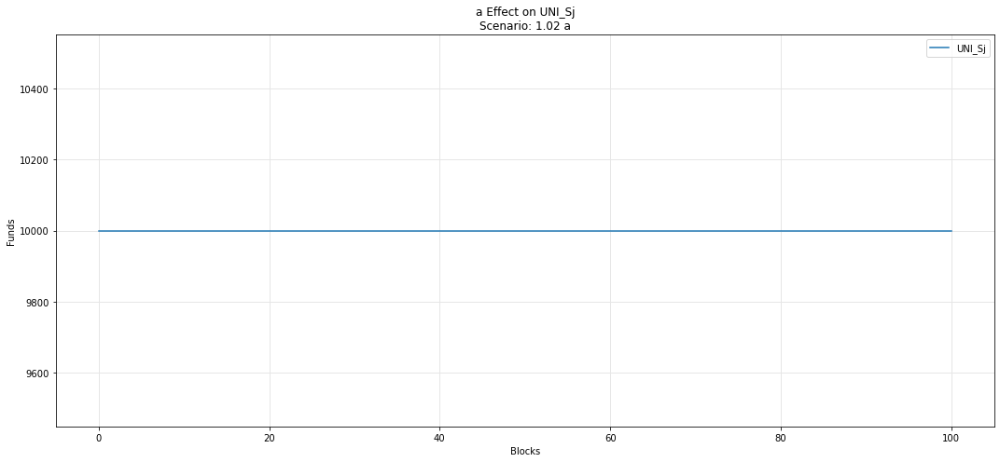

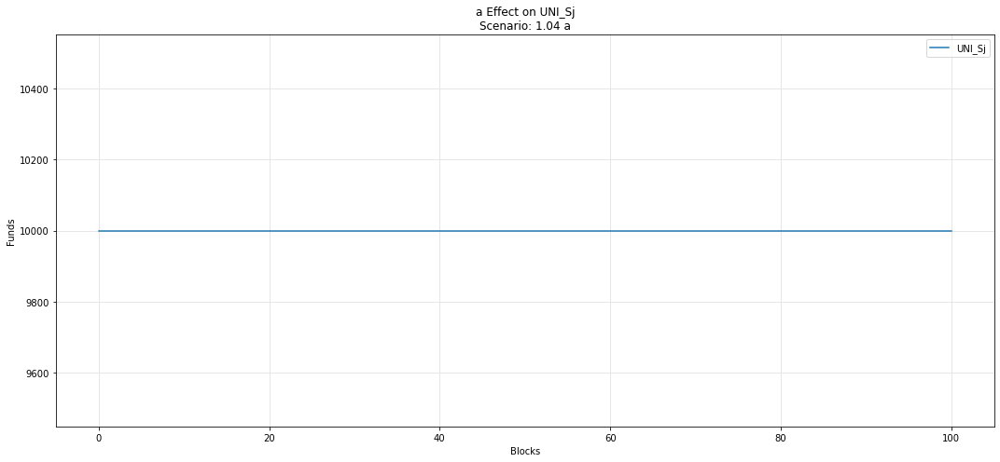

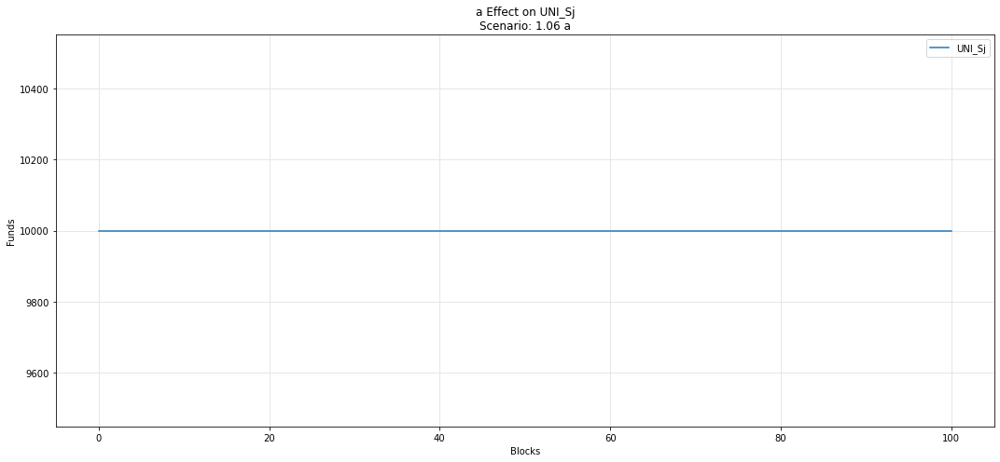

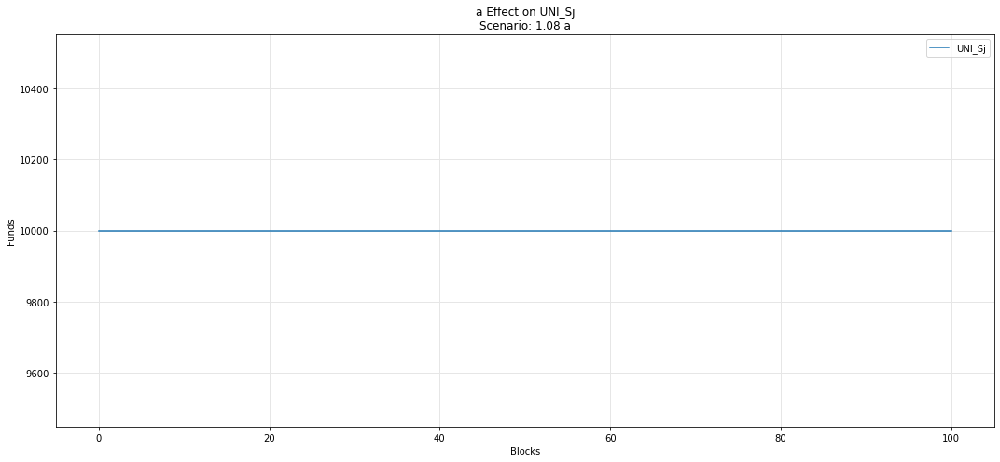

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

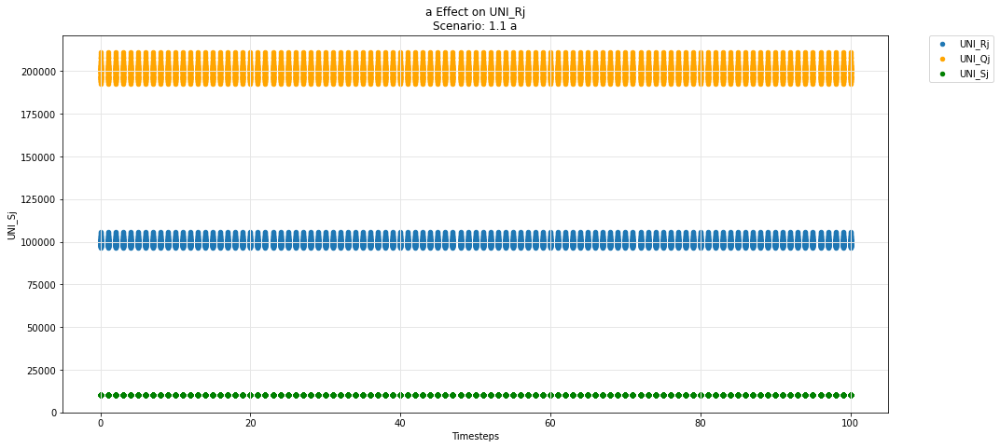

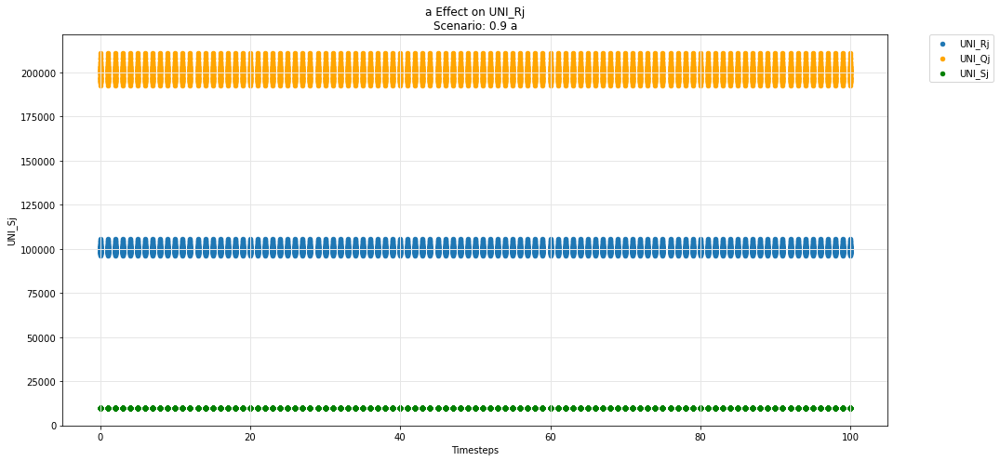

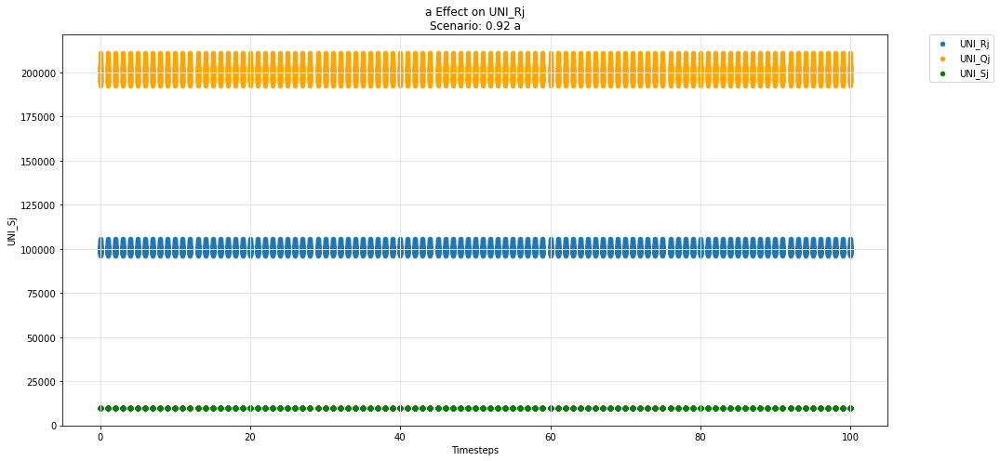

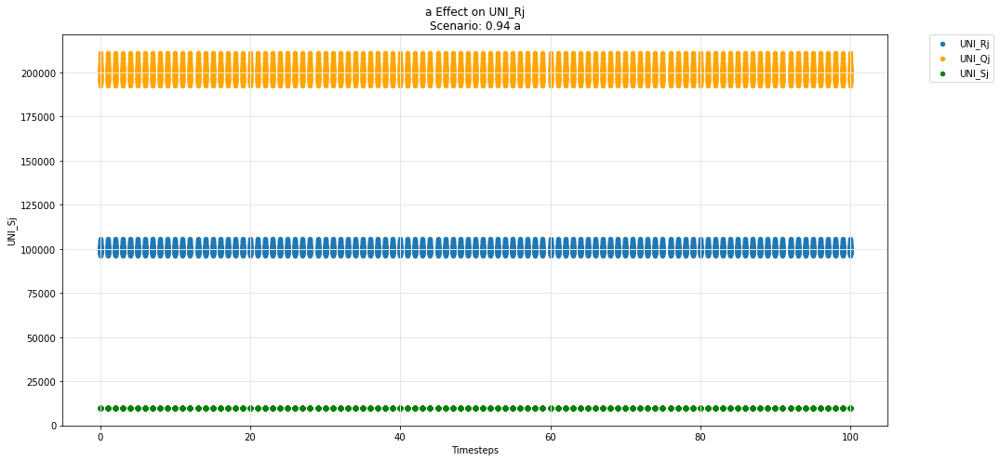

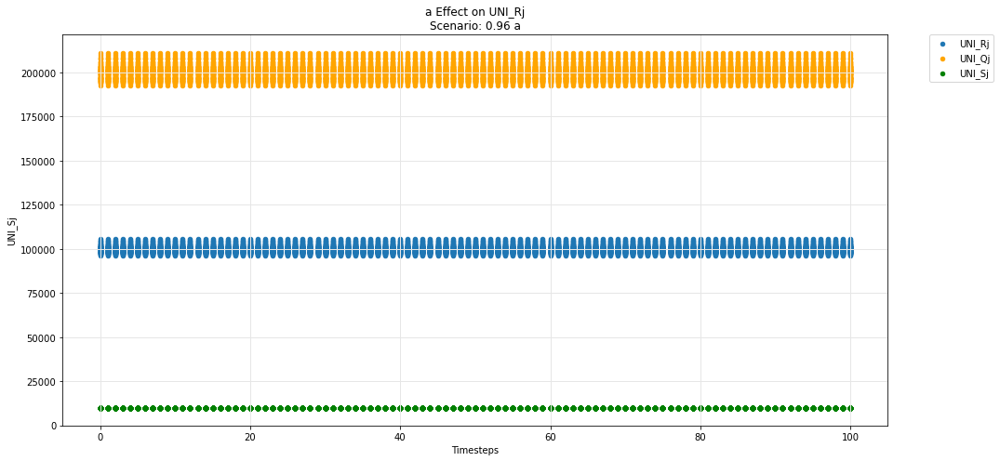

...

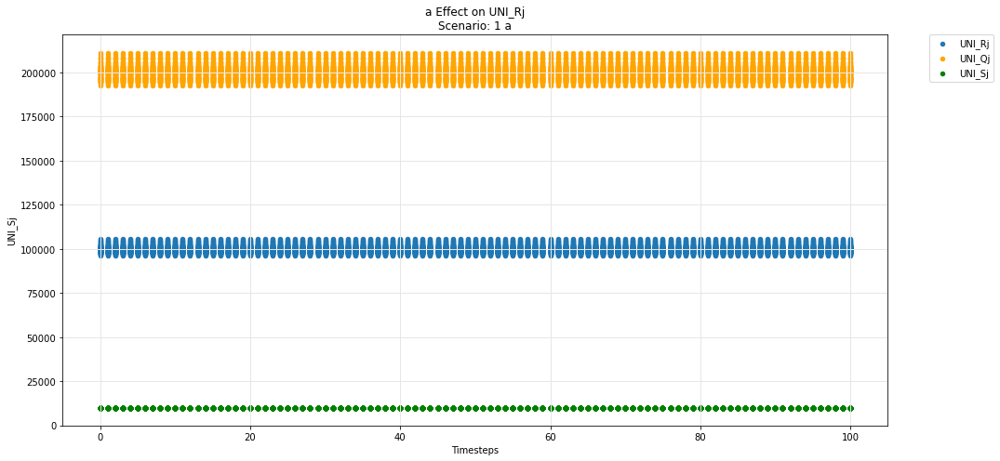

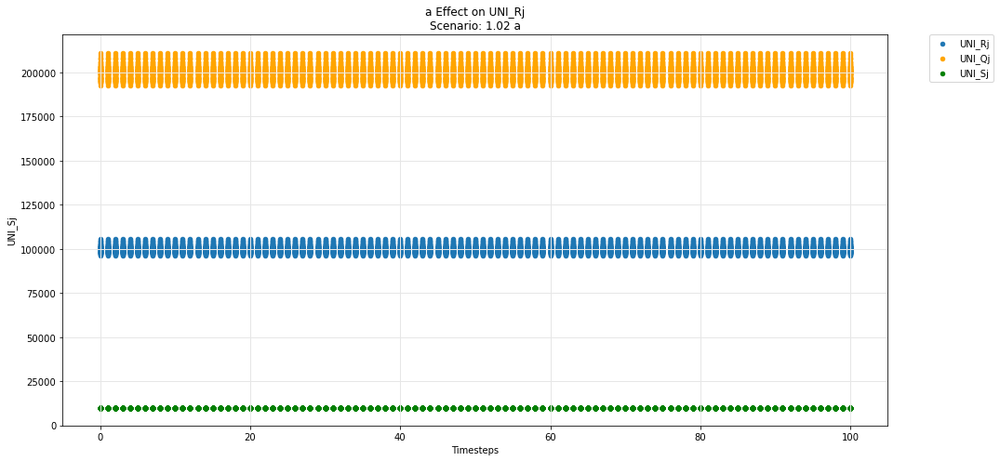

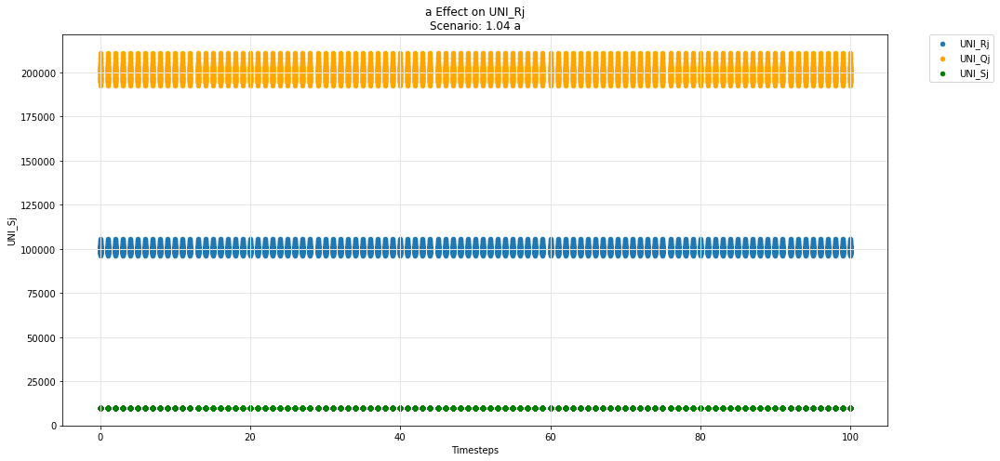

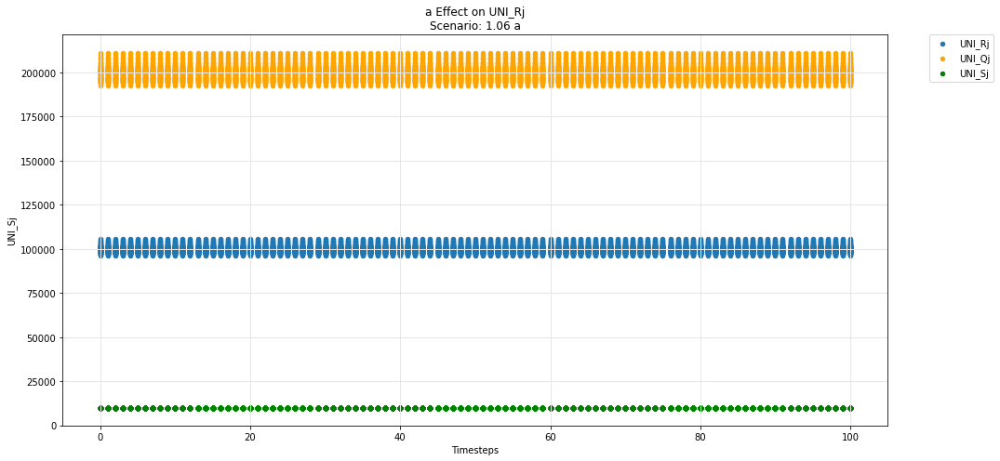

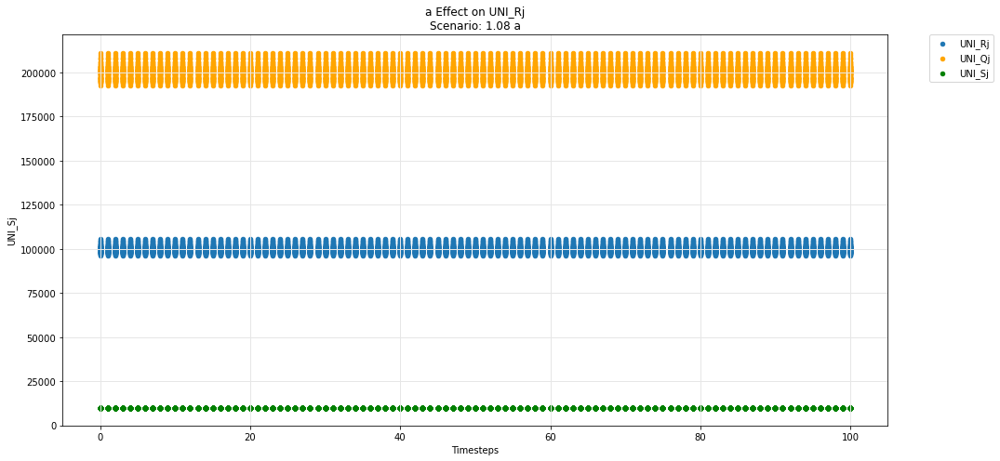

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

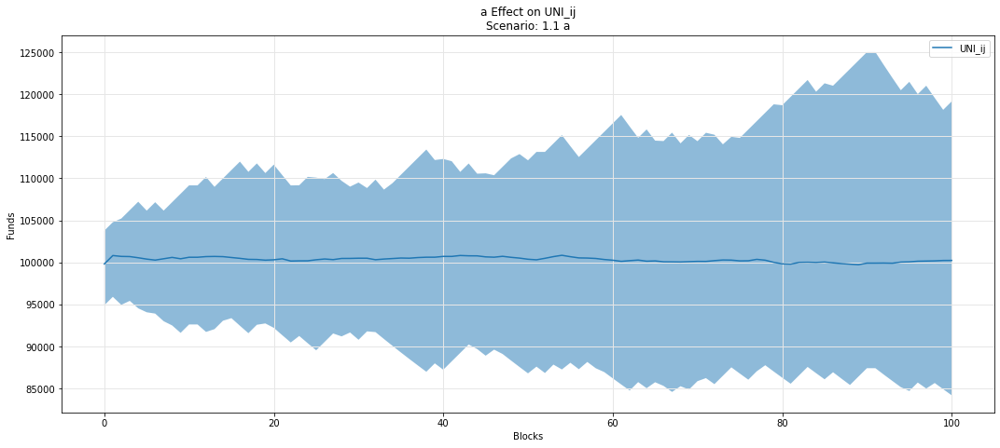

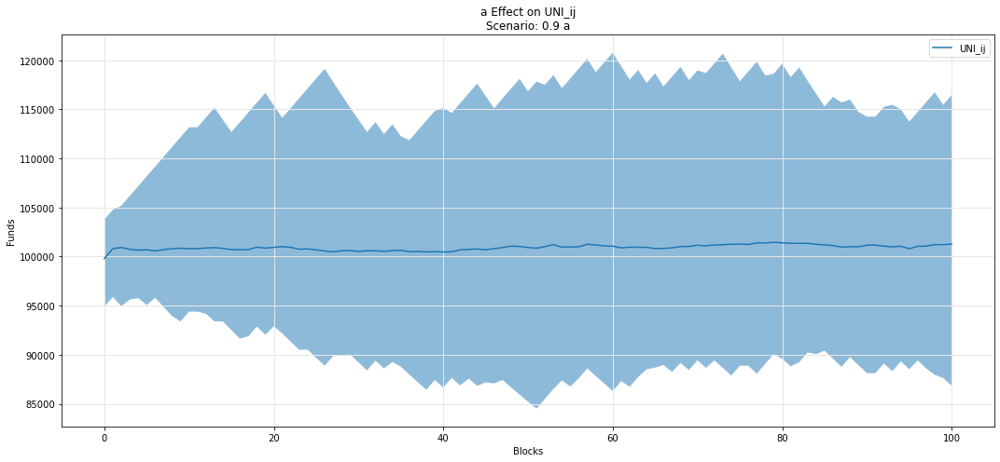

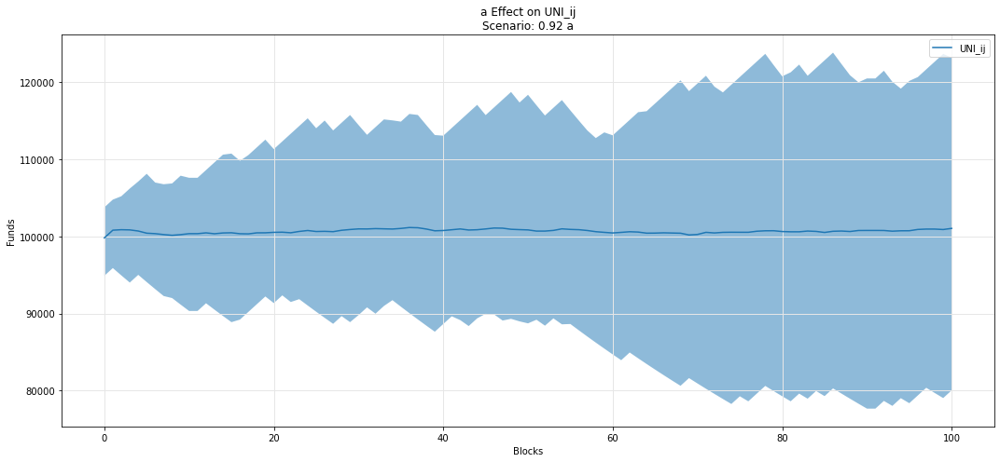

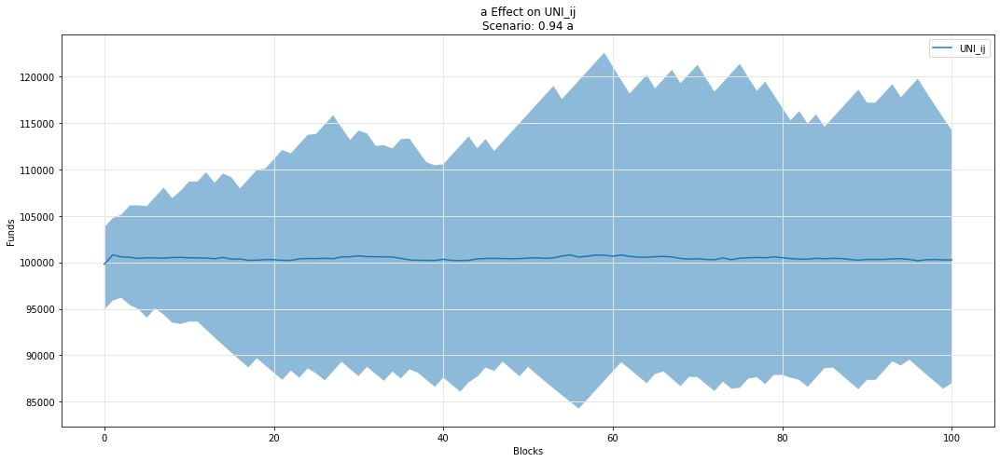

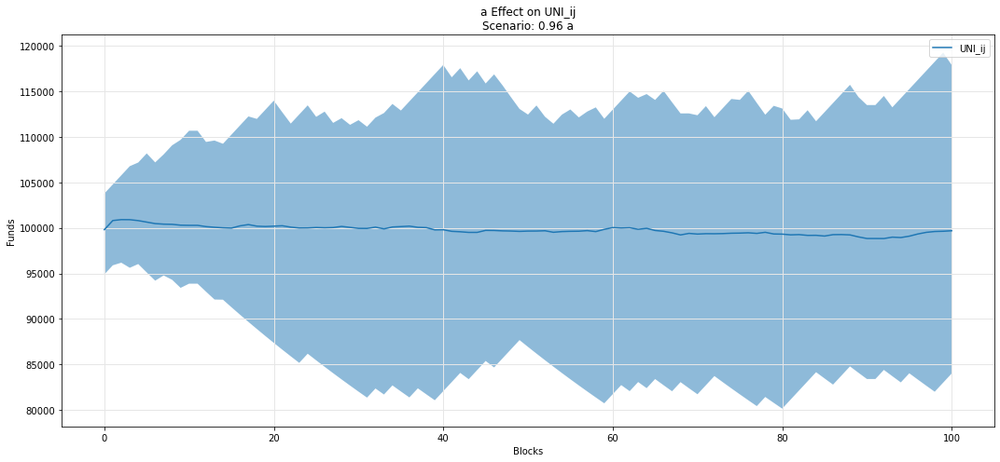

...

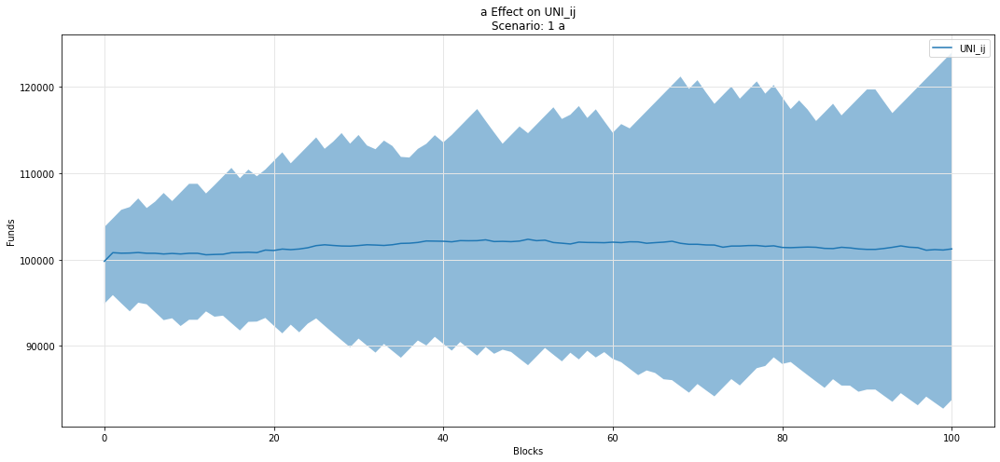

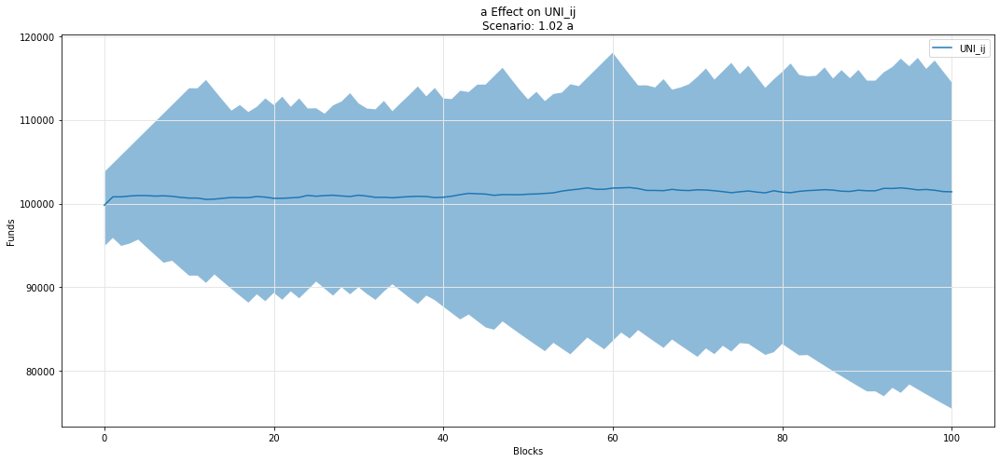

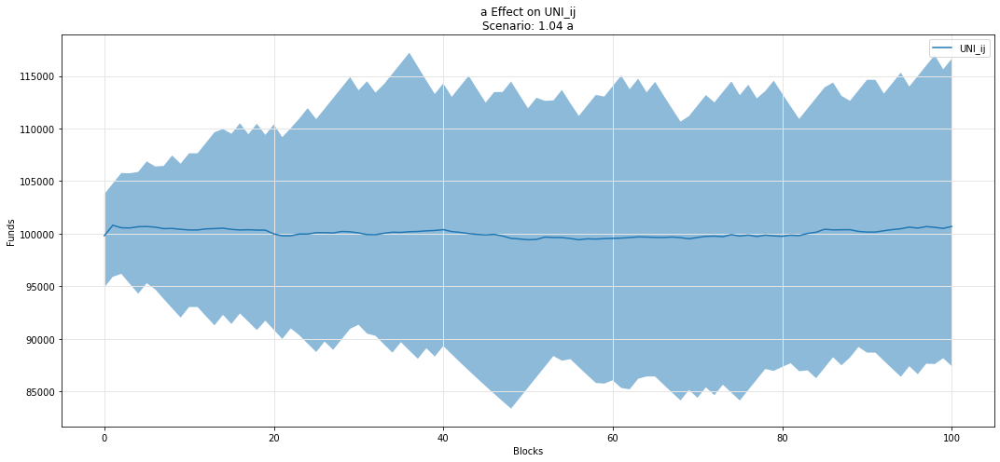

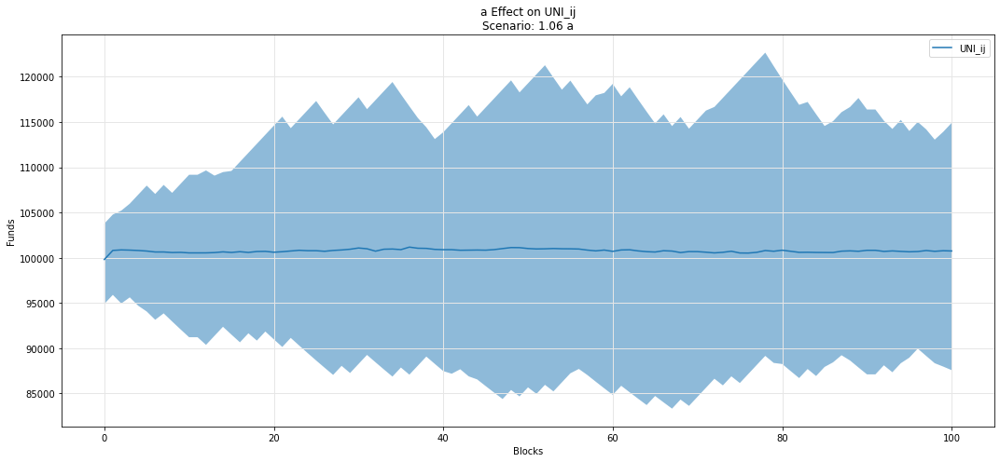

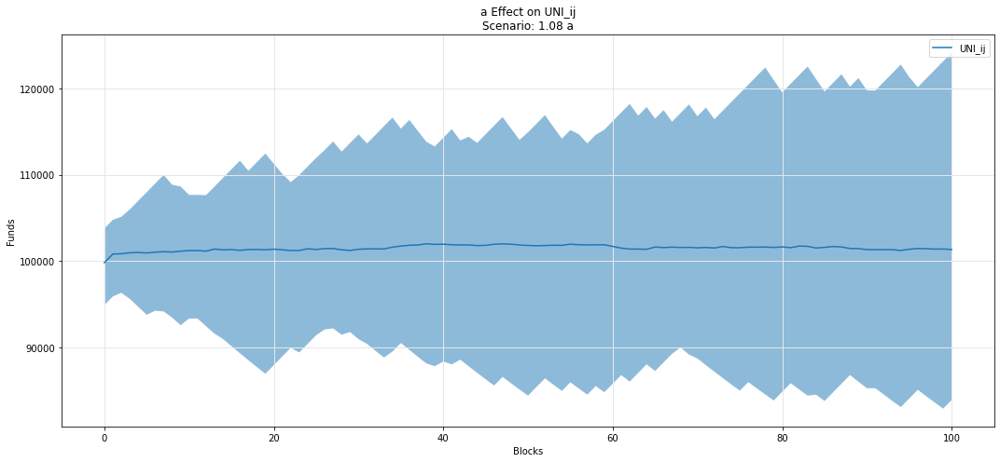

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

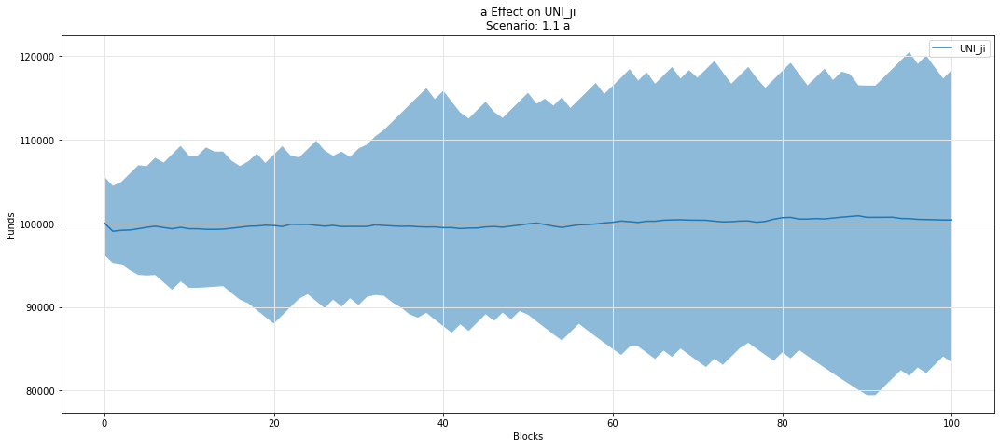

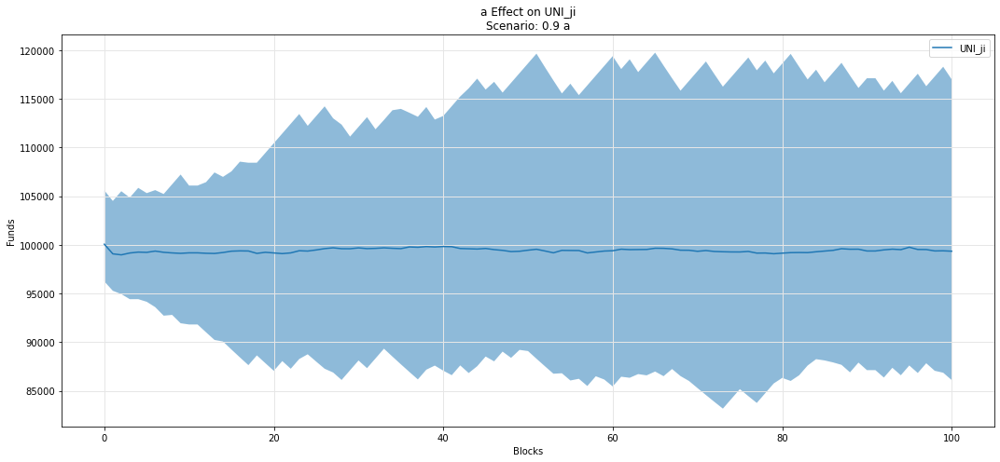

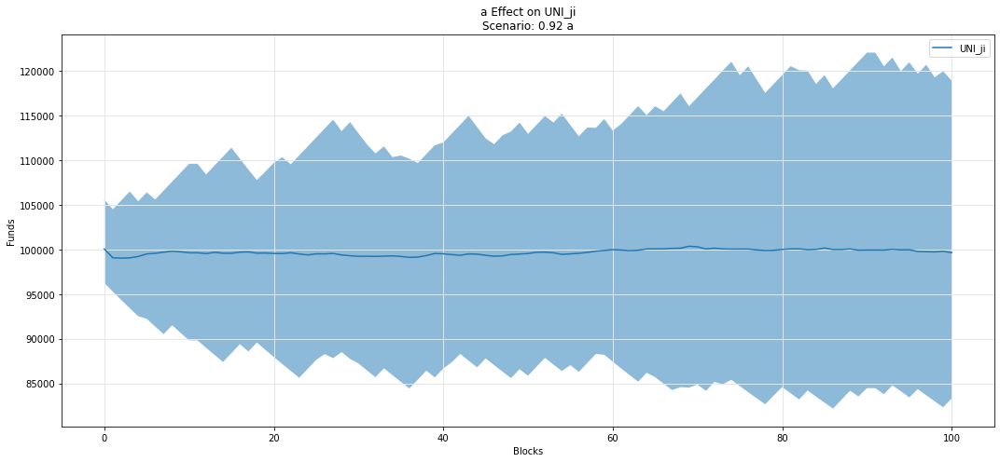

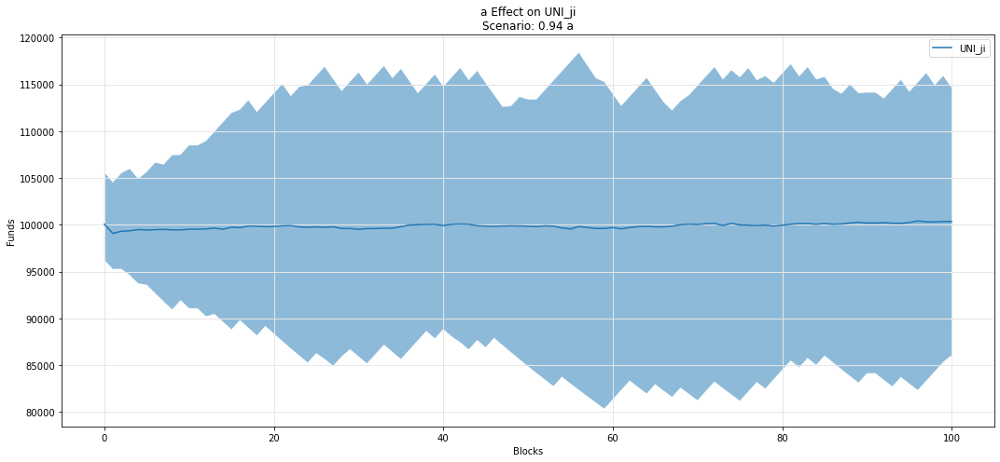

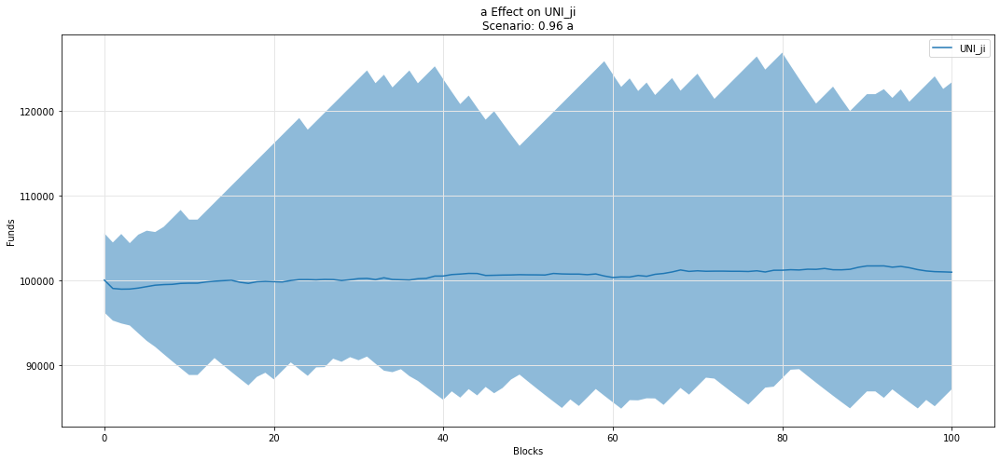

...

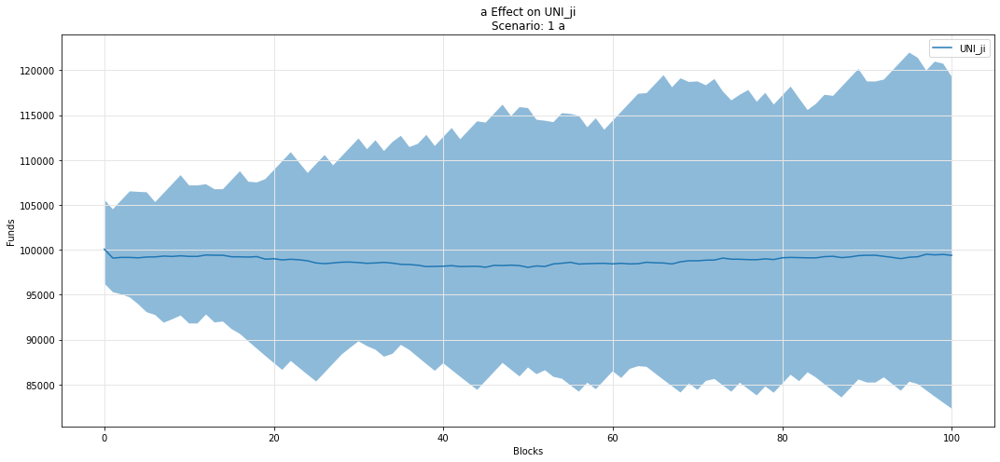

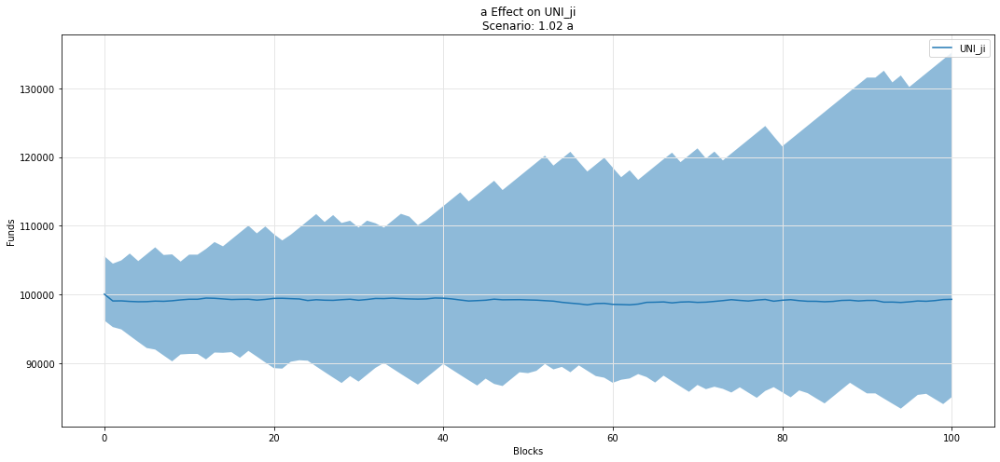

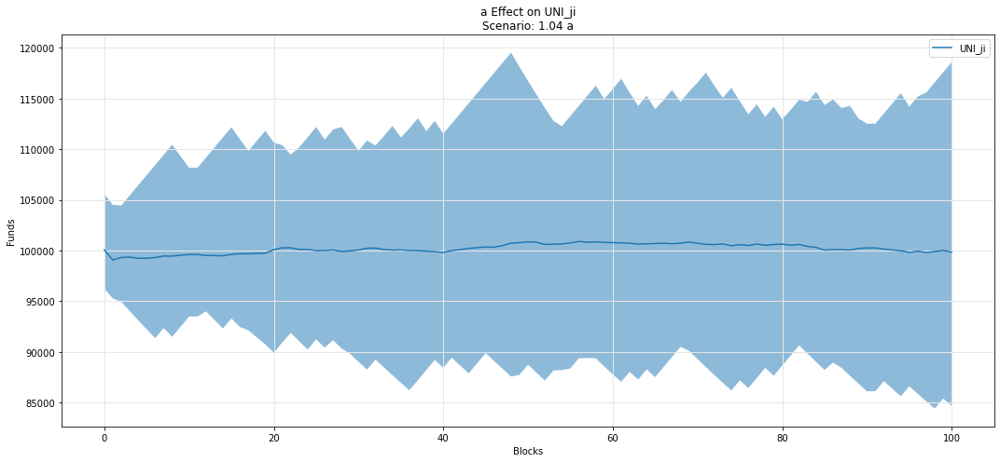

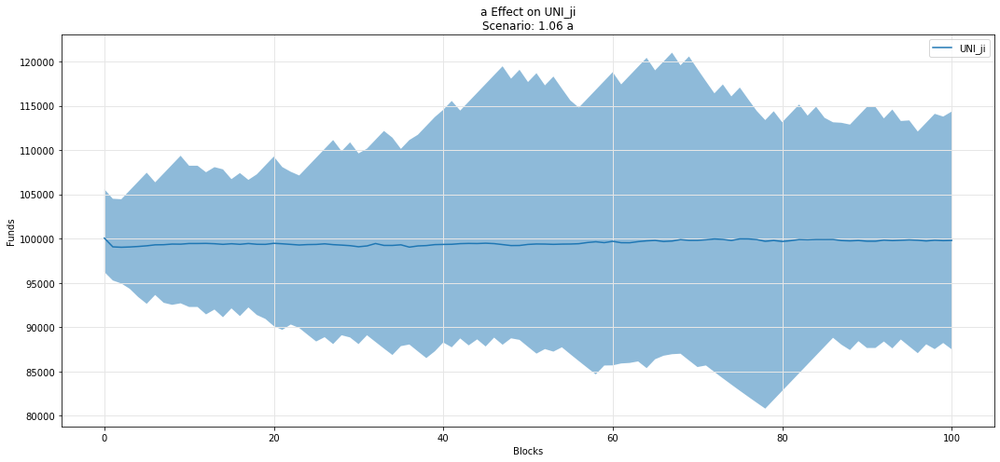

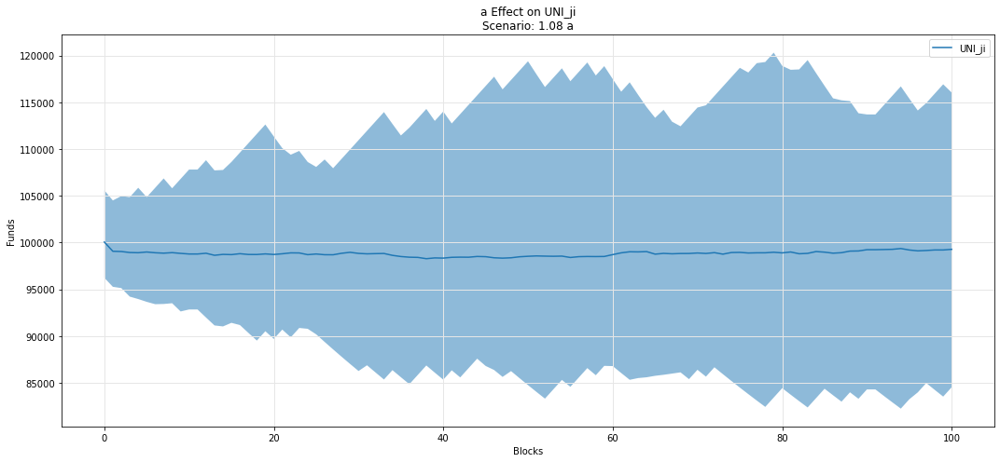

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

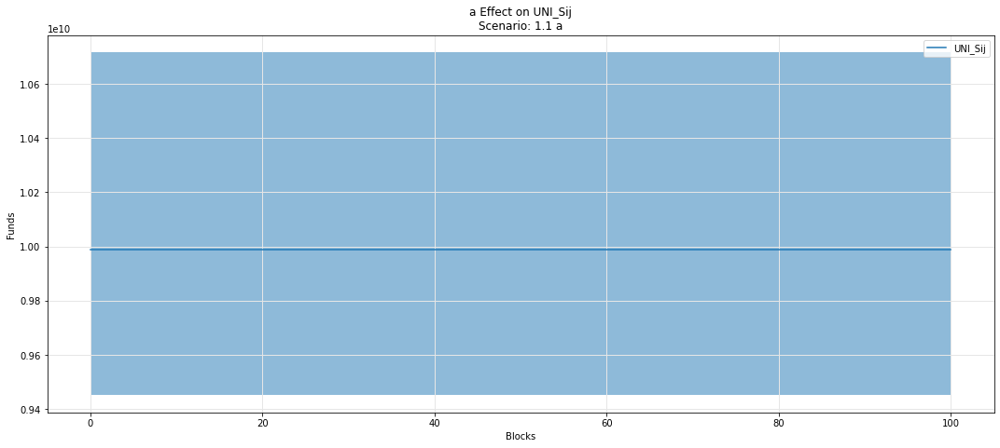

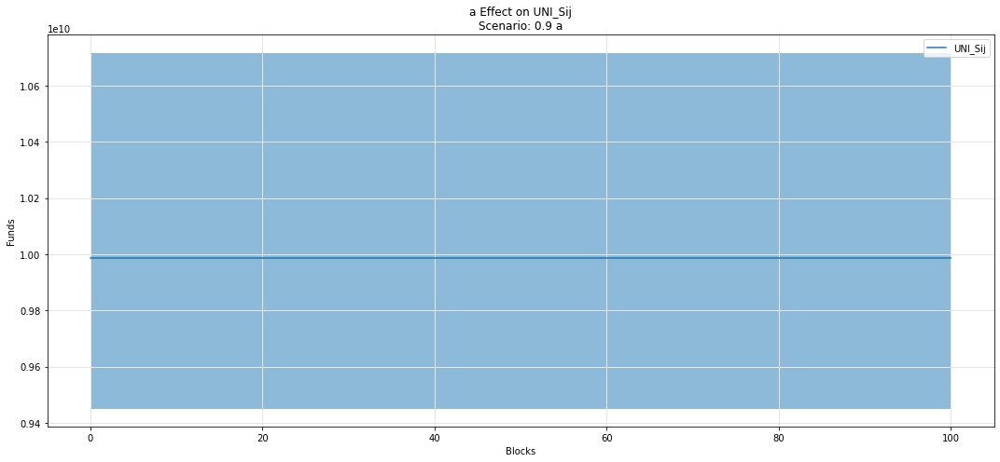

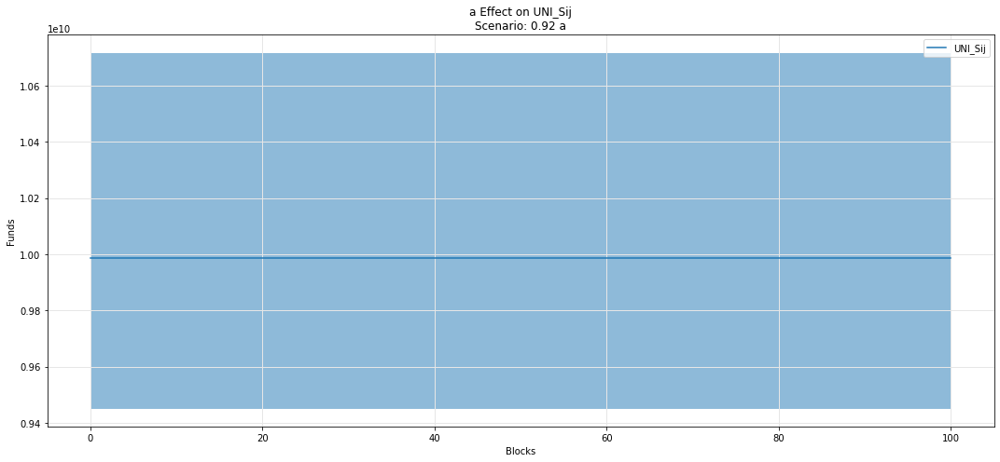

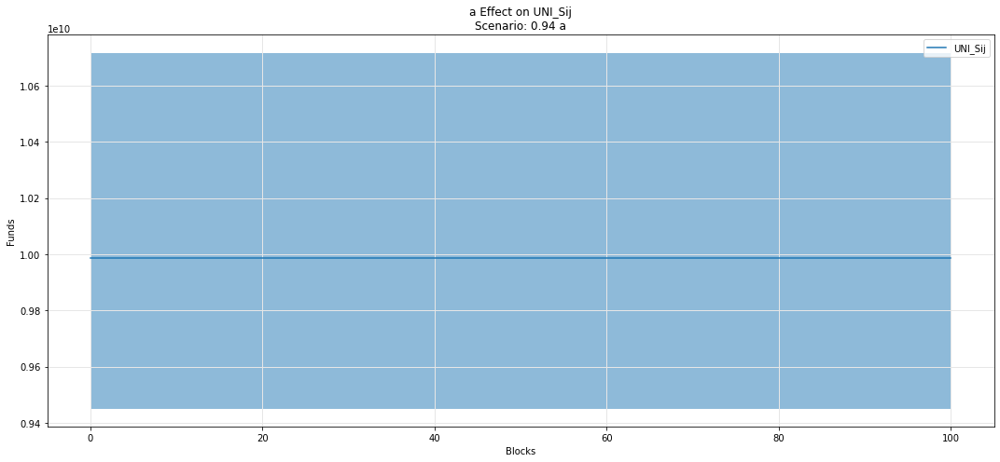

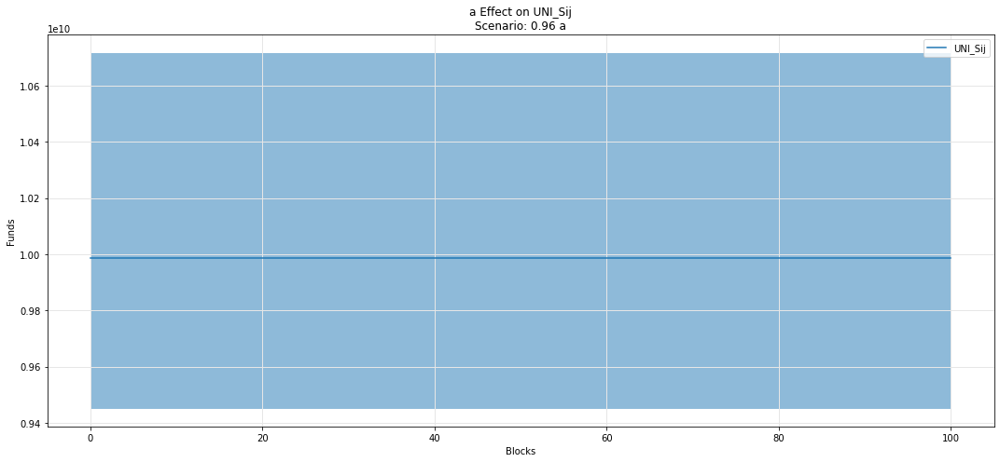

...

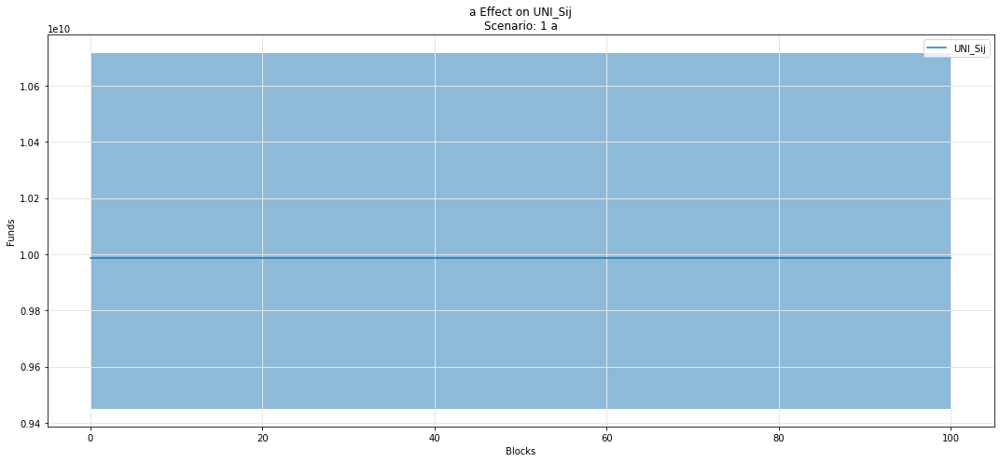

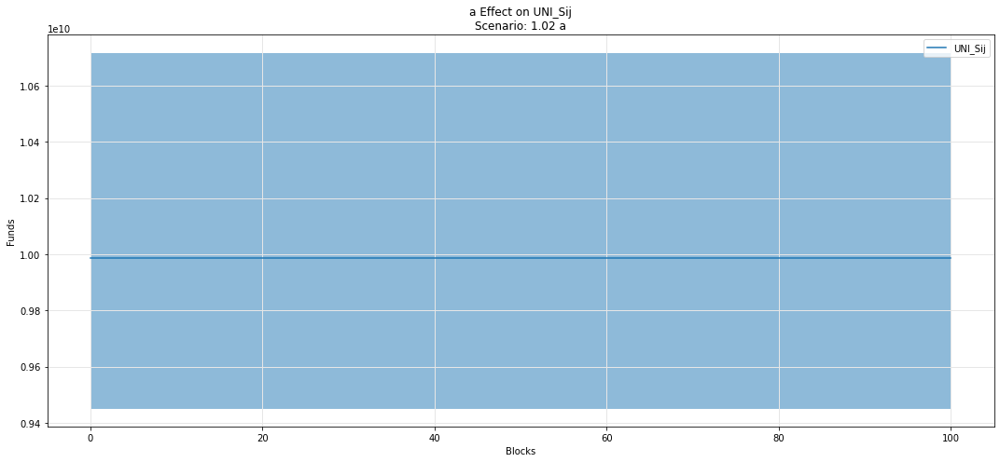

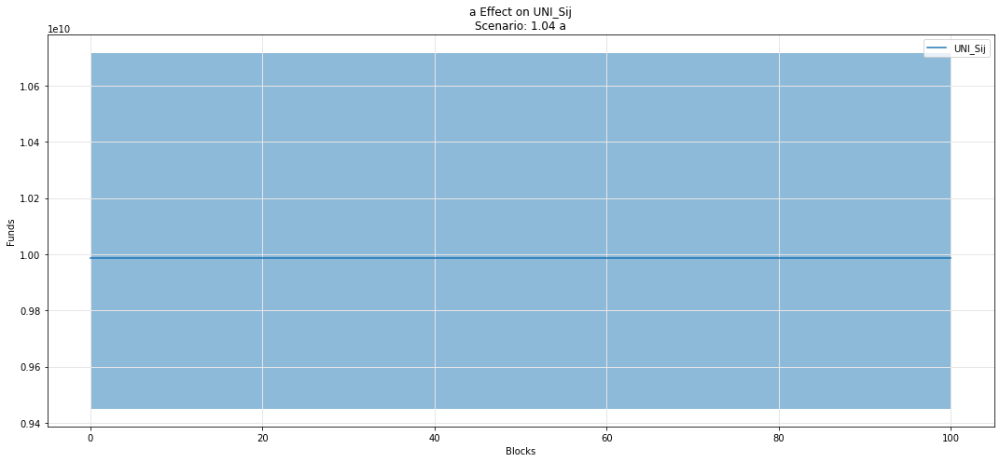

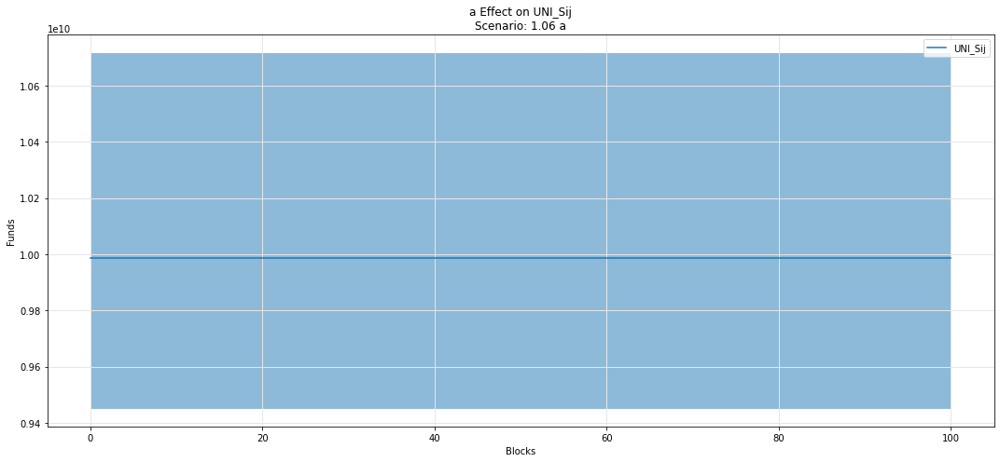

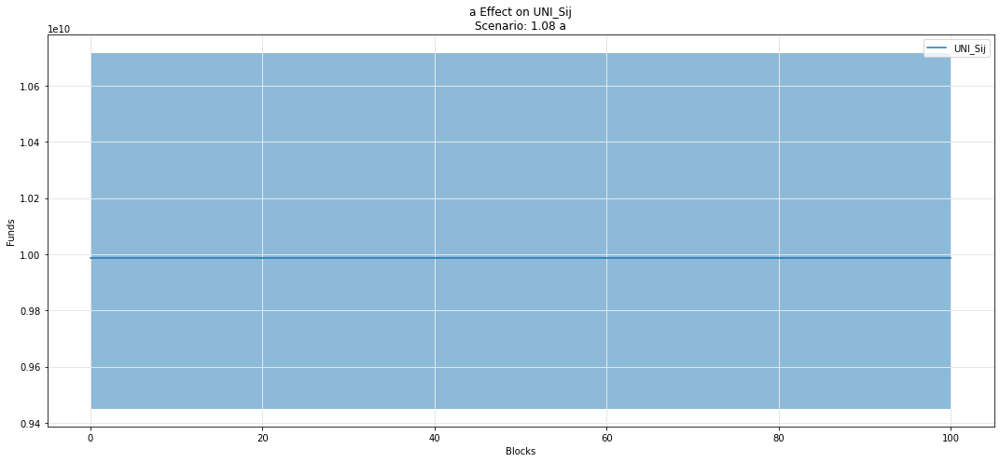

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

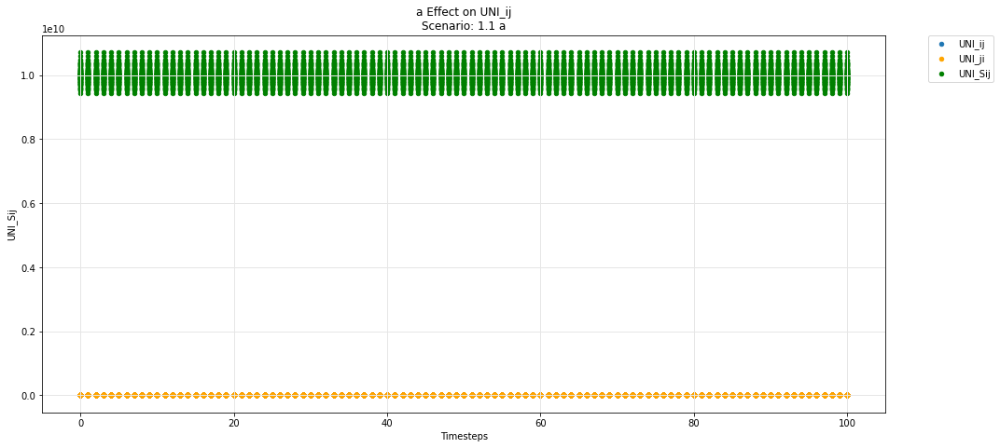

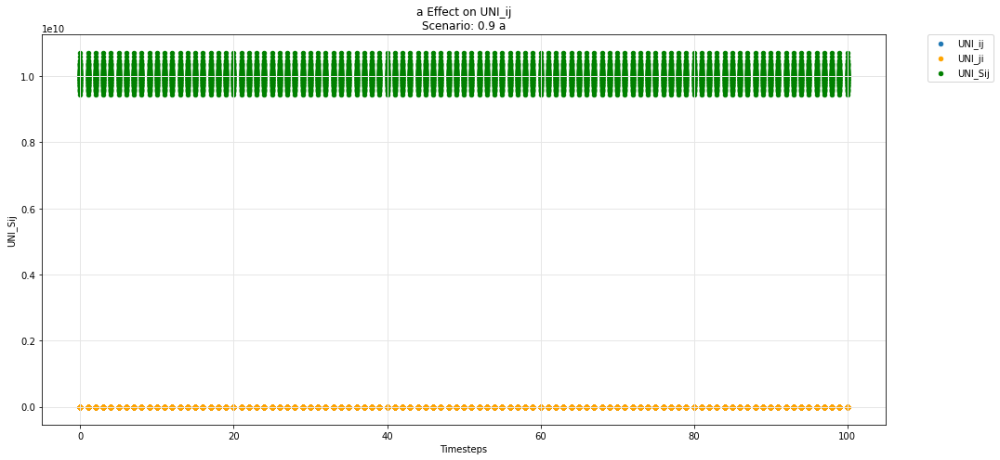

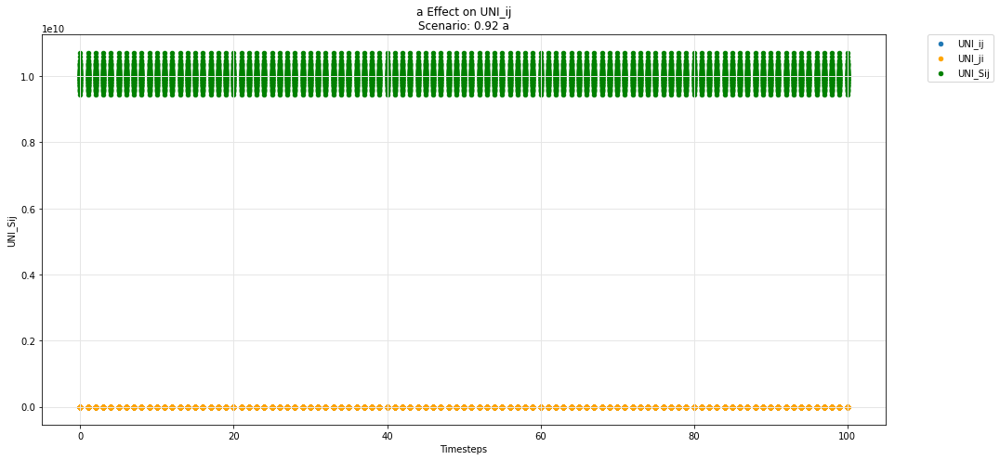

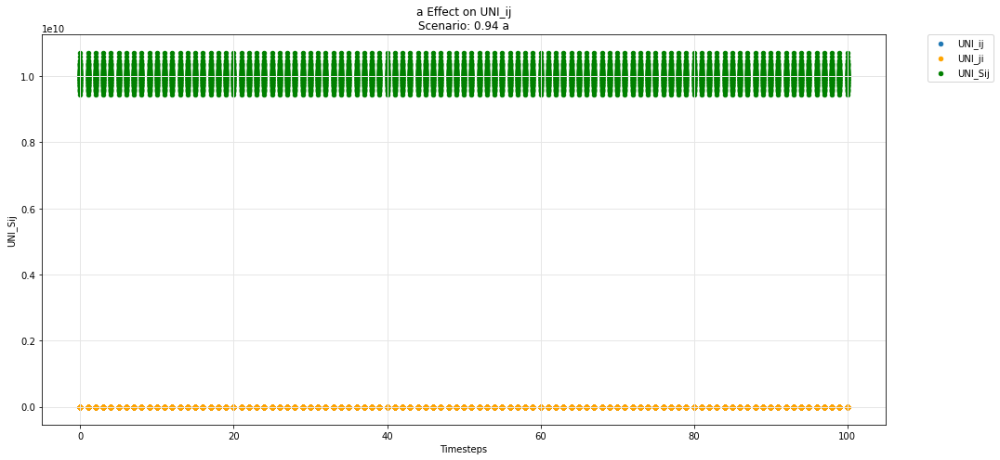

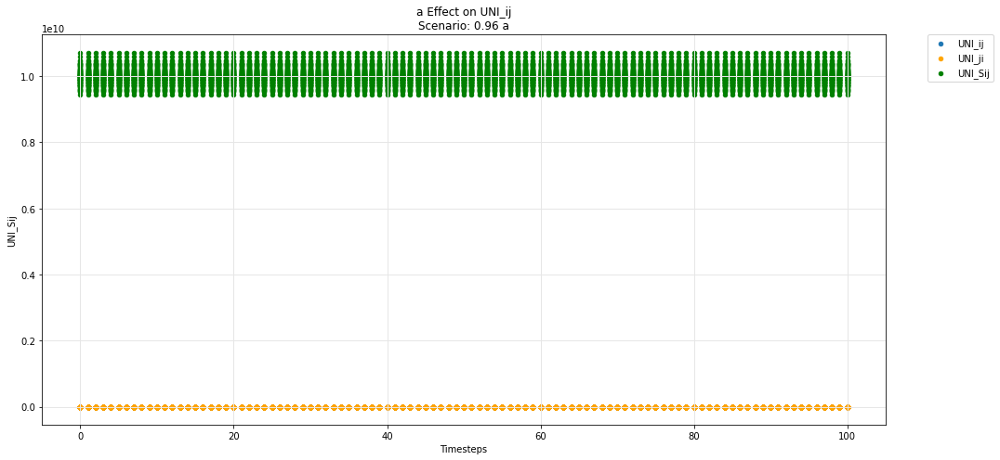

...

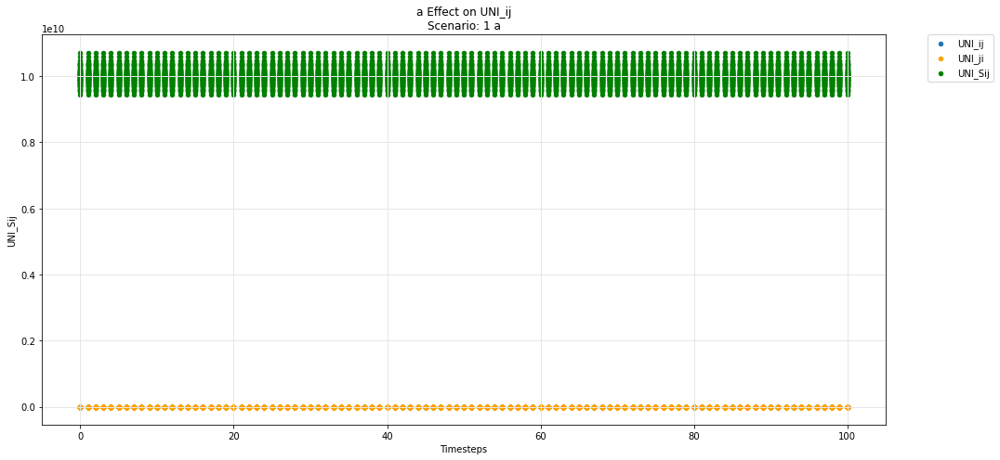

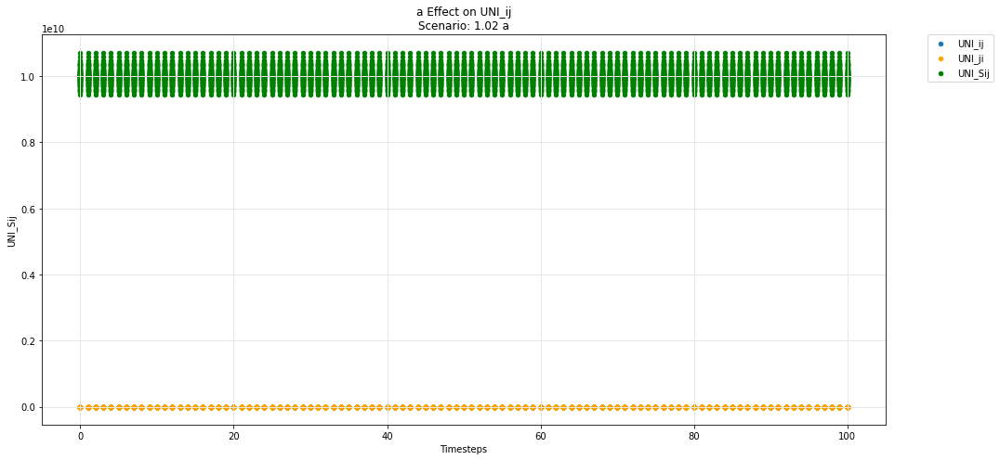

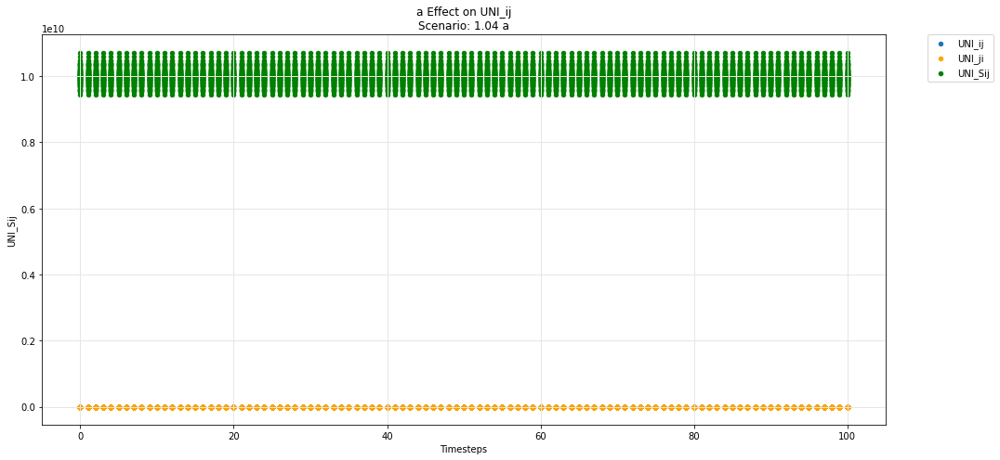

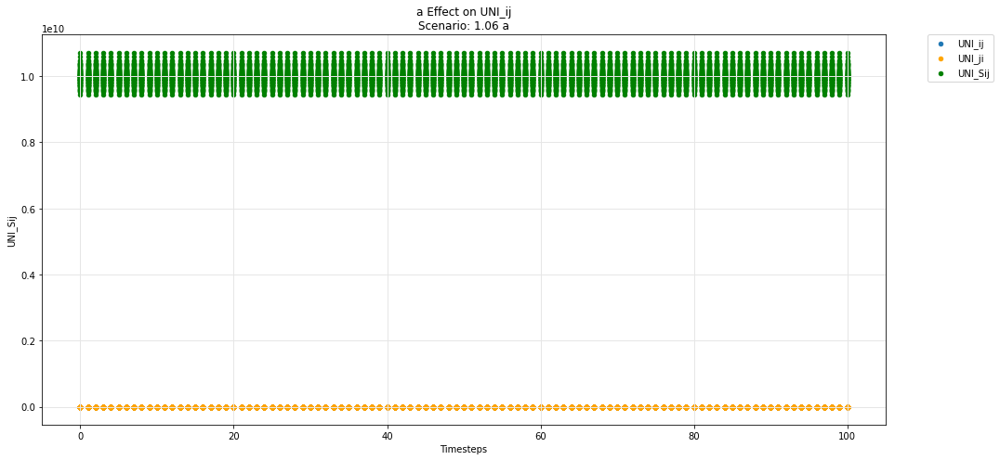

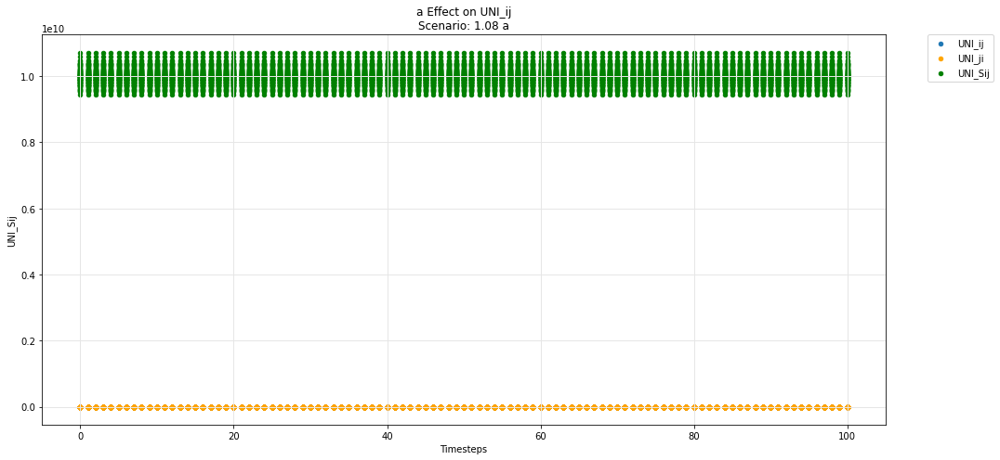

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

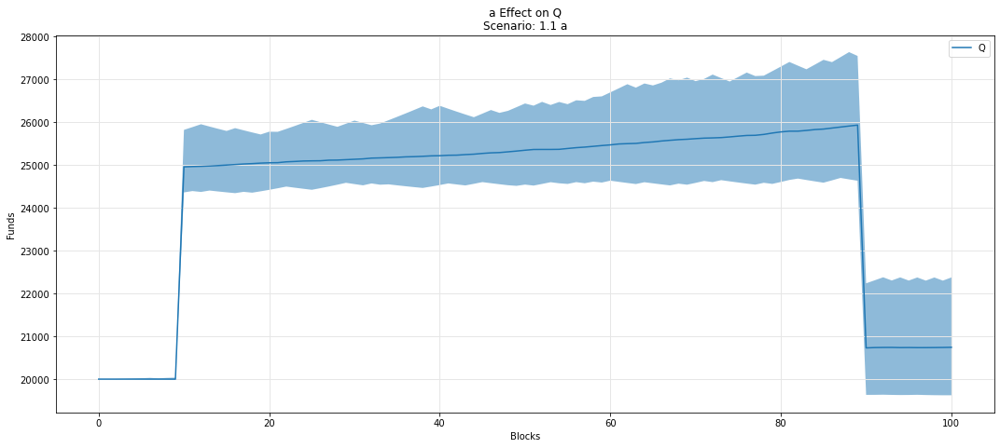

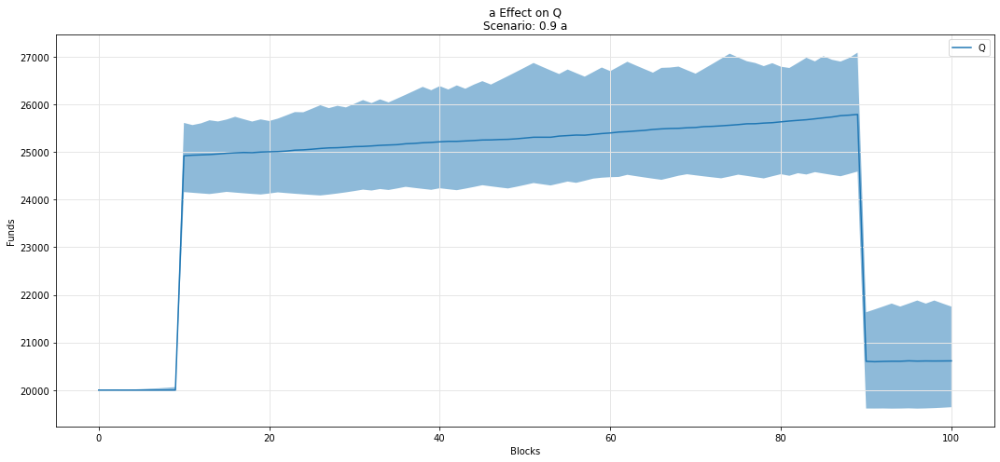

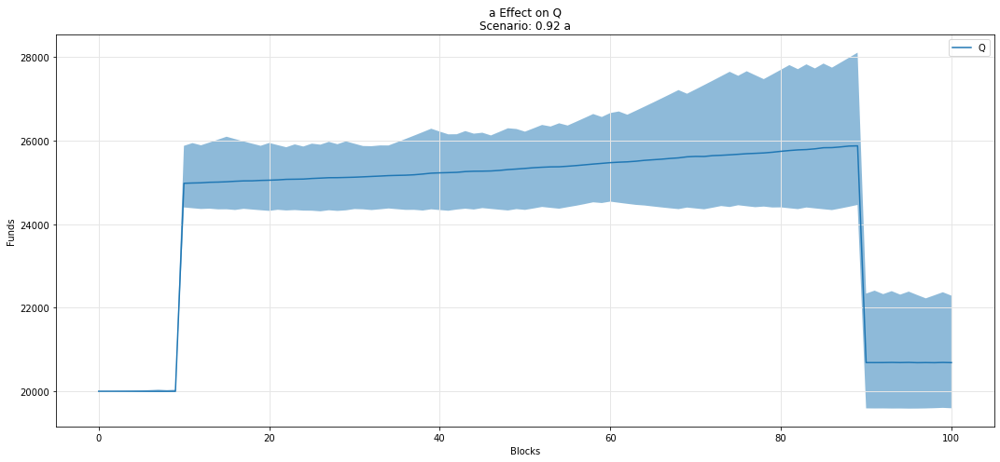

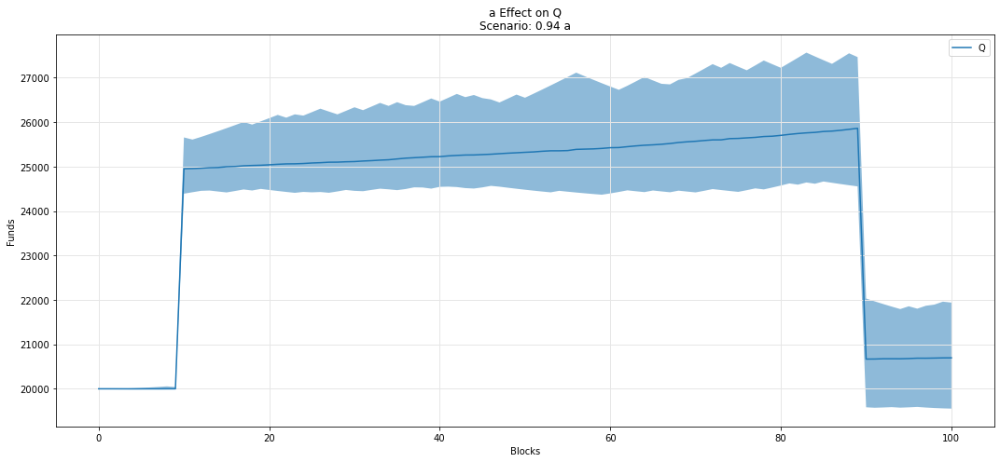

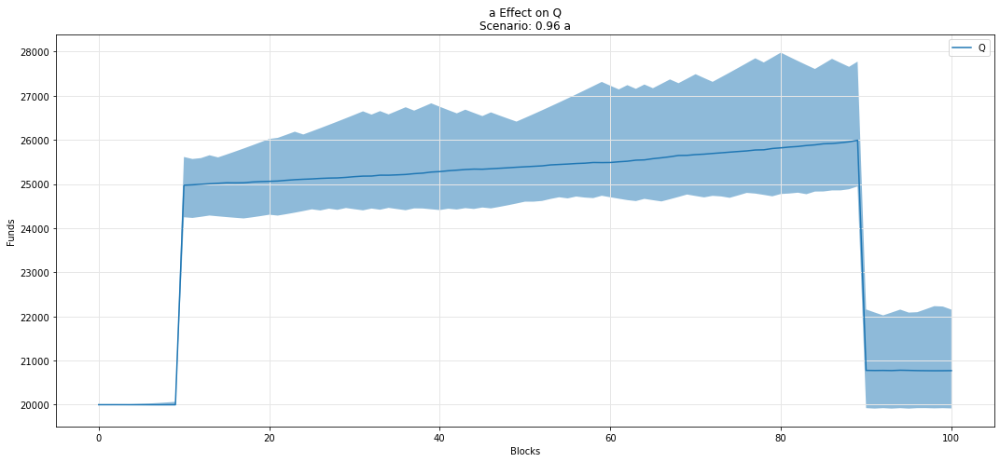

...

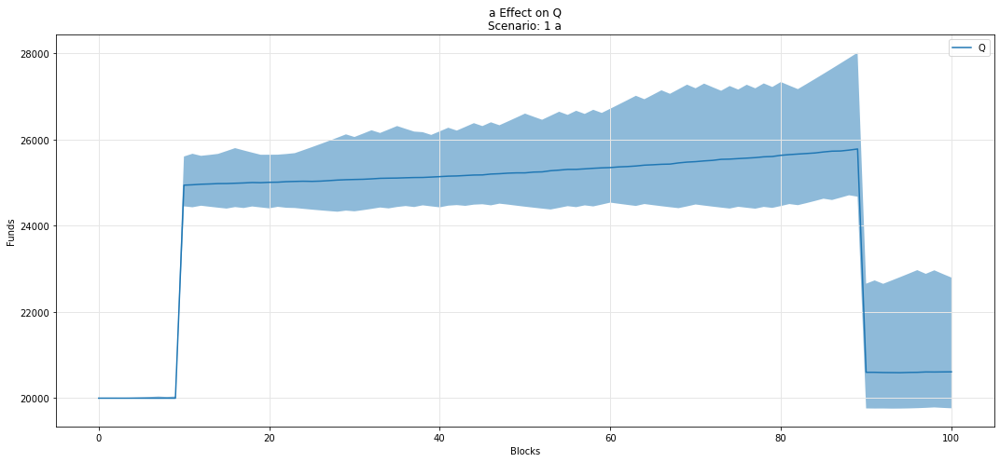

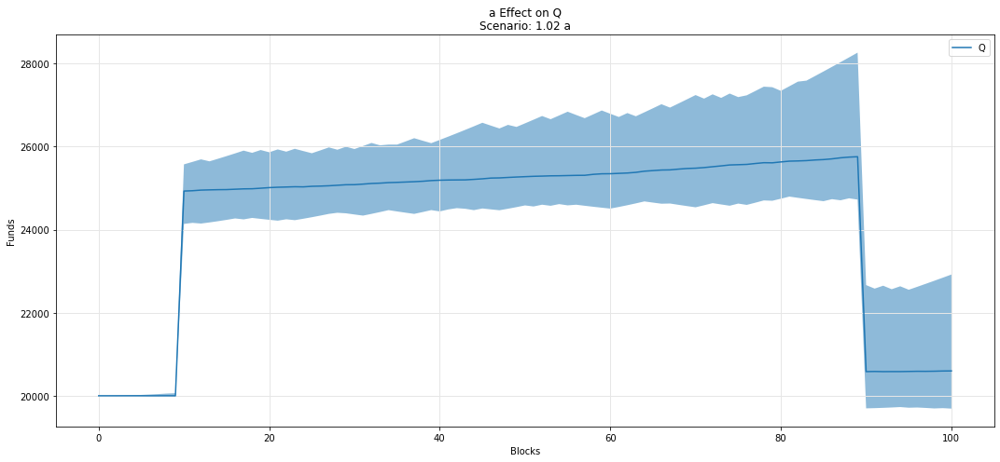

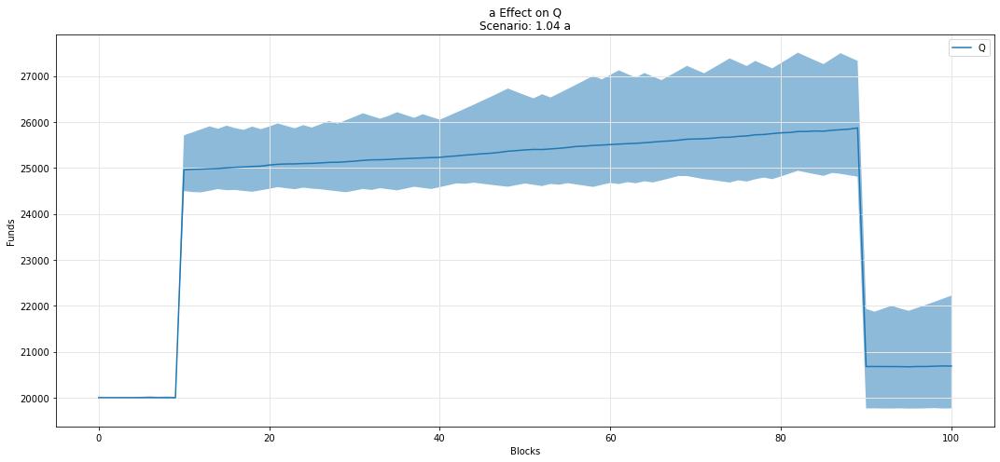

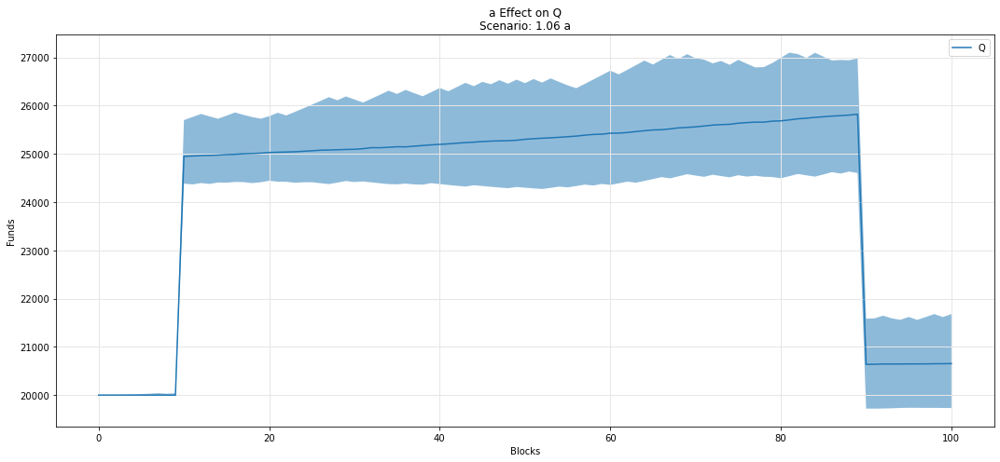

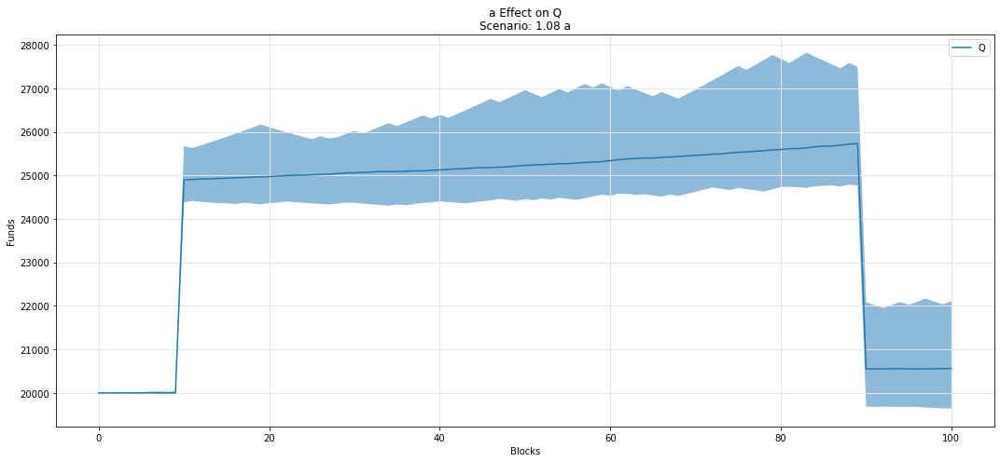

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

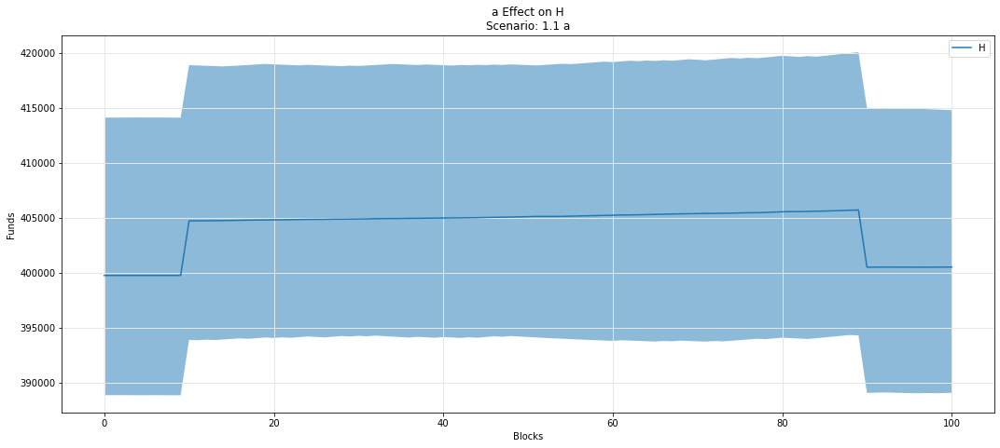

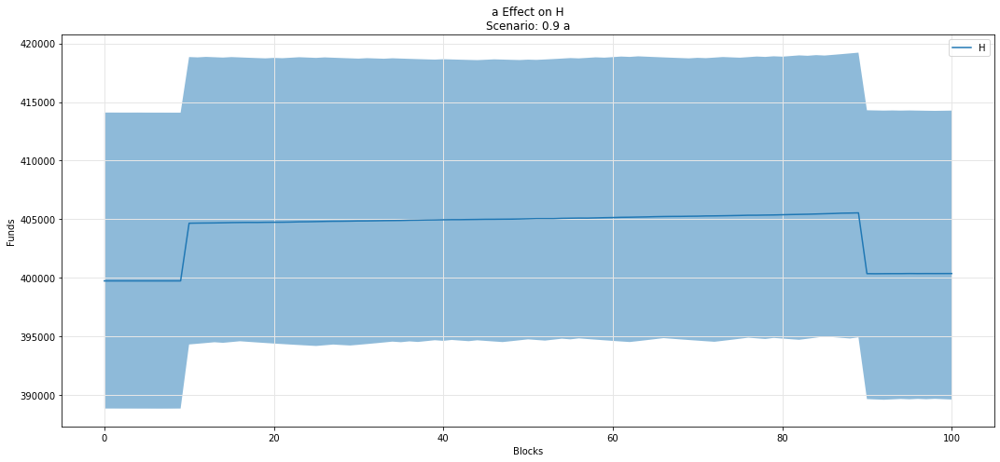

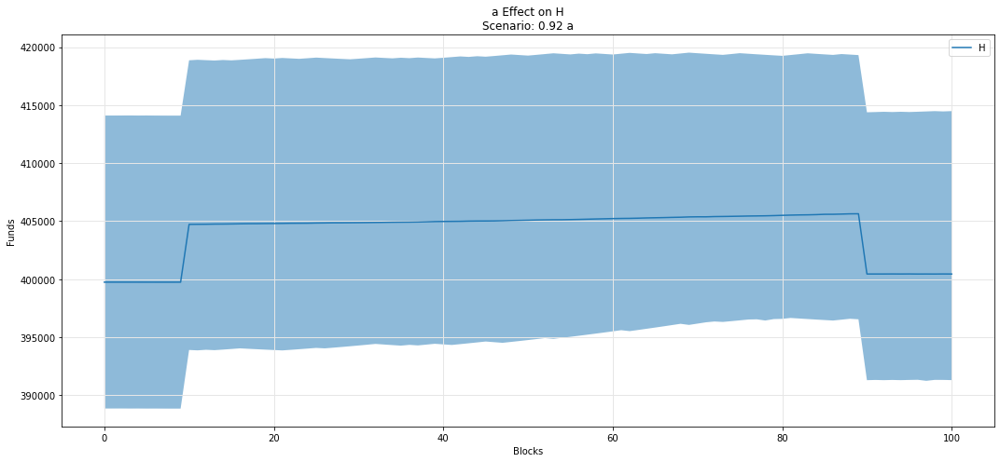

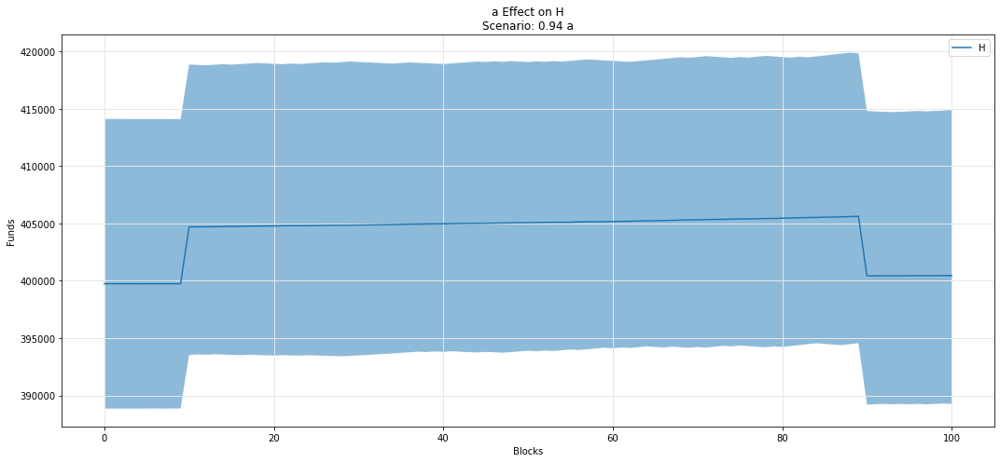

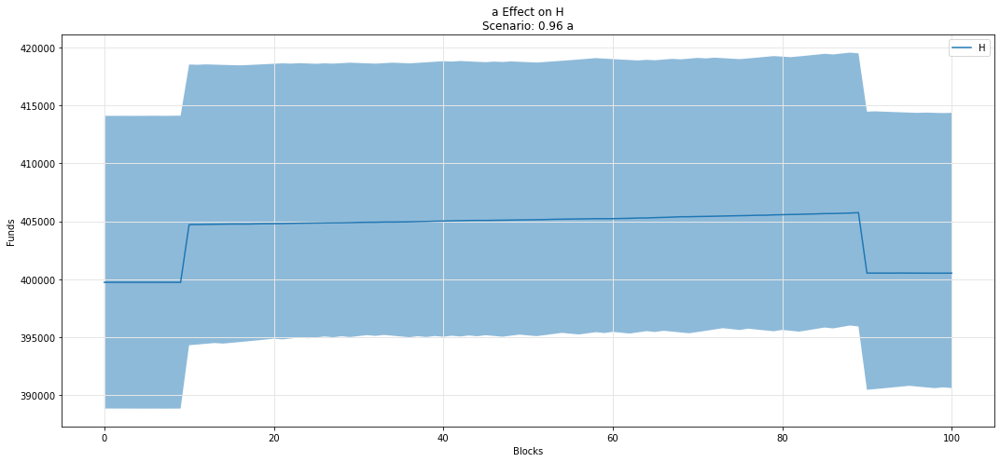

...

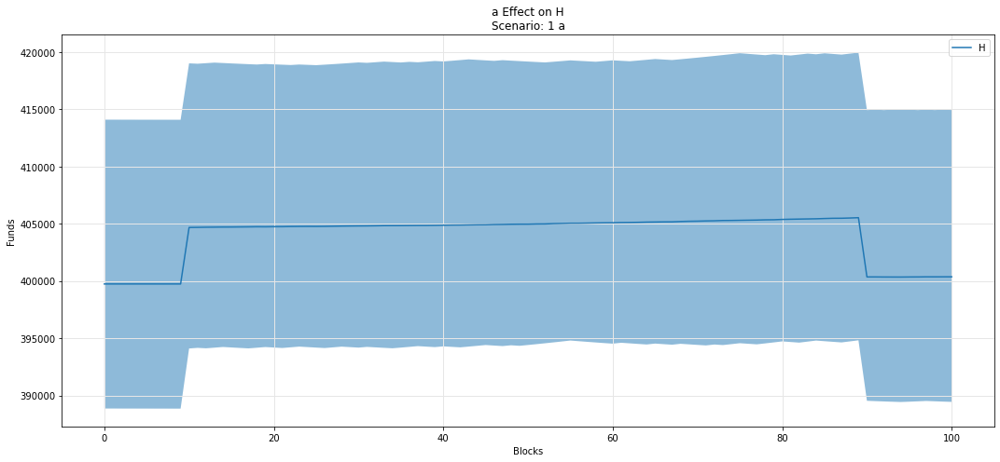

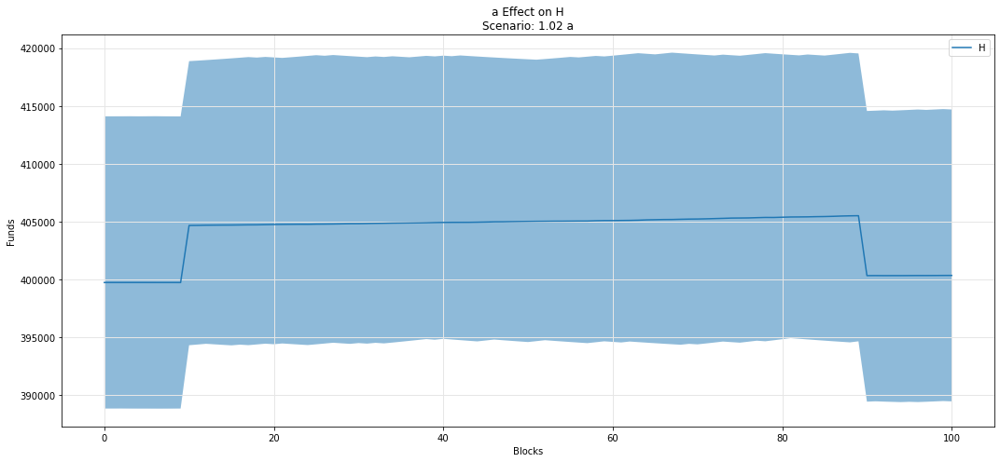

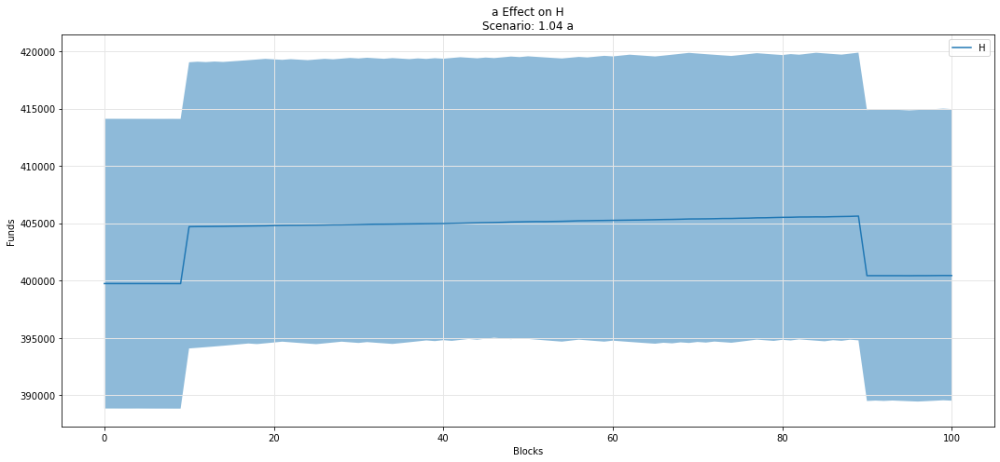

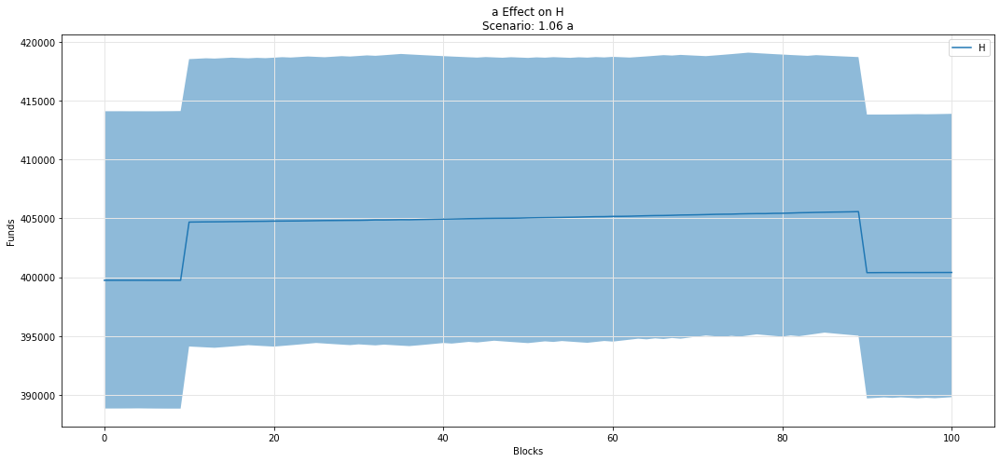

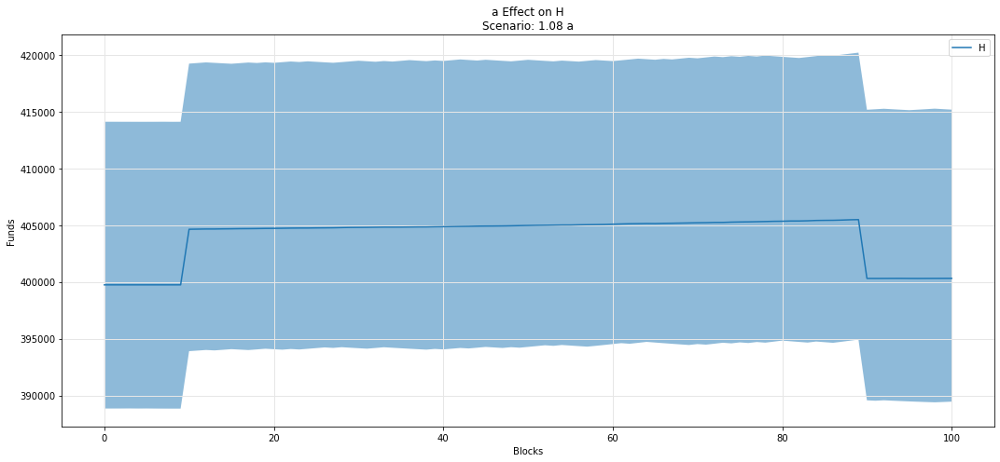

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

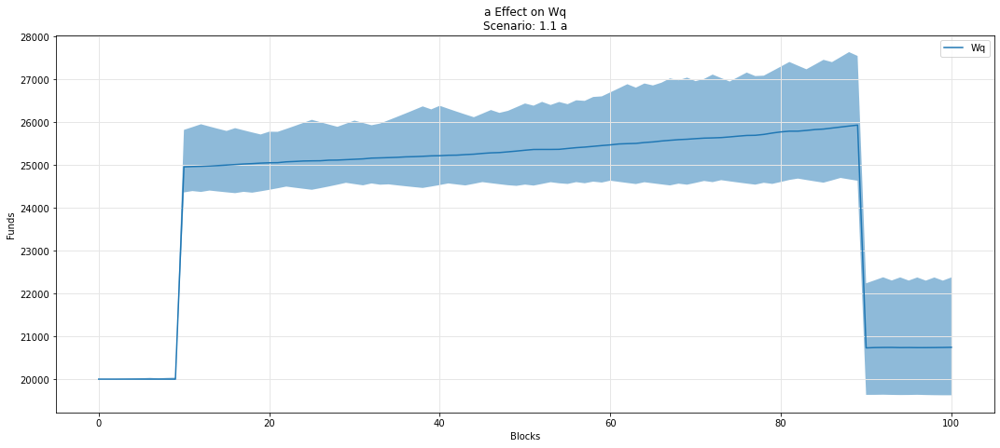

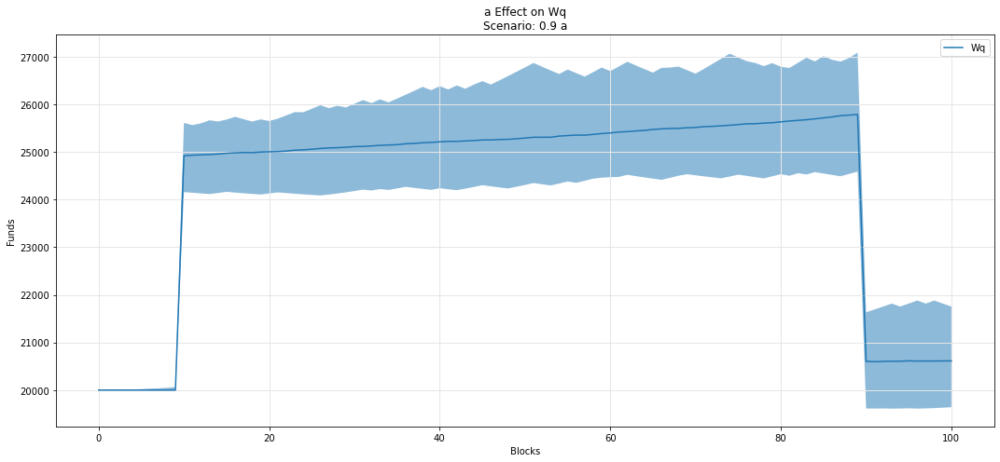

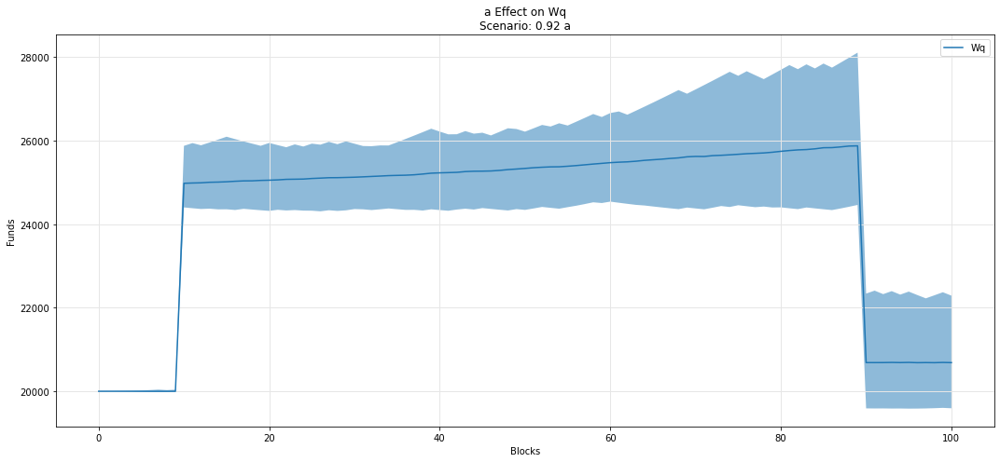

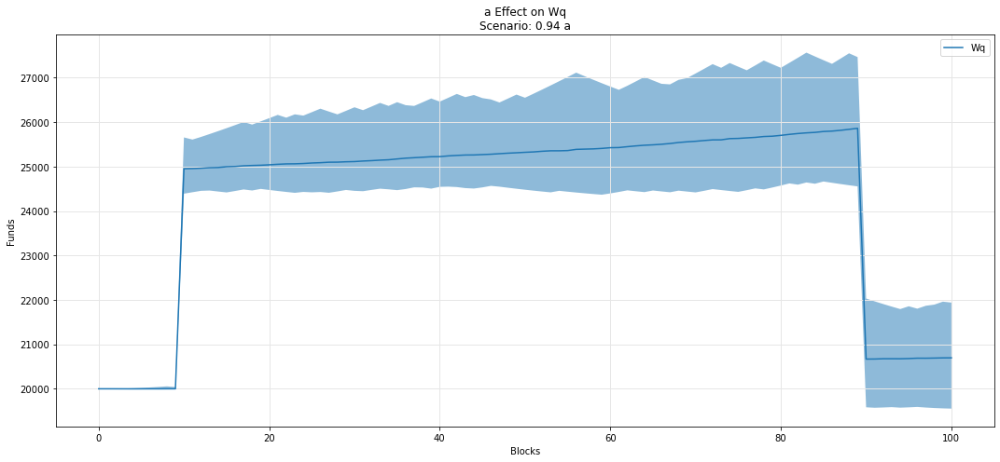

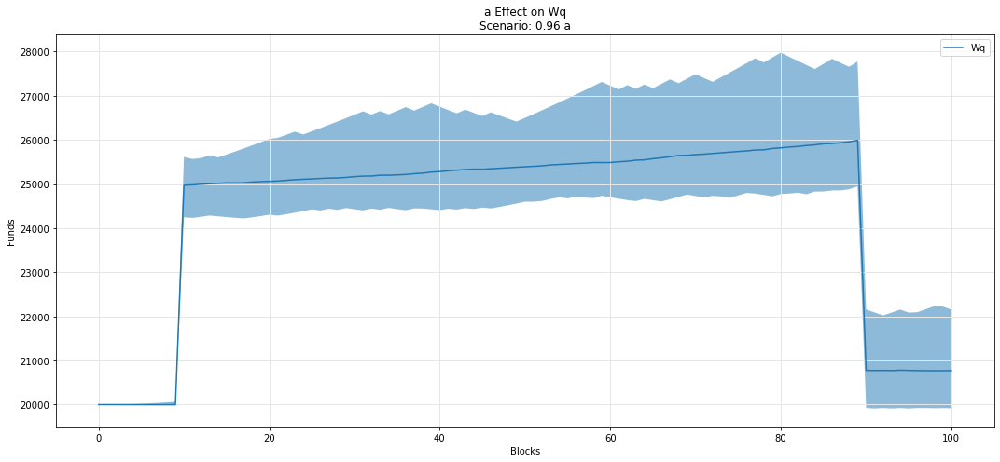

...

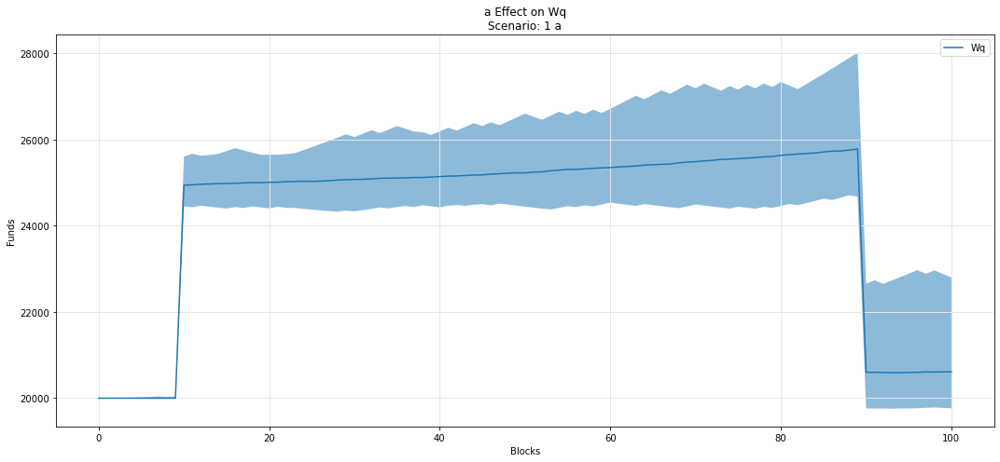

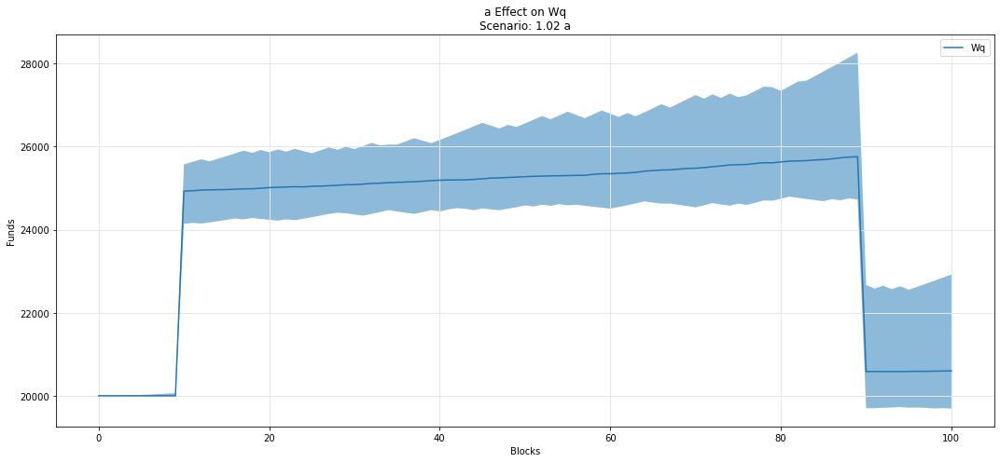

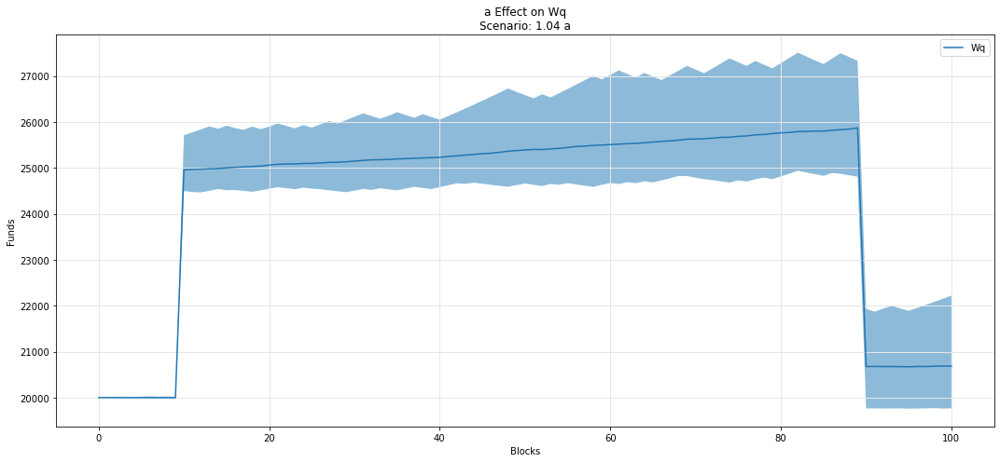

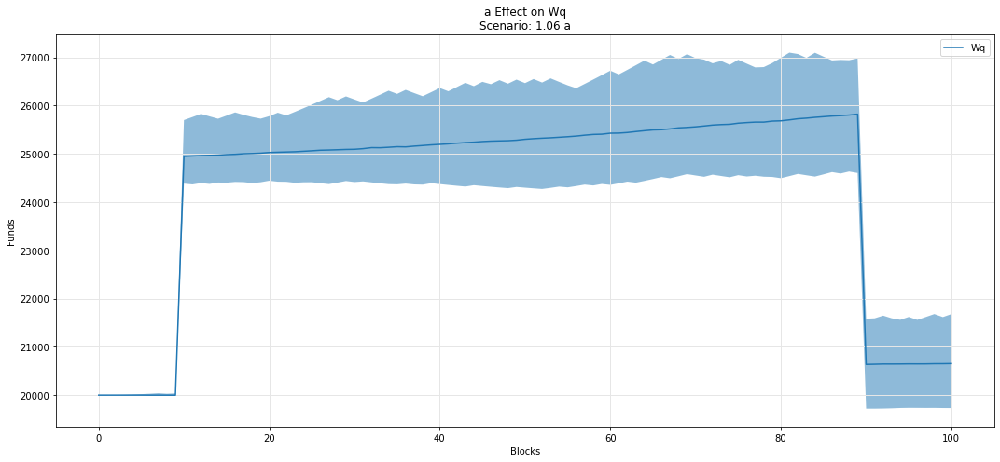

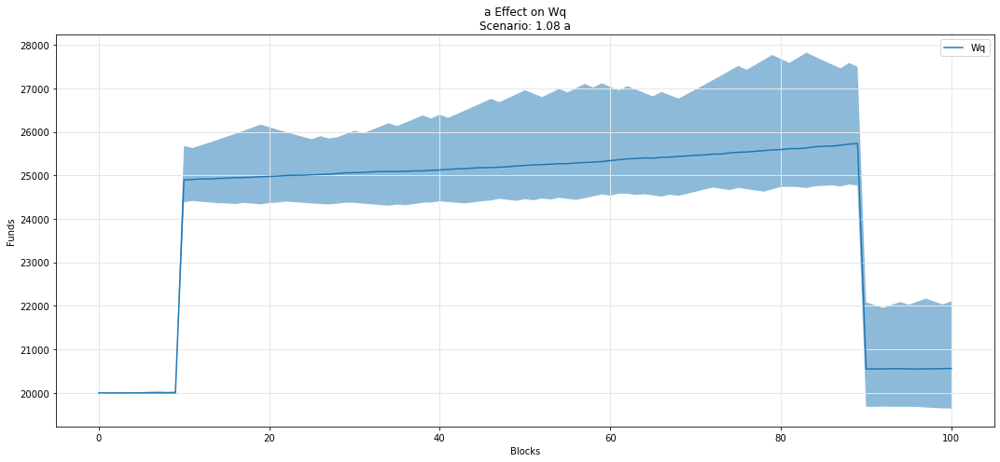

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

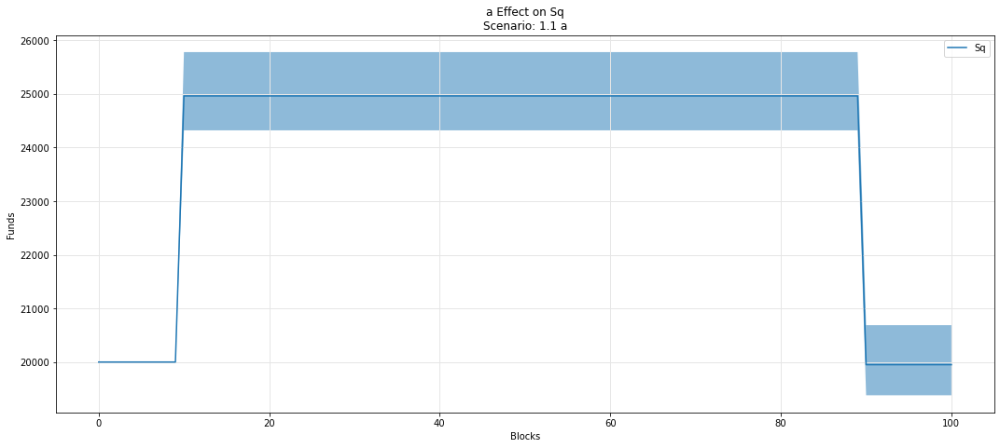

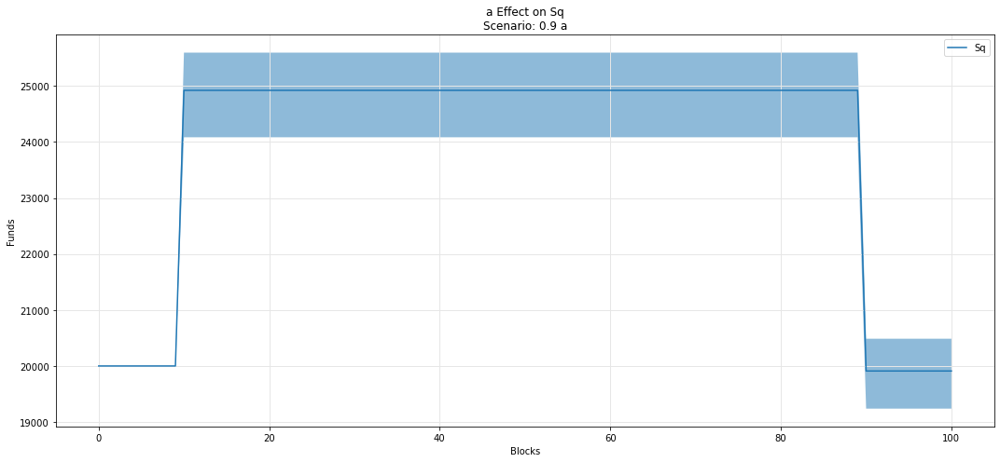

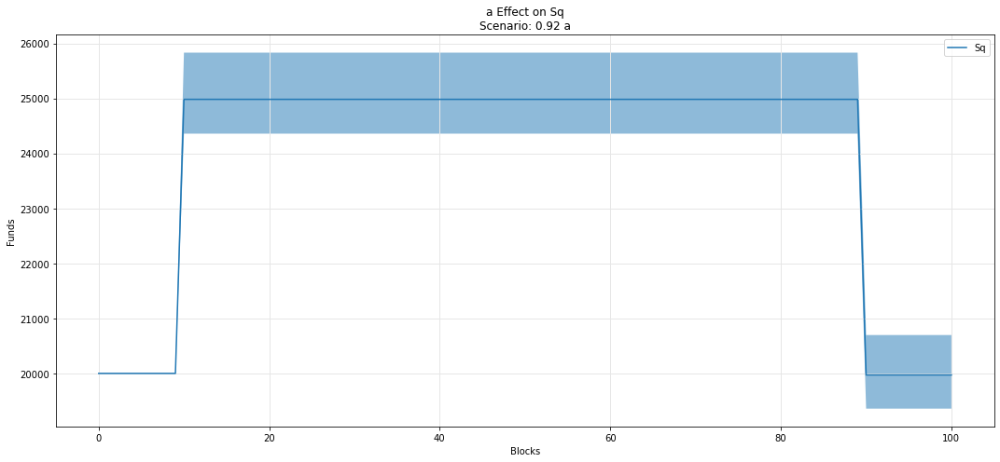

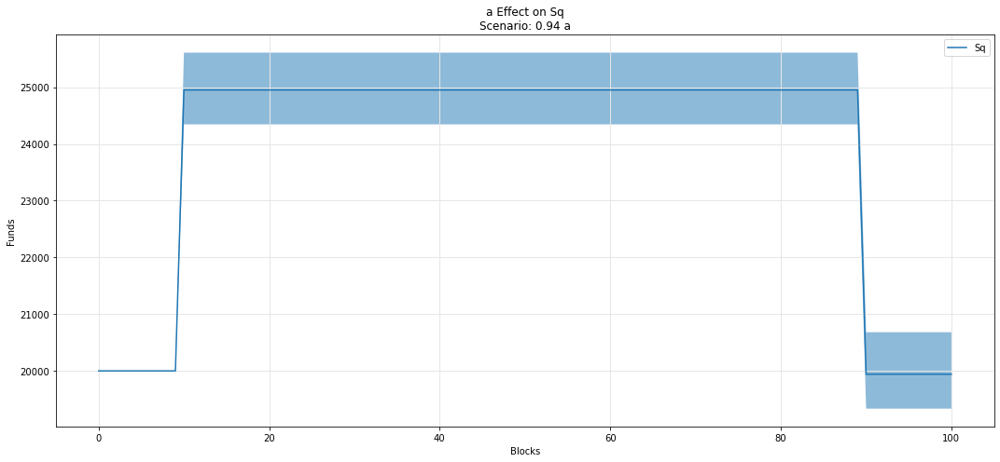

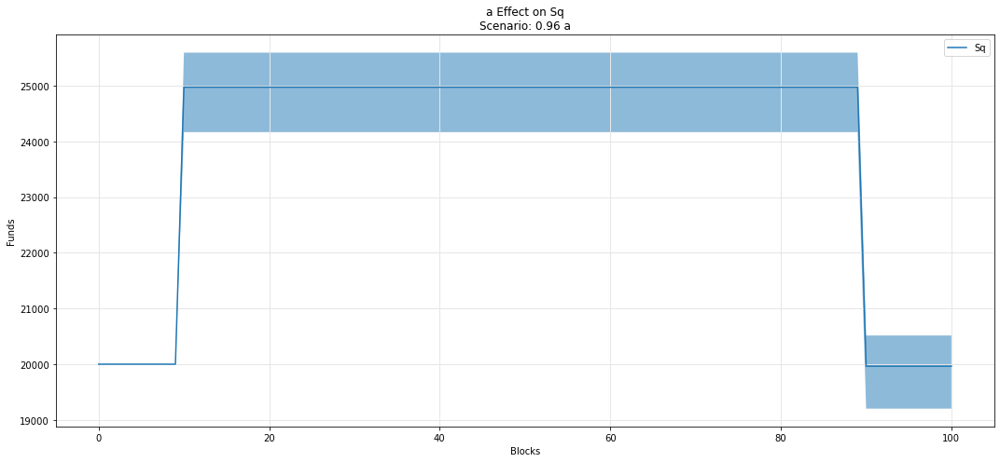

...

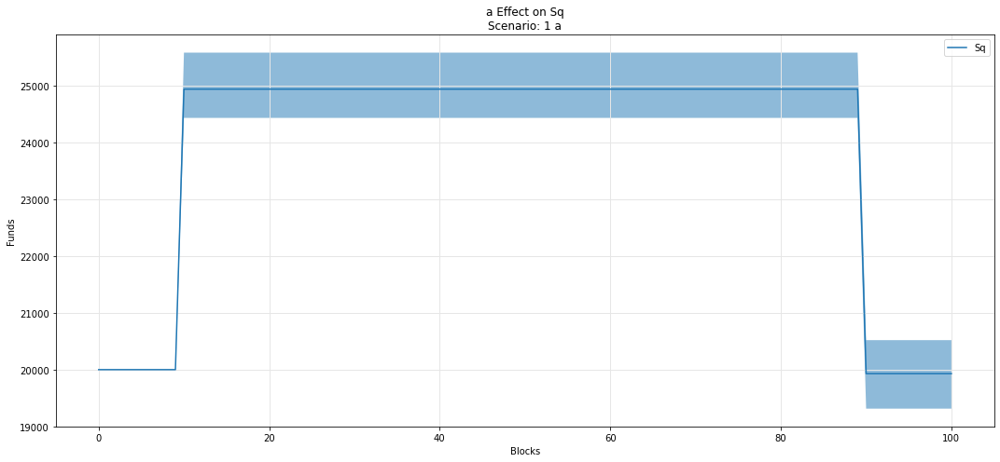

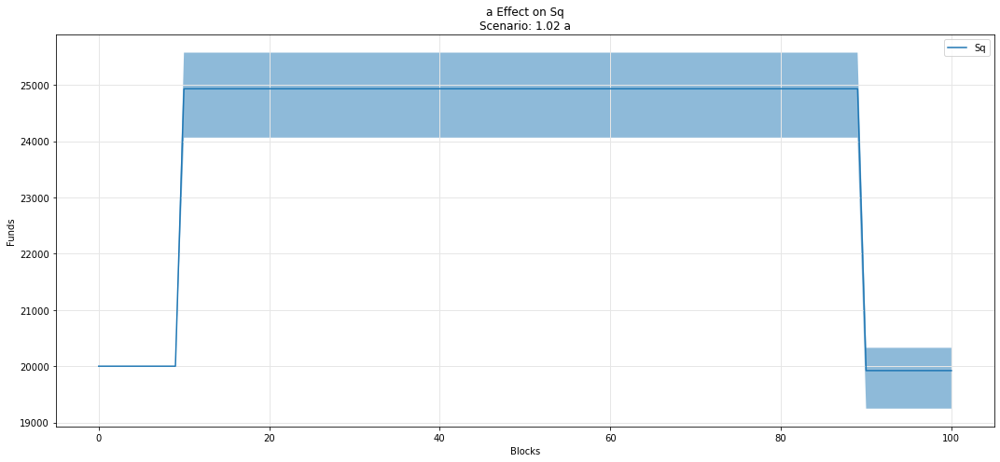

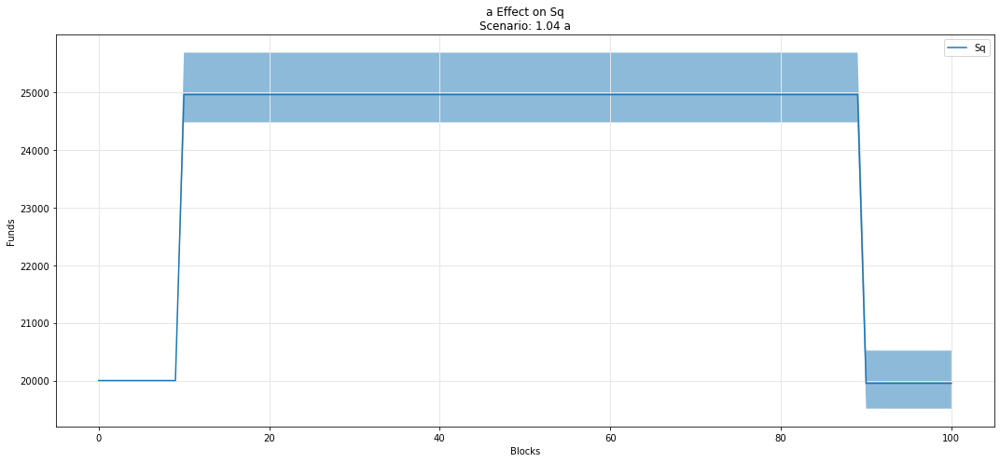

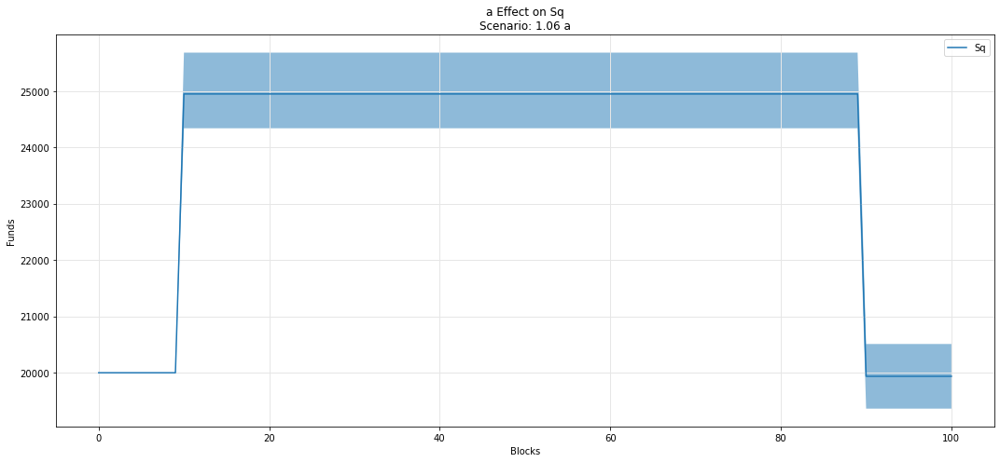

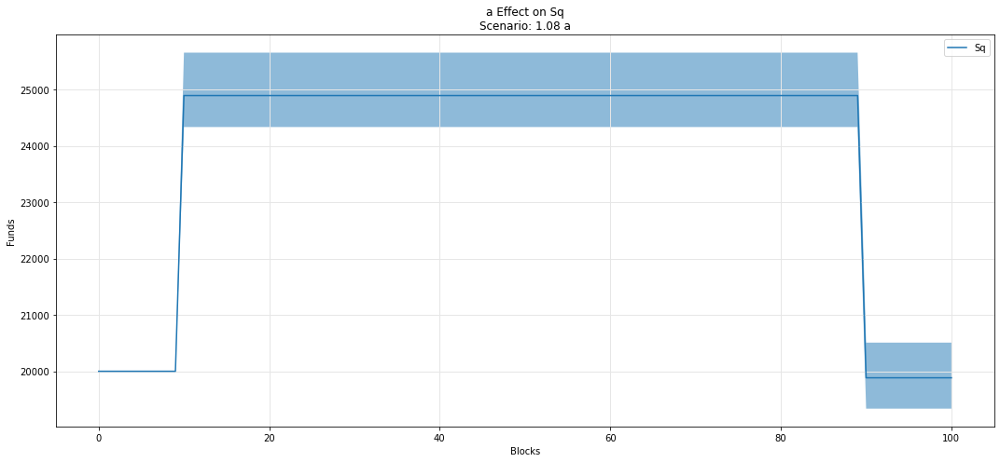

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

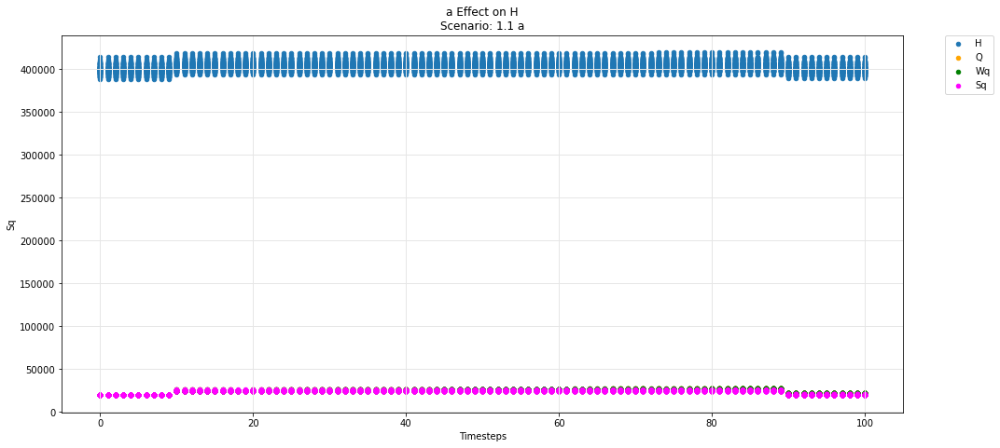

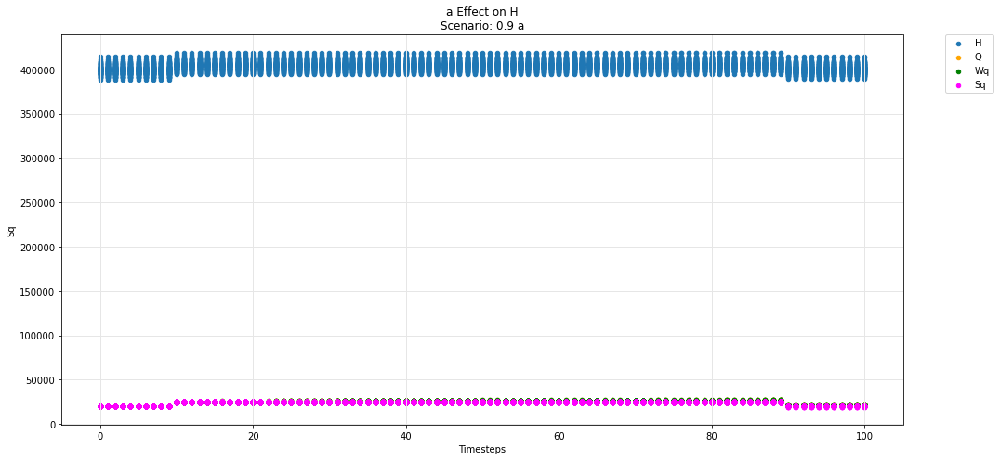

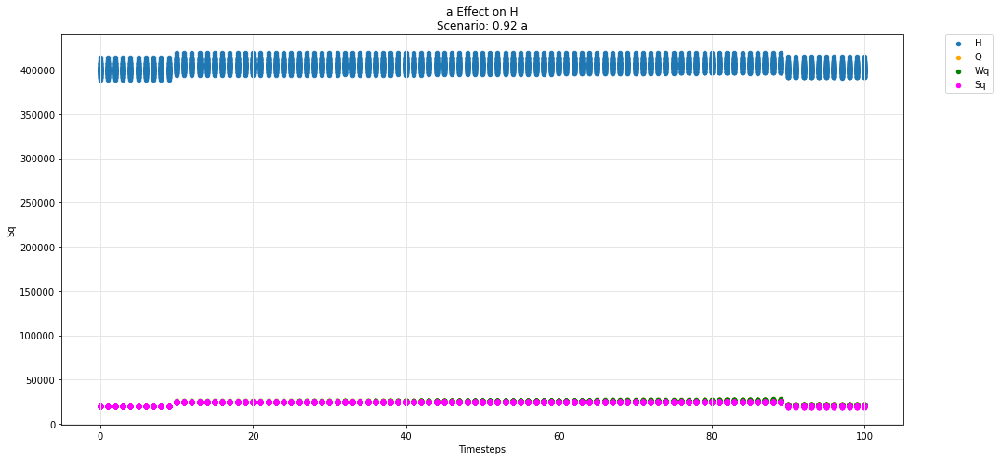

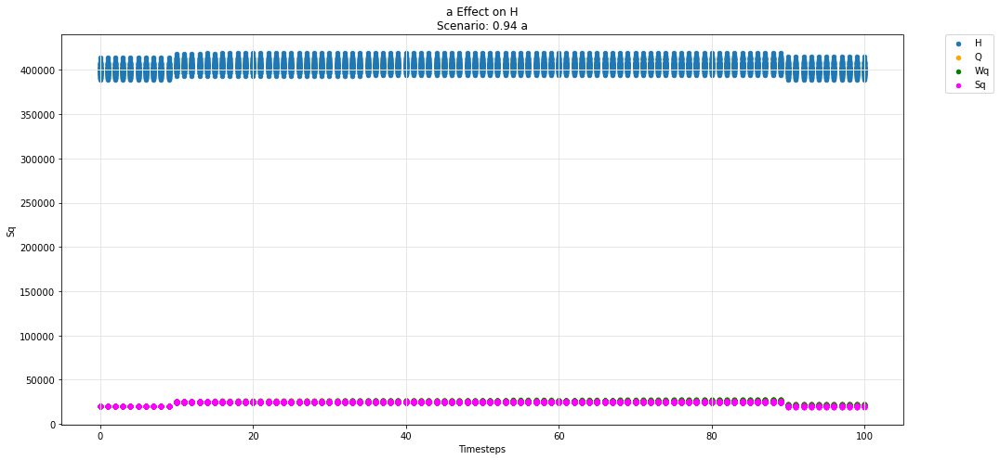

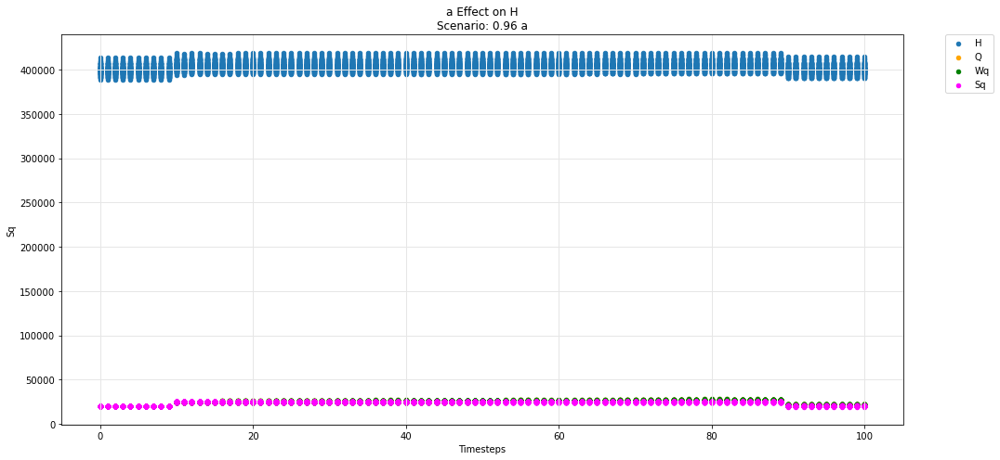

...

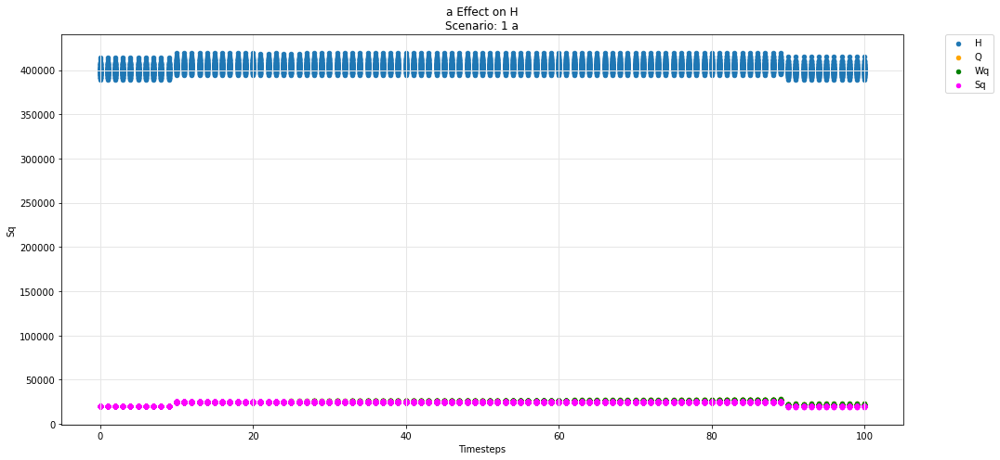

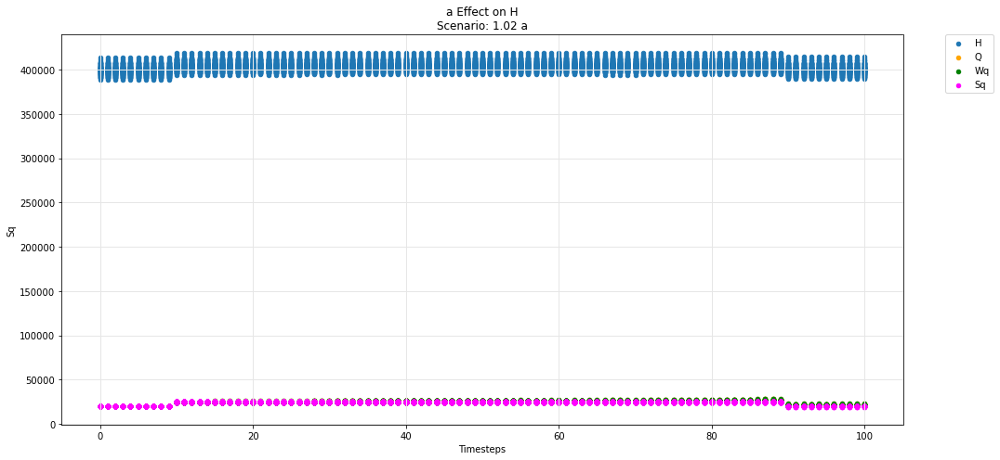

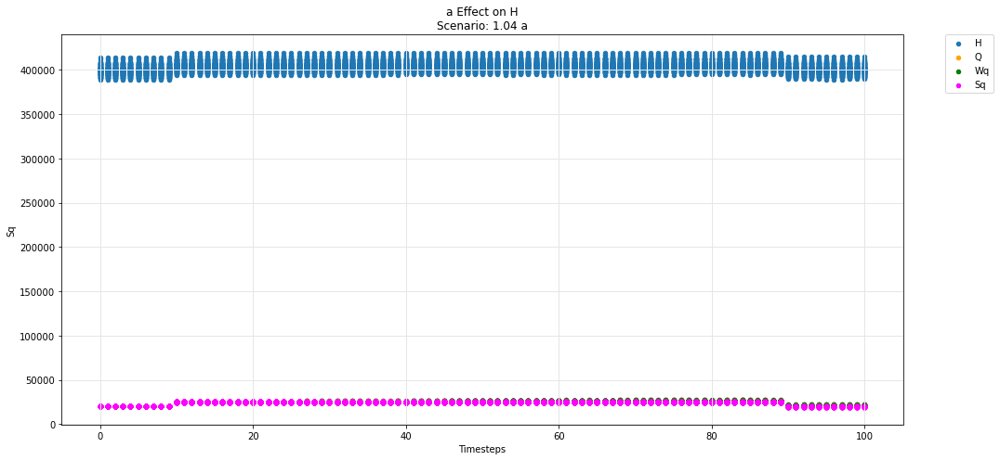

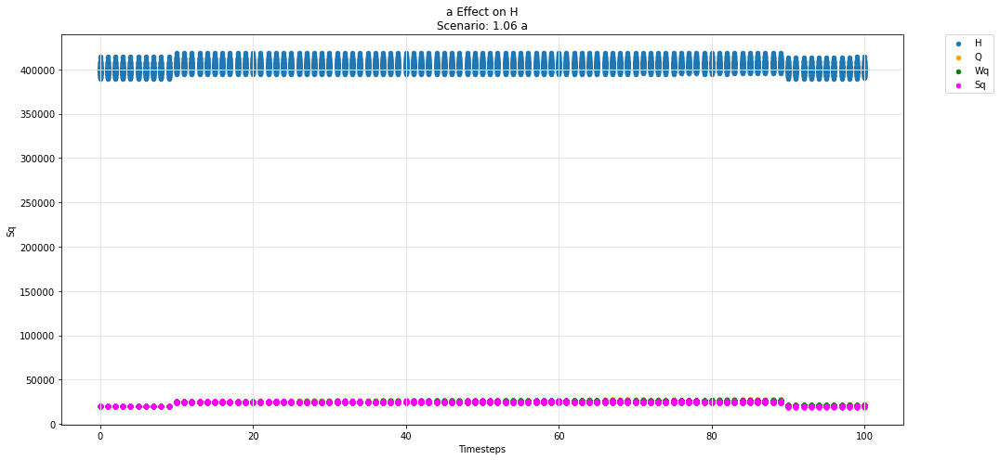

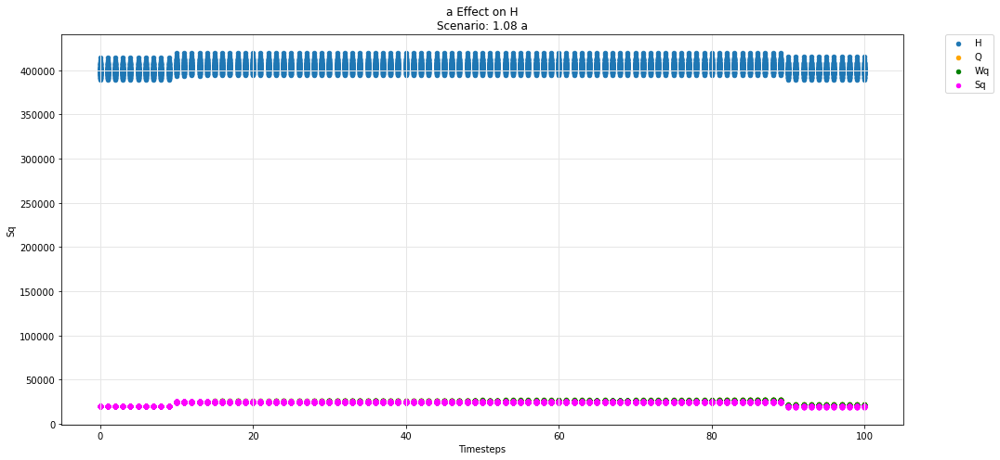

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

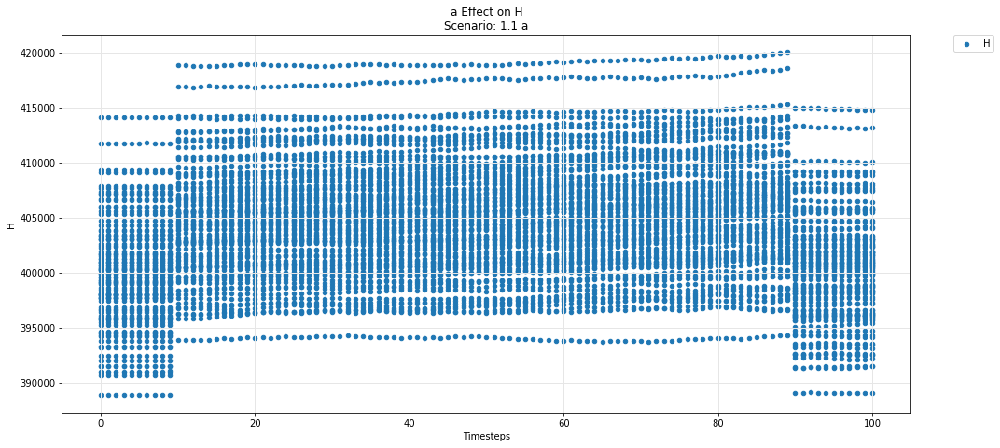

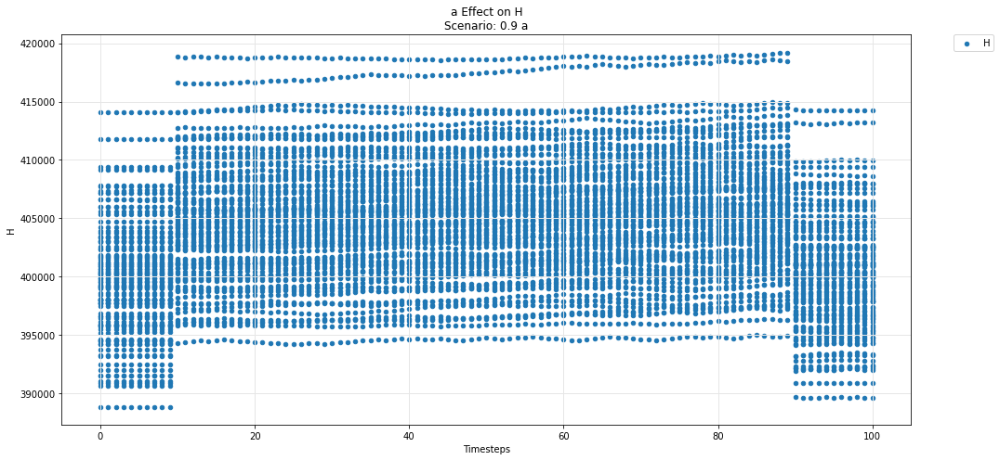

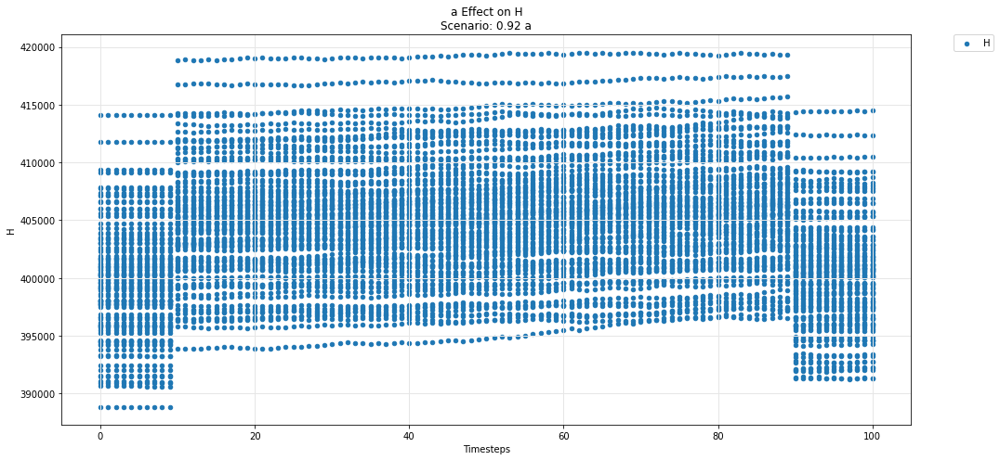

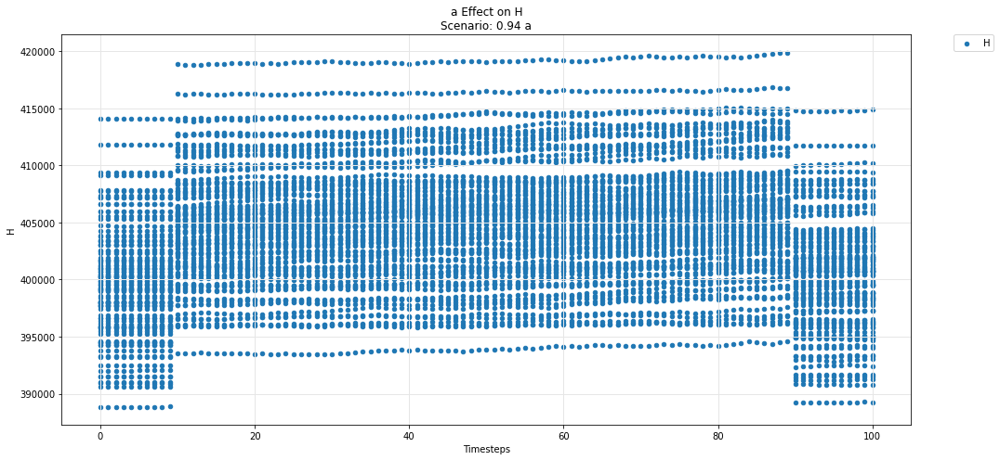

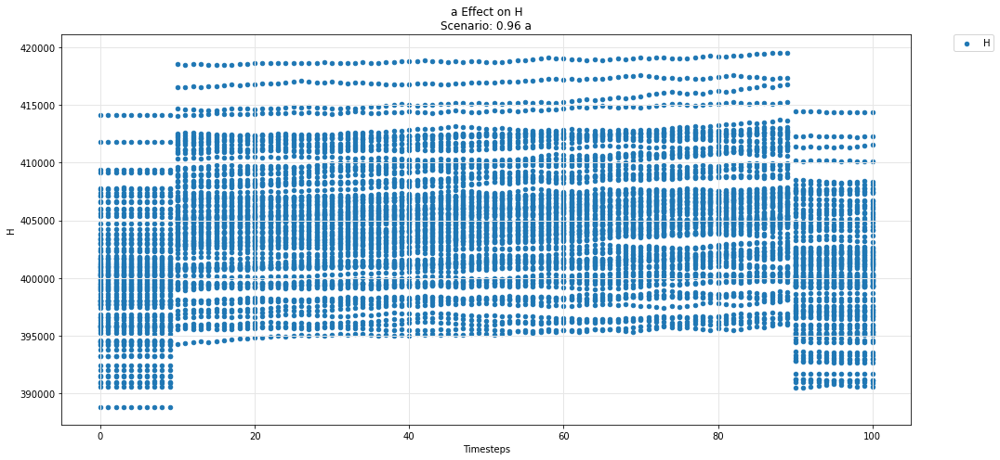

...

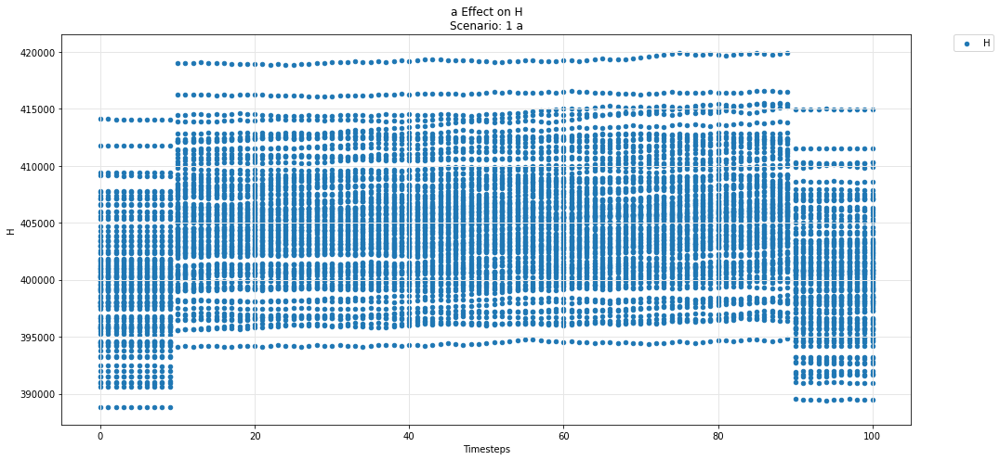

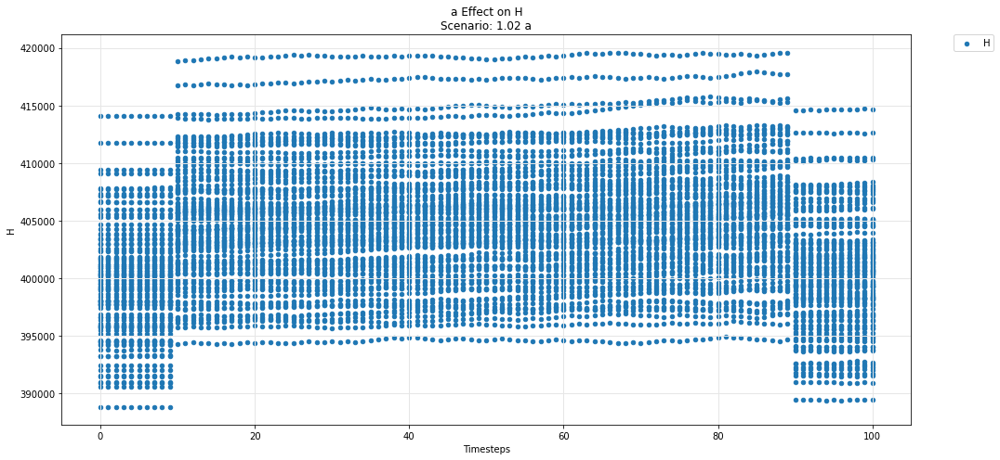

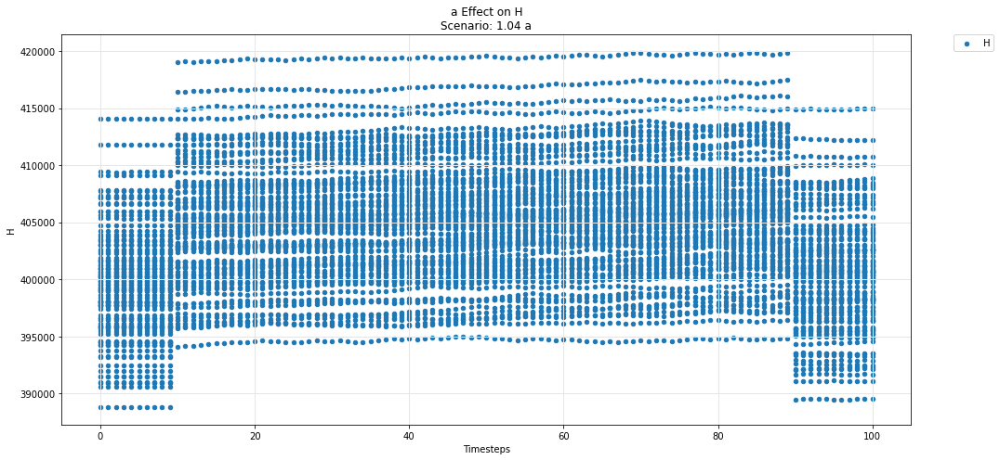

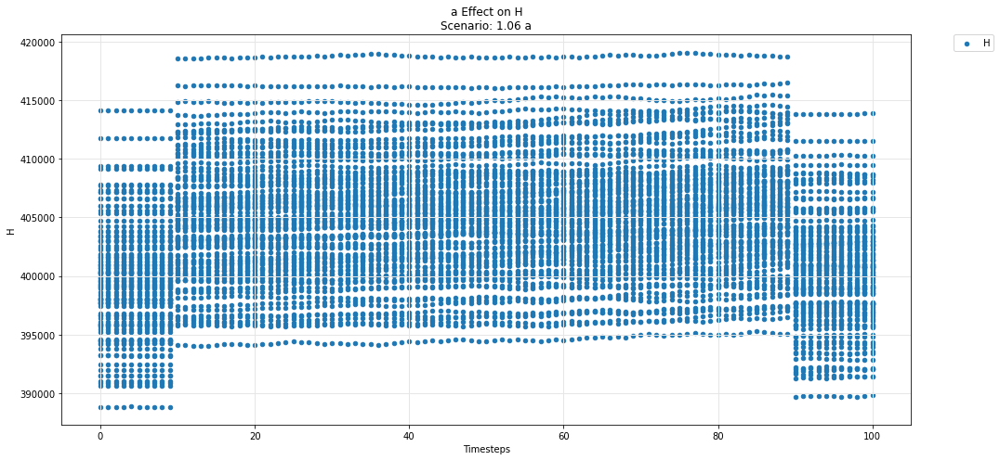

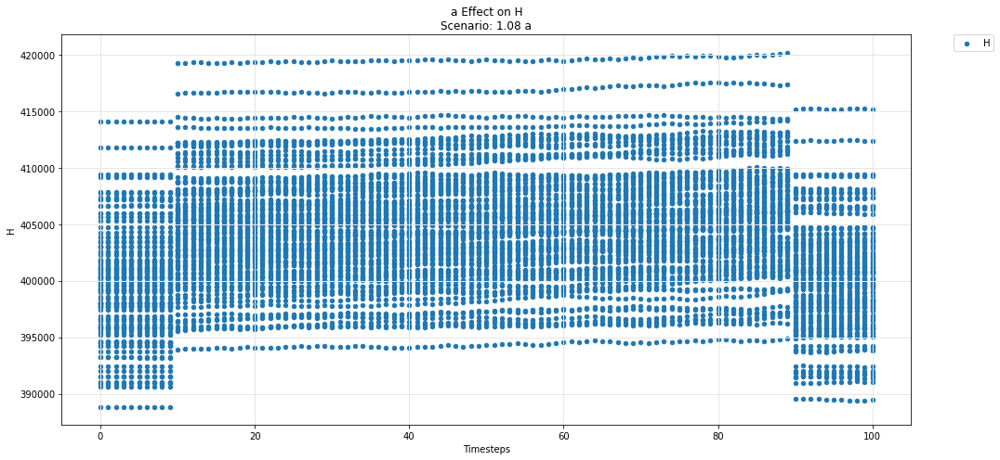

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

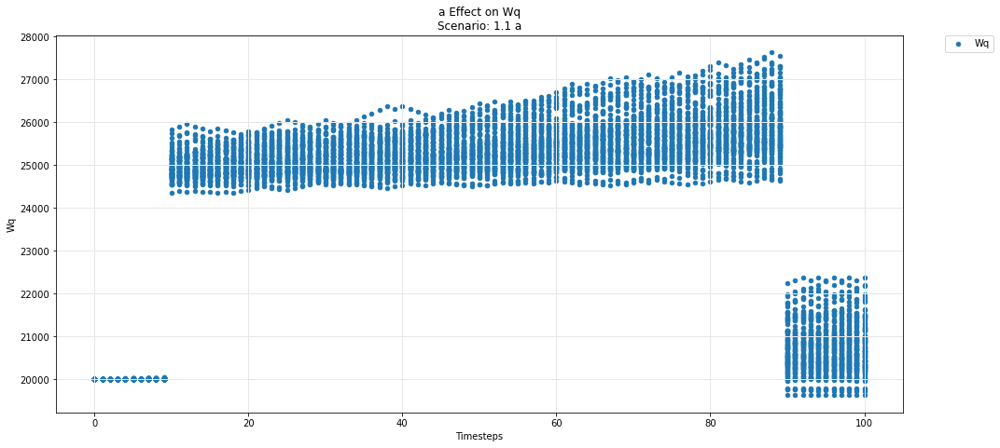

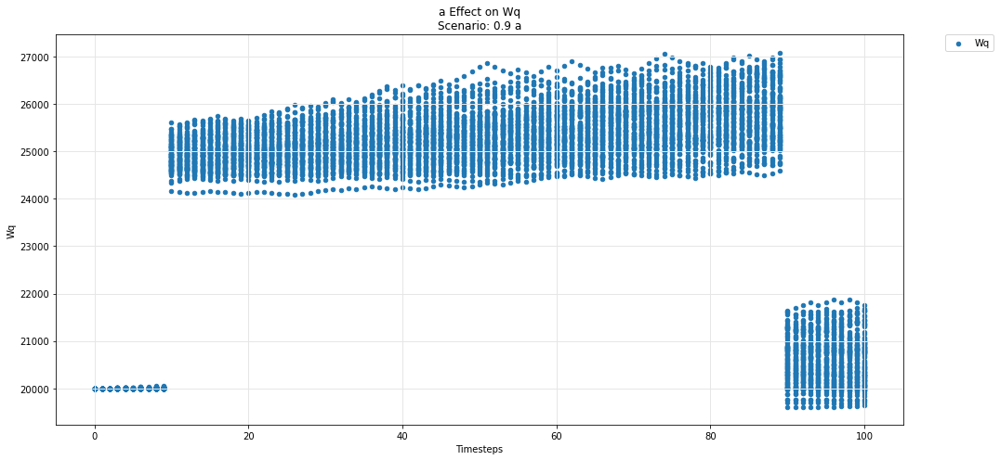

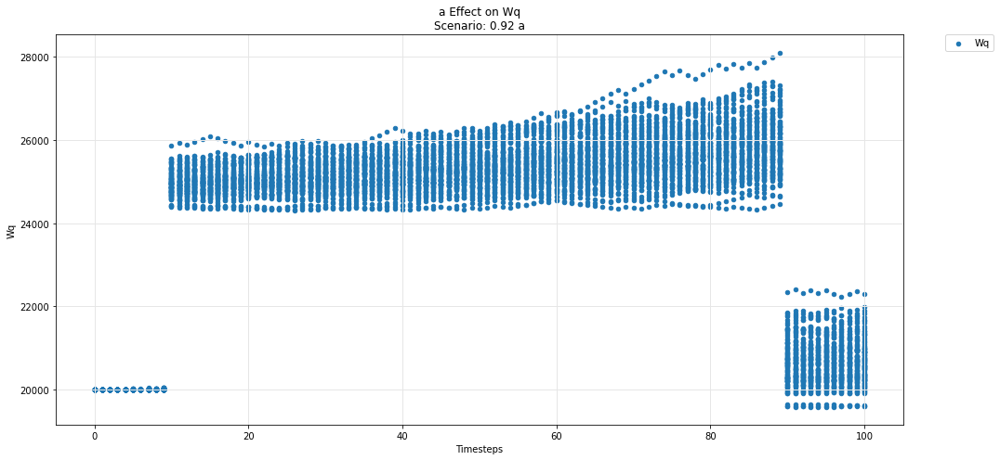

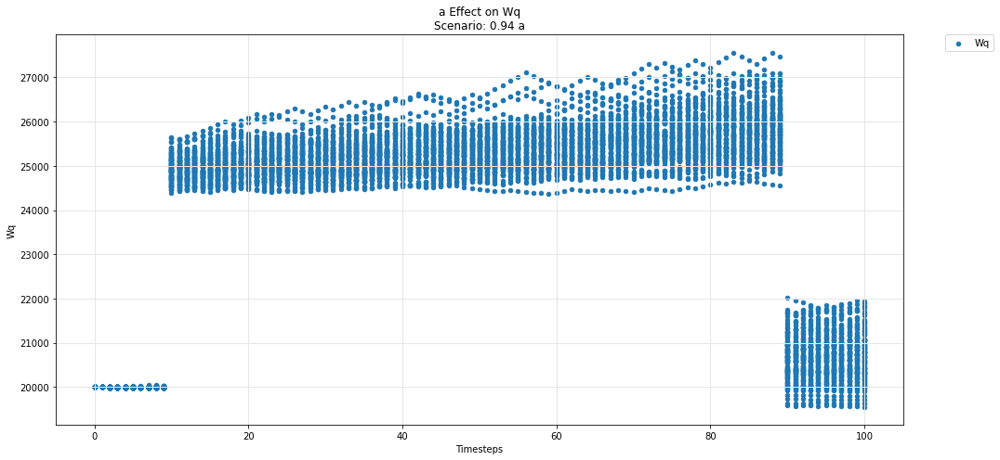

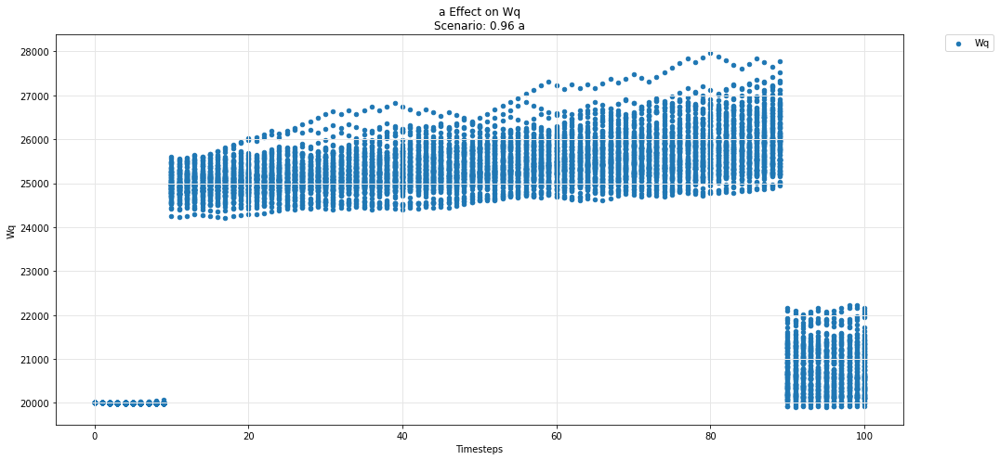

...

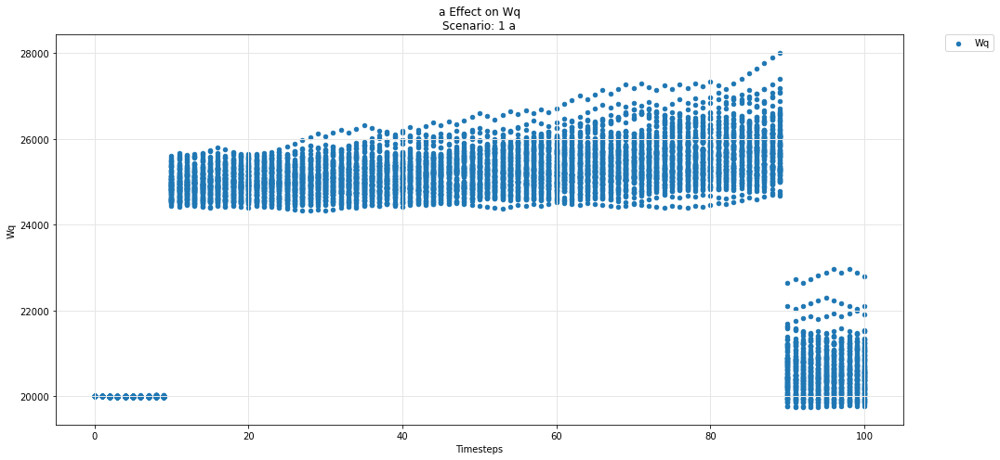

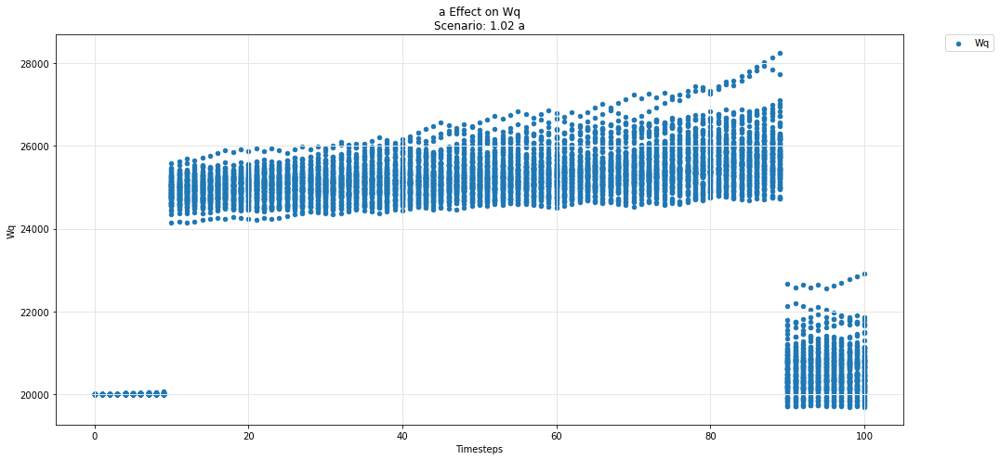

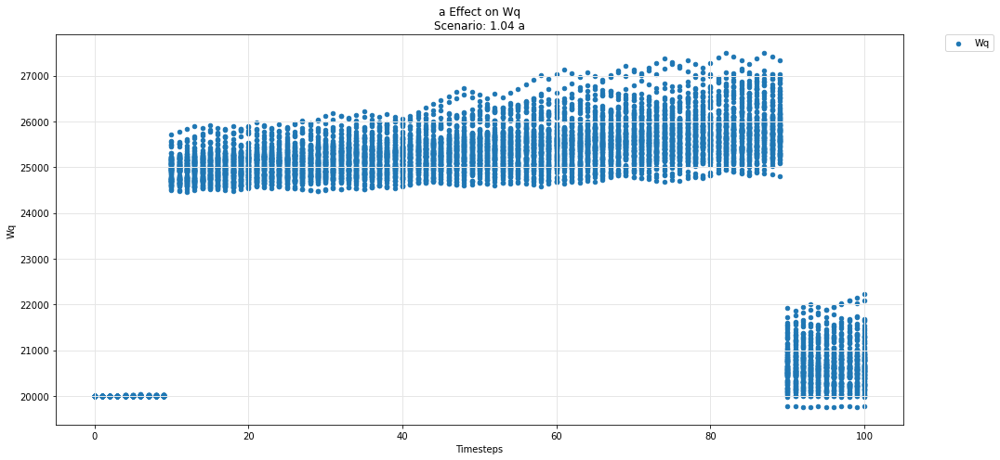

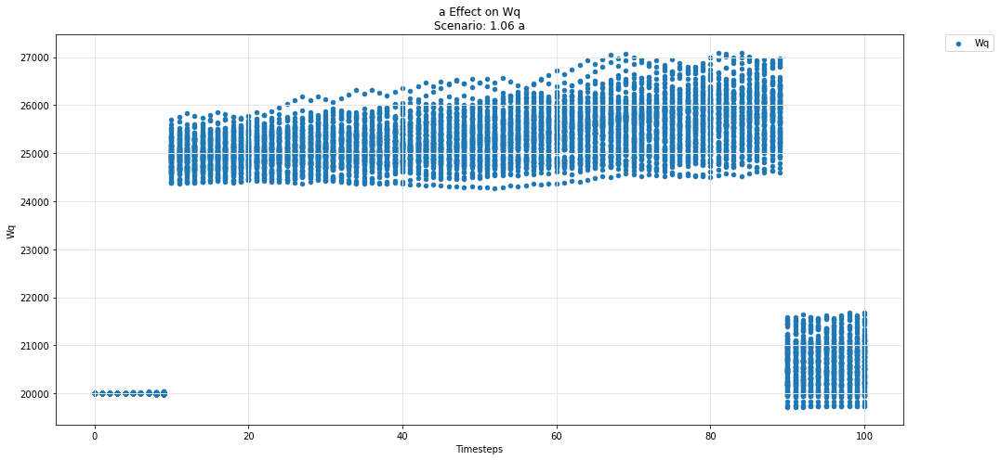

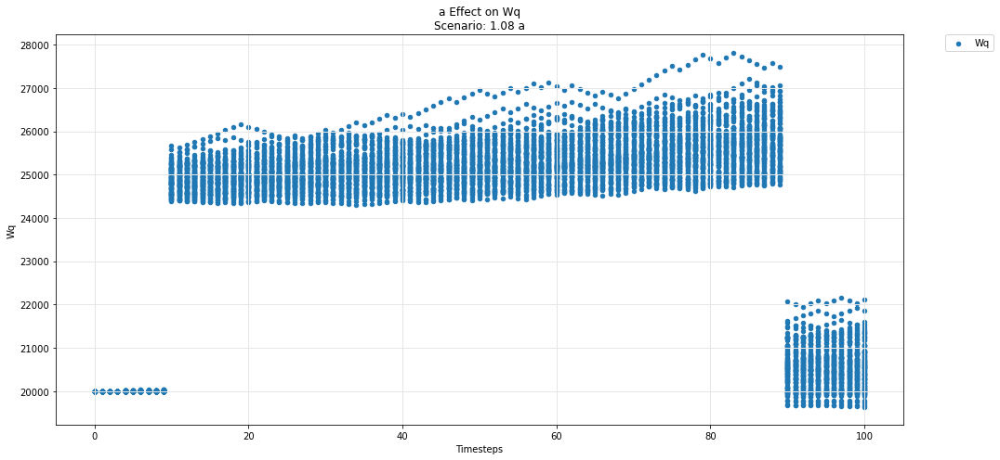

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

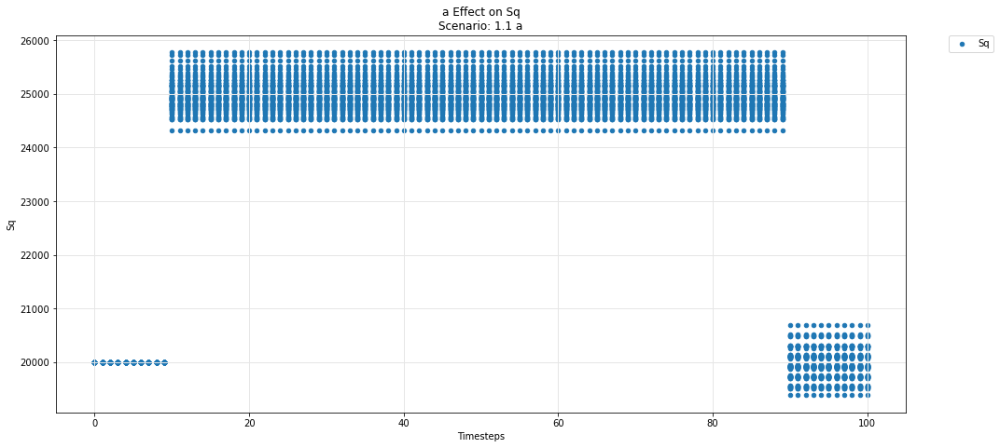

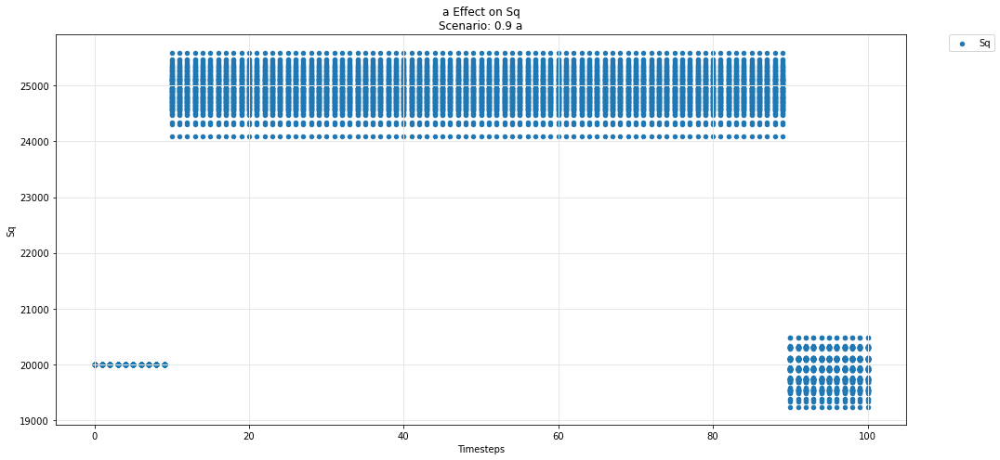

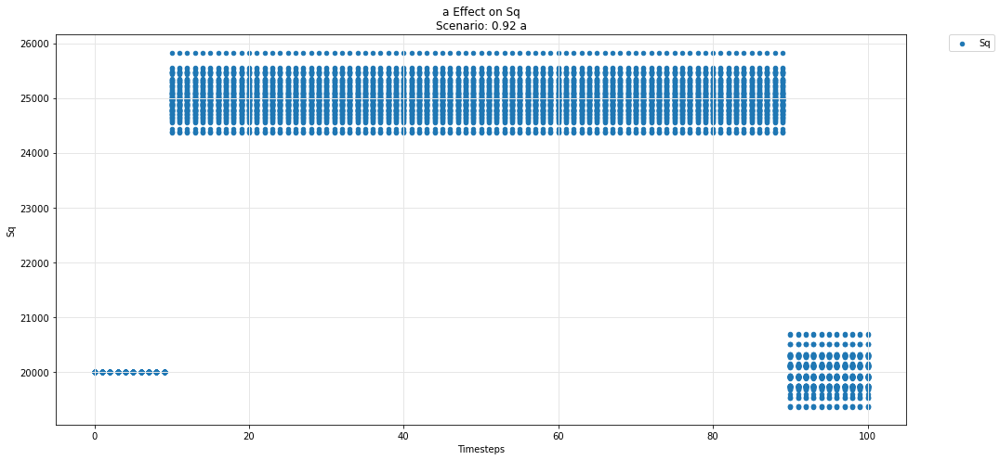

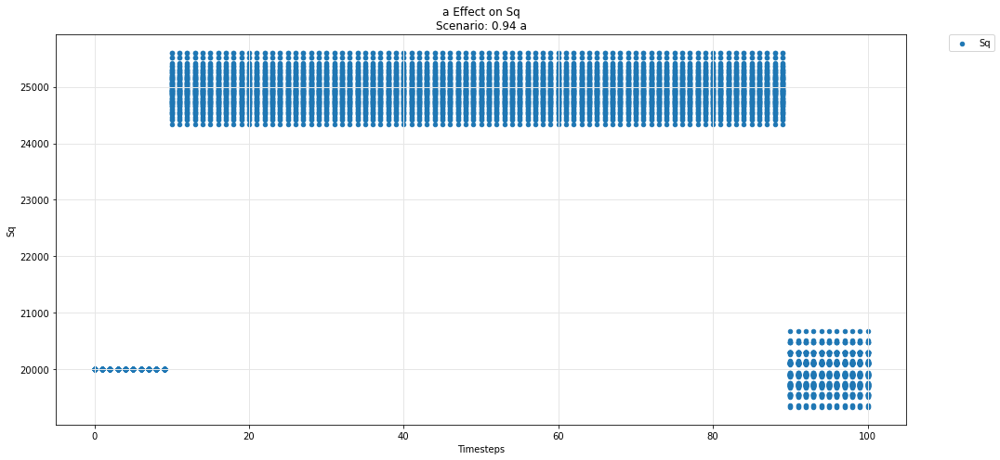

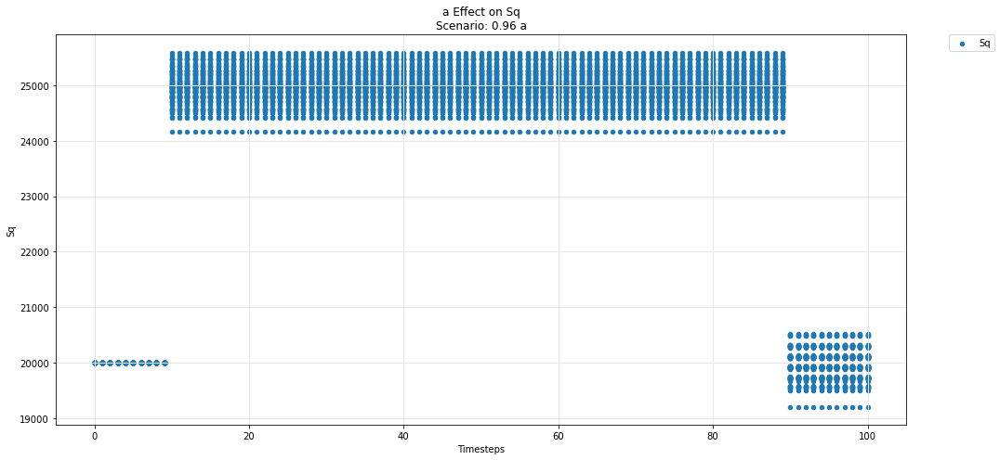

...

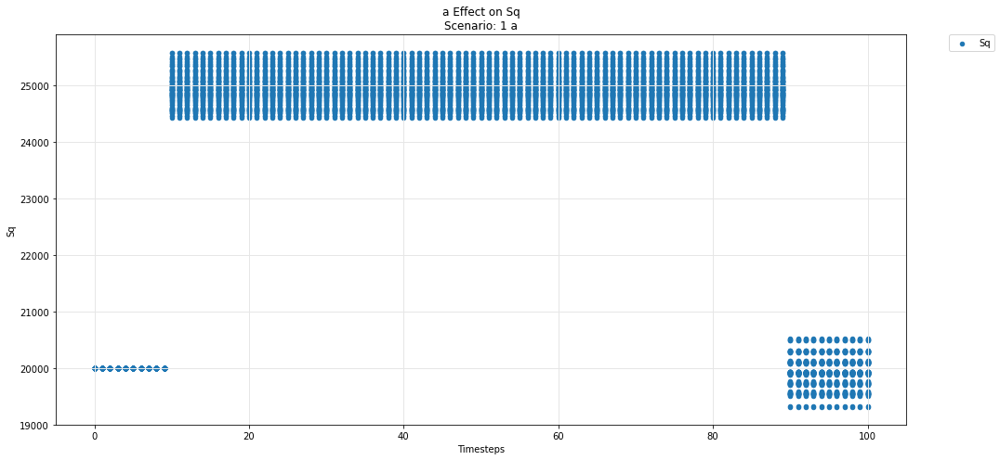

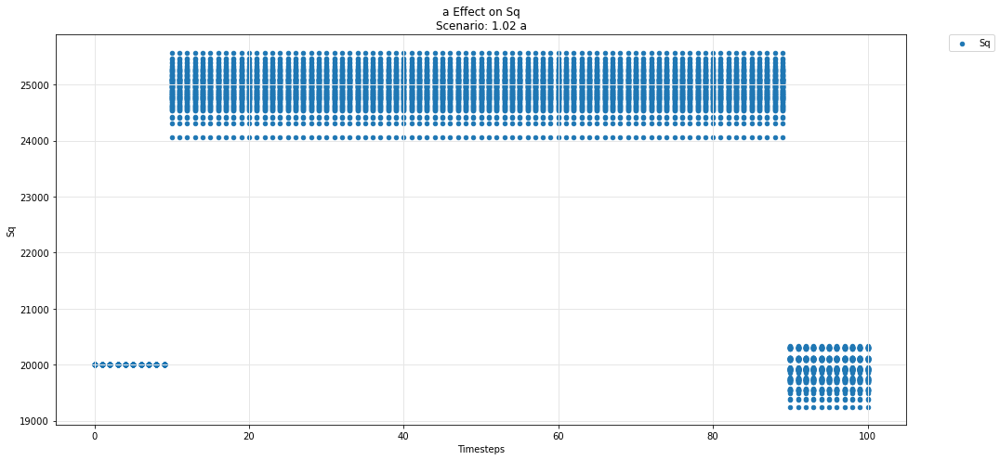

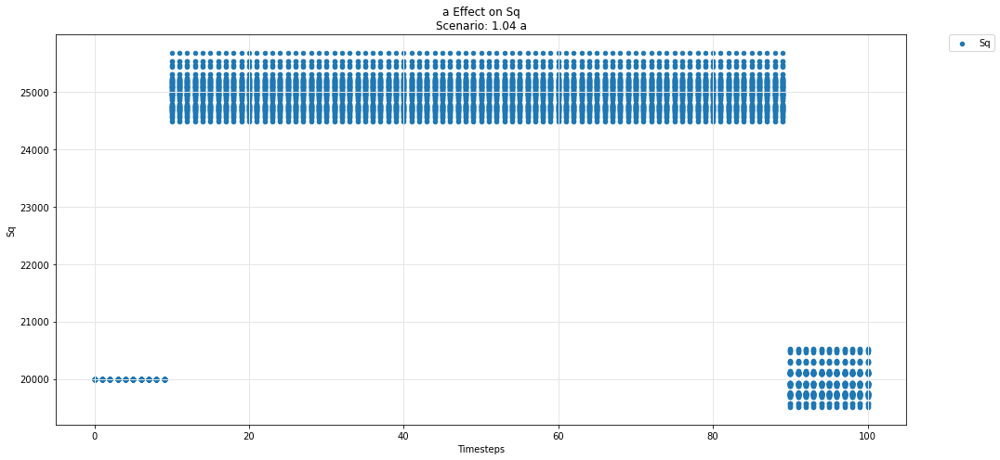

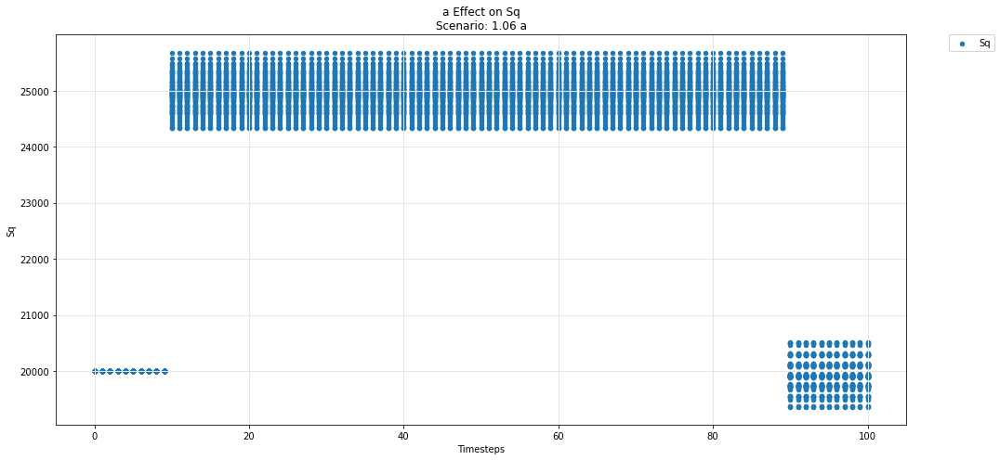

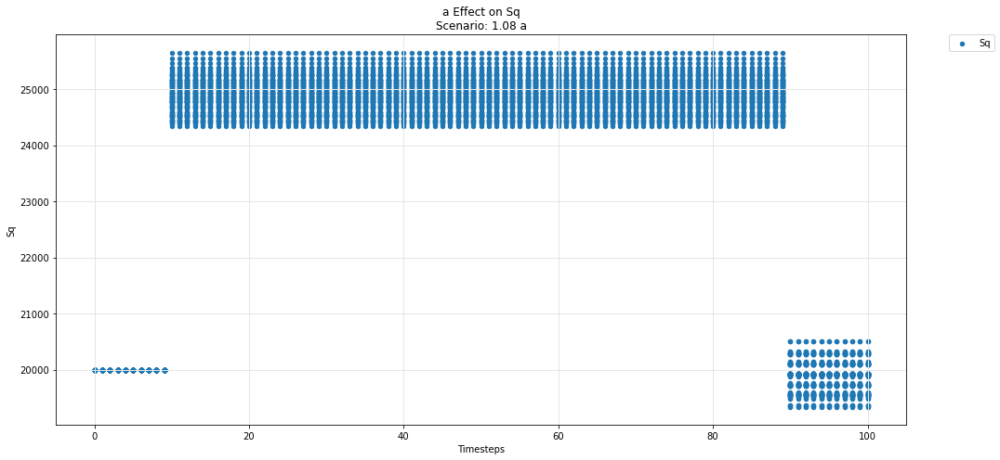

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

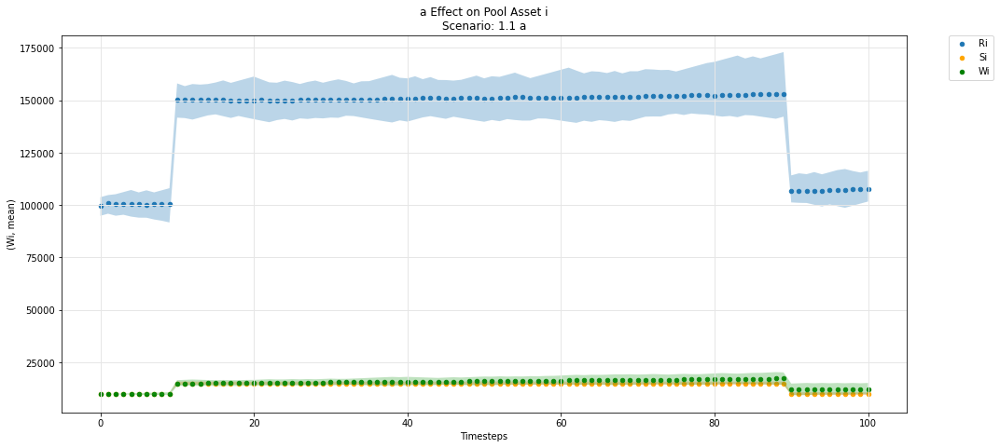

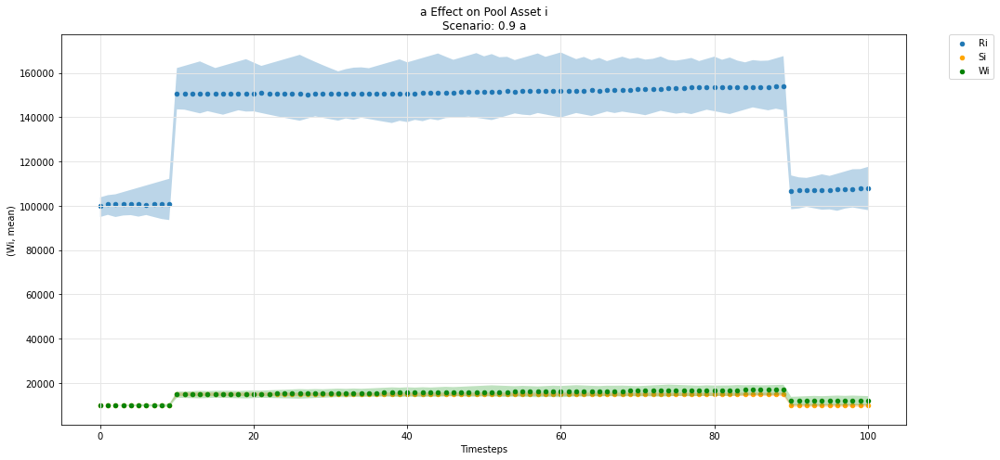

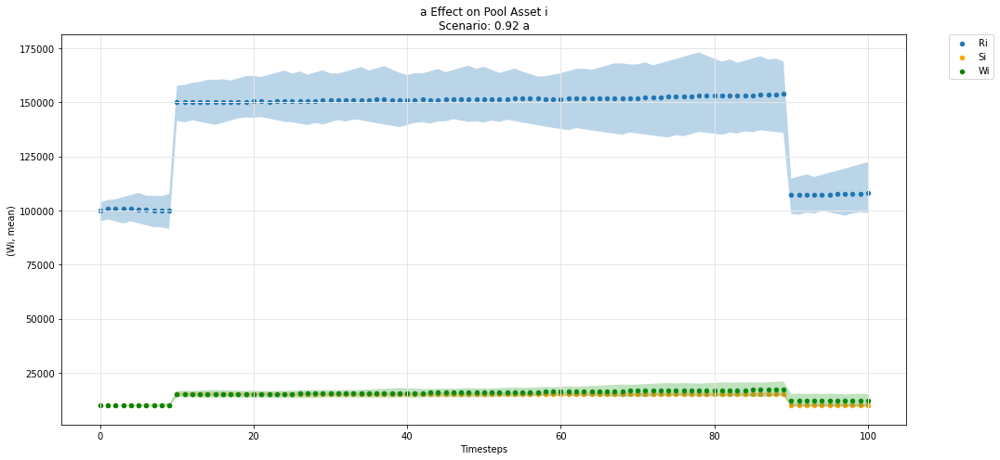

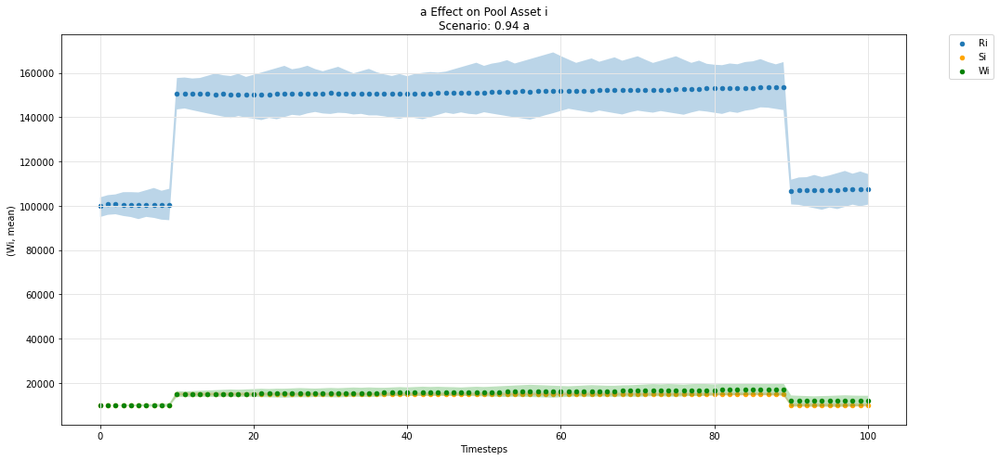

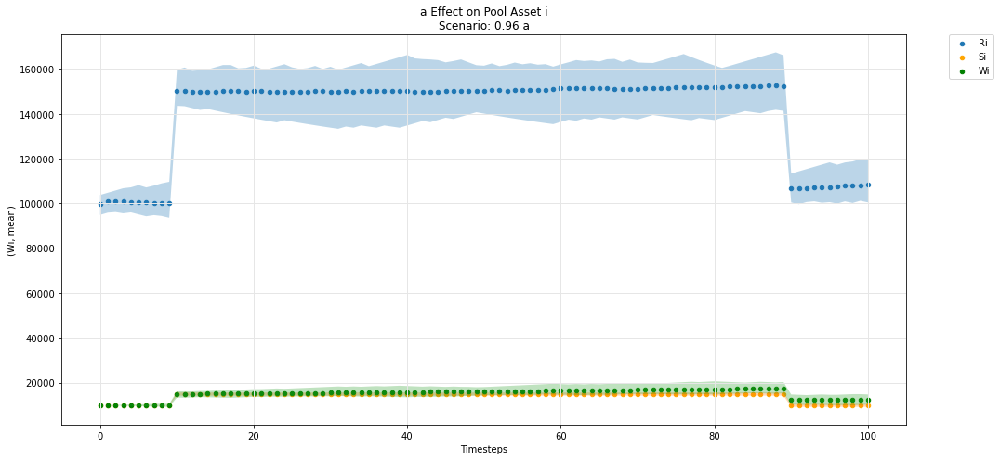

...

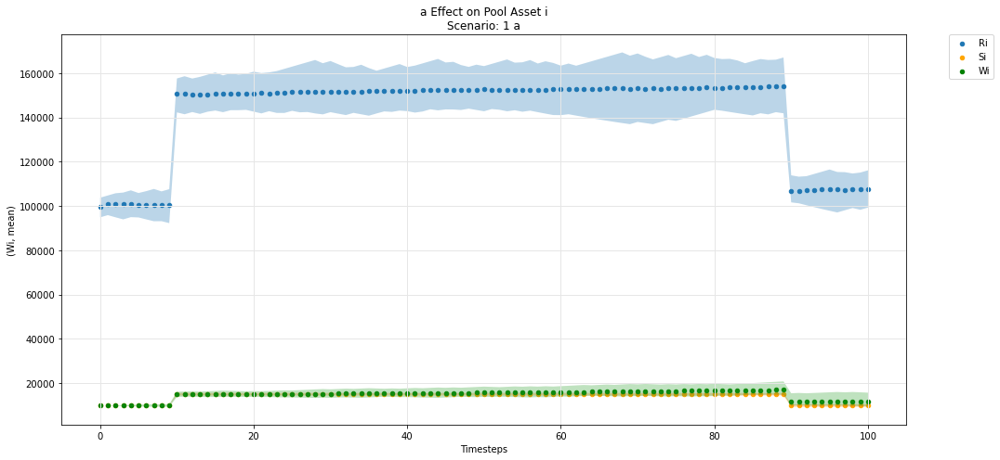

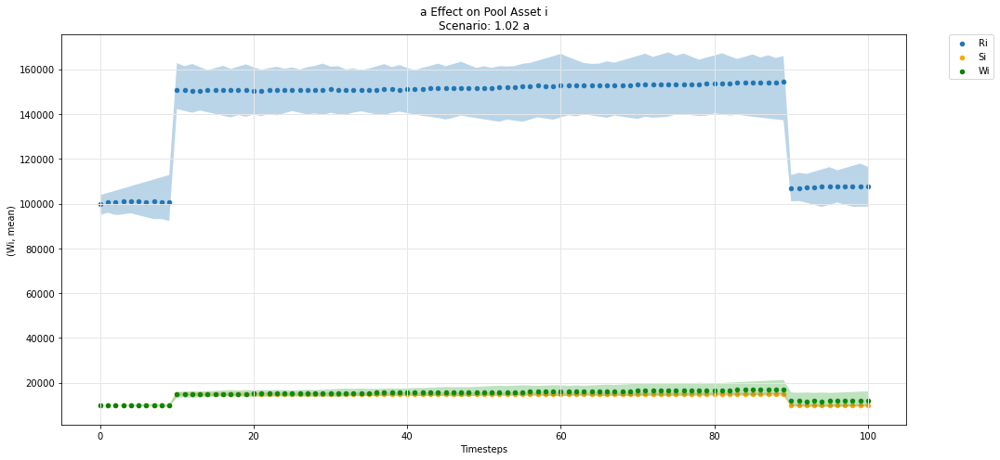

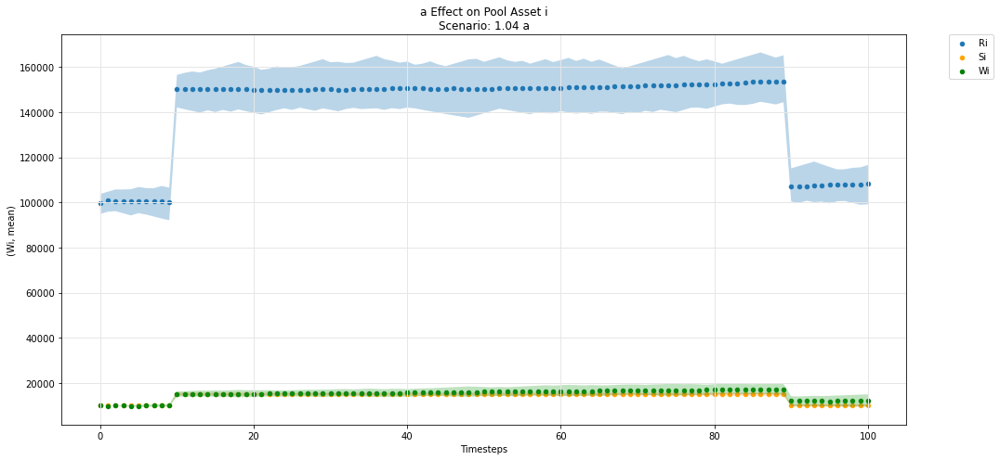

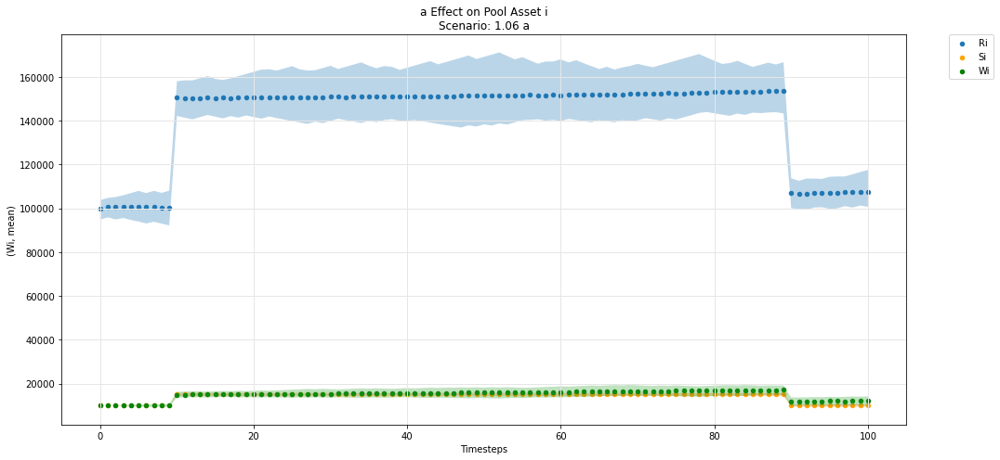

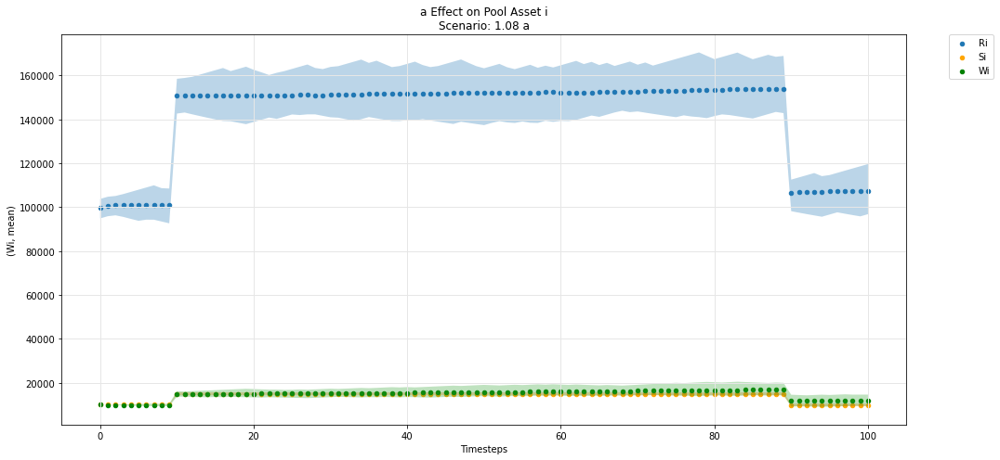

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

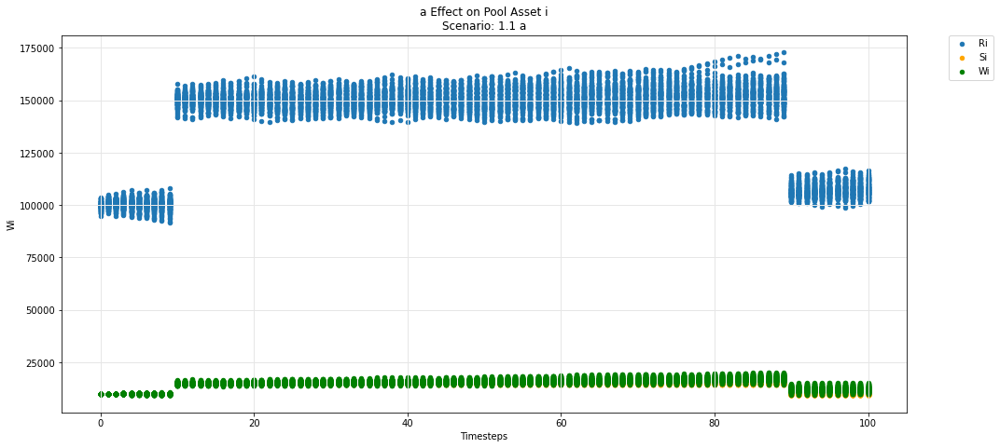

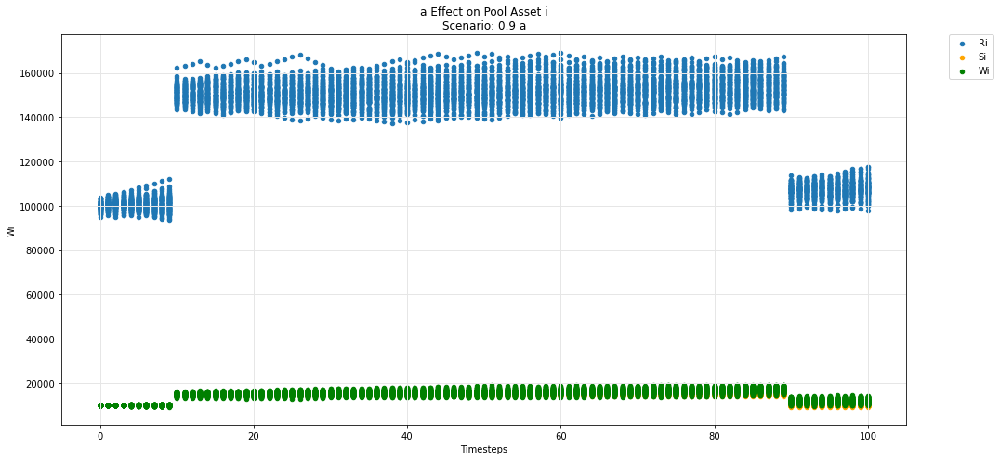

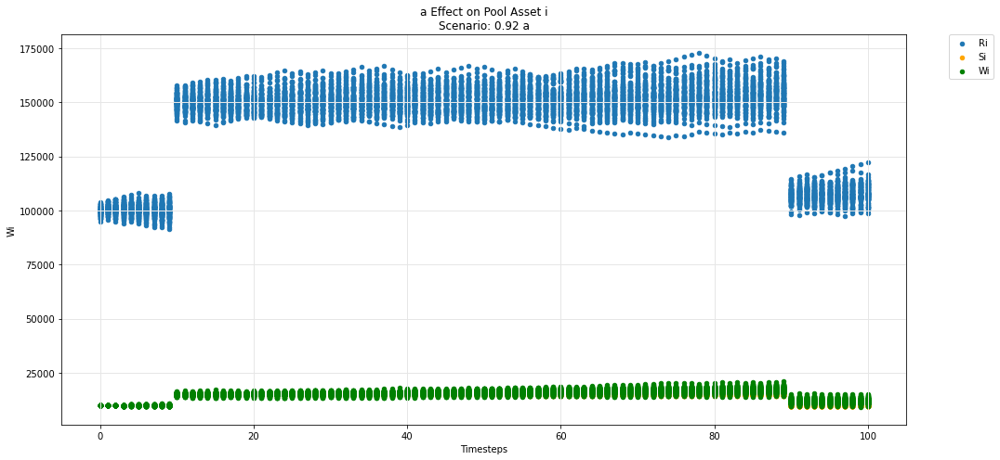

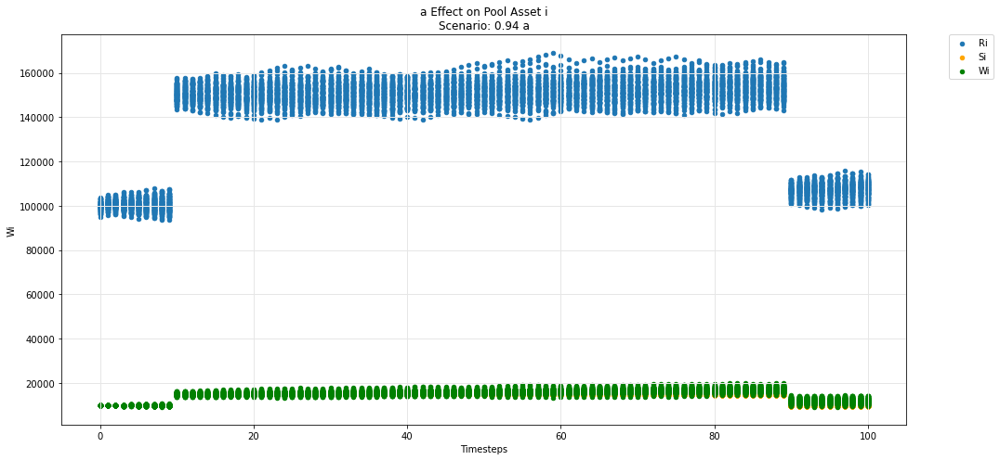

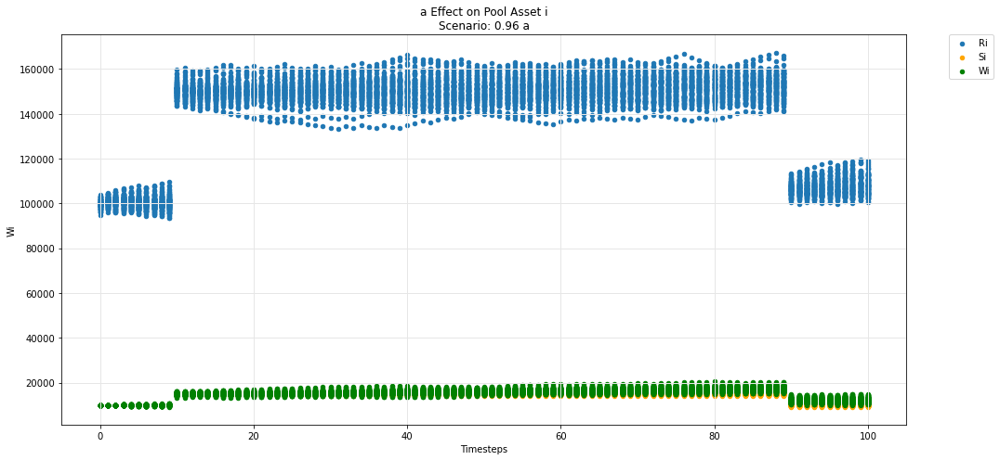

...

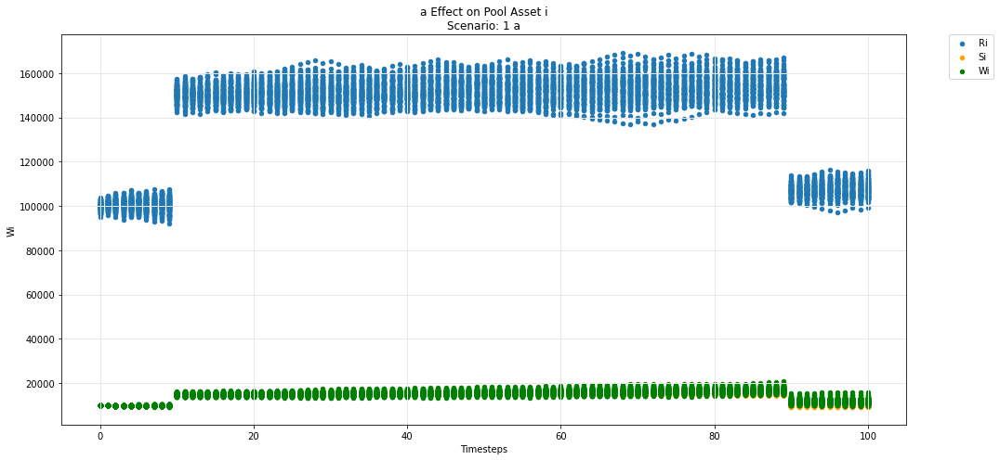

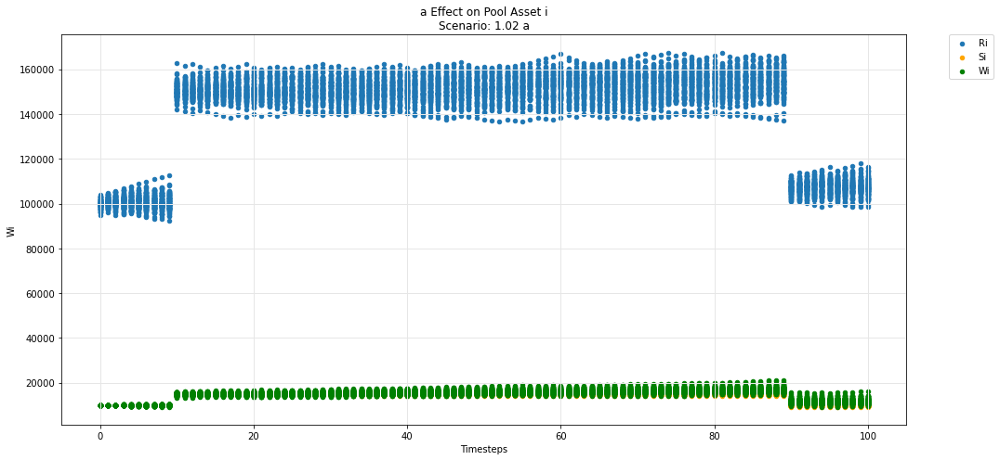

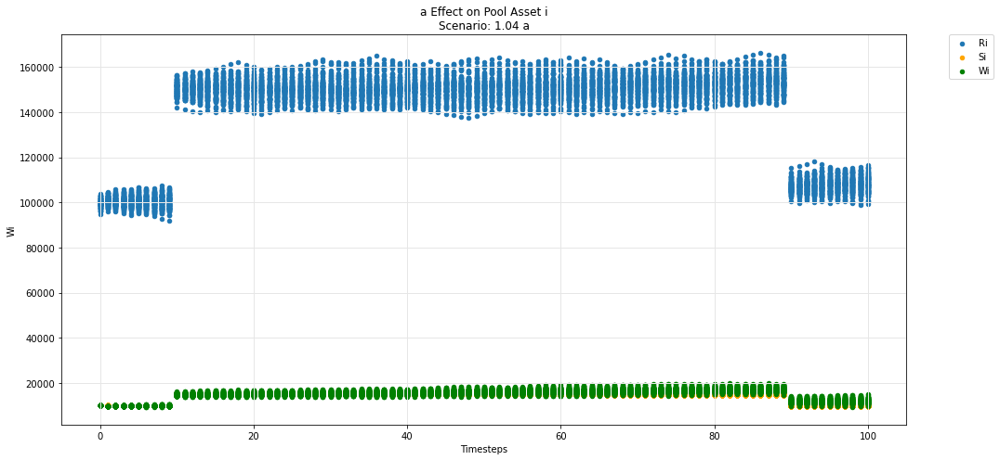

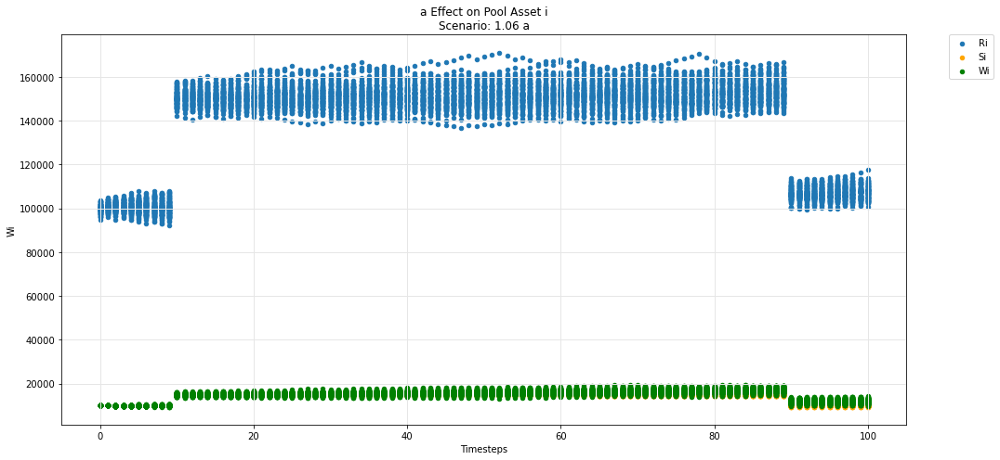

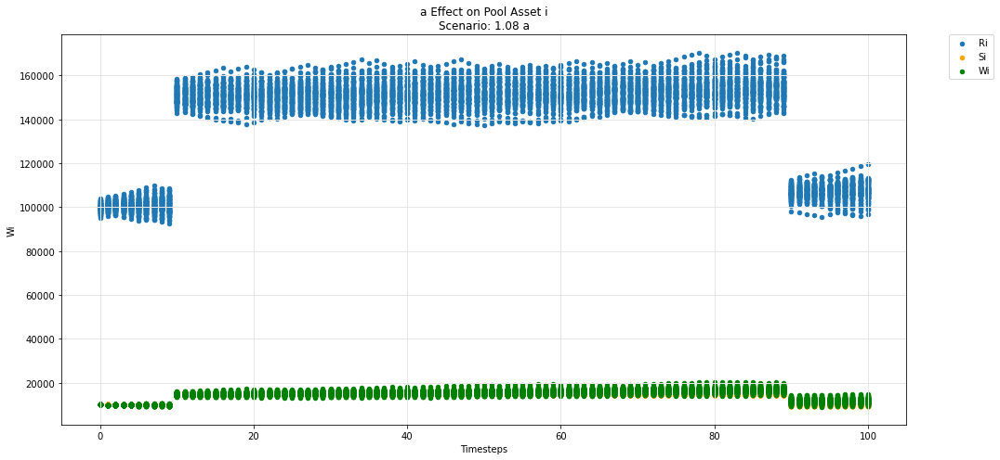

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

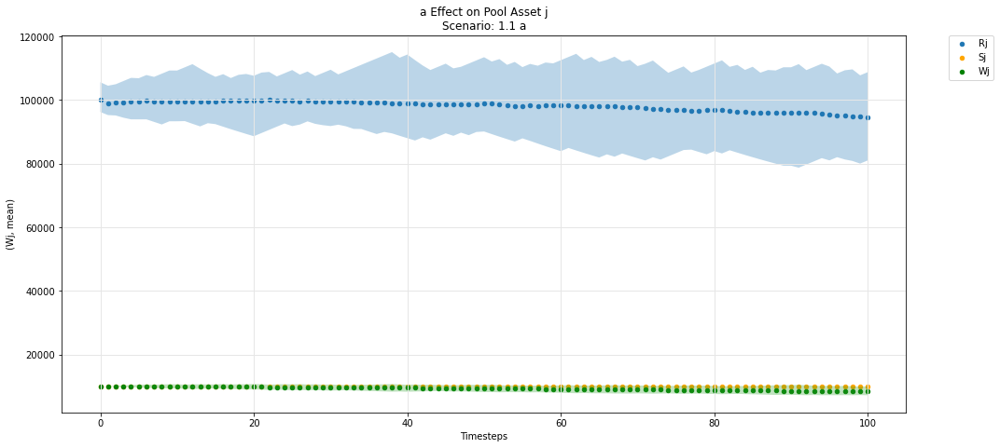

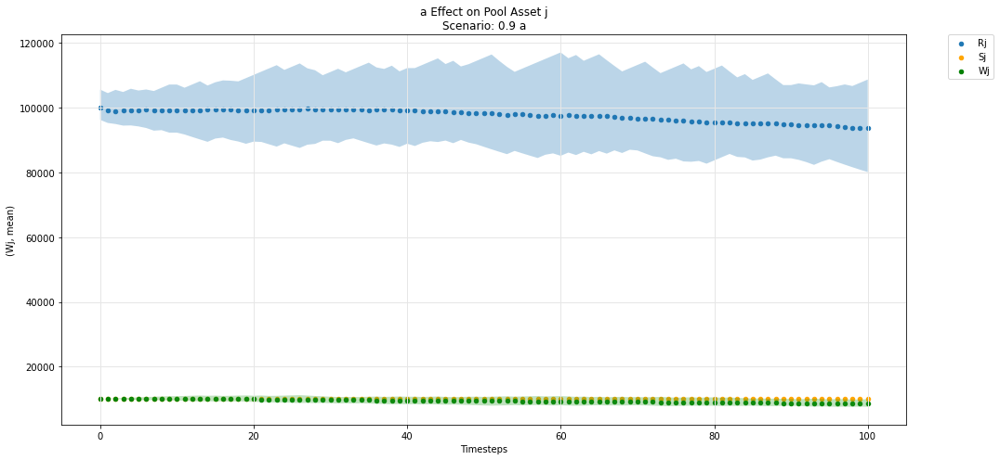

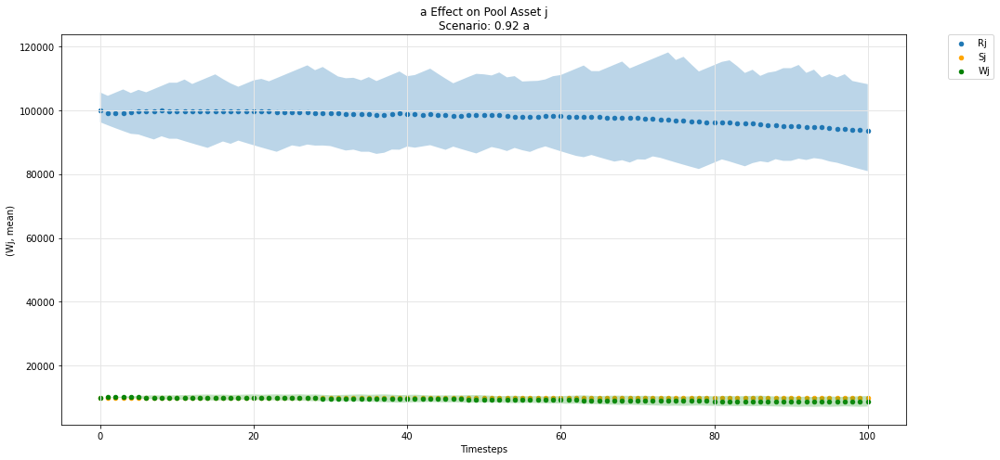

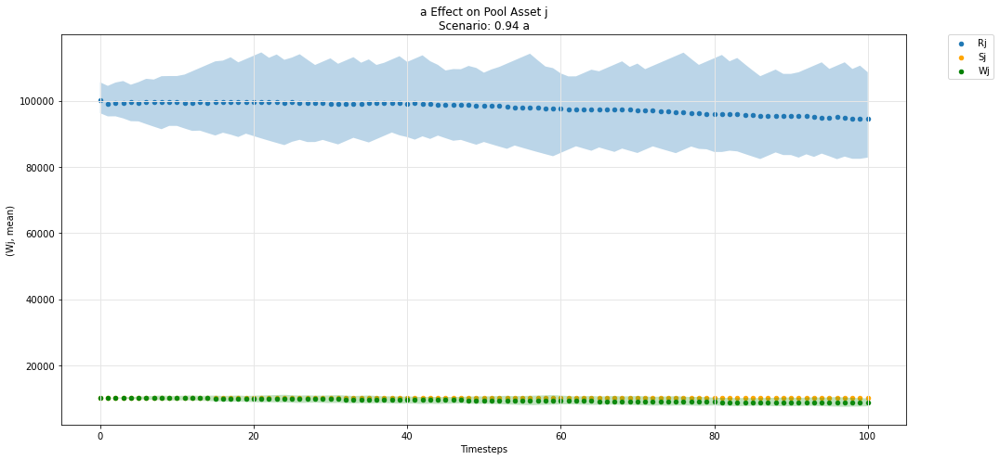

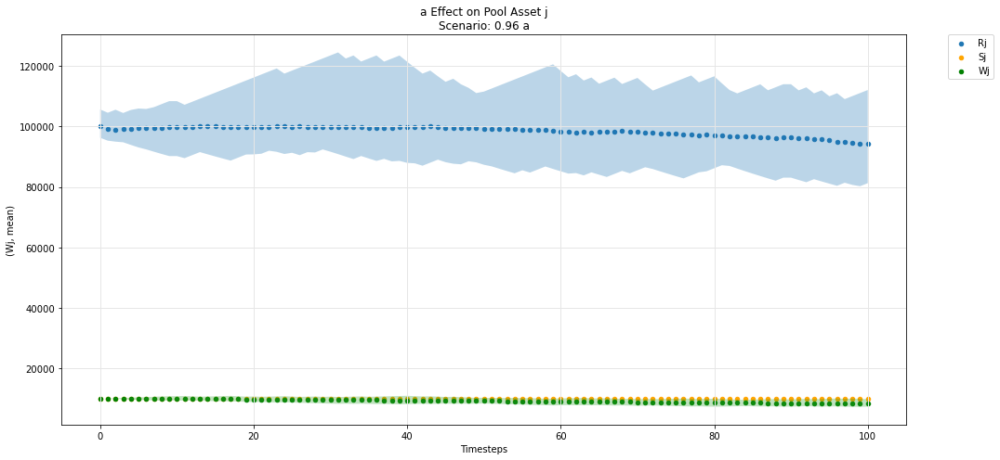

...

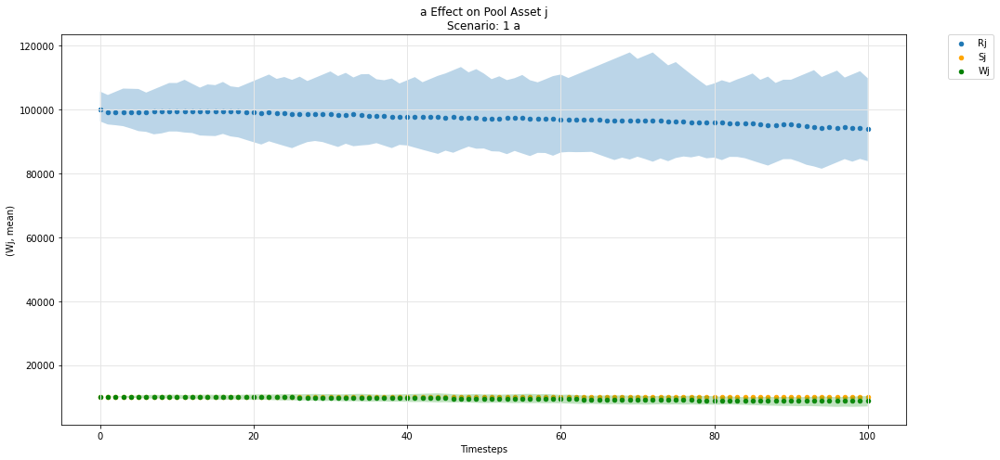

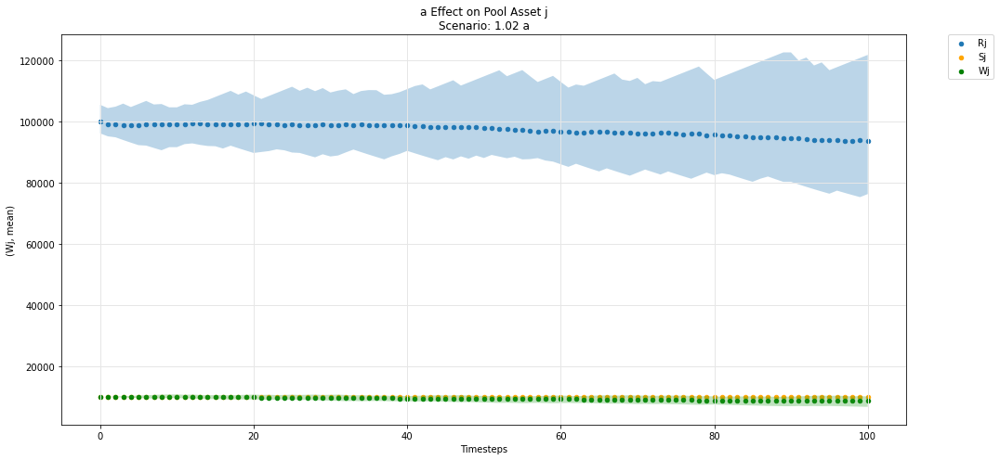

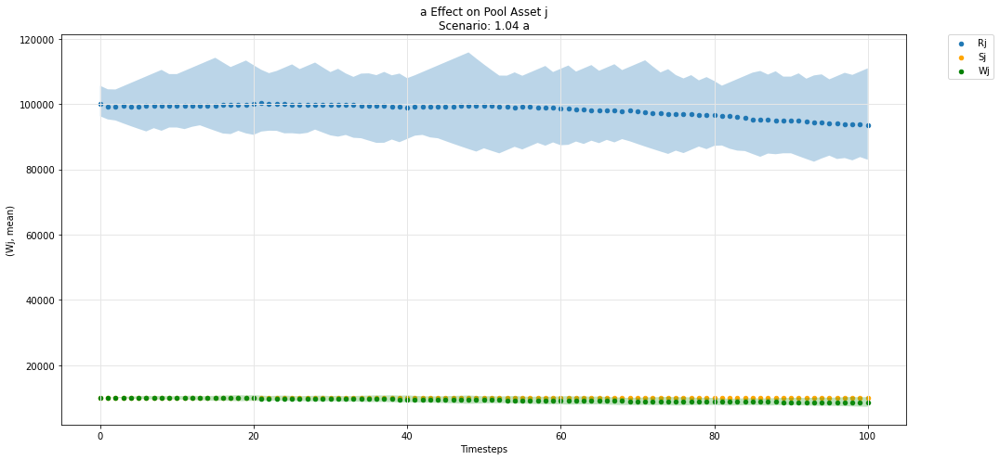

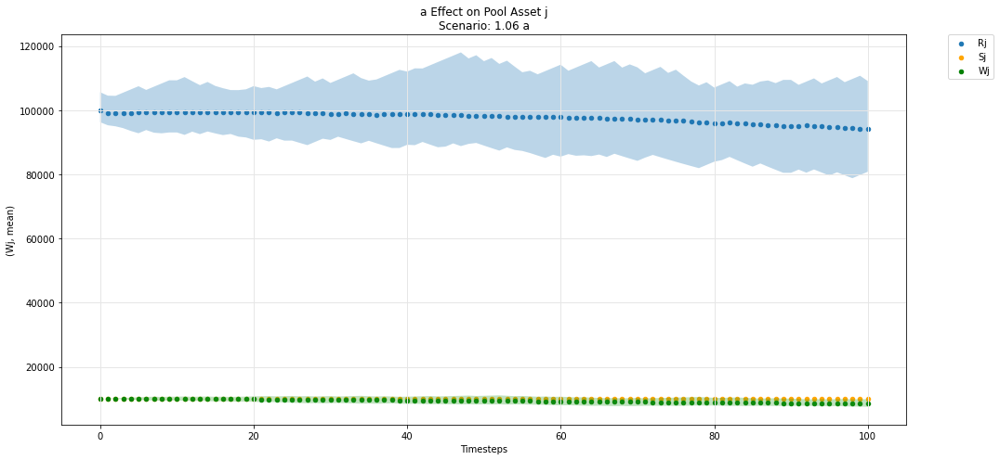

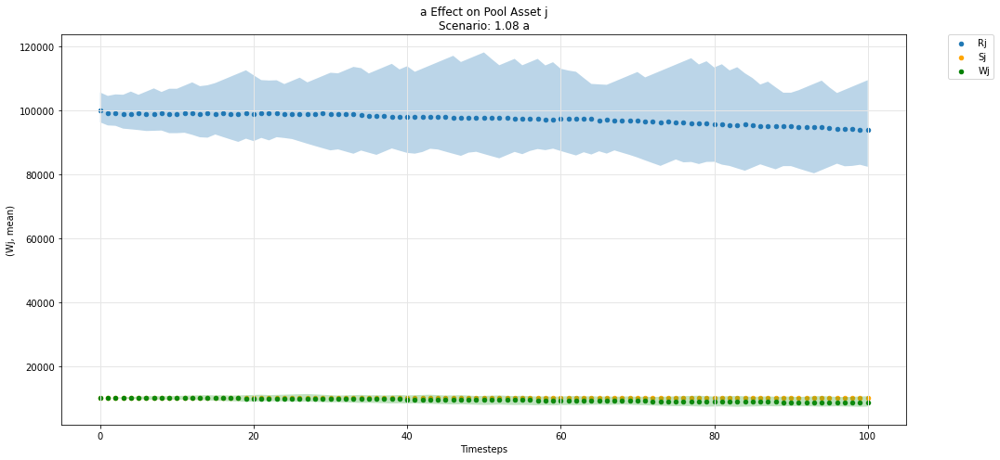

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

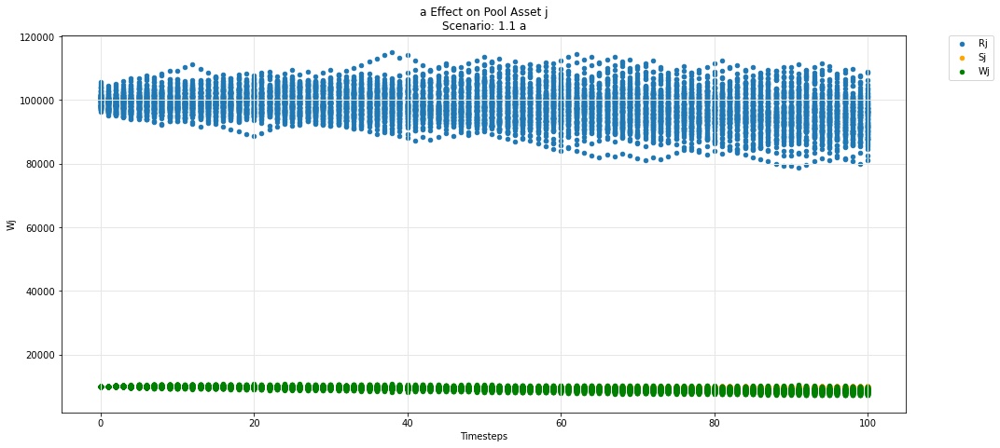

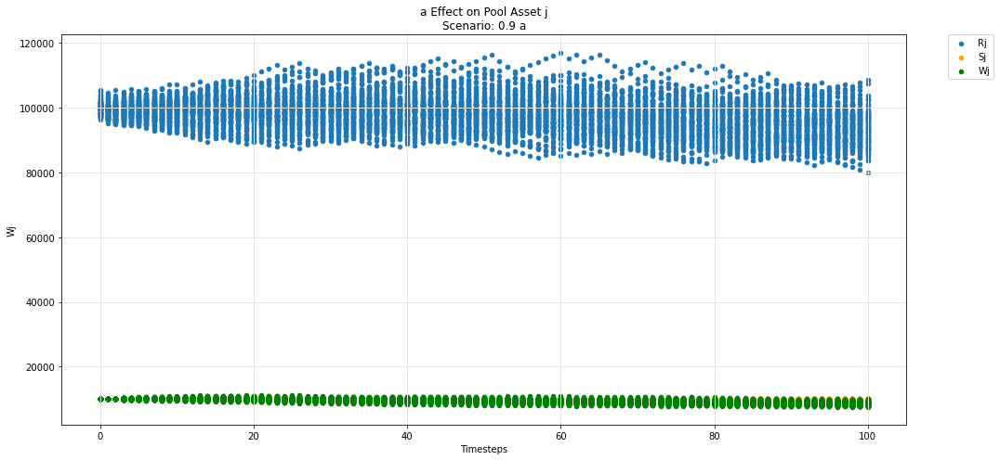

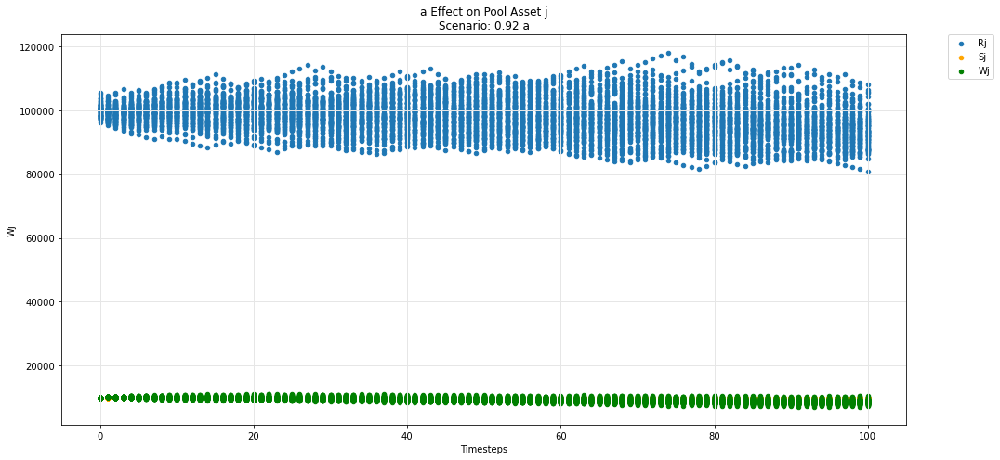

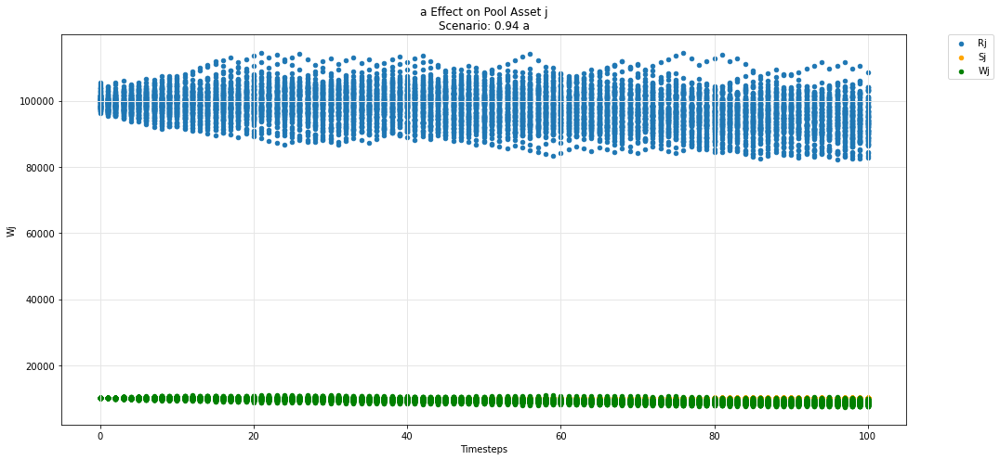

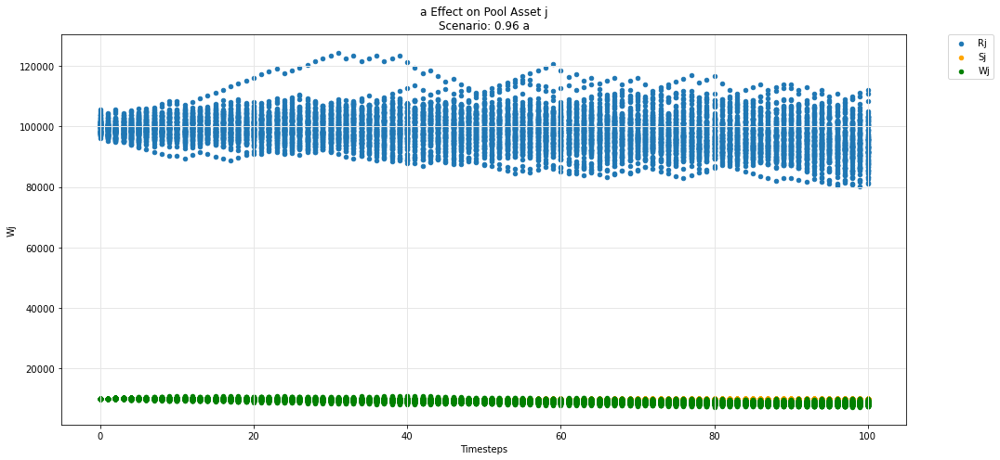

...

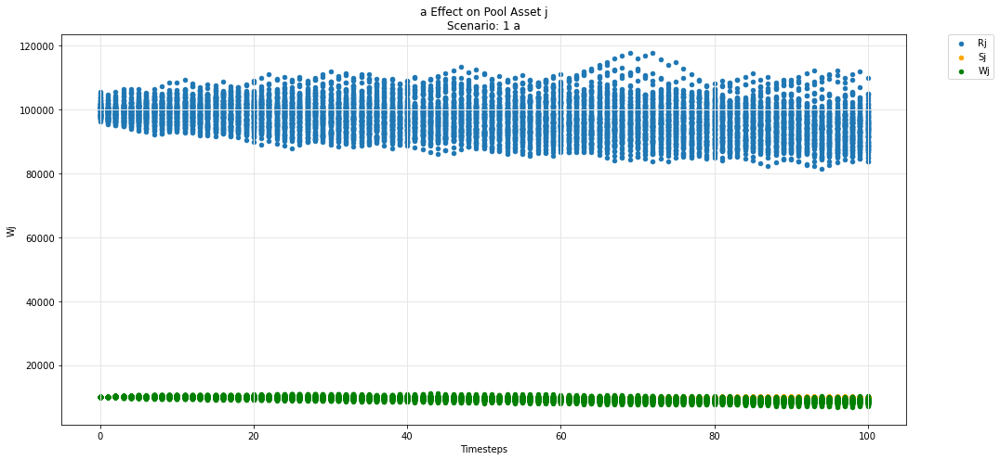

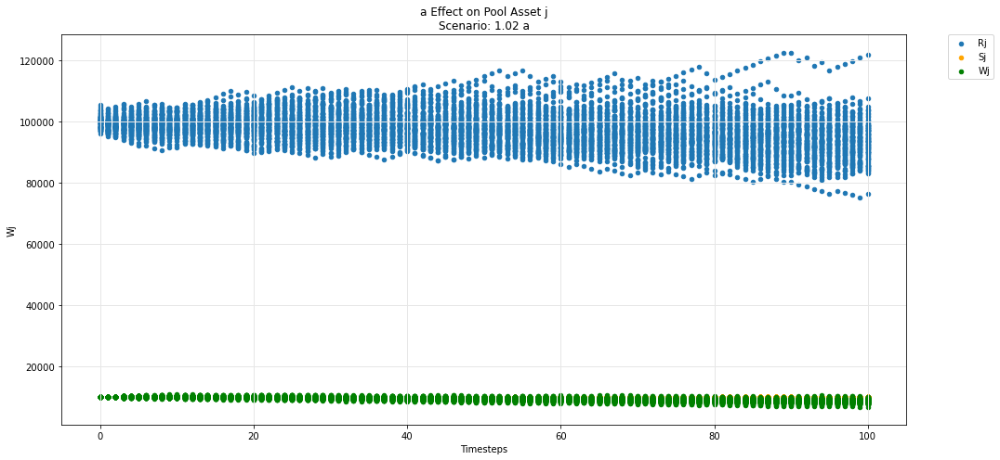

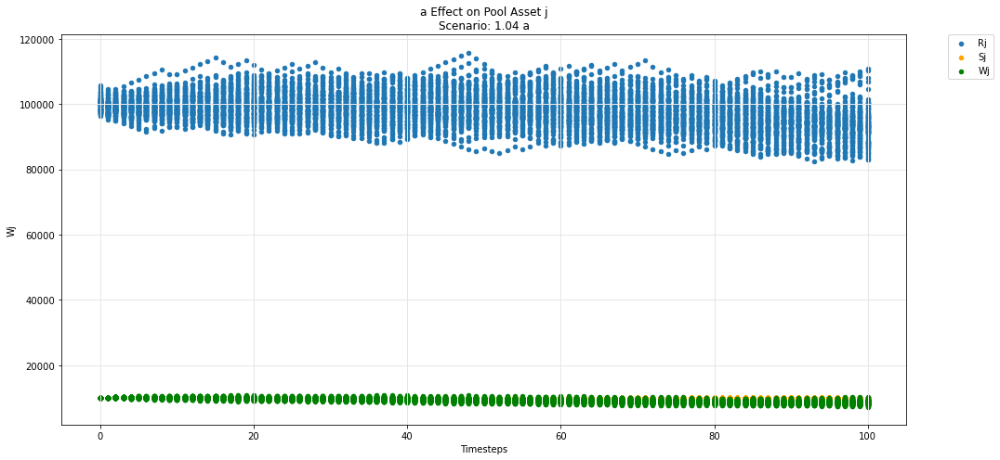

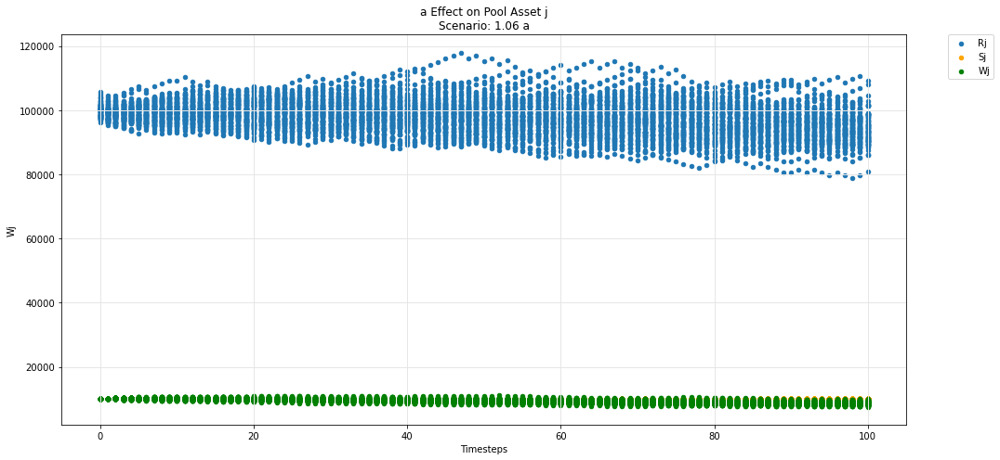

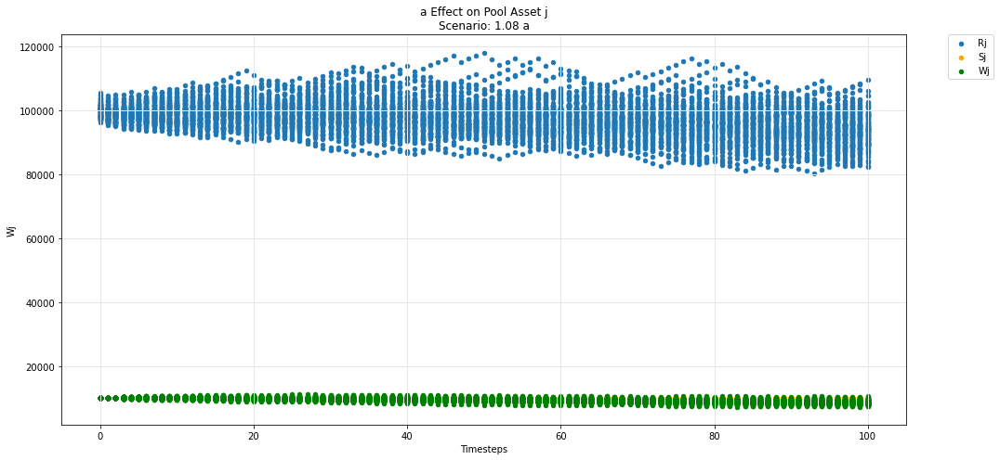

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

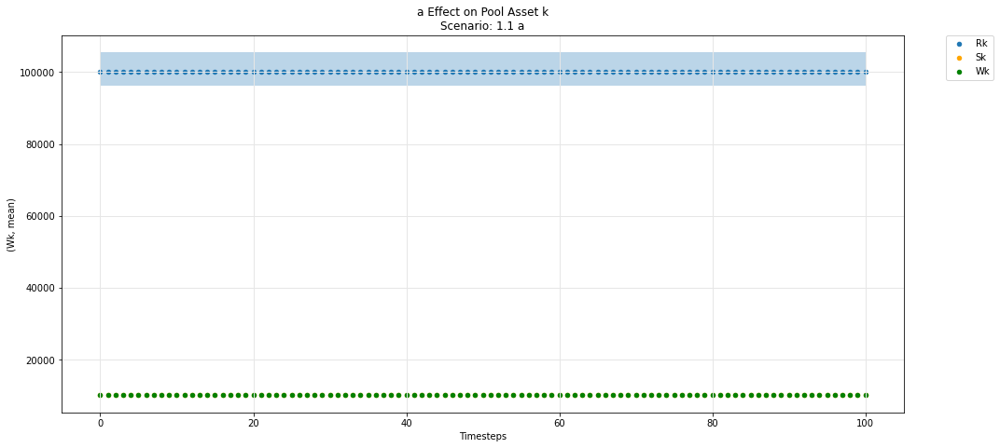

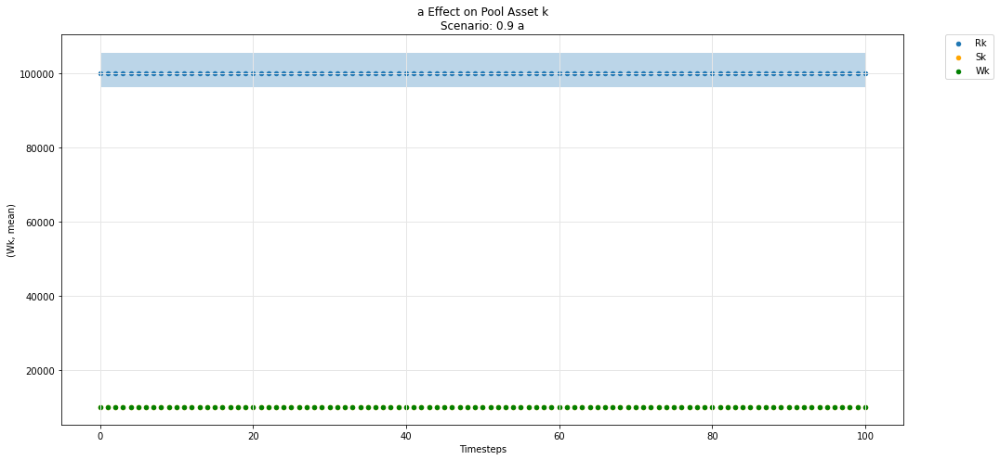

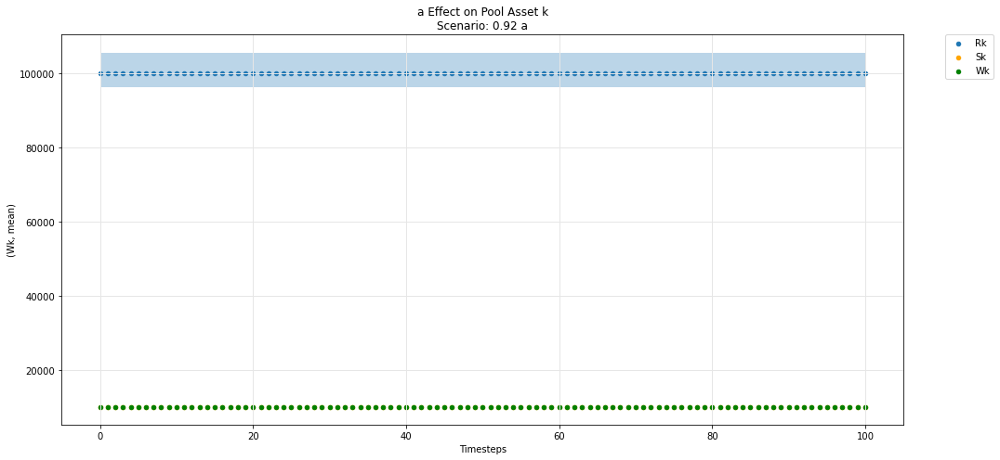

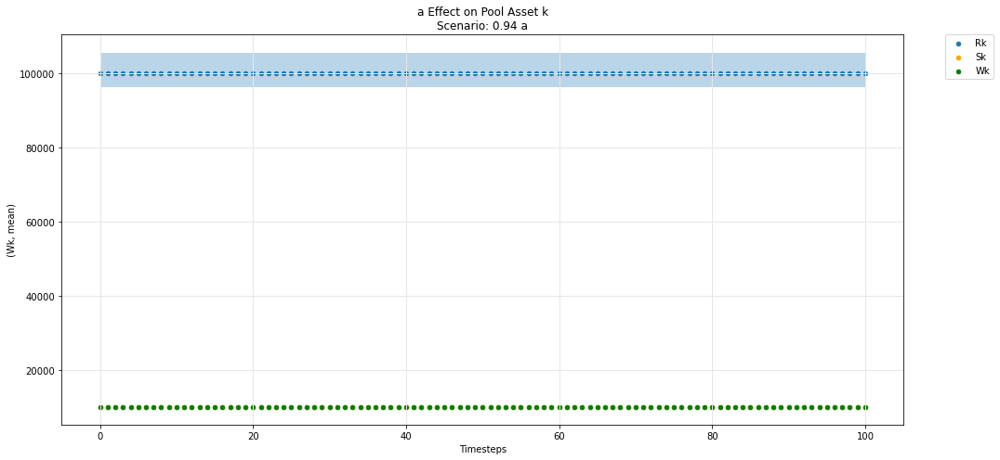

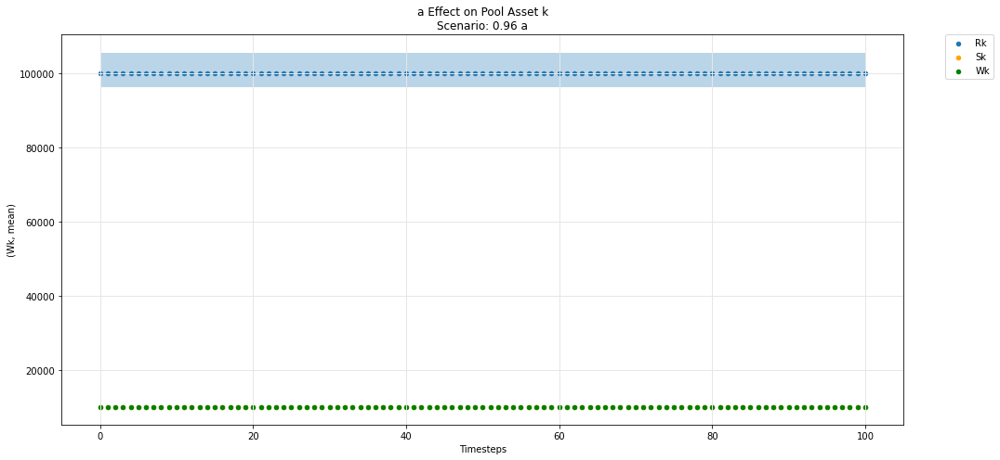

...

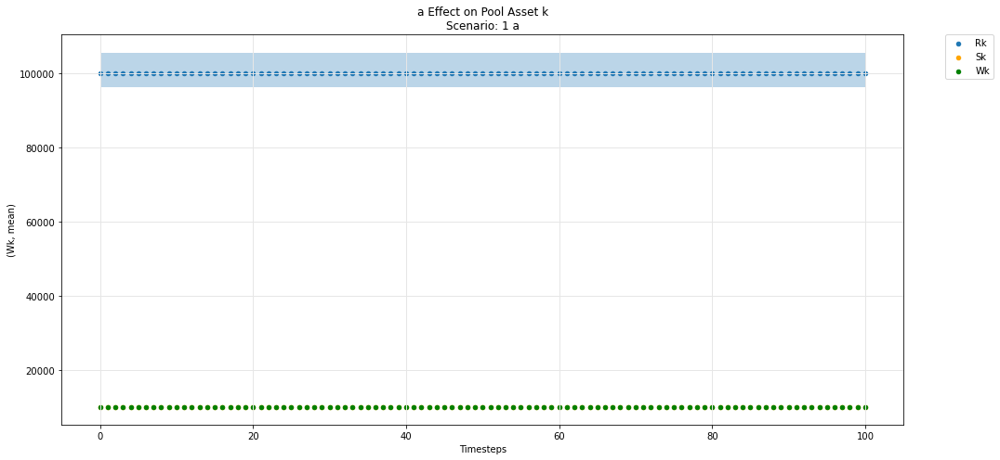

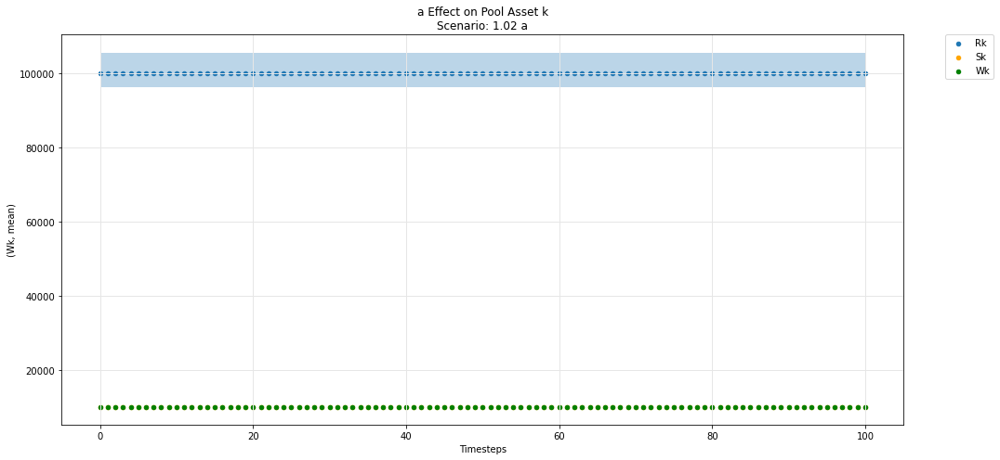

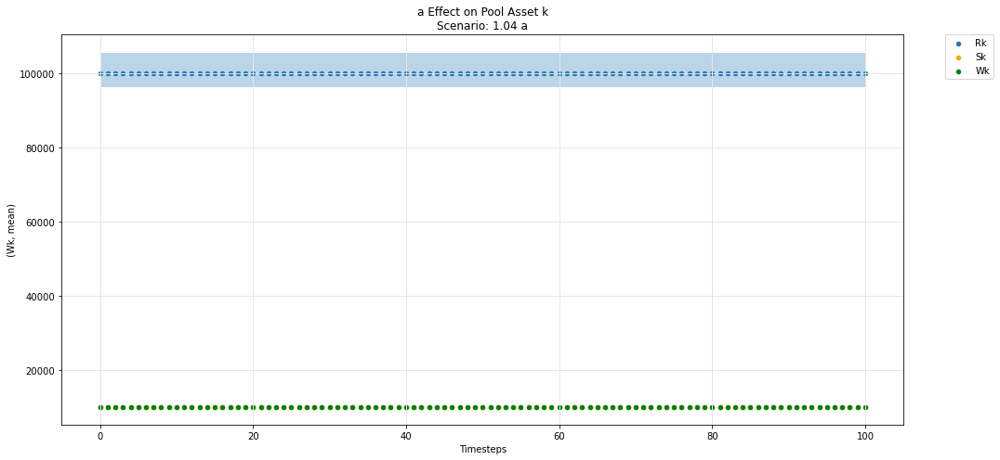

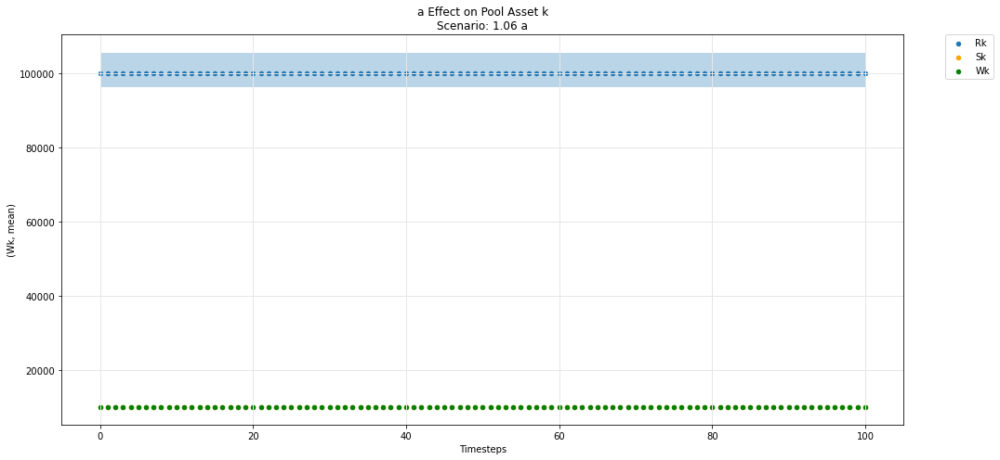

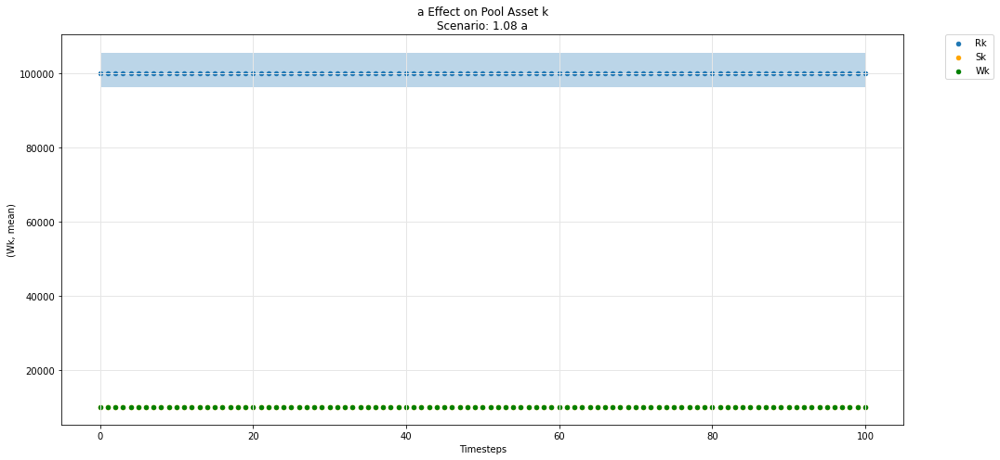

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

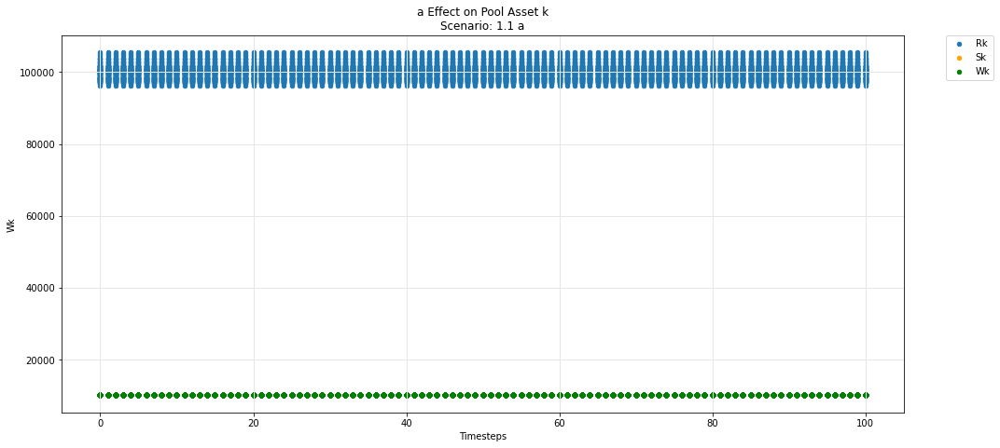

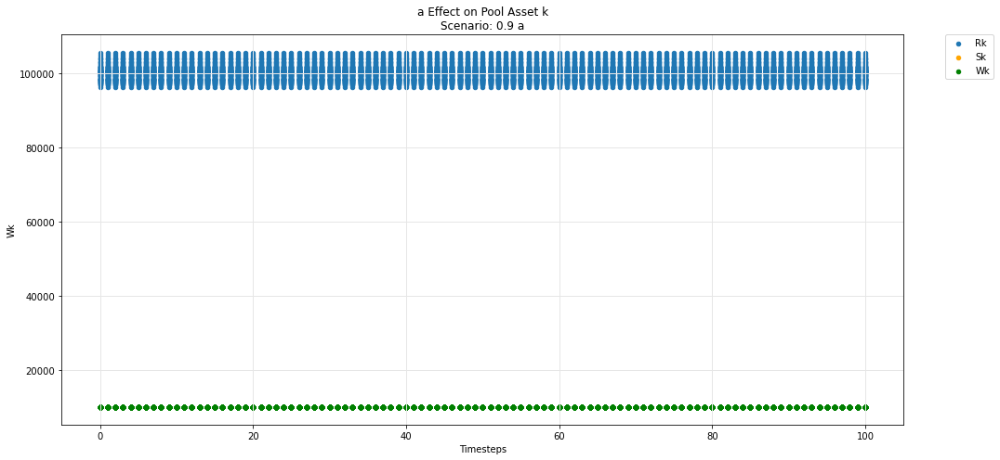

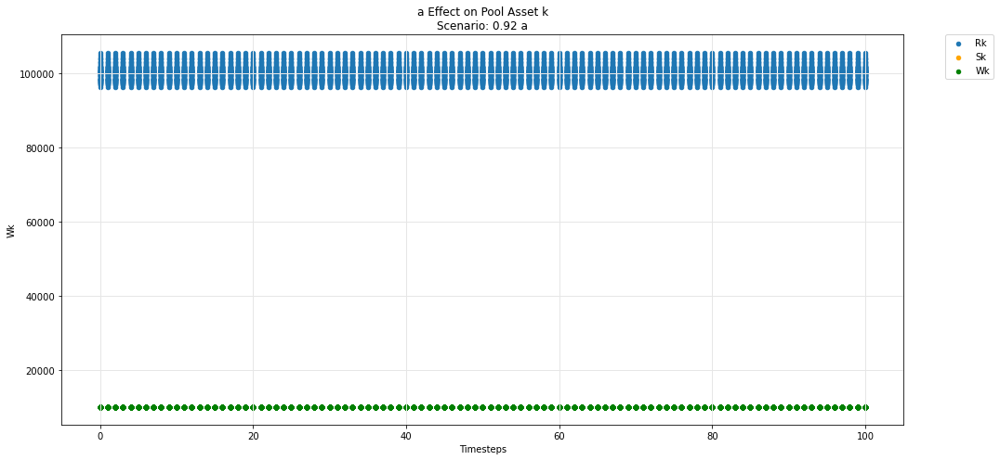

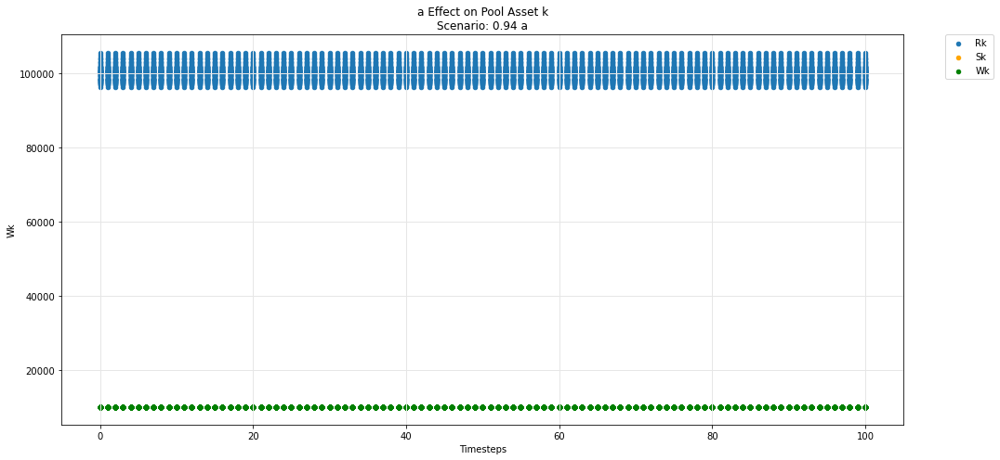

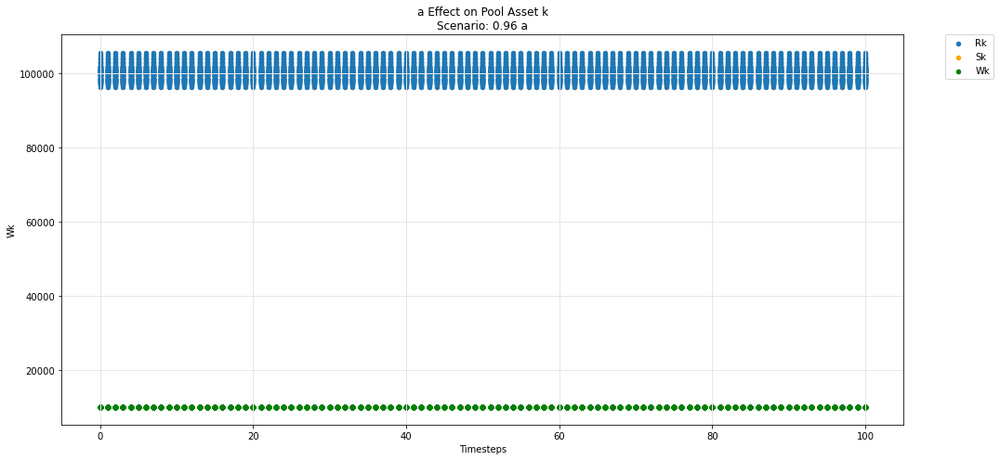

...

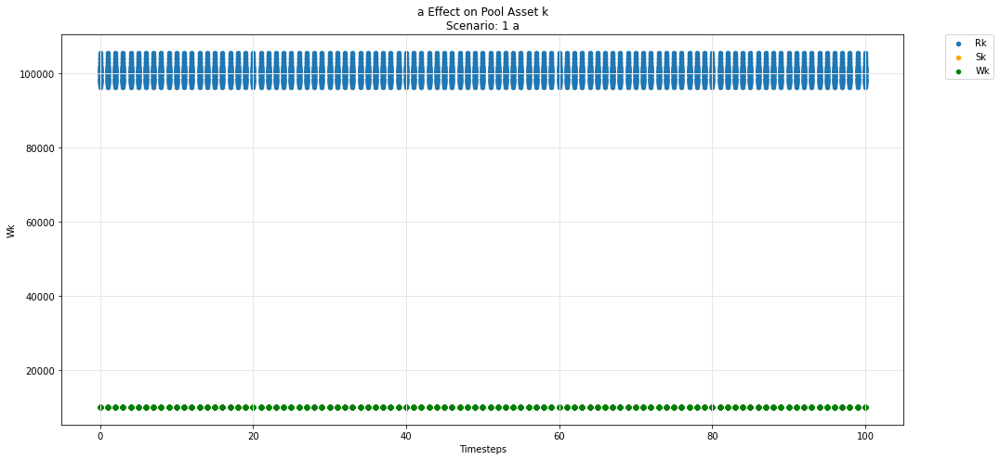

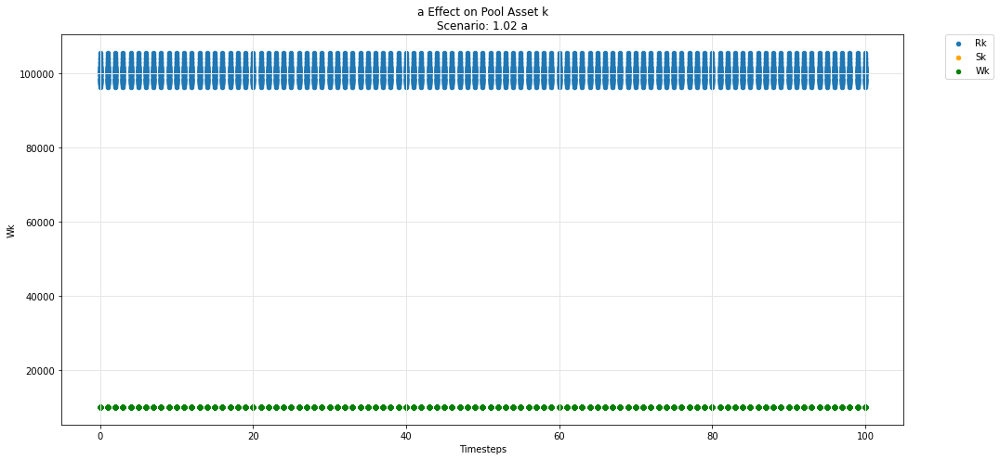

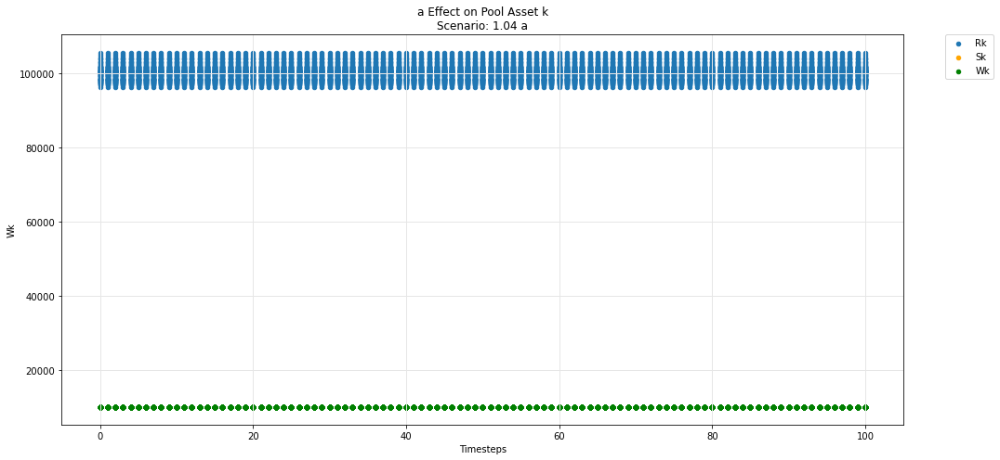

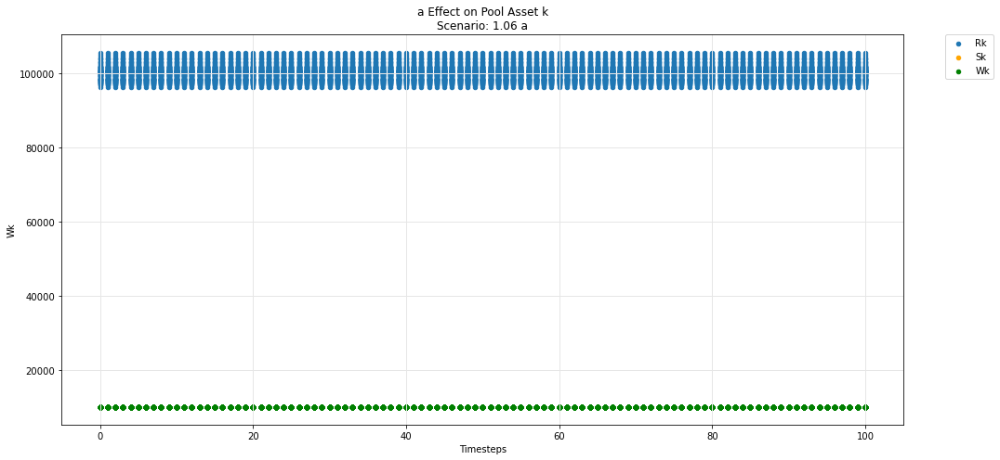

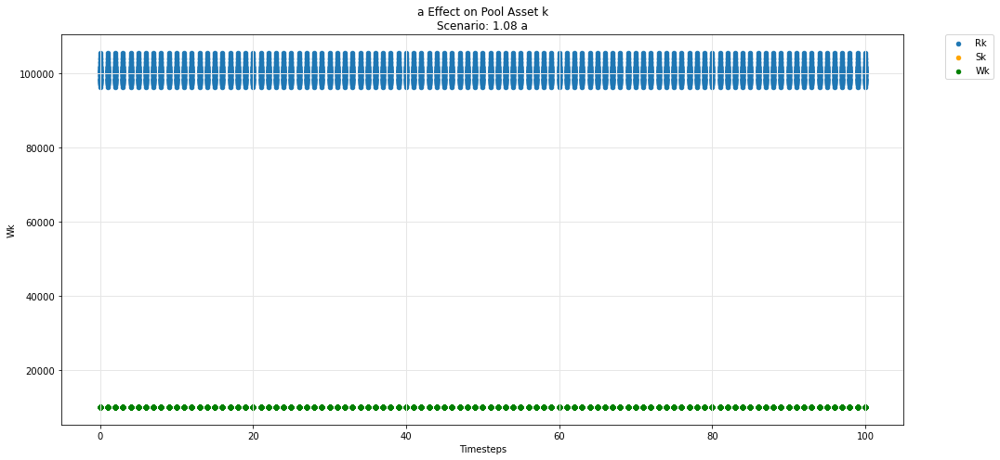

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

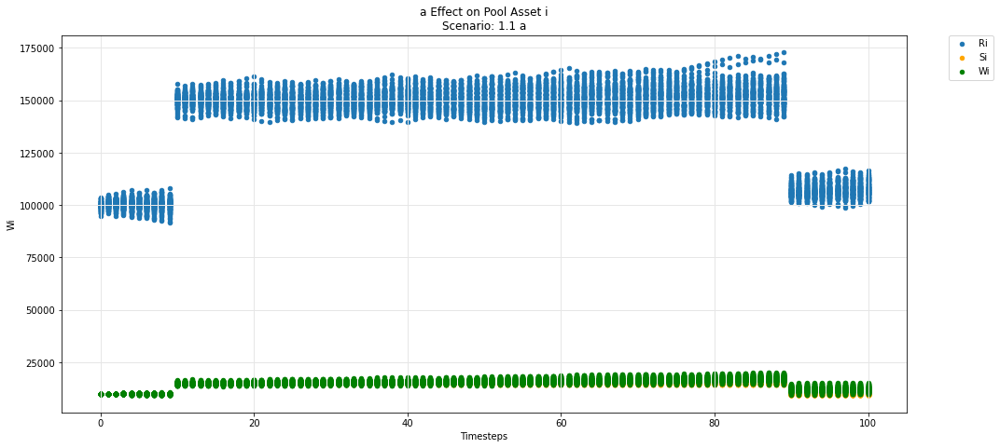

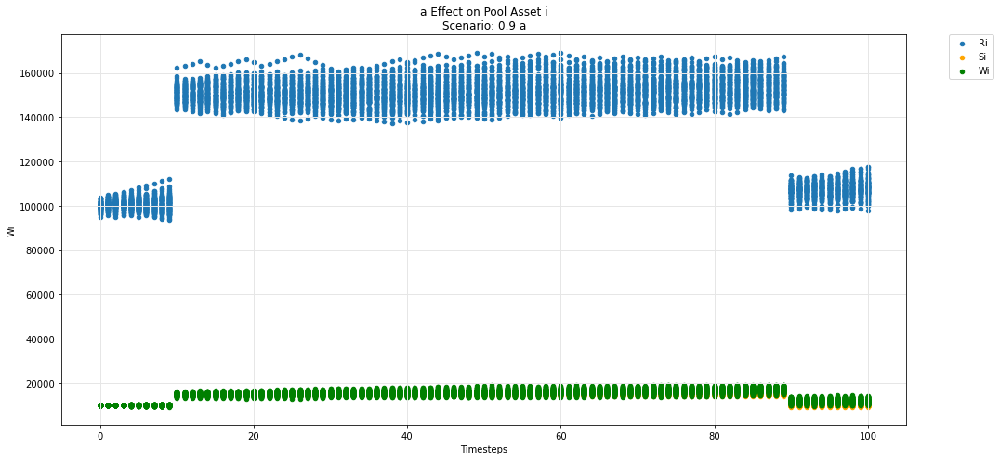

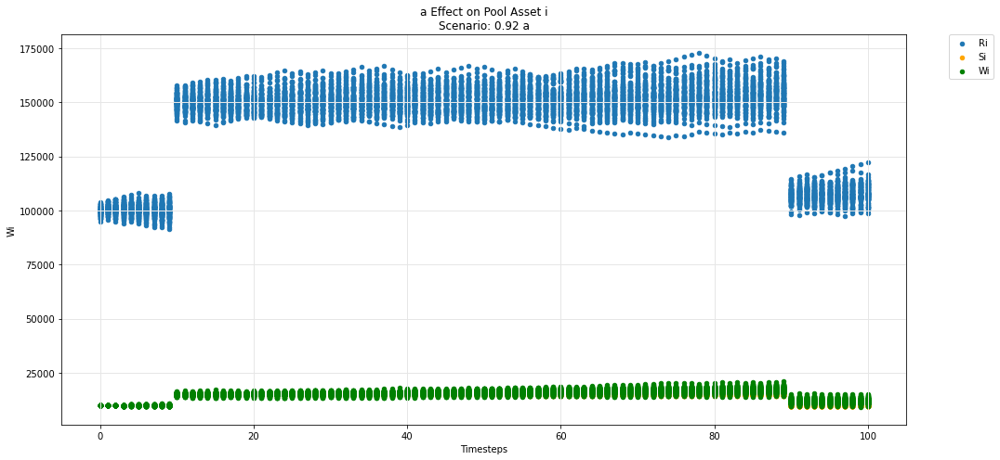

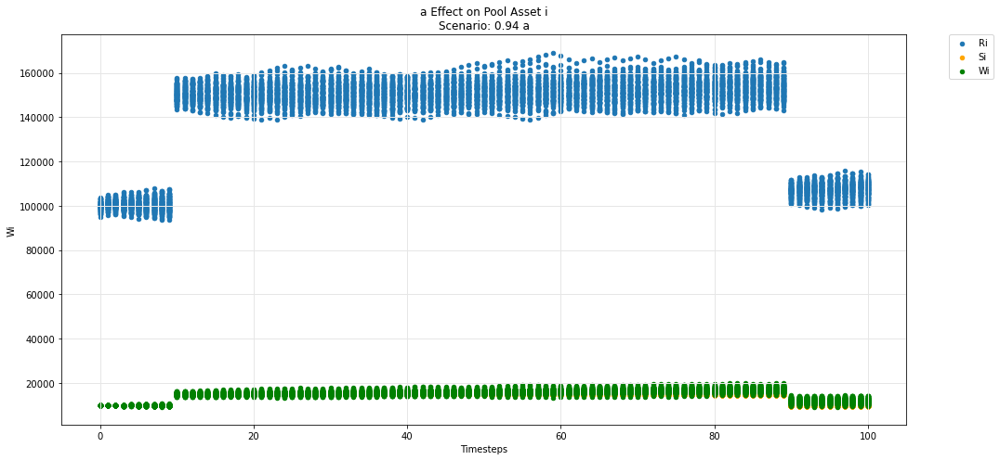

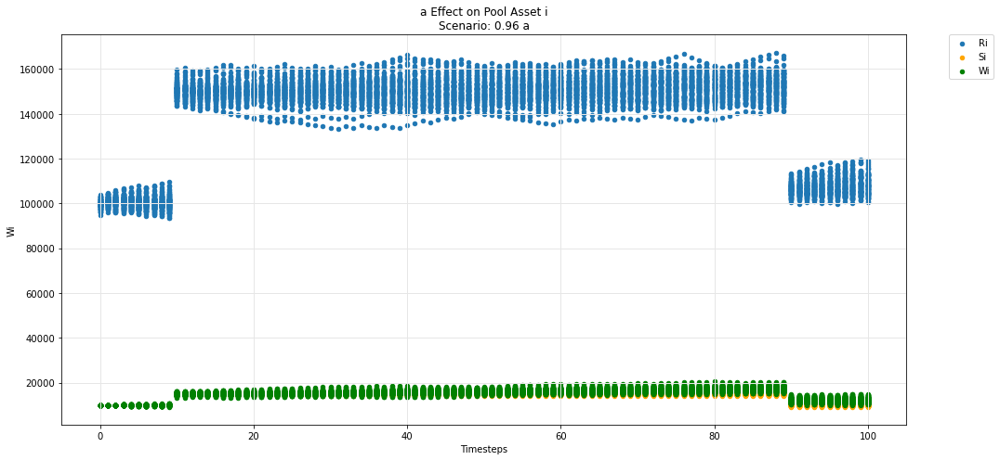

...

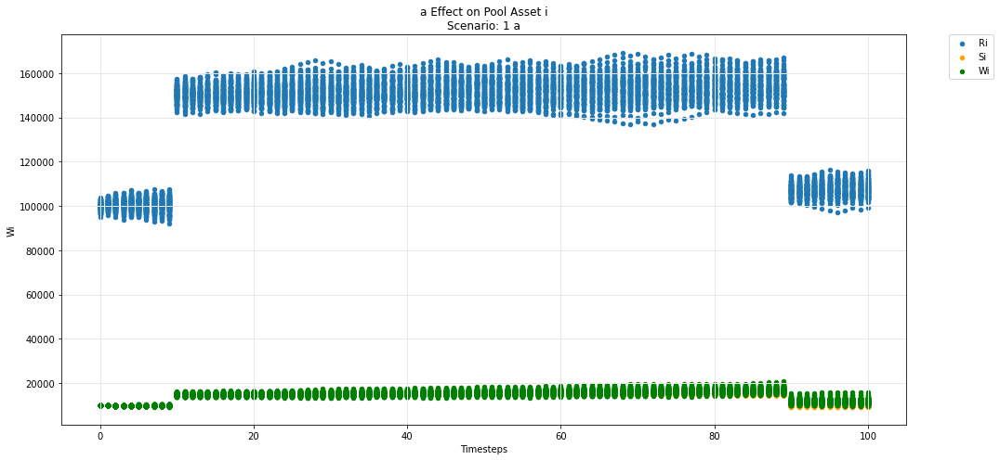

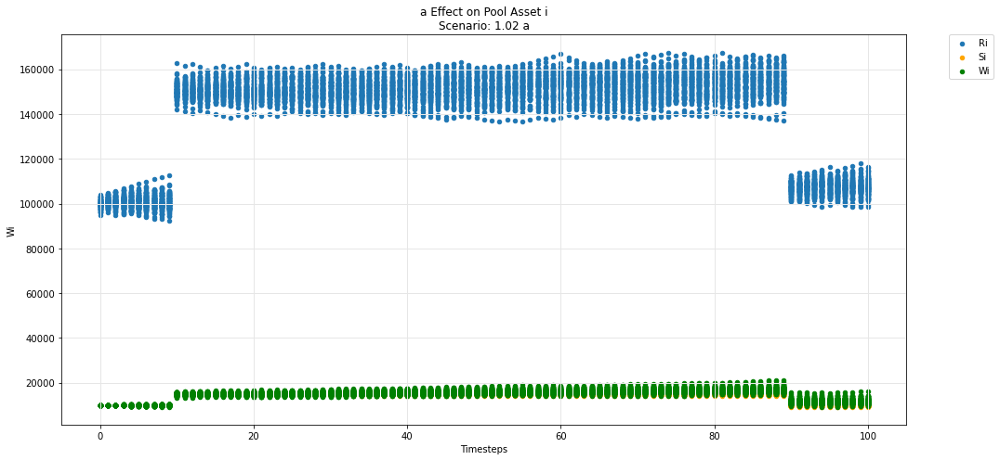

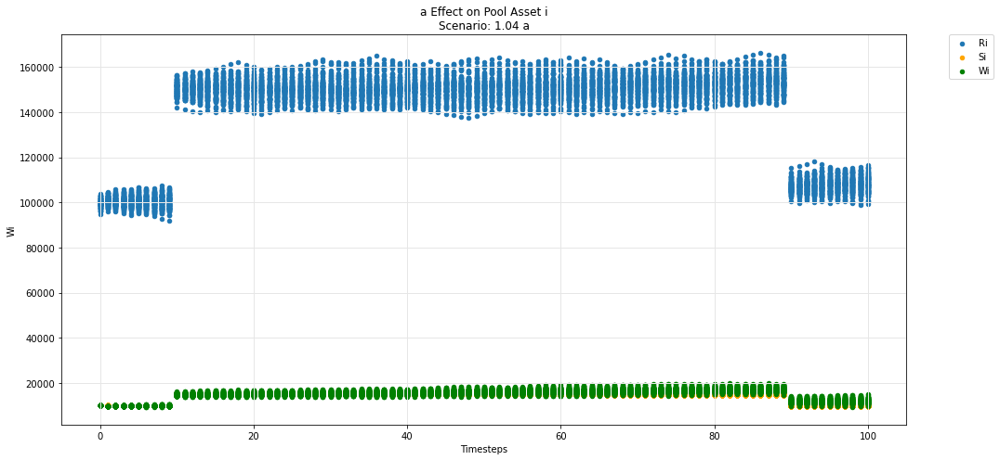

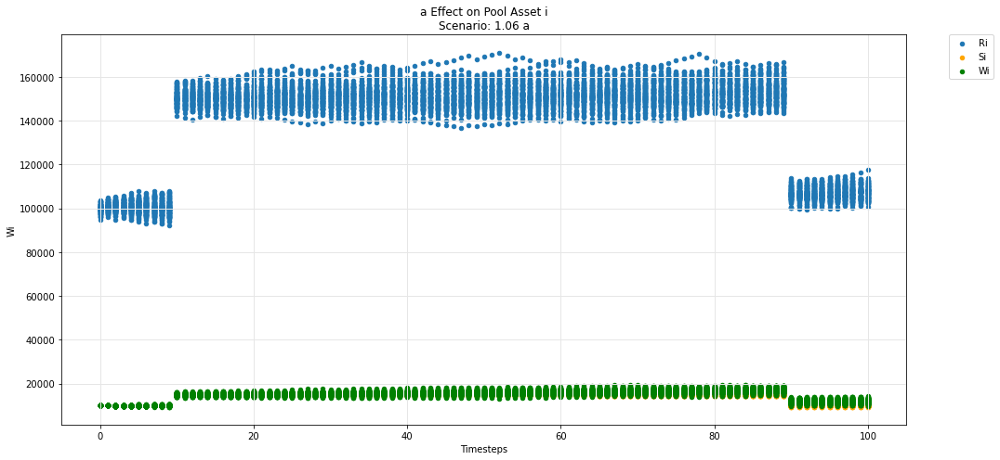

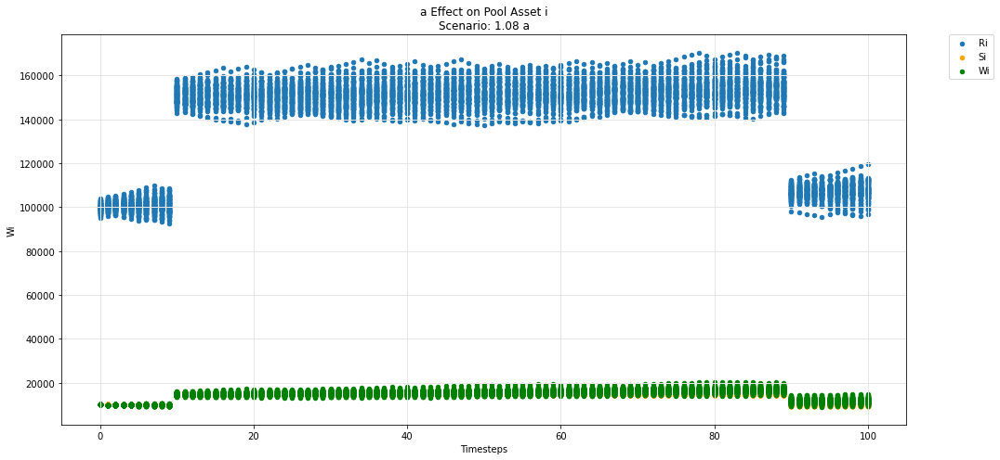

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

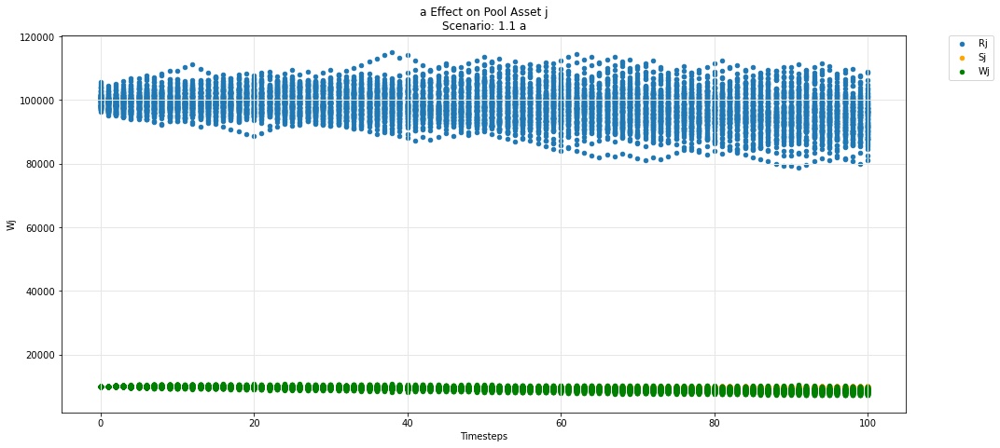

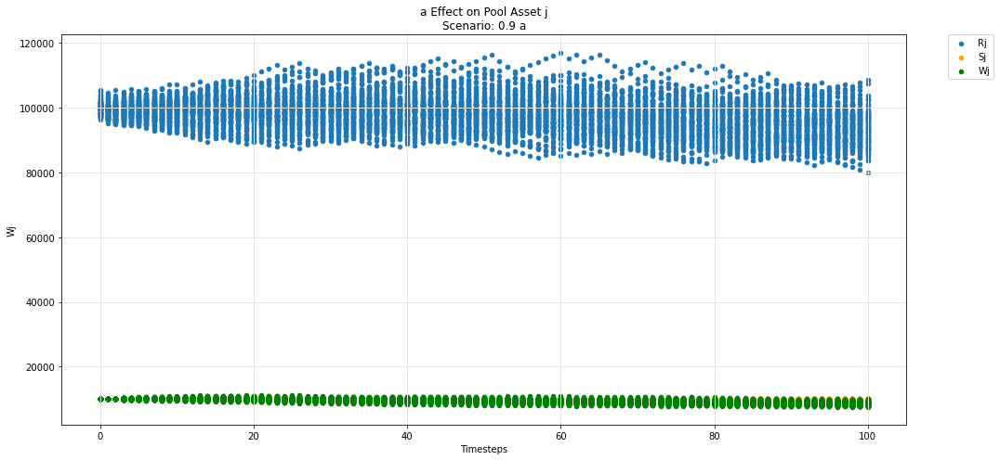

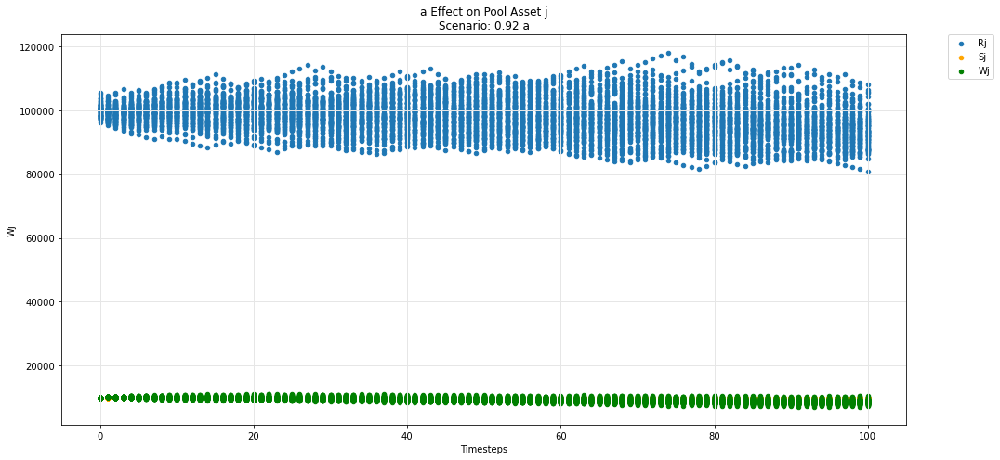

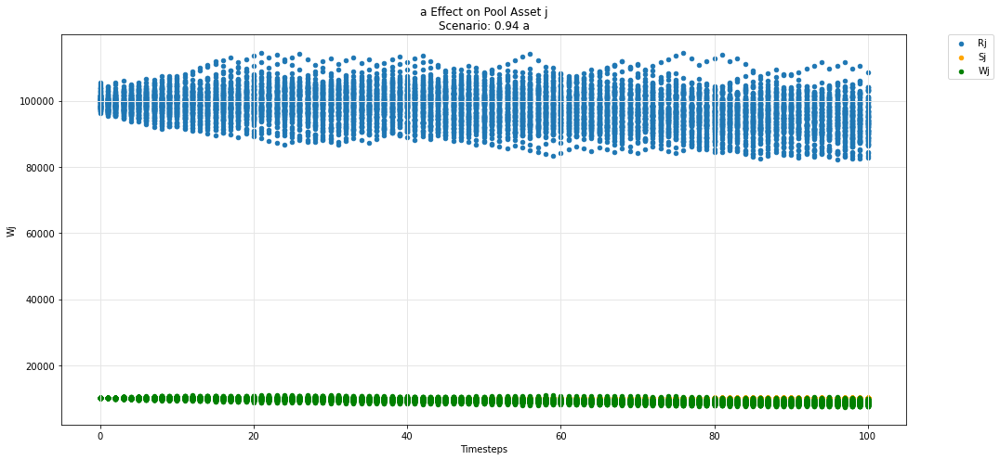

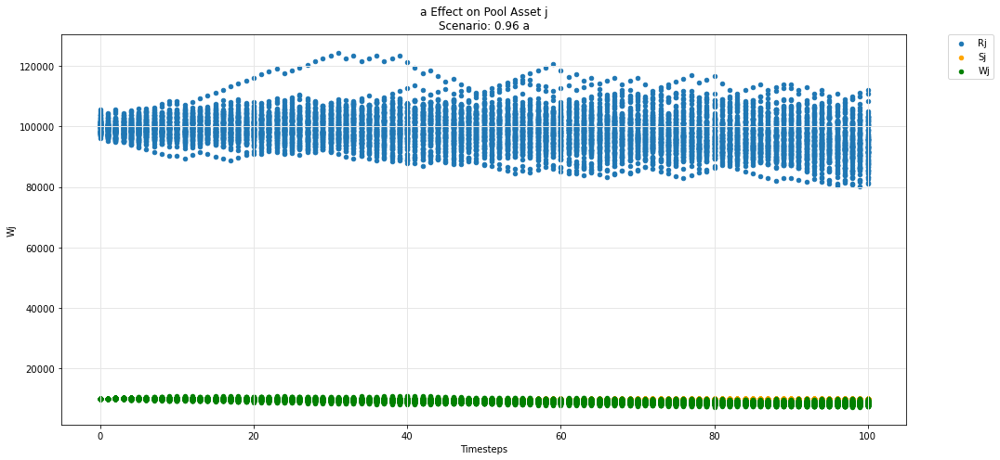

...

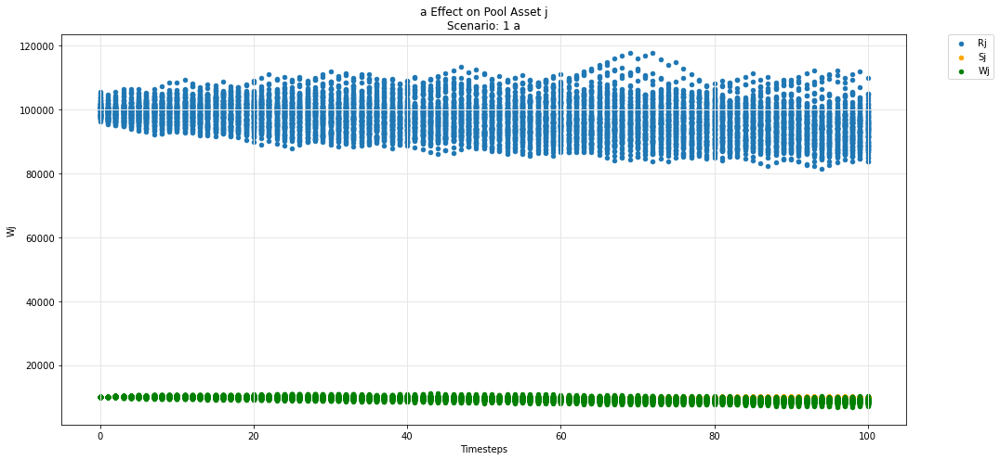

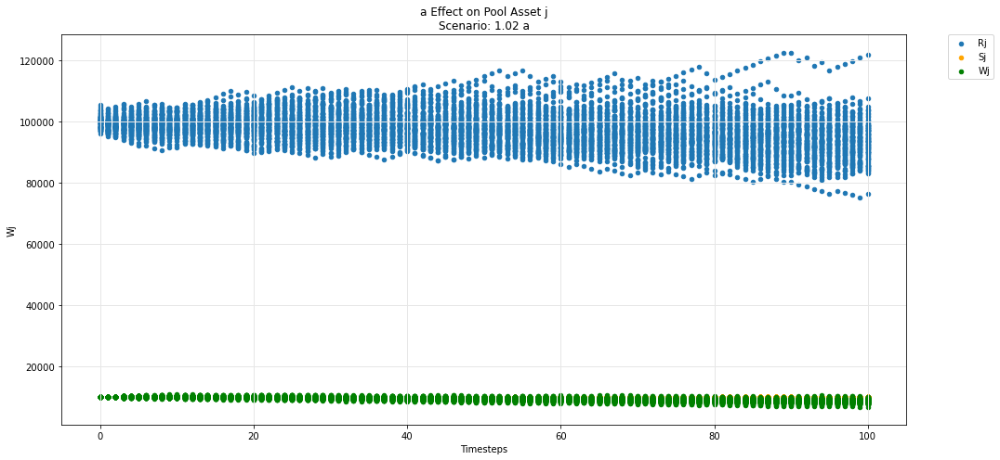

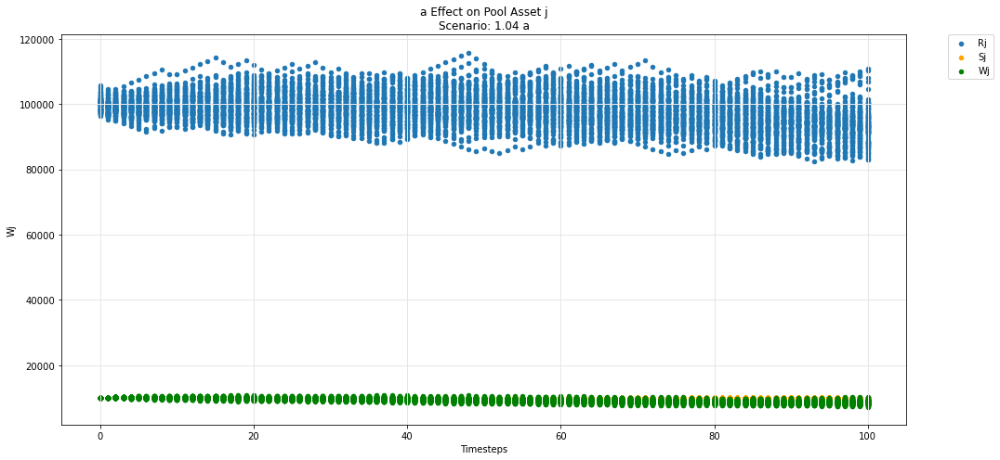

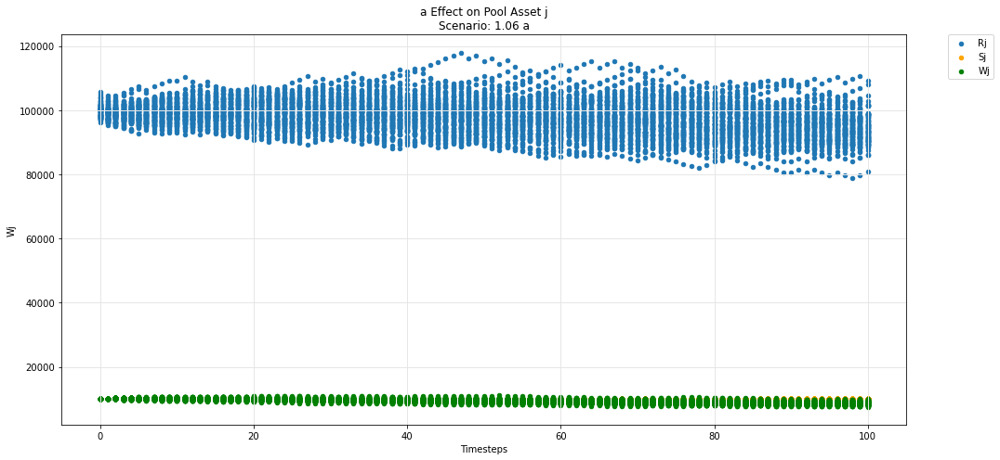

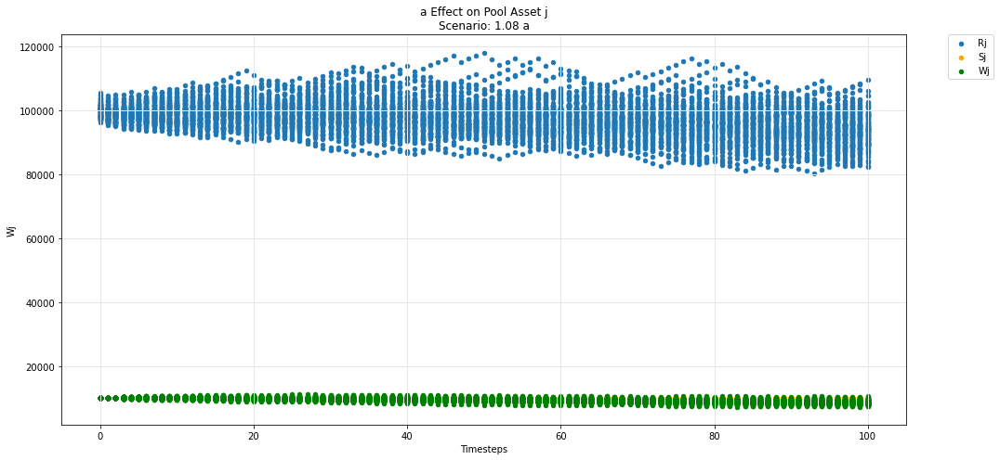

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

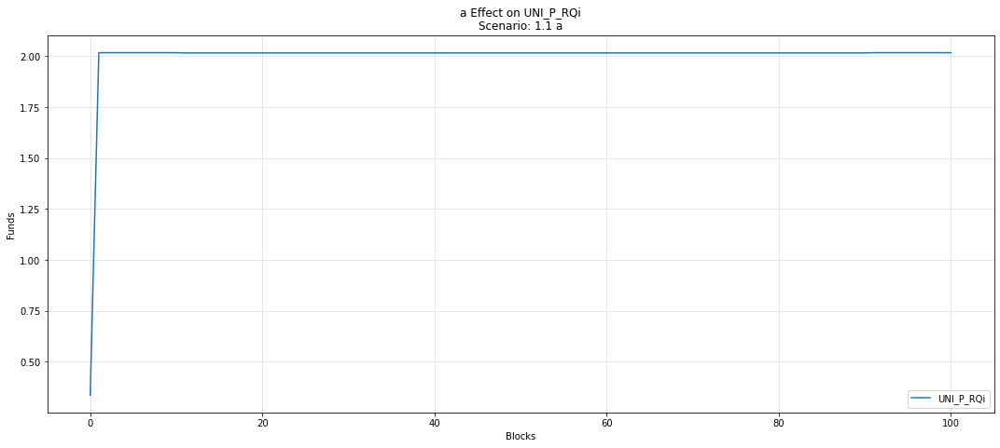

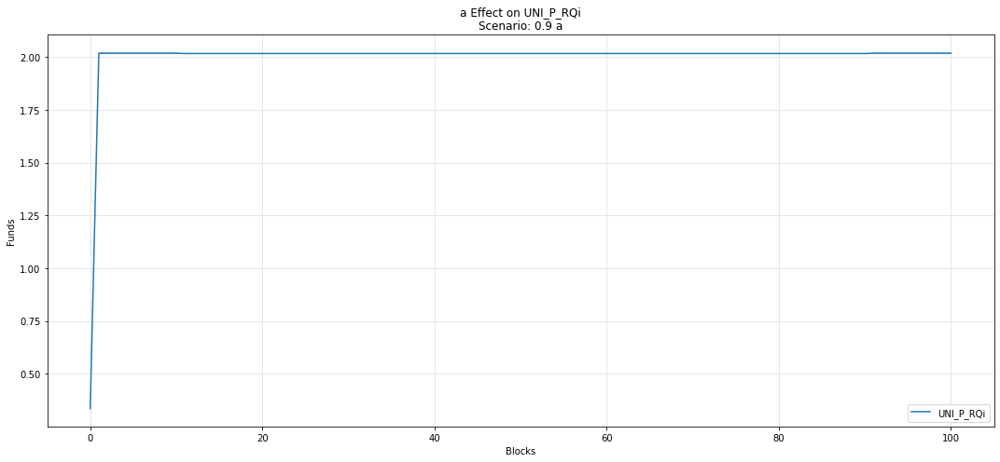

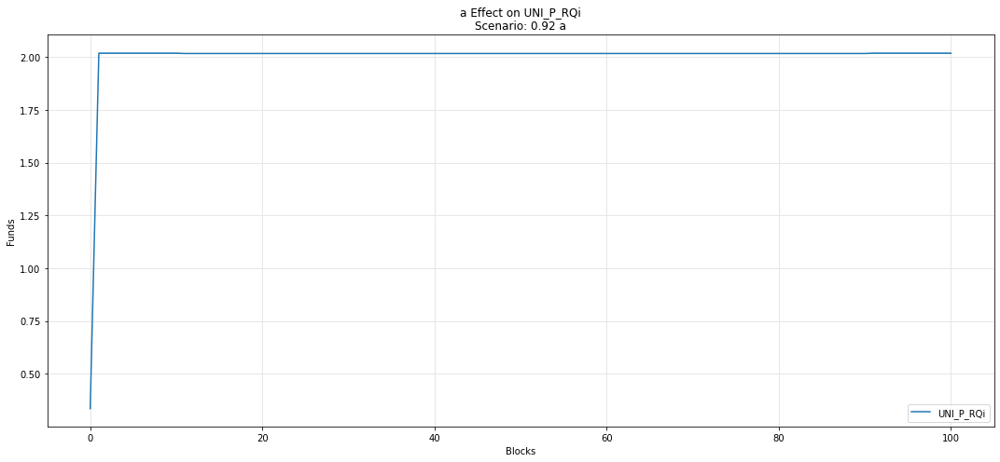

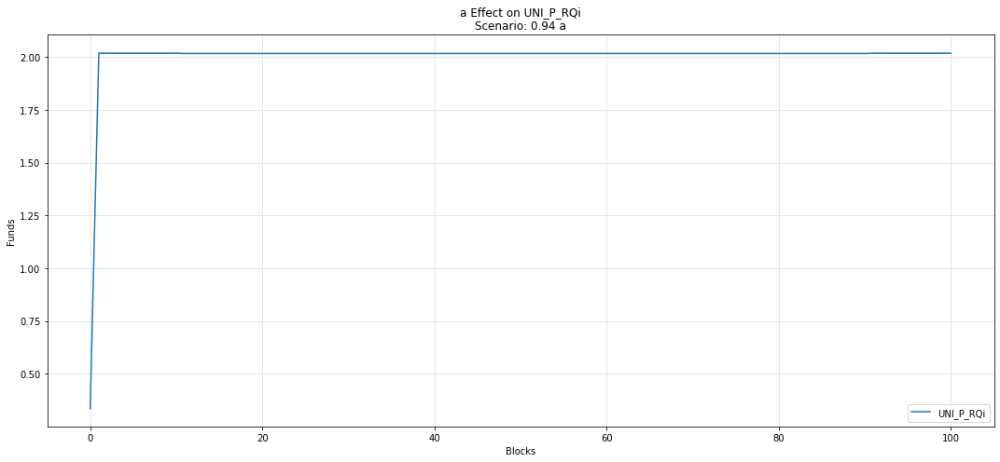

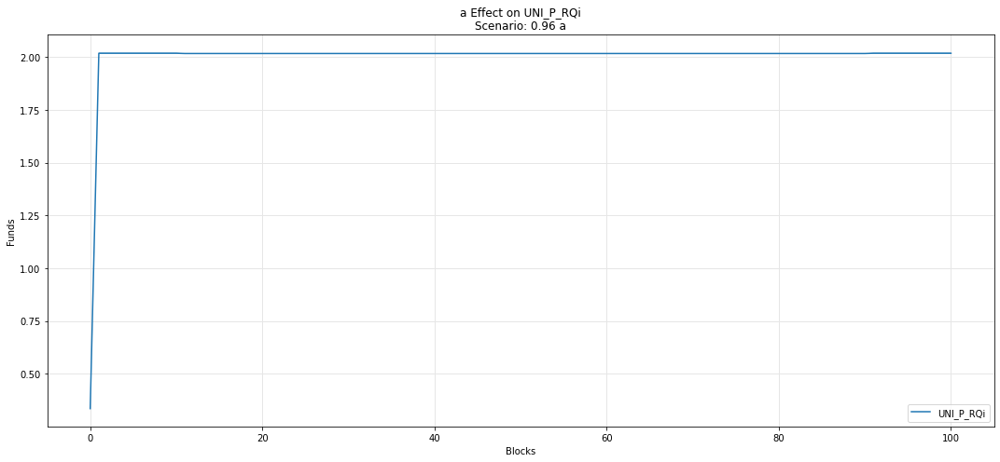

...

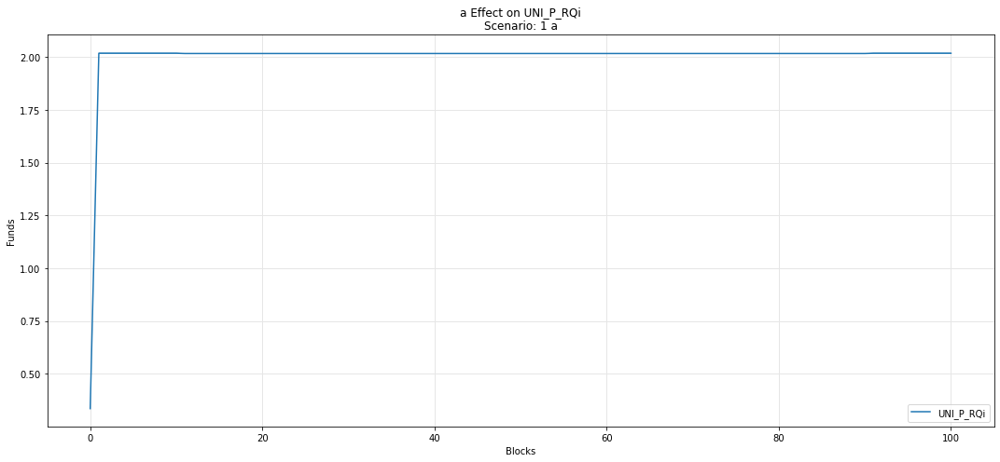

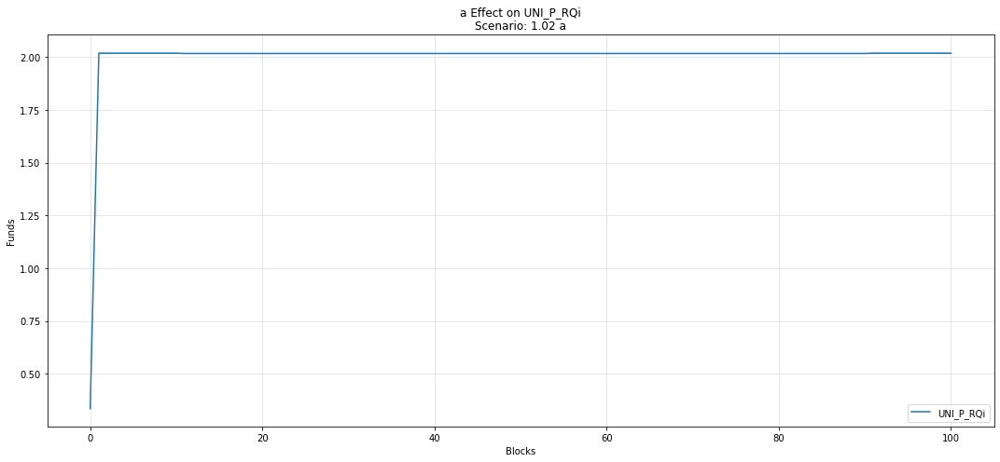

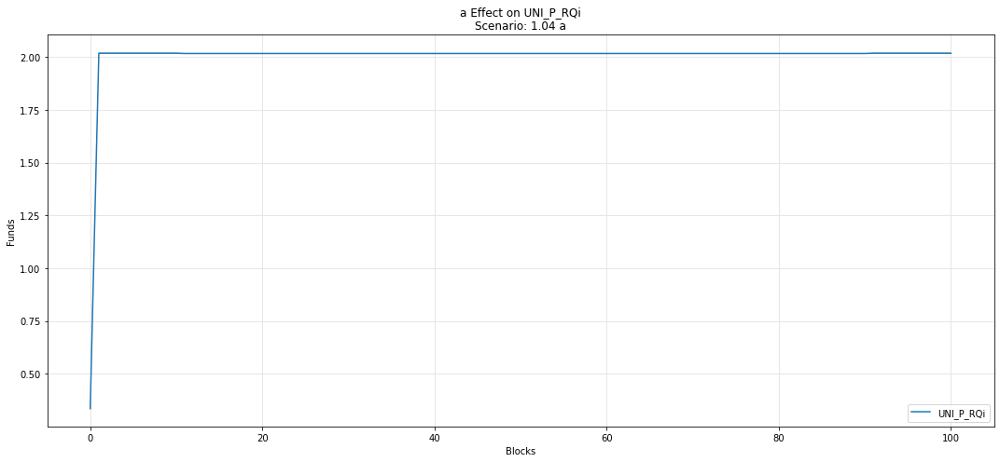

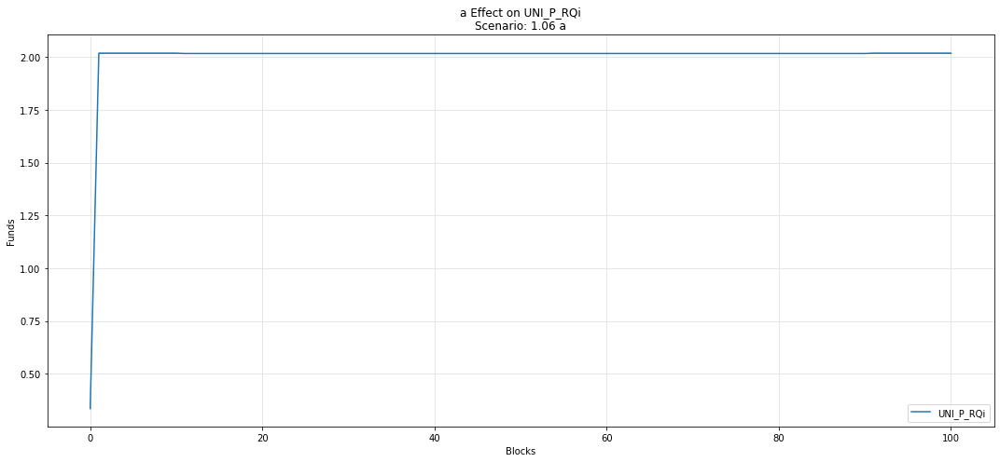

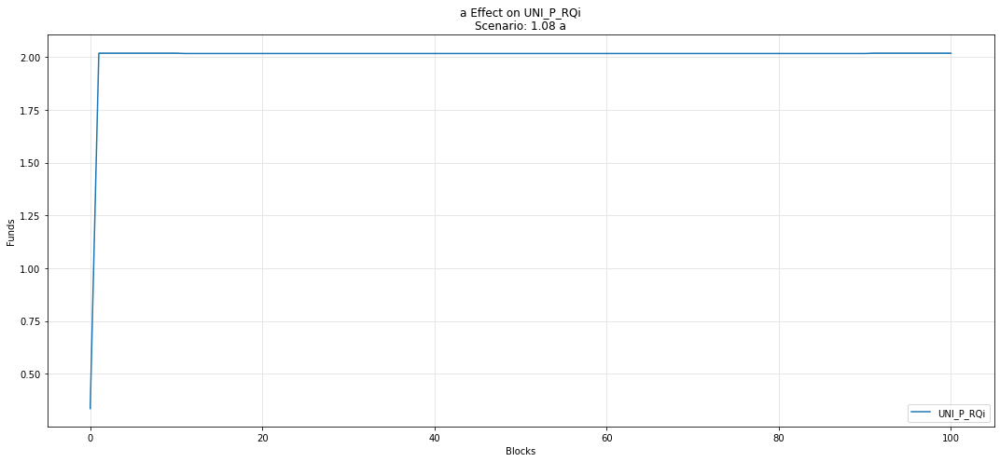

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

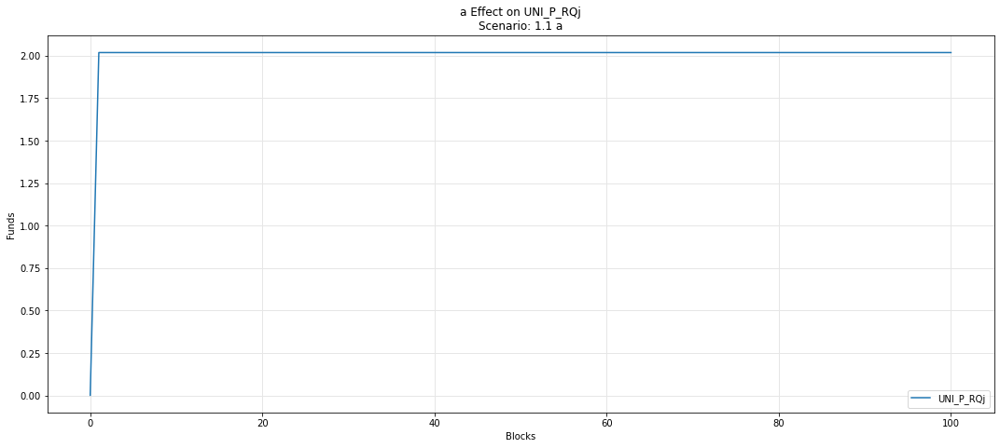

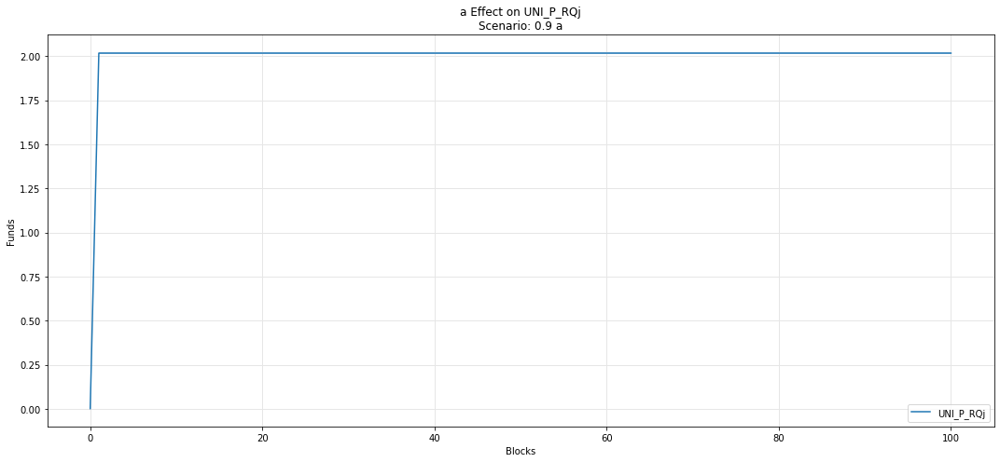

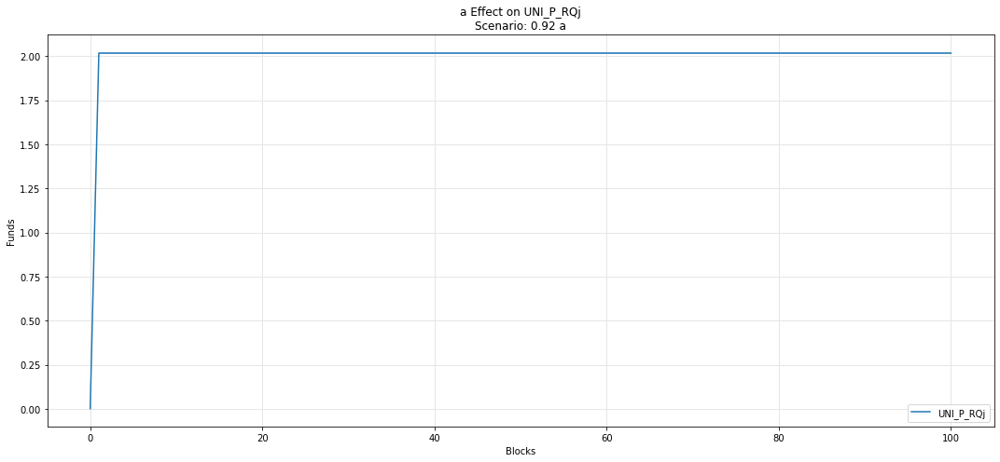

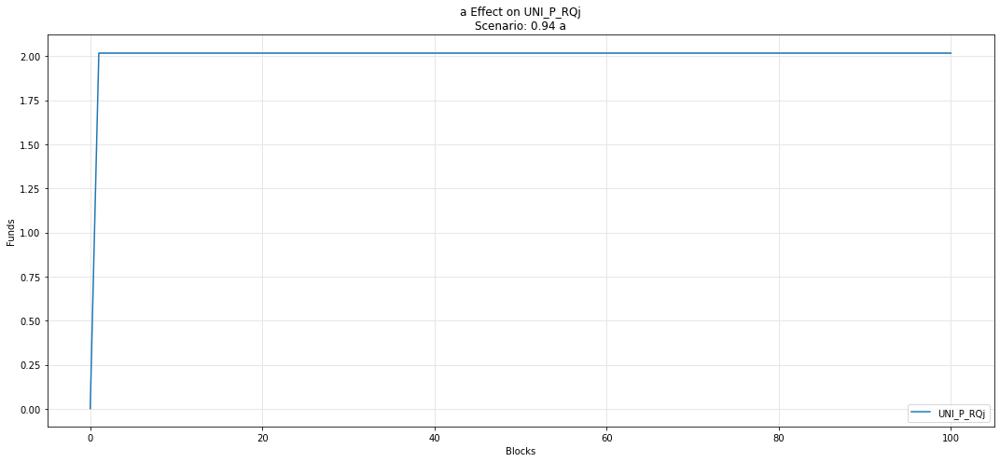

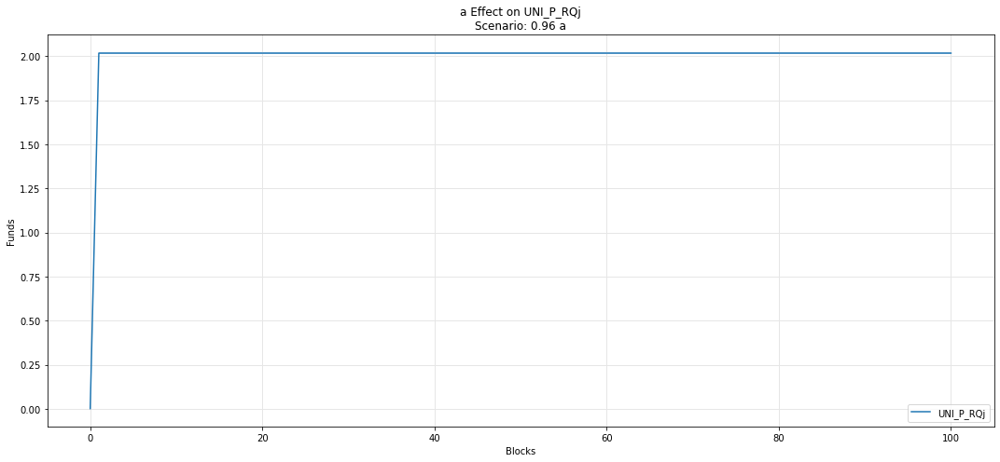

...

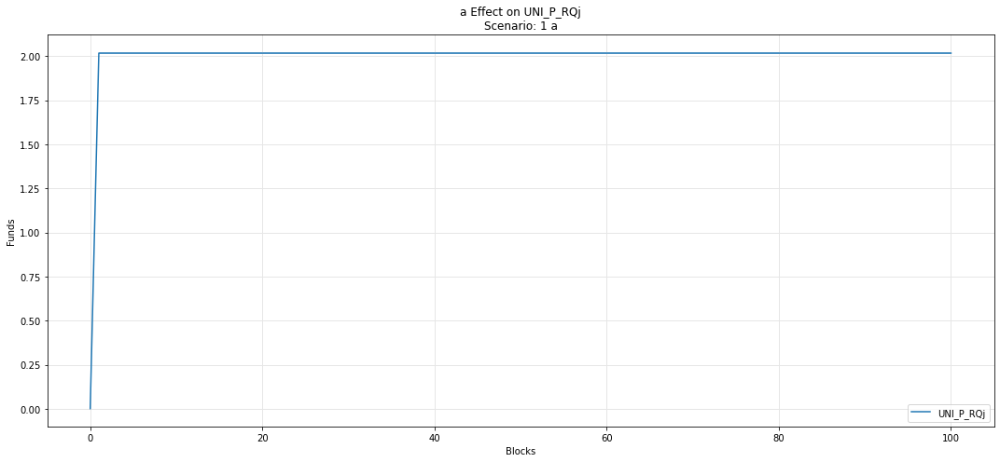

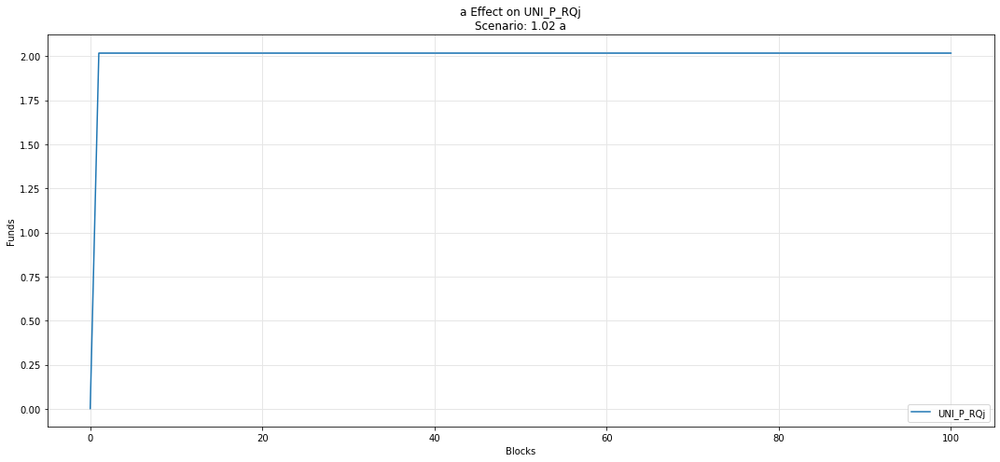

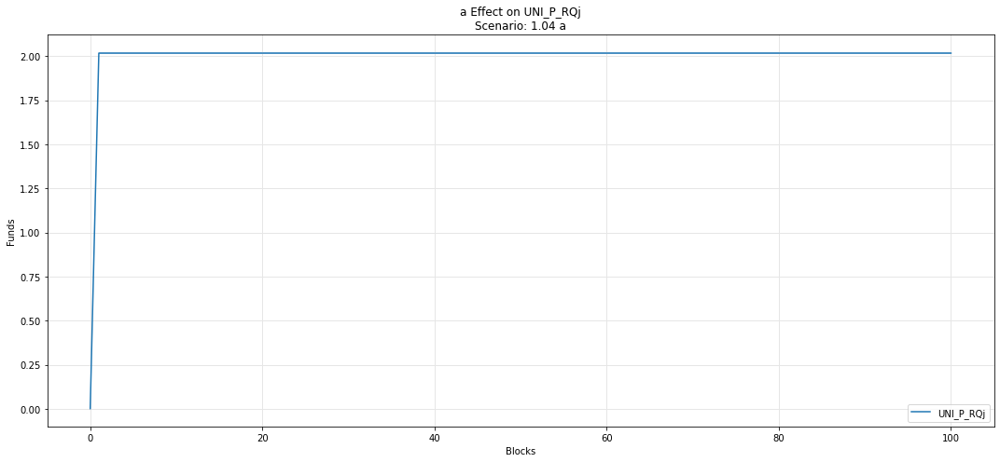

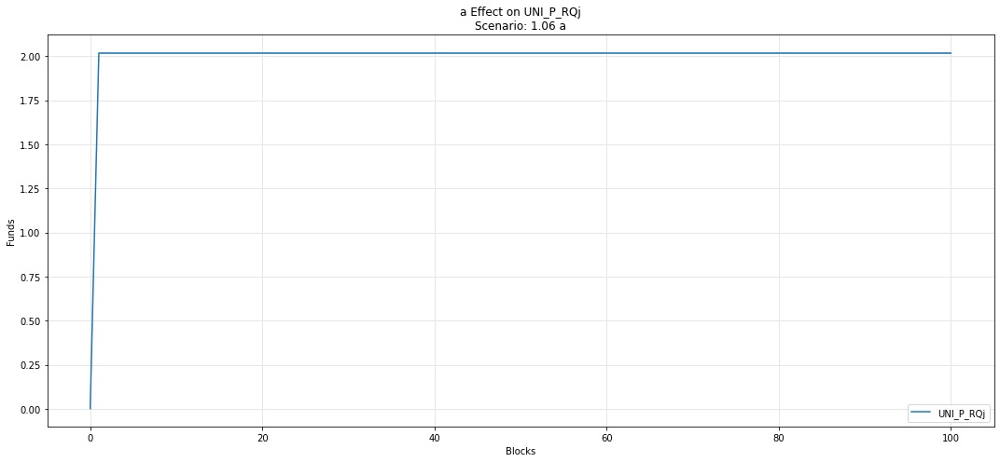

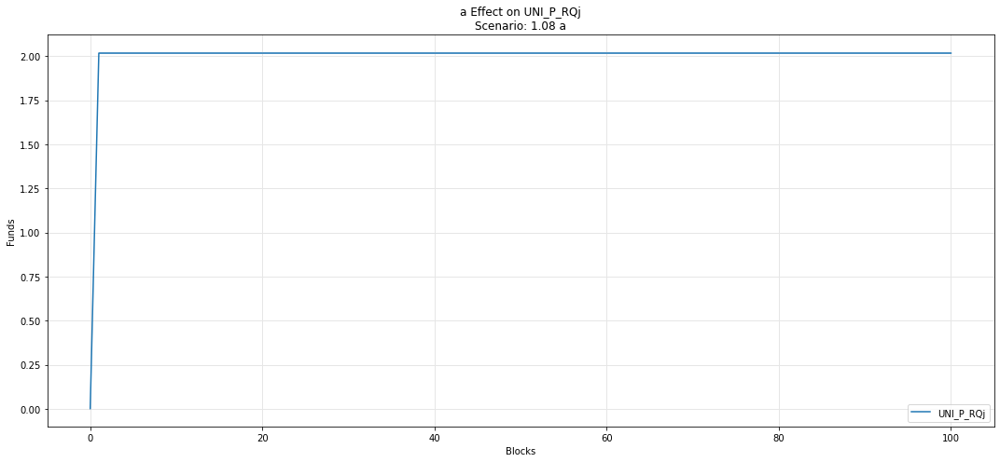

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

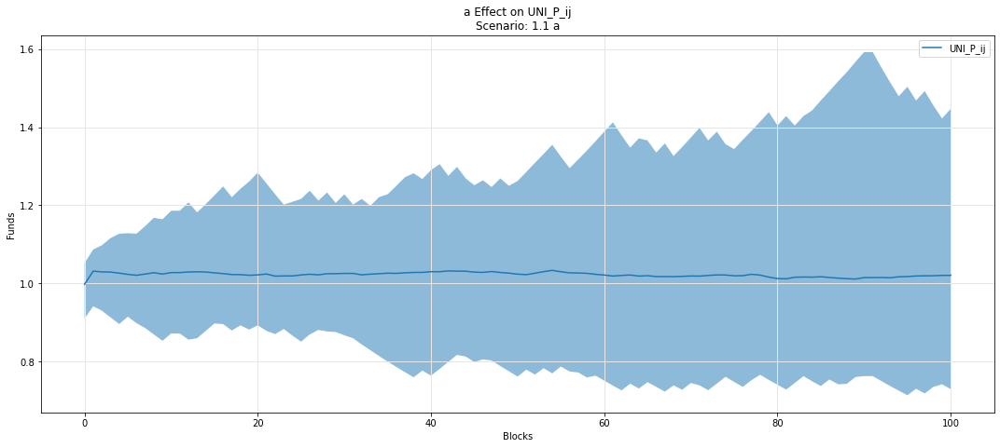

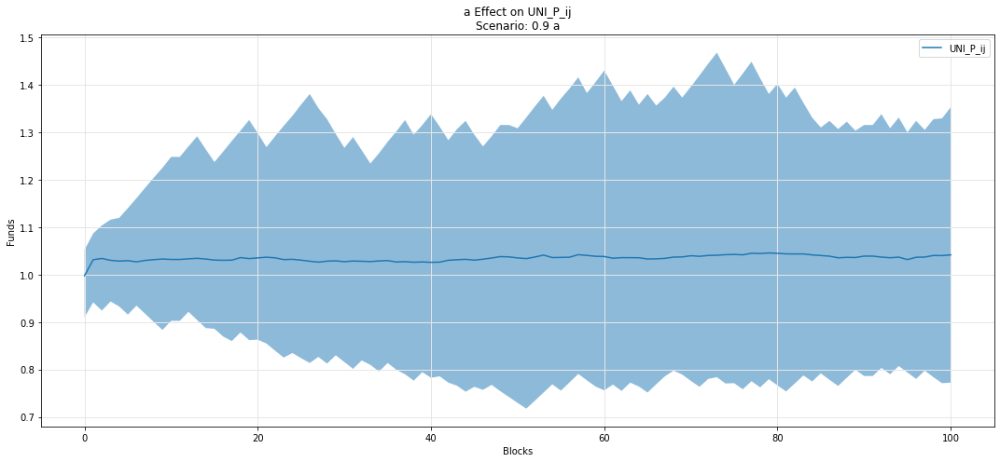

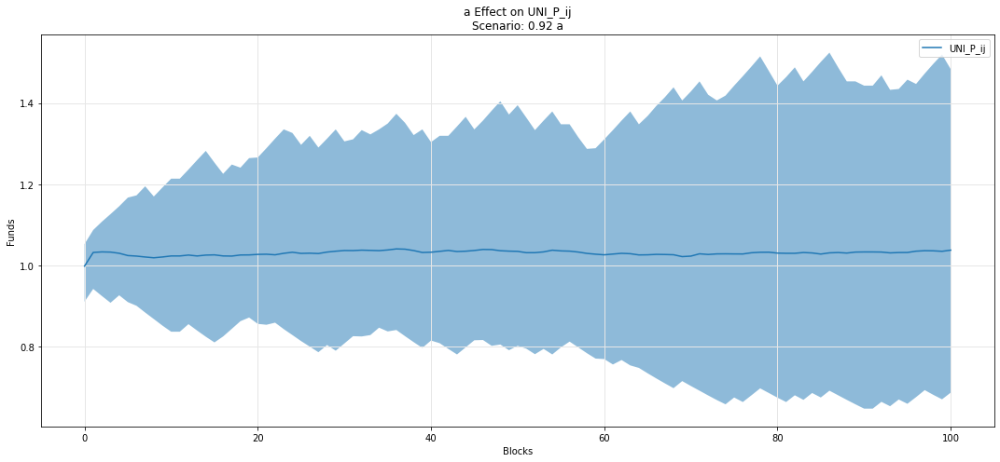

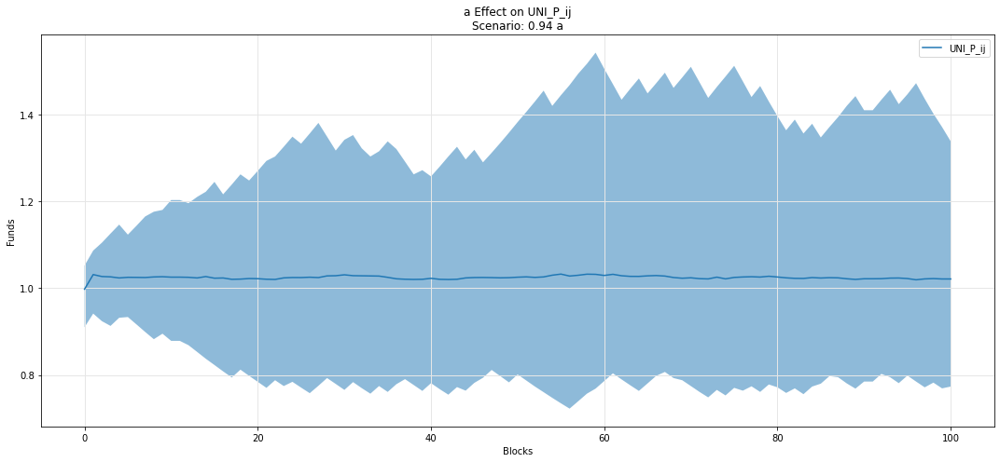

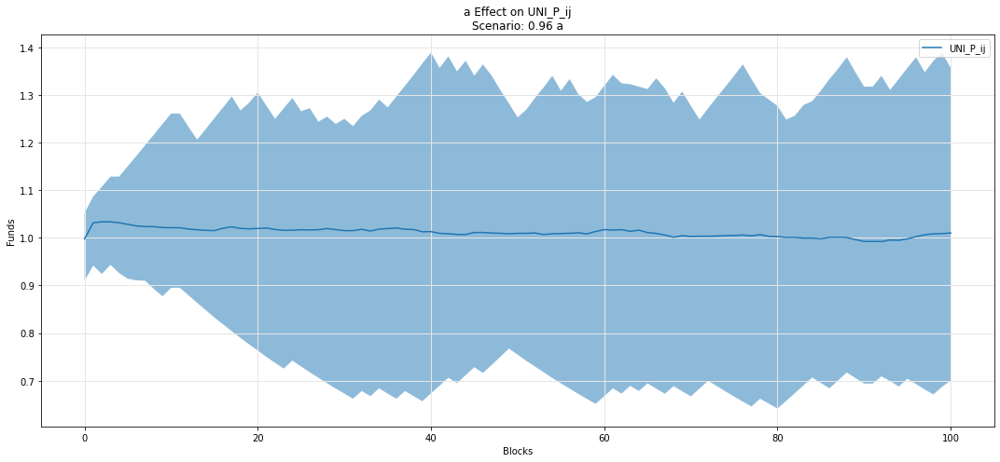

...

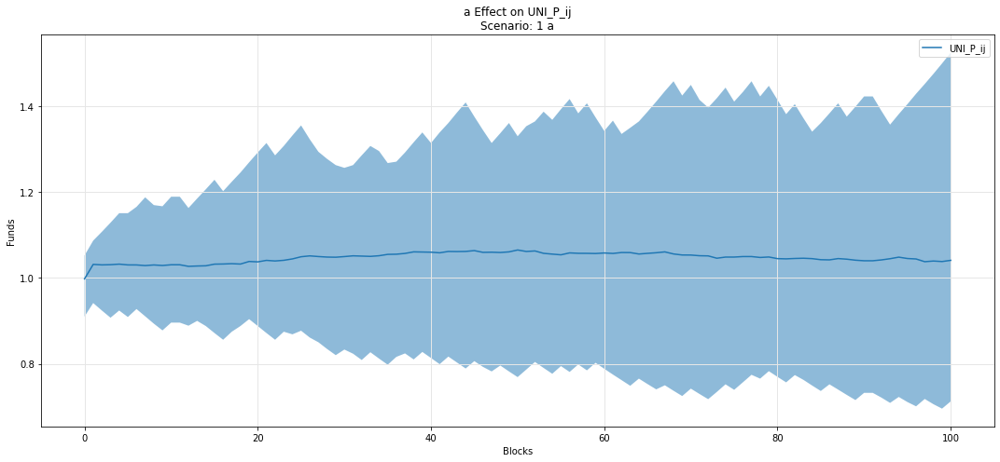

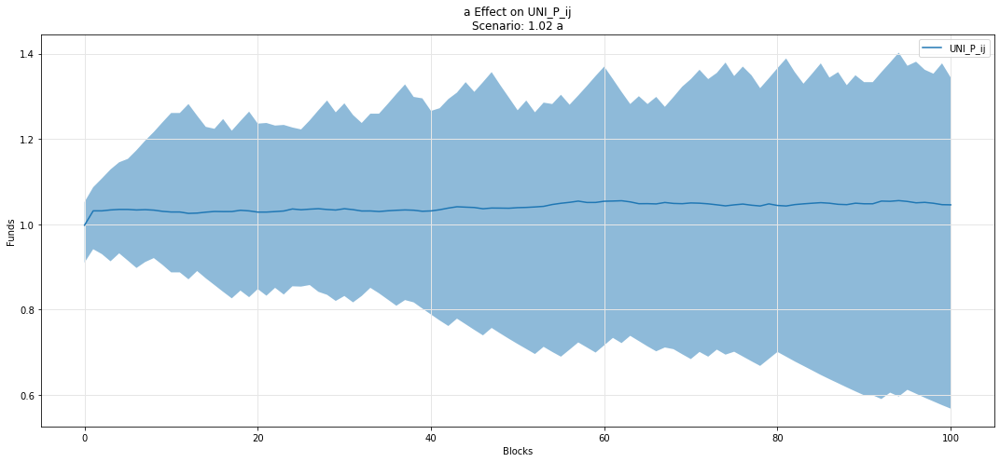

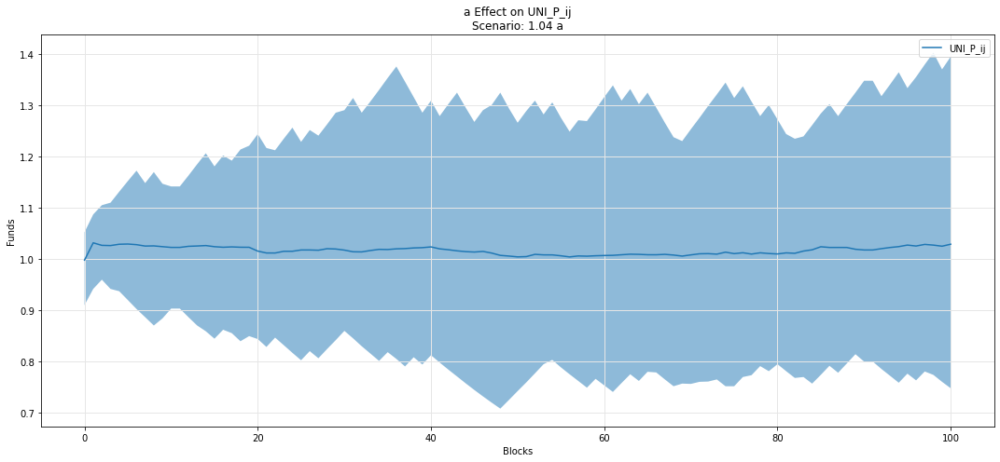

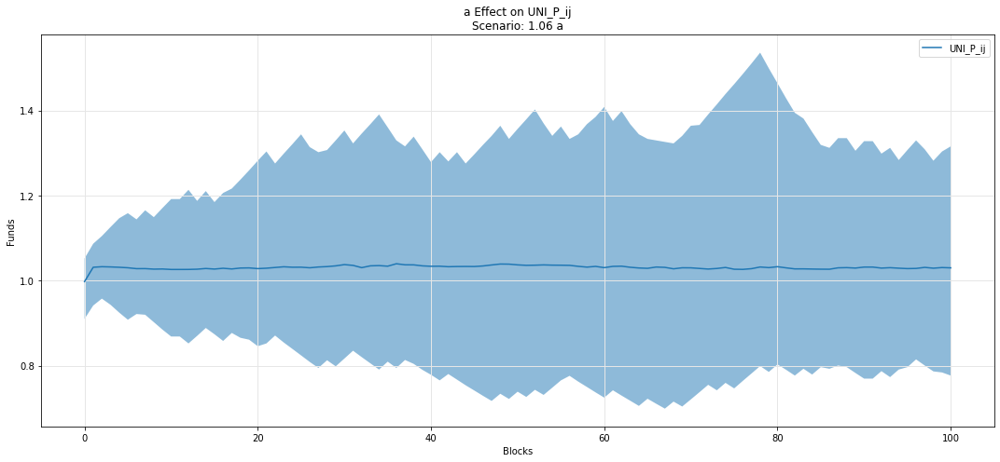

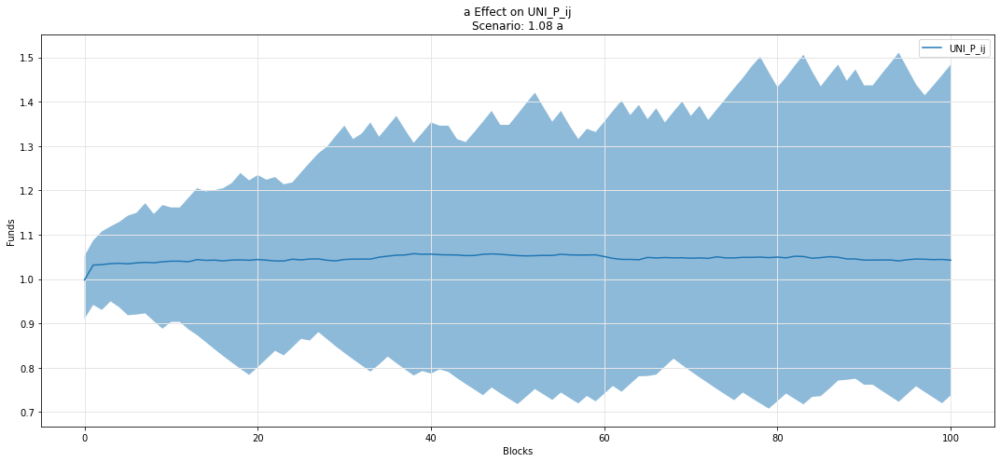

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

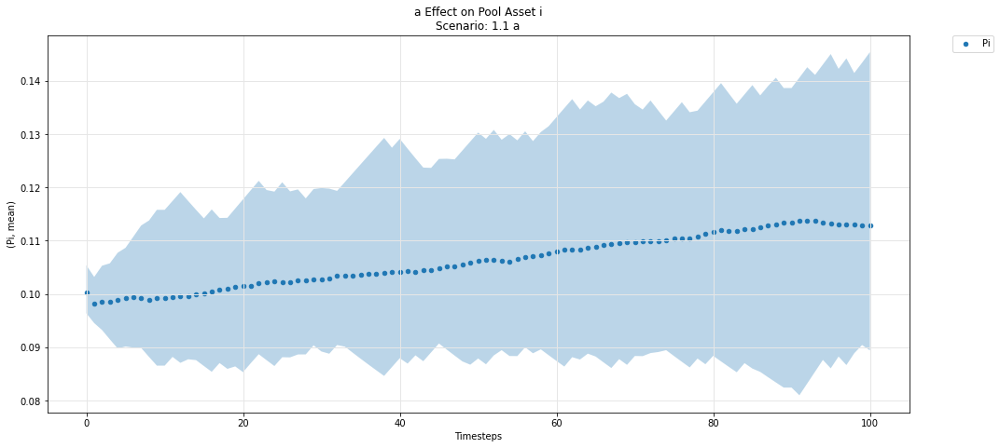

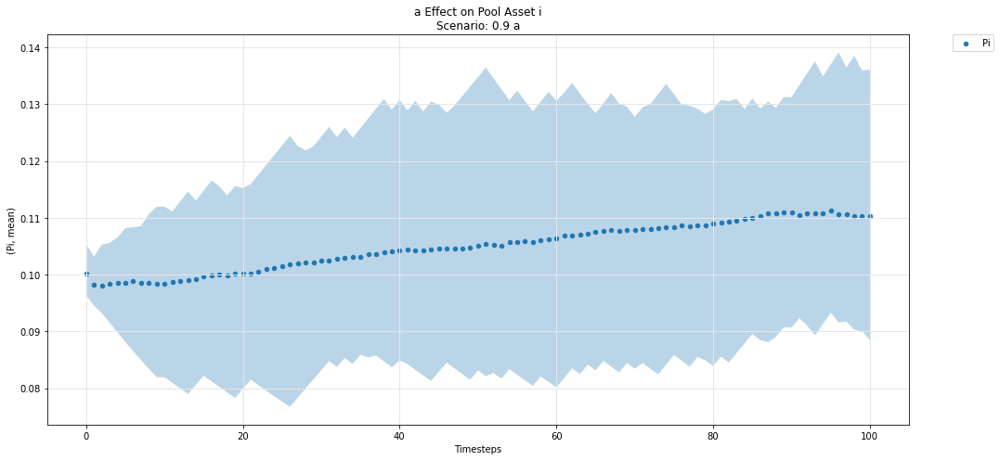

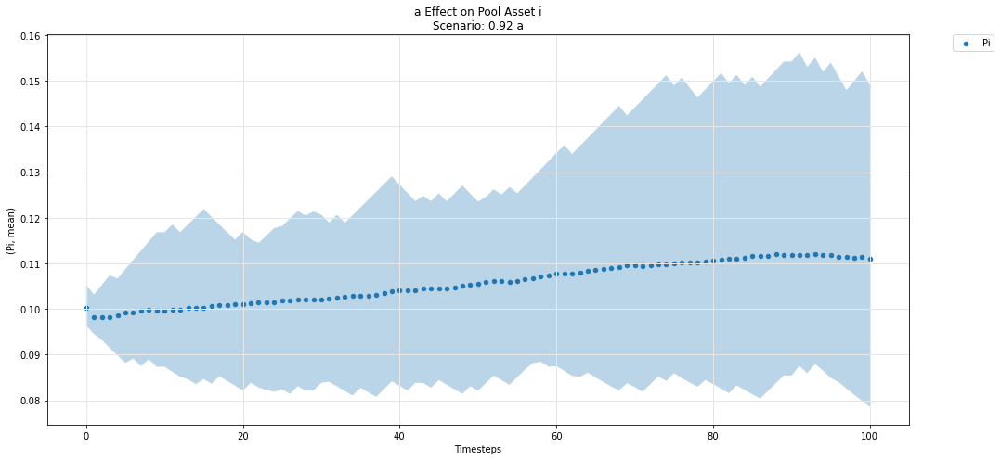

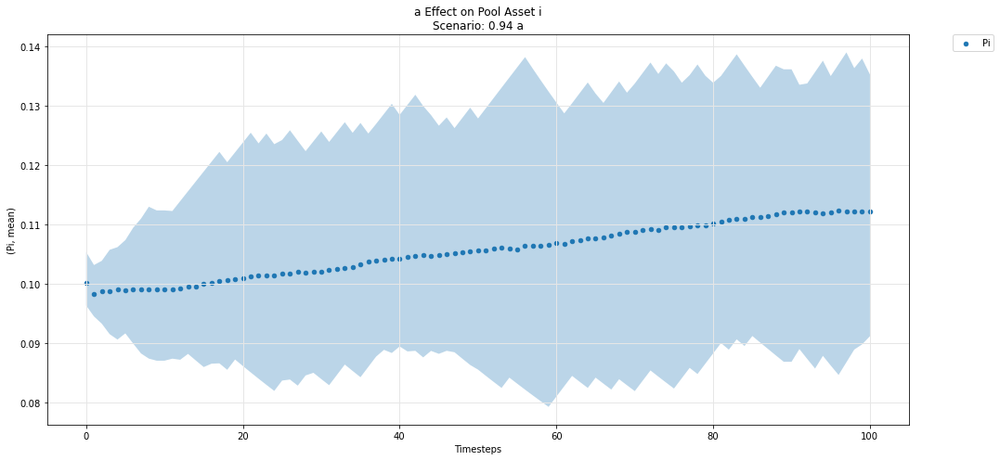

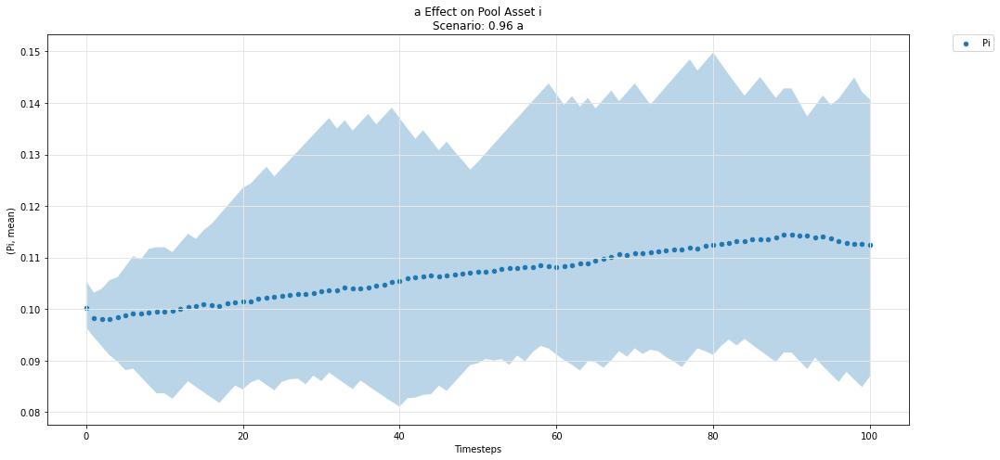

...

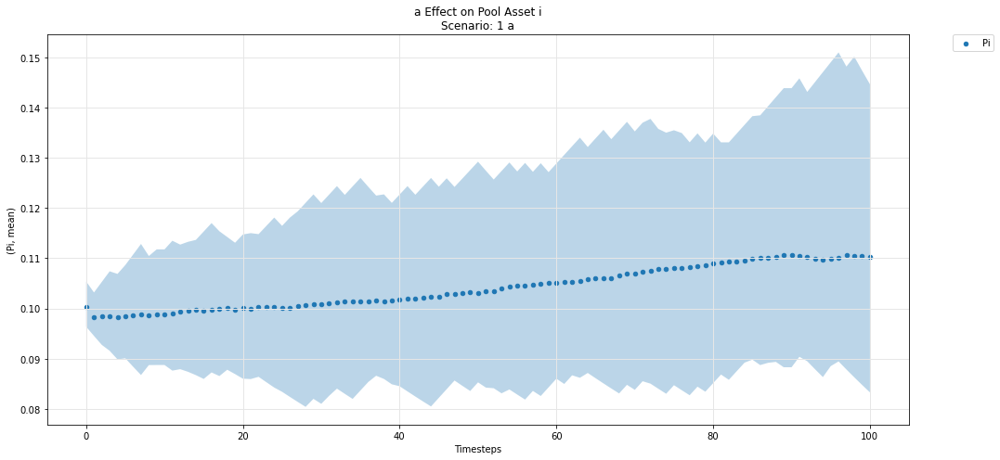

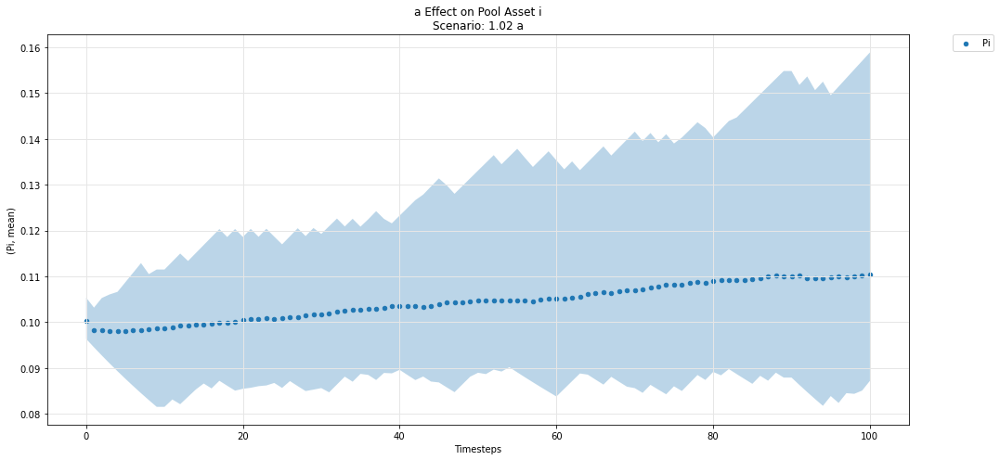

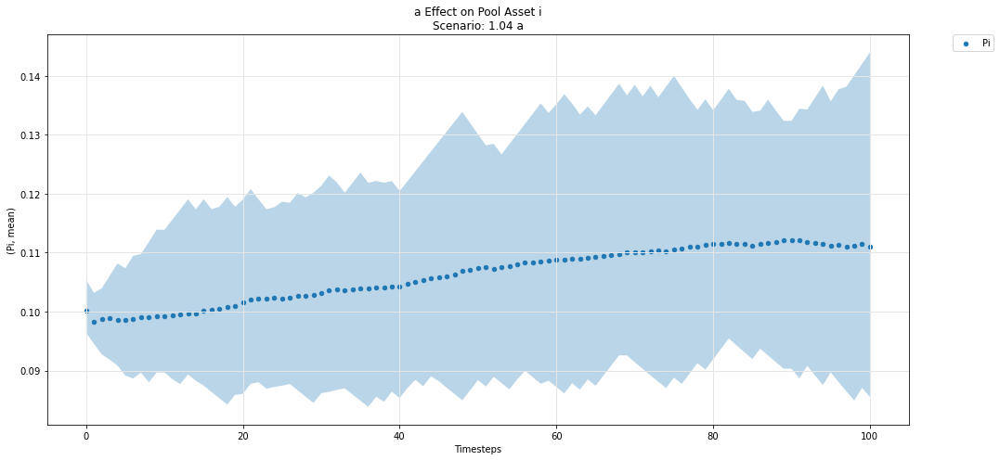

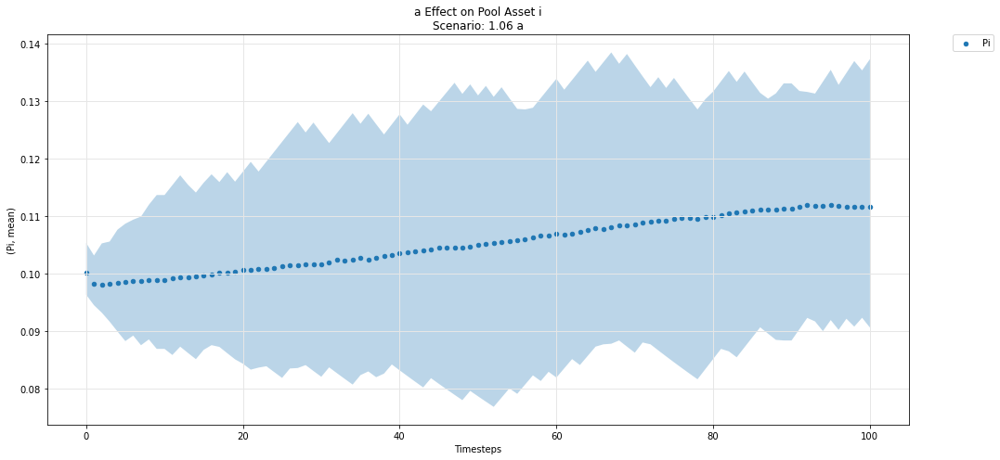

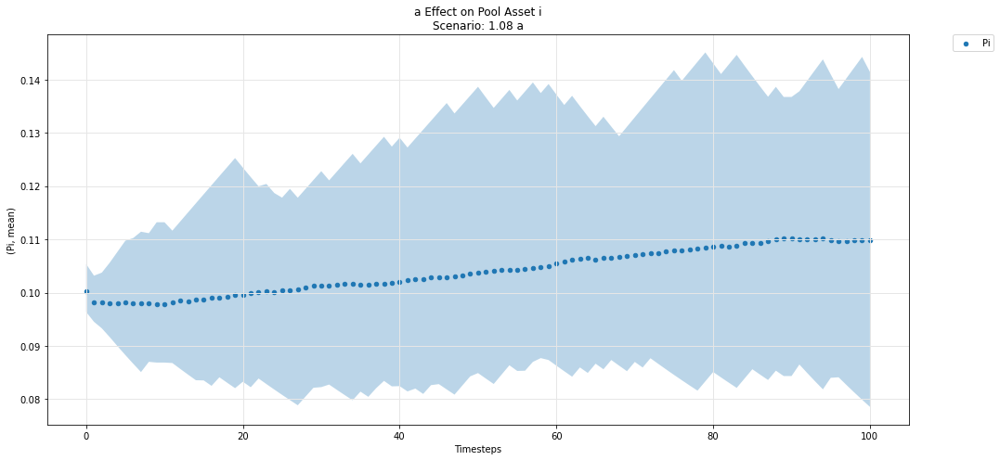

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

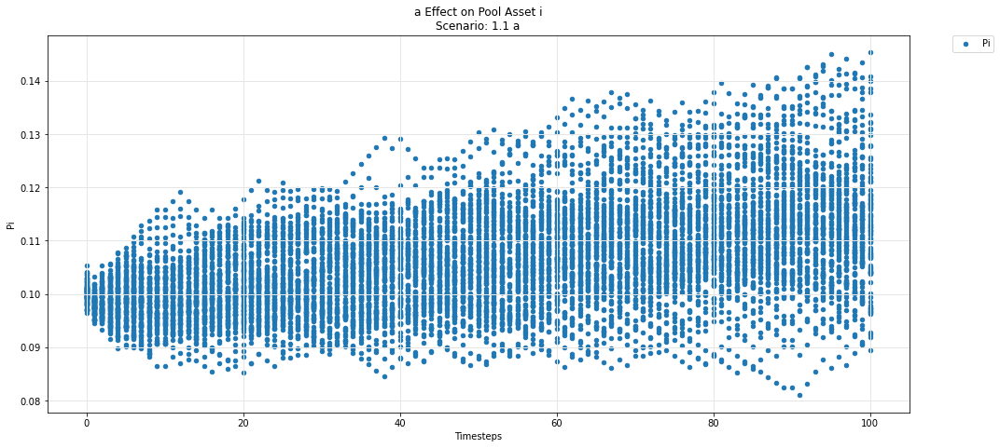

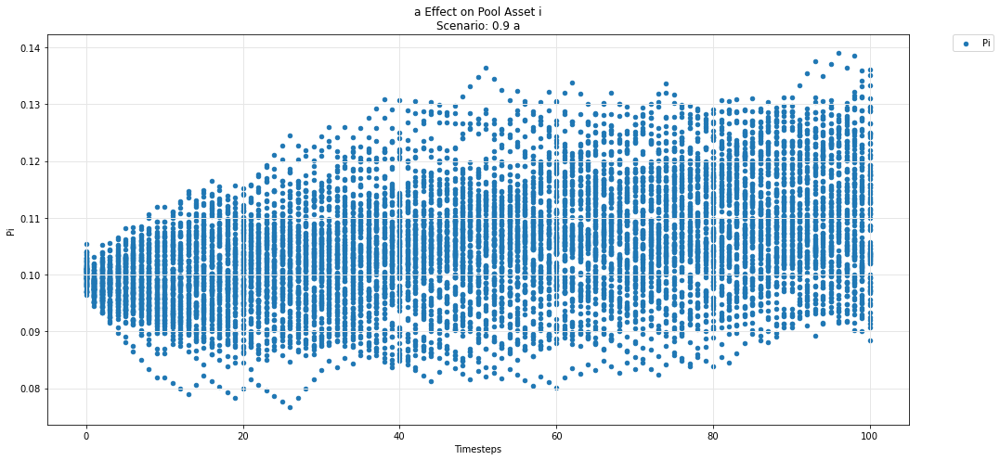

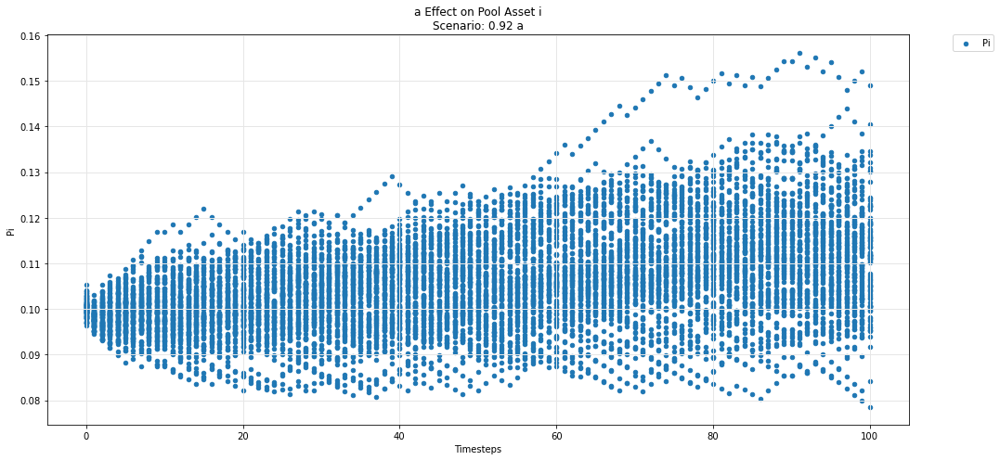

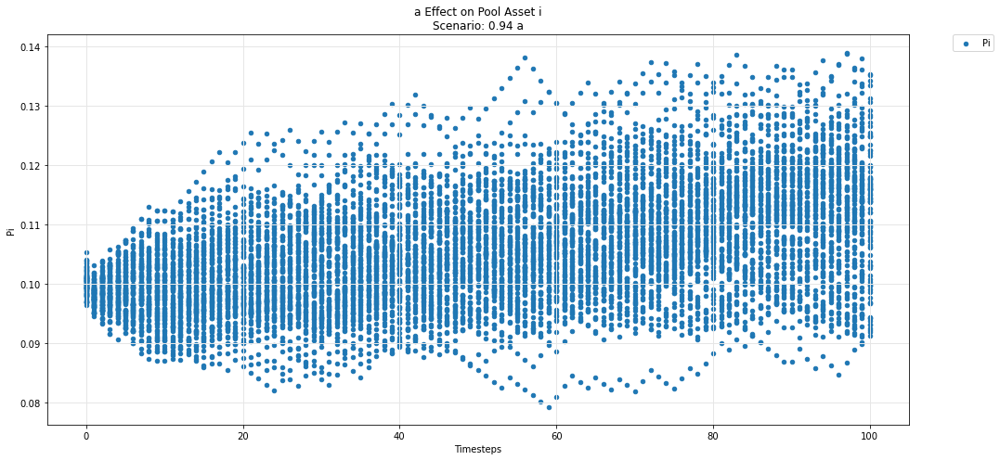

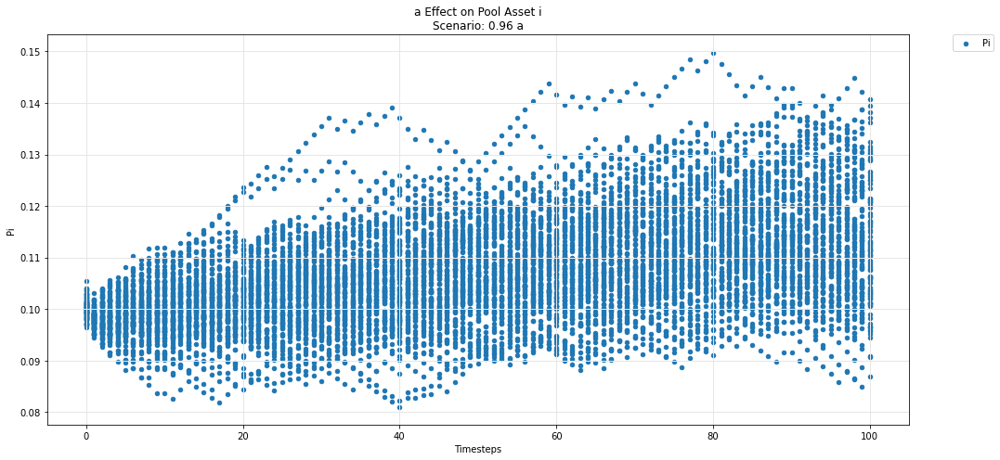

...

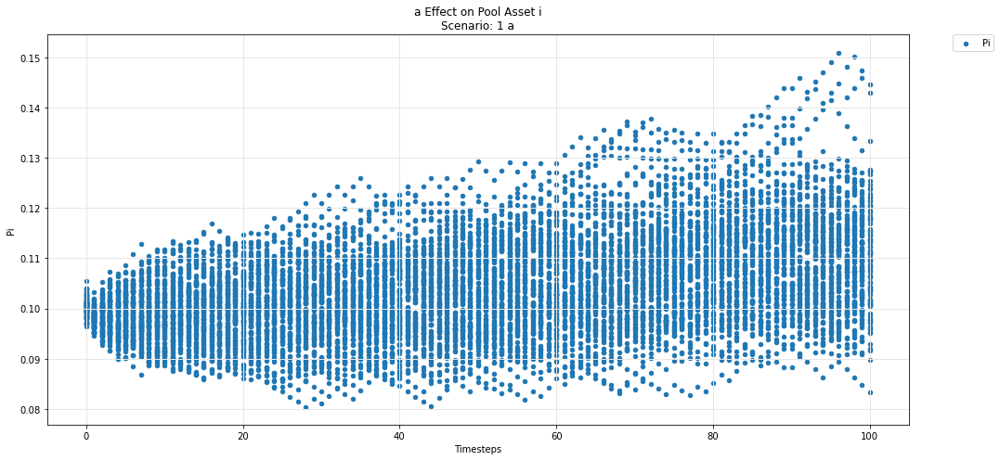

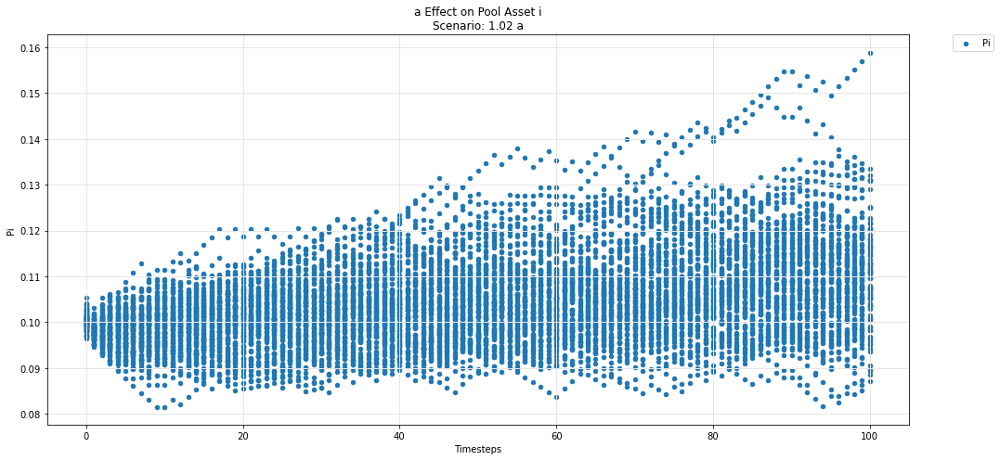

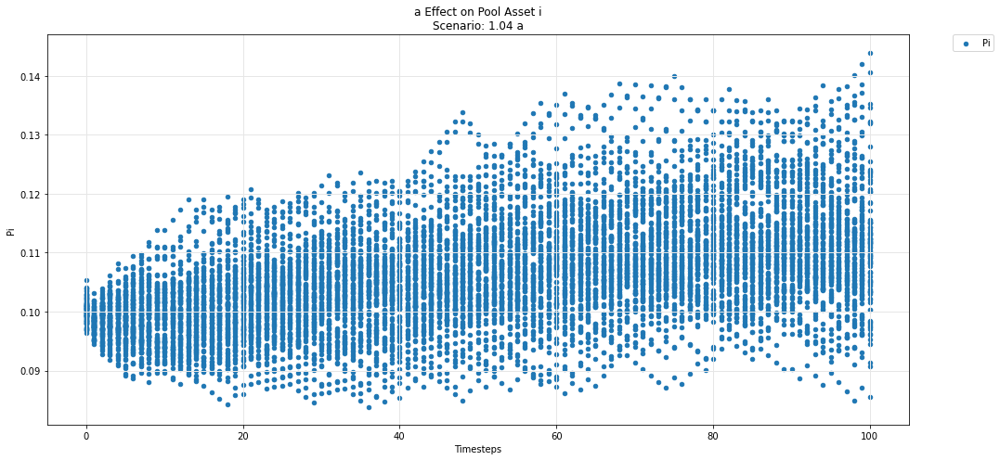

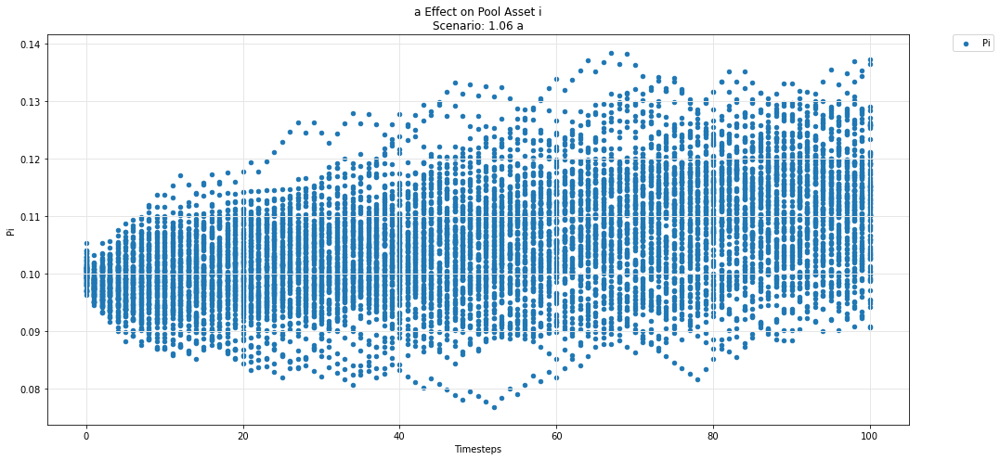

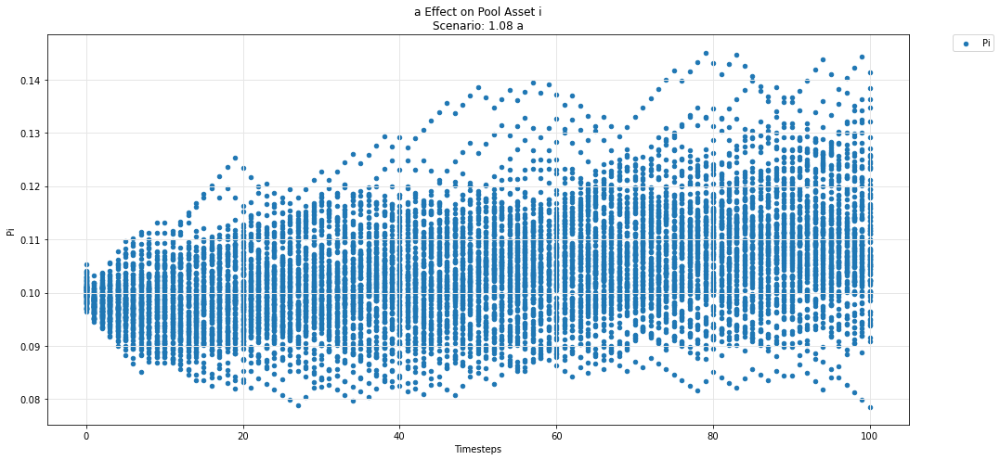

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

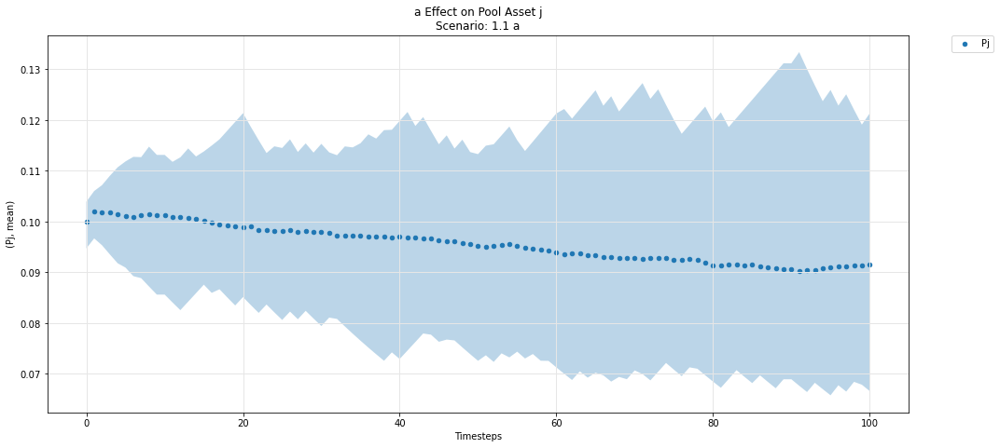

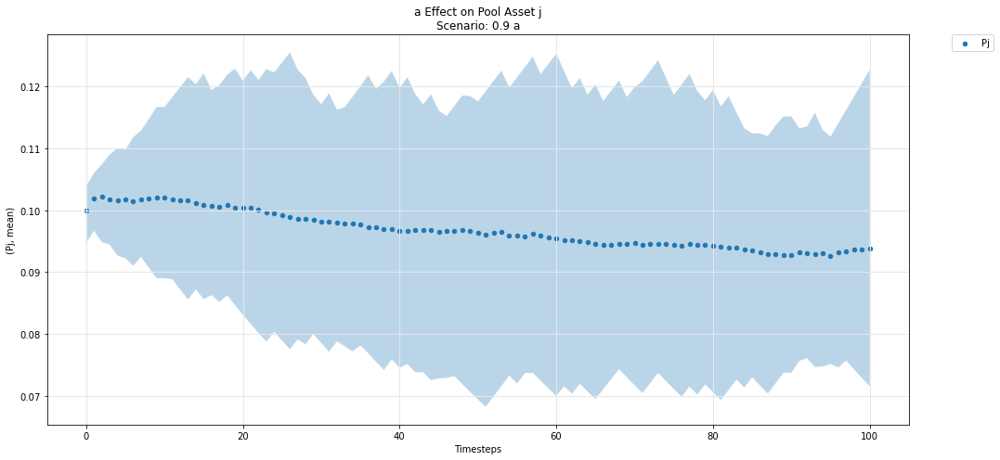

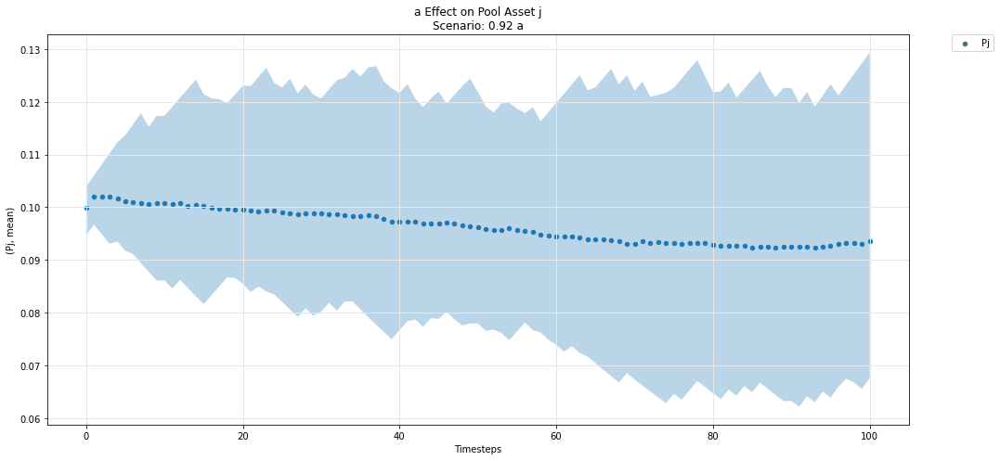

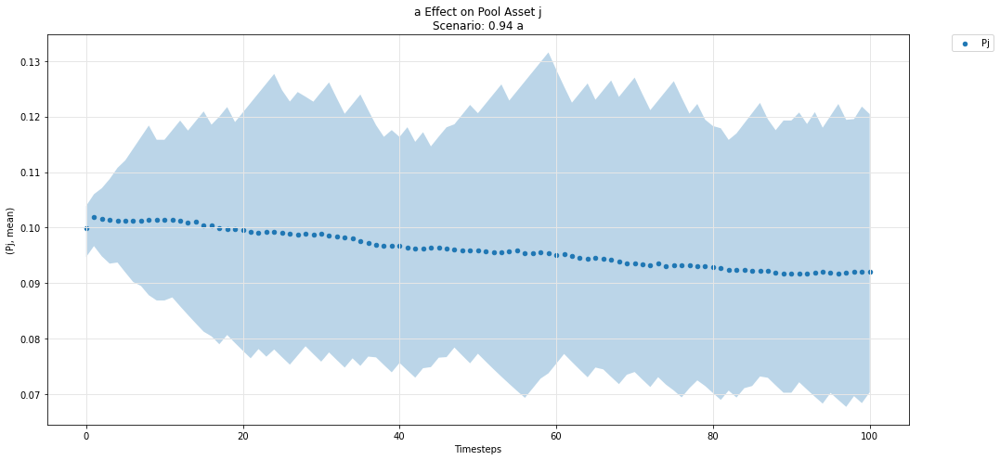

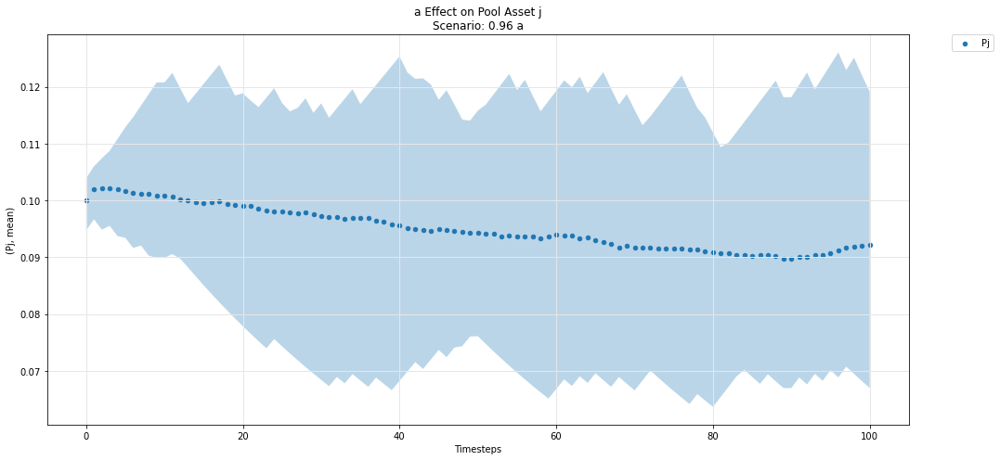

...

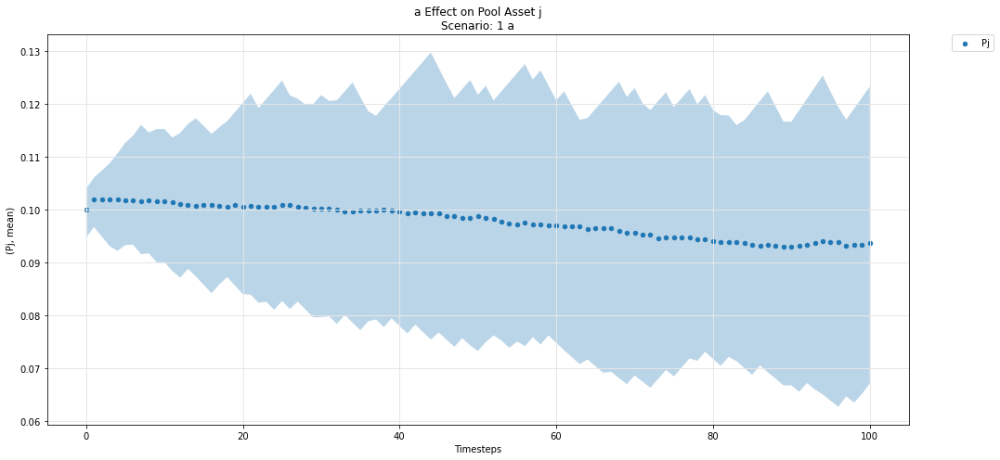

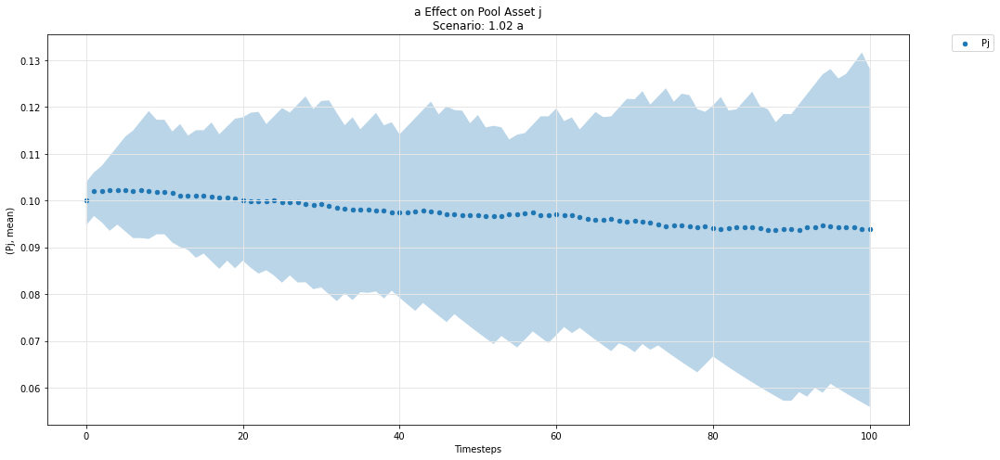

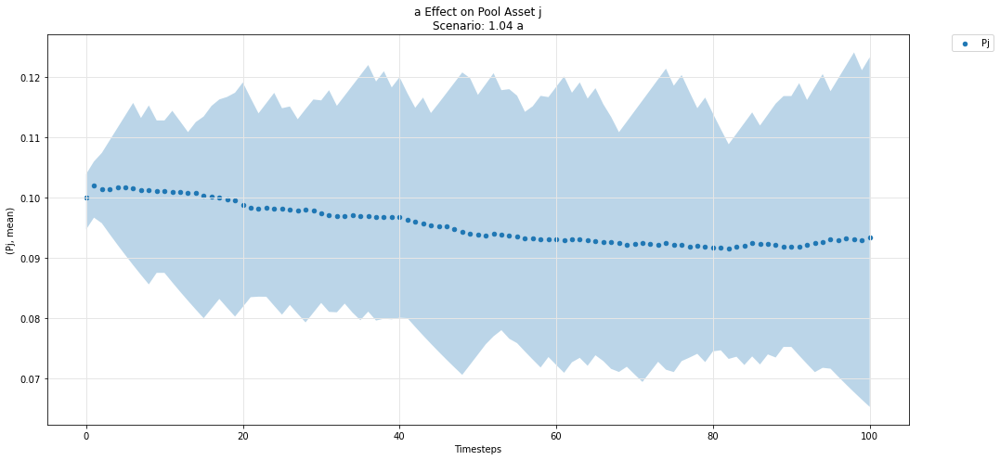

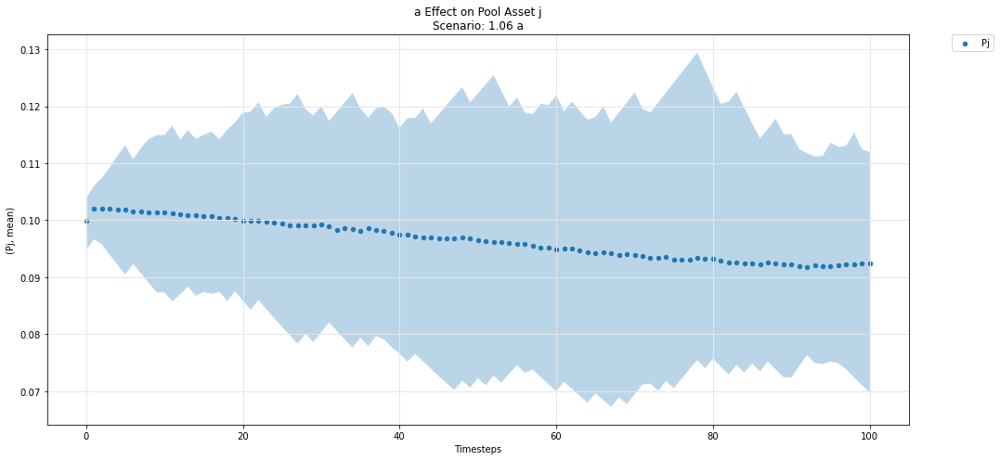

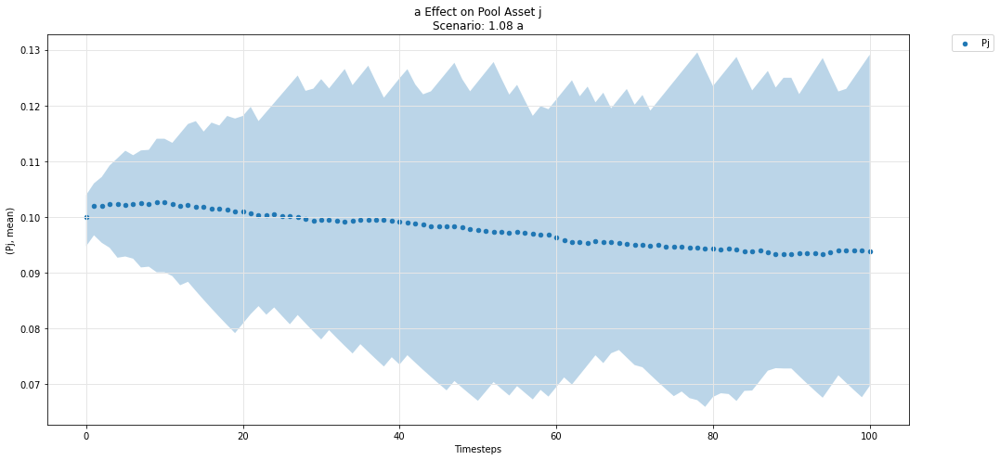

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

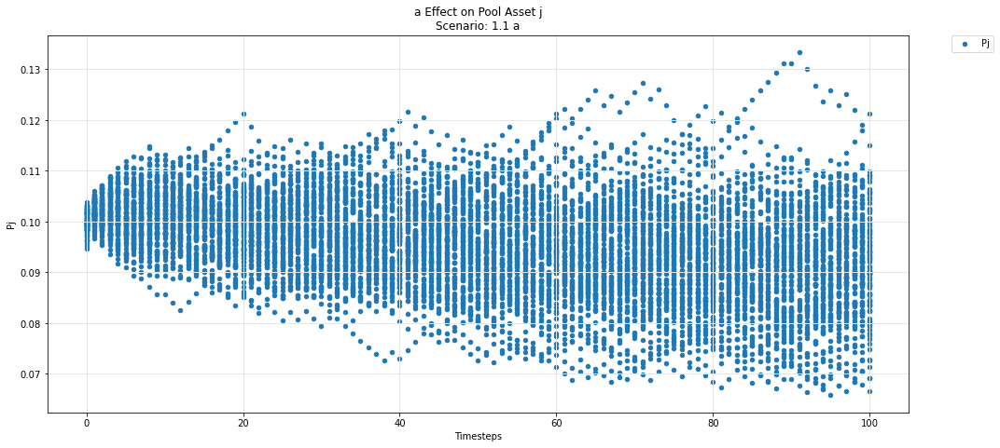

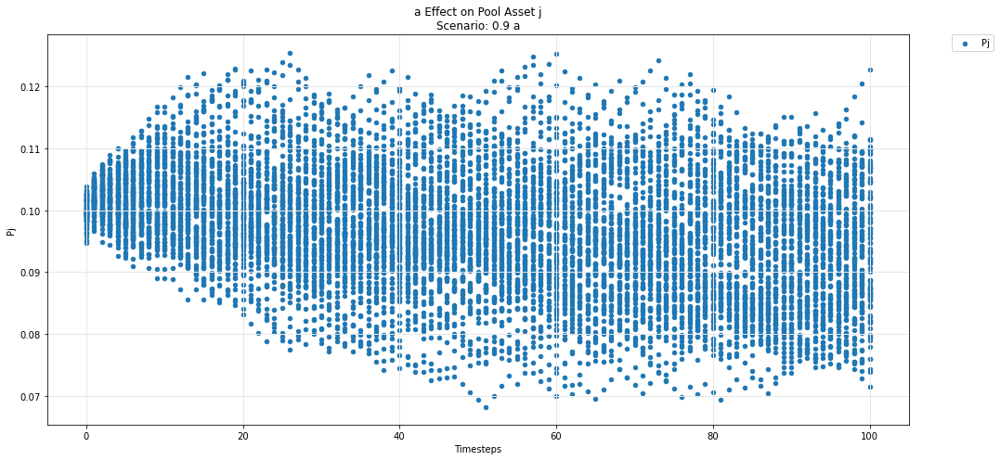

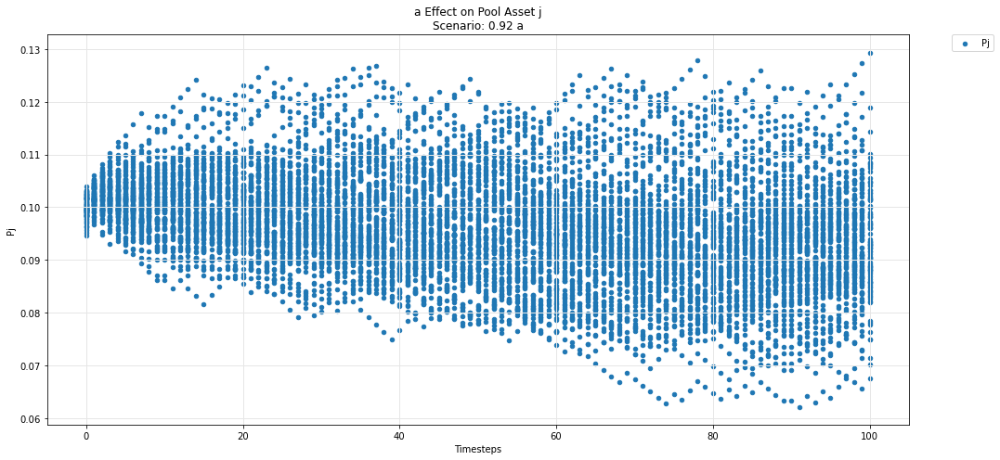

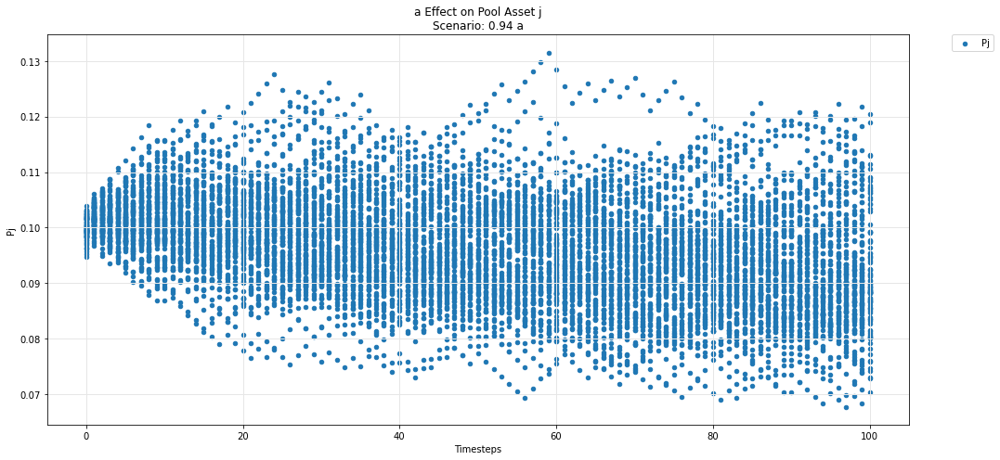

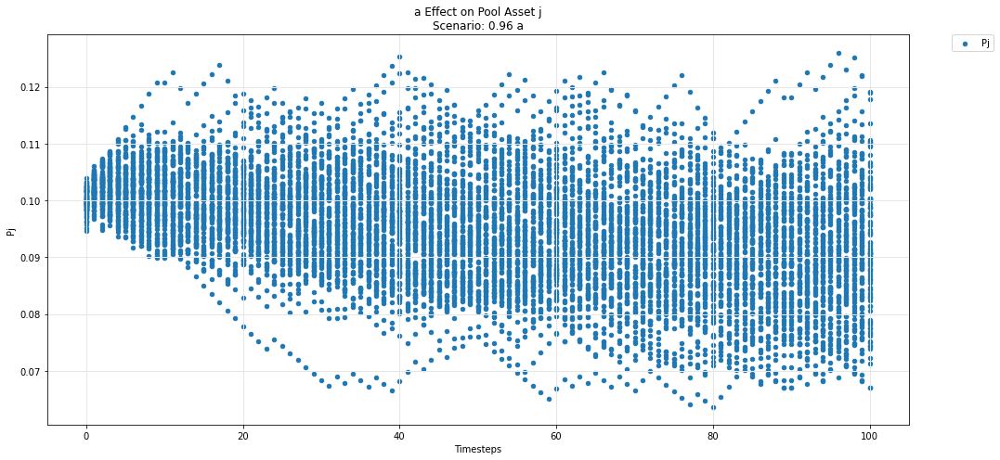

...

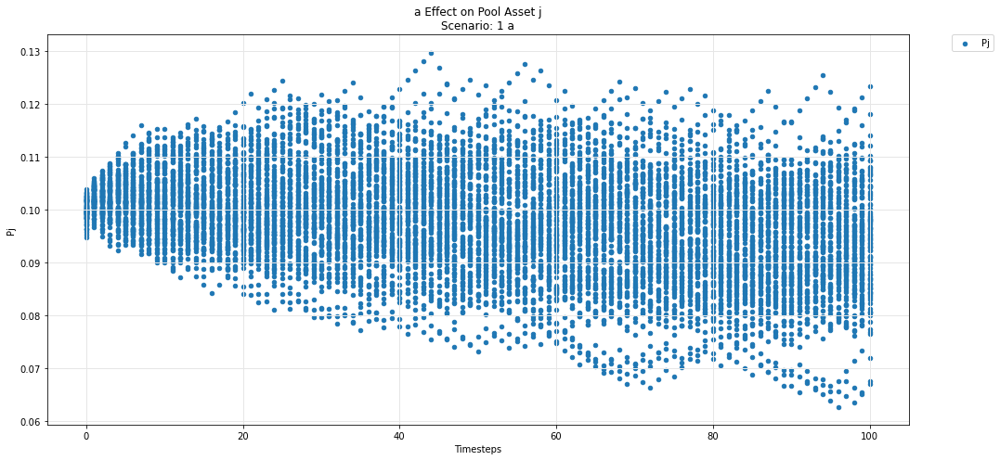

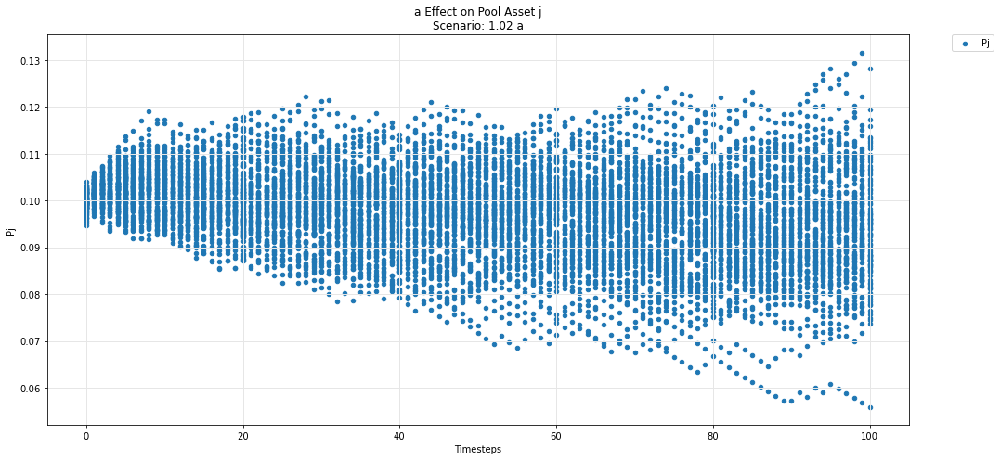

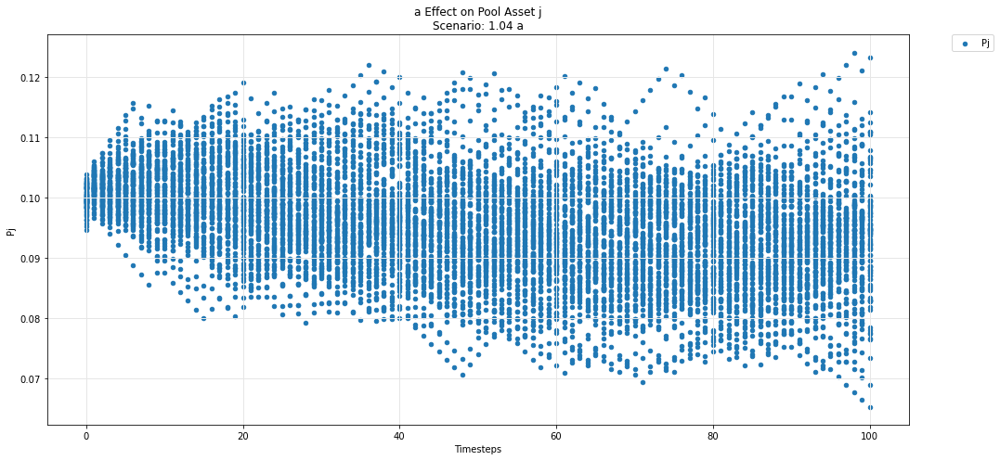

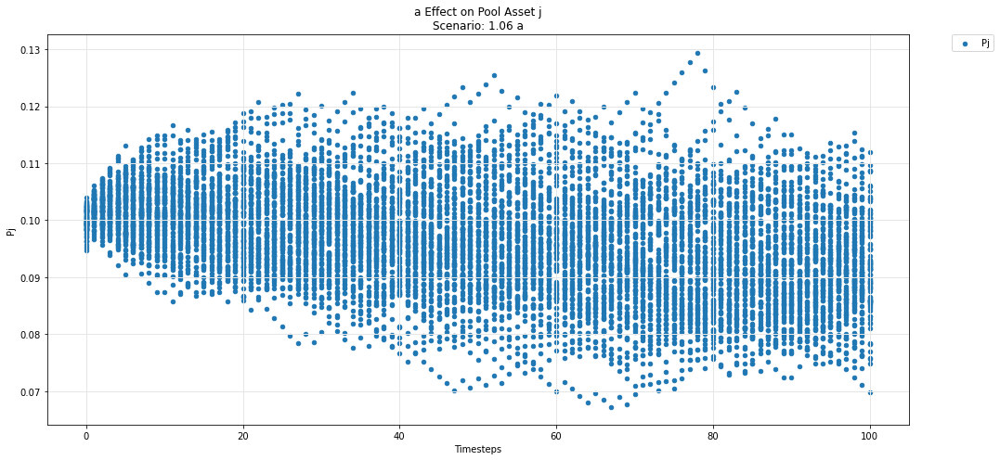

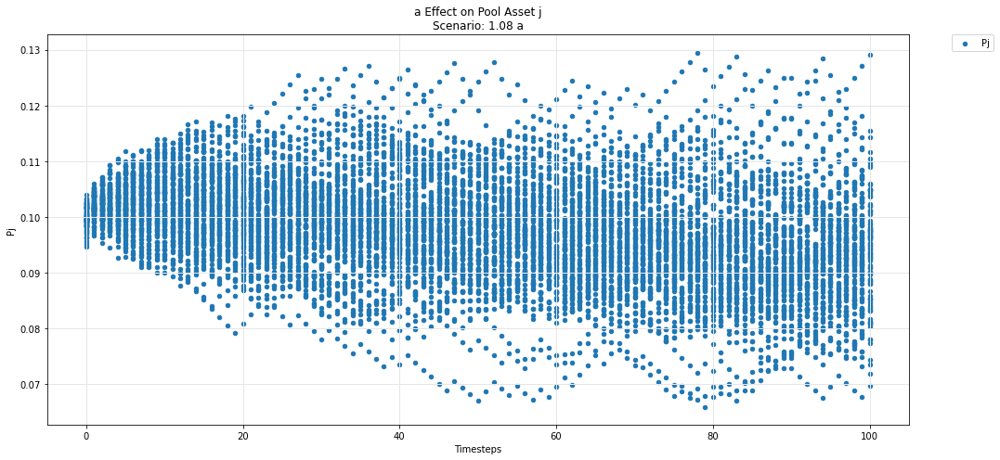

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

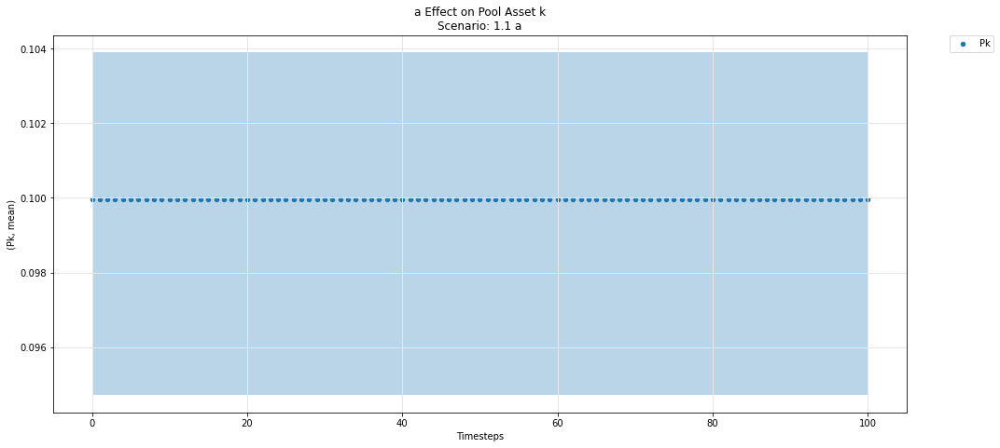

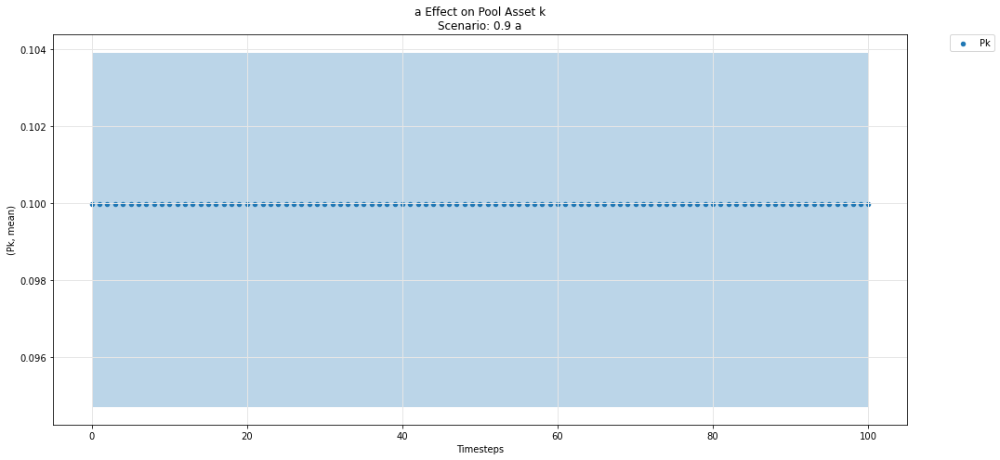

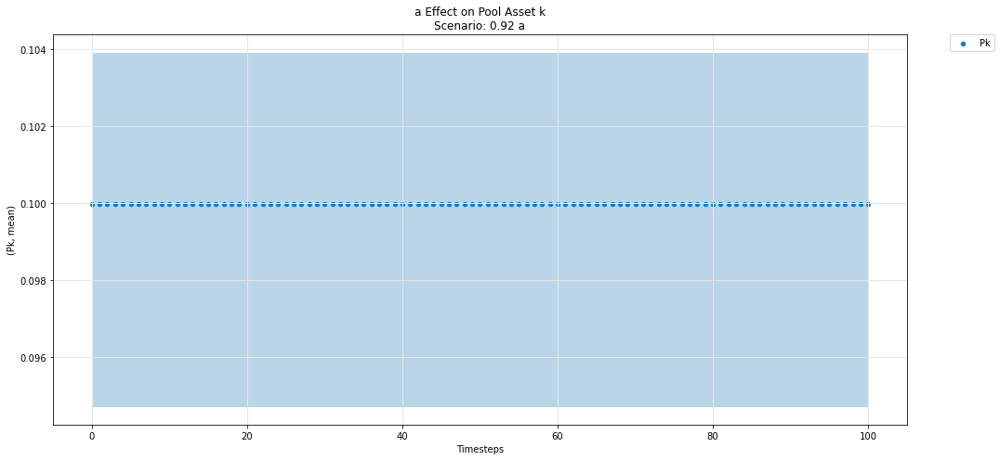

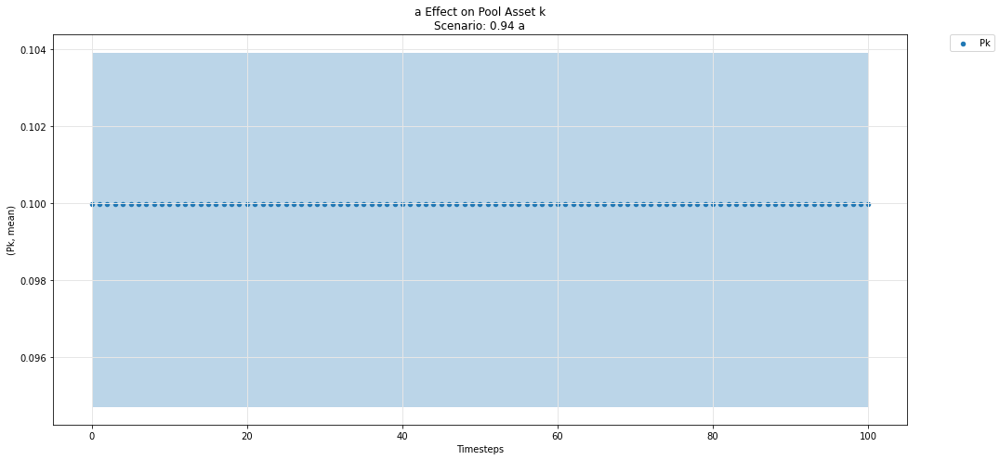

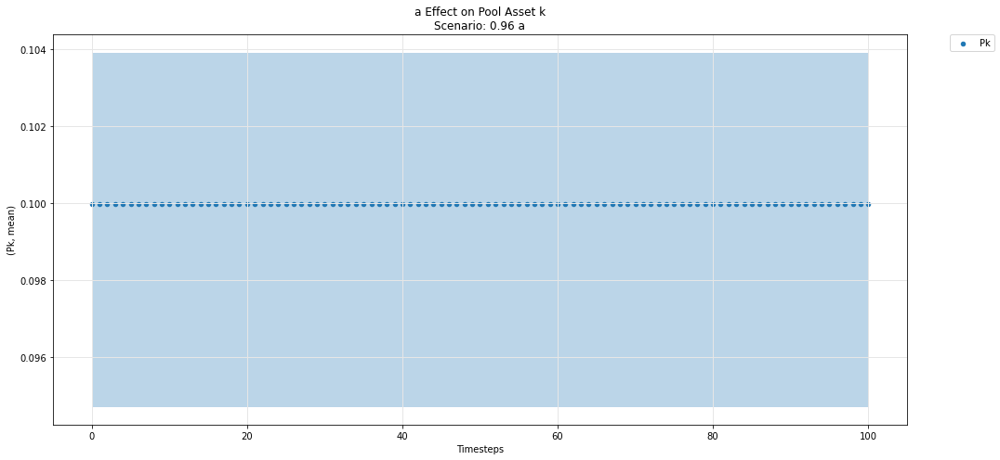

...

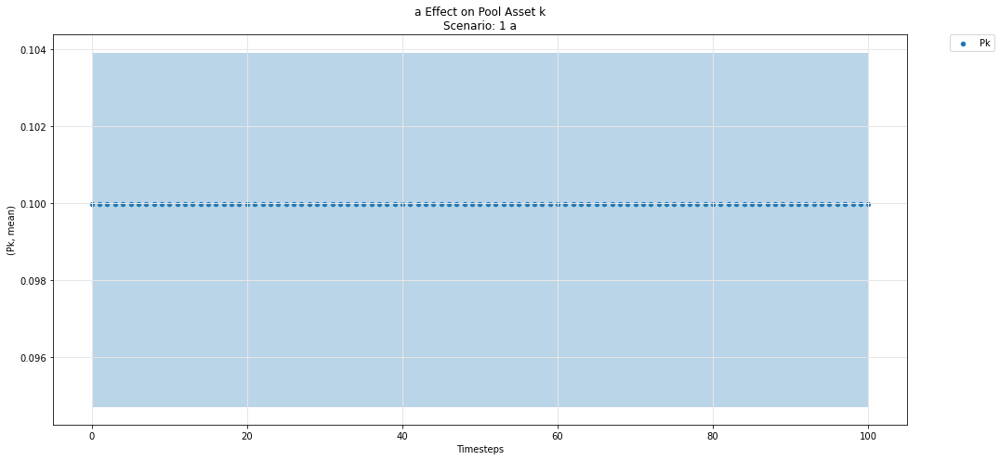

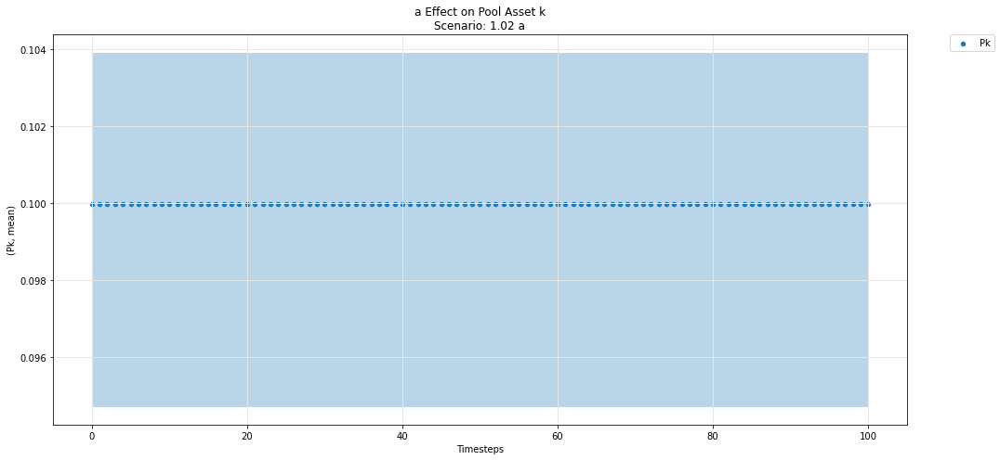

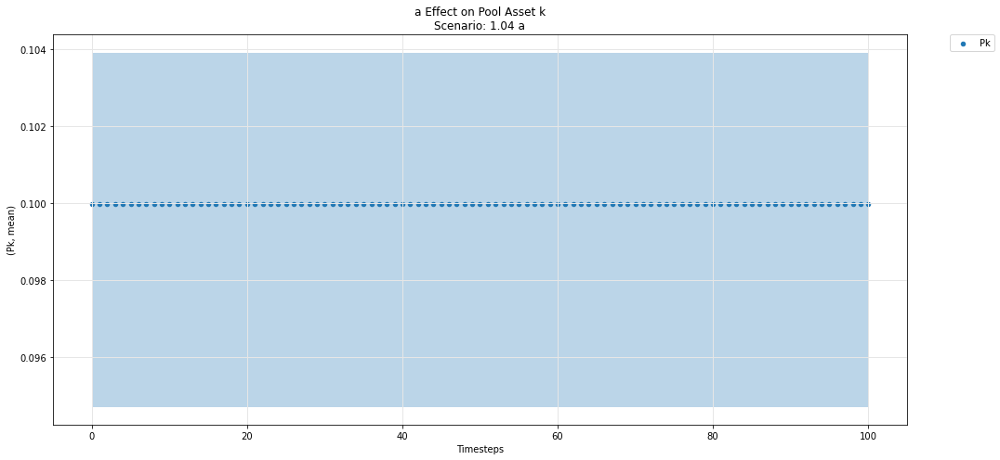

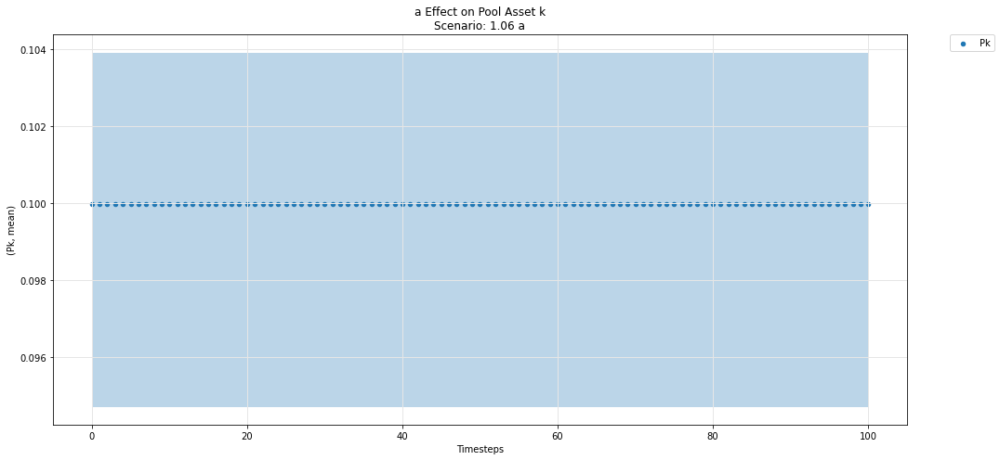

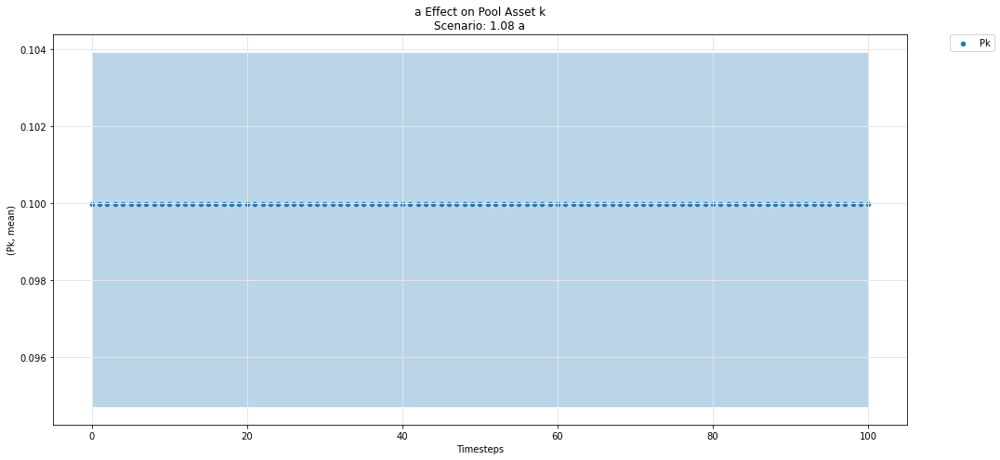

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

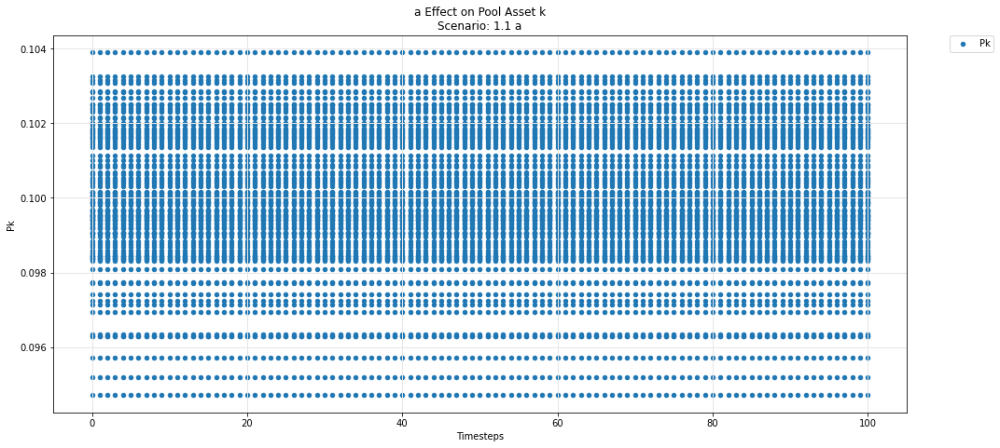

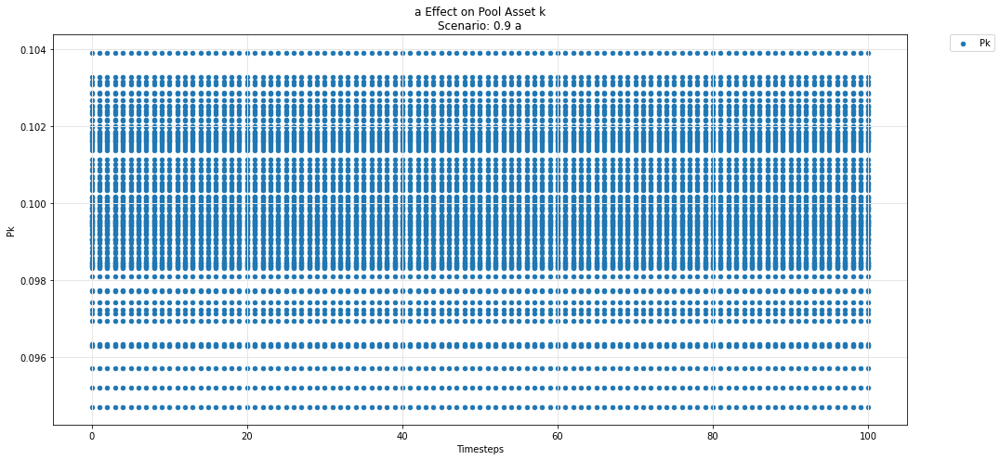

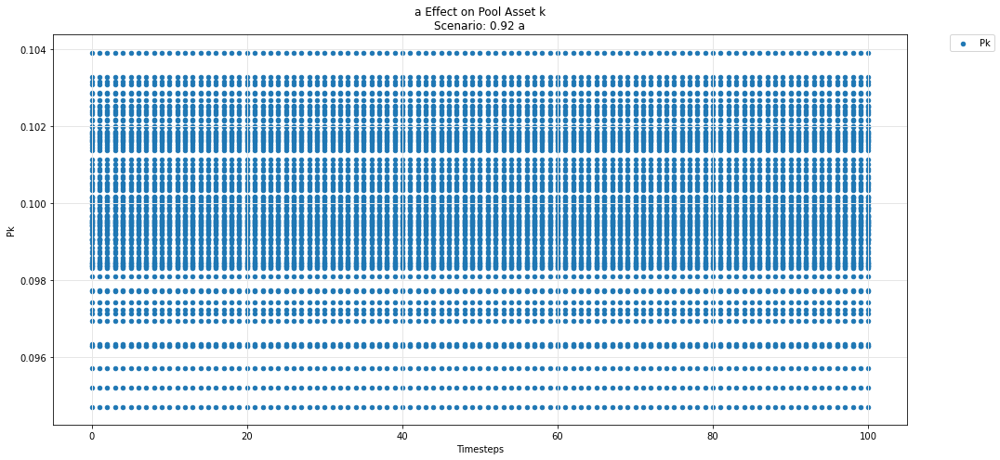

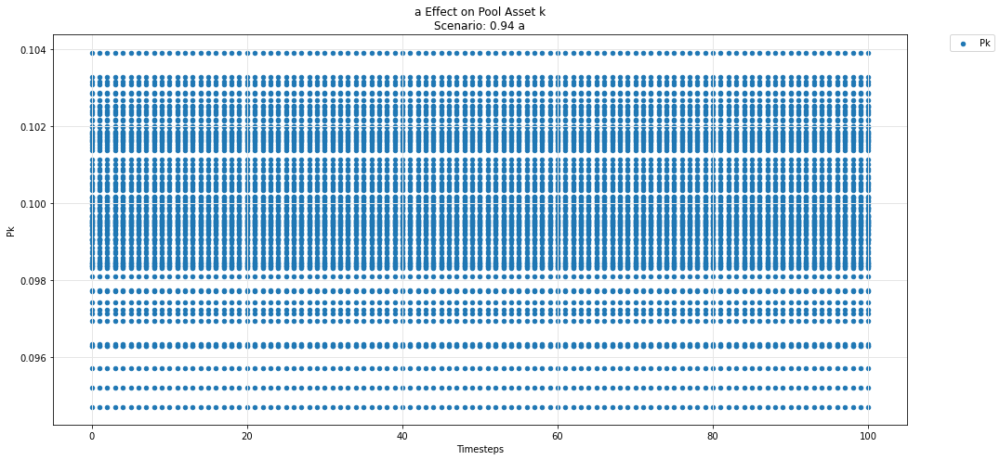

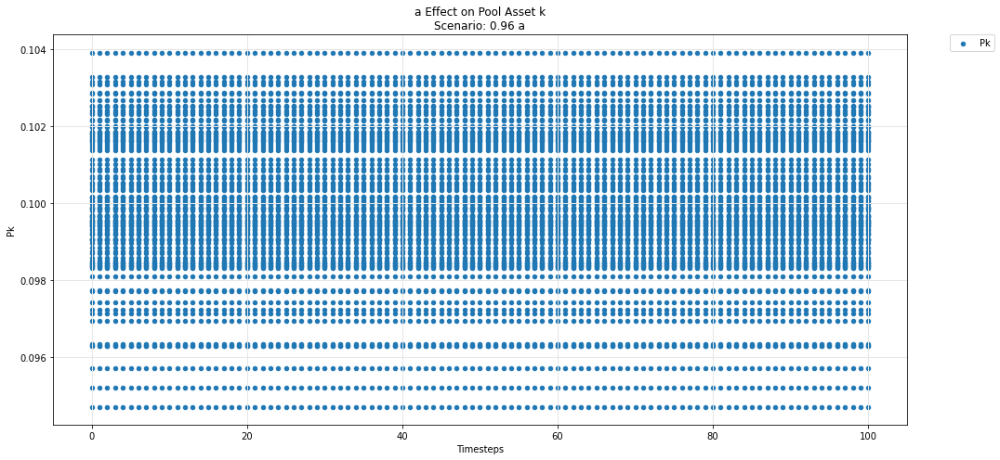

...

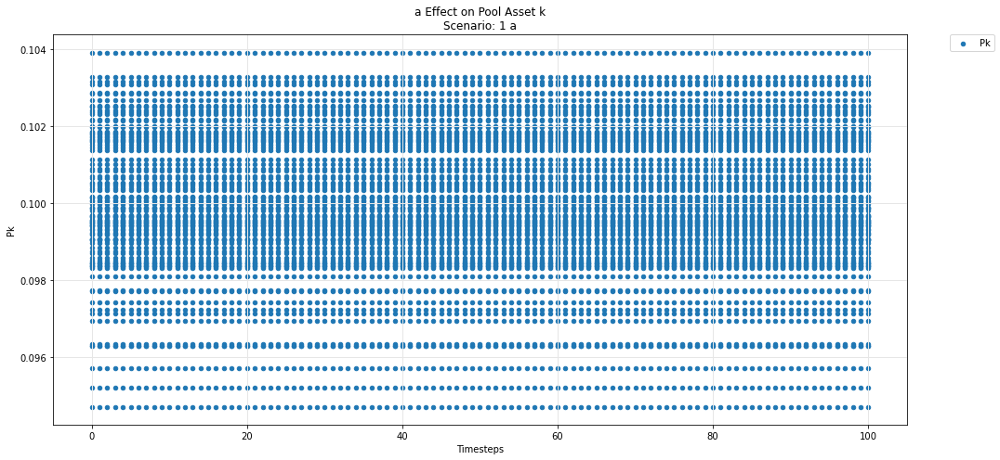

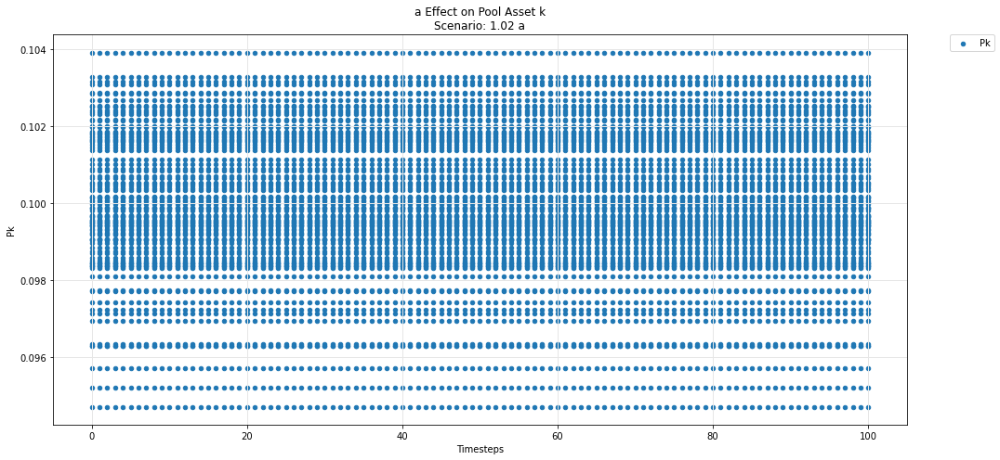

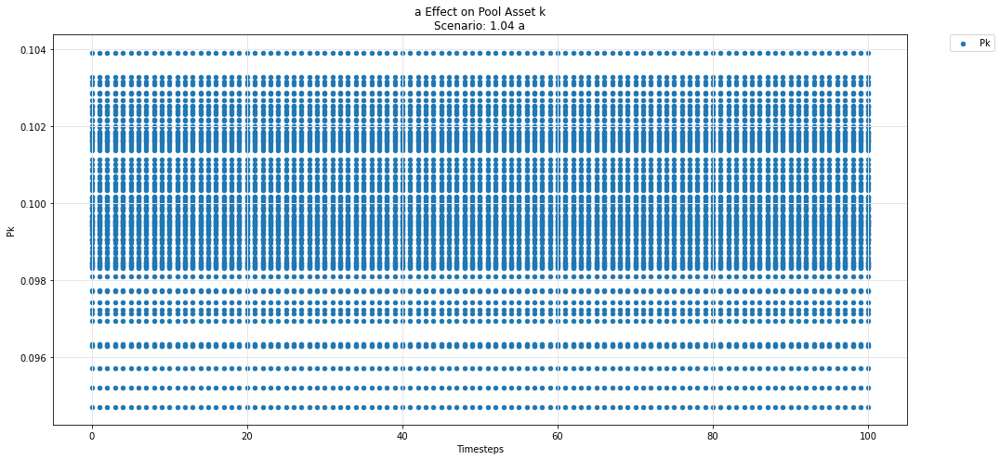

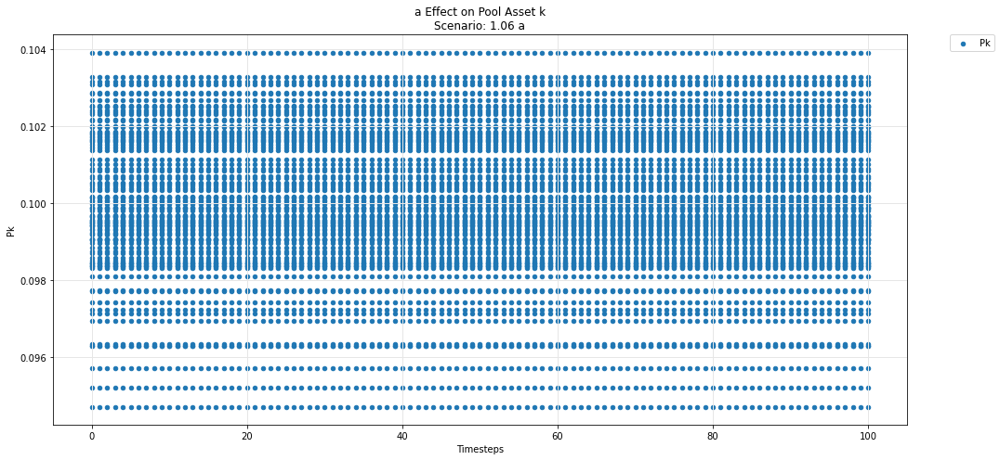

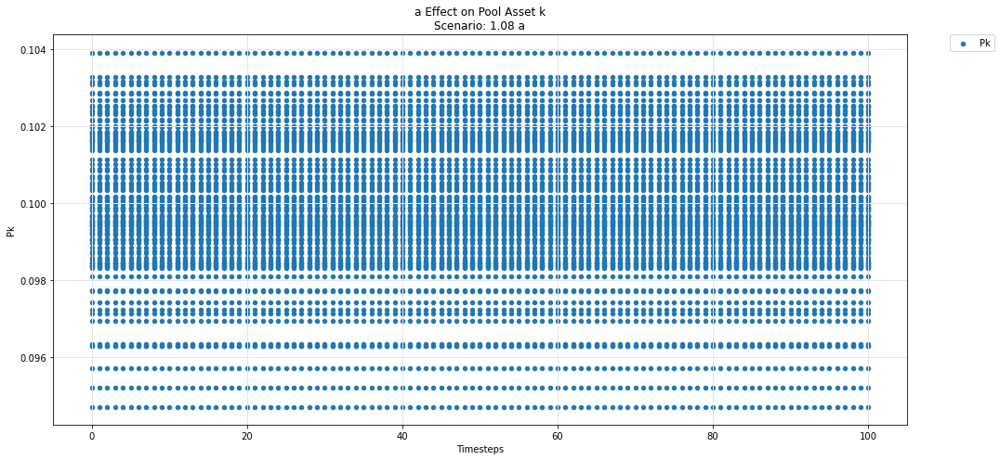

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')